### Customer LTV

* Imports

In [1]:
import numpy as np
import pandas as pd
import re

import matplotlib.pyplot as plt
import seaborn as sns


import plotly.graph_objects as go
from plotly.subplots import make_subplots

import plotly.express as px

In [56]:
from time import perf_counter 


In [82]:
import time
import concurrent.futures

* Functions

In [52]:
# cust_year_group = invoice.groupby(['Customer No.','invoice_year'])['Customer No.'].count()

def get_yearly_frequency(cust_no):
    cust_cap = cust_year_group[cust_year_group['Customer No.']==cust_no]
    minyear = cust_cap['invoice_year'].min()
    frequency = cust_cap['Frequency'].sum()
    print(minyear)
    print(frequency)
    return frequency/(2017-minyear)

In [561]:
def kms_lifetime(kms):
    try:
        kl = round(1-int(kms)/300000,3)
    except:
        kl = np.NaN
    return kl

In [562]:
def map_kms_lifetime(df):
    print('Started for :'+str(df.index)+'\n')
    df['kms_lifetime_3L'] = df['KMs_3L_cap'].map(kms_lifetime)
    print('Ended for :'+str(df.index)+'\n')

In [ ]:
def map_pcm_average(customer_no):
    temp = invoice[invoice['']==customer_no][['Customer No.', 'plant_city', 'plant_state', 'Make']]
    pcm_group

In [661]:
def map_smm_average(row):
#     print(row['Customer No.'])
    md = row['Model']
    st = row['plant_state']
    mk = row['Make']

#     return round(pcm_group[(pcm_group['plant_city']== ct)&\
#           (pcm_group['plant_state']== st)&(pcm_group['Make']== mk)]['Total Value'].iloc[0], 2)
    try:
        return round(smm_group[(smm_group['plant_state']== st)&(smm_group['Make']== mk)&(smm_group['Model']== md)]['Total Value'].iloc[0],2)
    except:
        return np.NaN

    

In [662]:
def apply_smm(df):
    print('Started for :'+str(df.index)+'\n')
    df['SMM_average'] = df[['Customer No.','plant_state','Make','Model']].apply(map_smm_average, axis=1)
    print('Ended for :'+str(df.index)+'\n')

In [701]:
def map_snmm_average(row):
#     print(row['Customer No.'])
    md = row['Model']
    st = row['state_news']
    mk = row['Make']

#     return round(pcm_group[(pcm_group['plant_city']== ct)&\
#           (pcm_group['plant_state']== st)&(pcm_group['Make']== mk)]['Total Value'].iloc[0], 2)
    try:
        return round(snmm_group[(snmm_group['state_news']== st)\
                               &(snmm_group['Make']== mk)&(snmm_group['Model']== md)]['Total Value'].iloc[0],2)
    except:
        return np.NaN

In [704]:
def apply_snmm(df):
    print('Started for :'+str(df.index)+'\n')
    df['SnMM_average'] = df[['Customer No.','state_news','Make','Model']].apply(map_snmm_average, axis=1)
    print('Ended for :'+str(df.index)+'\n')

---
* Code

In [285]:
invoice = pd.read_csv('data/invoice_refined.csv', low_memory=False)

In [286]:
invoice.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 492314 entries, 0 to 492313
Data columns (total 41 columns):
Unnamed: 0             492314 non-null int64
Area / Locality        468424 non-null object
CITY                   492313 non-null object
Cash /Cashless Type    27420 non-null object
Claim No.              4804 non-null object
Cust Type              492314 non-null object
Customer No.           492314 non-null object
District               492314 non-null object
Expiry Date            22231 non-null object
Gate Pass Date         40915 non-null object
Gate Pass Time         492314 non-null object
Invoice Date           492314 non-null object
Invoice No             492314 non-null int64
Invoice Time           492314 non-null object
Job Card No            492314 non-null int64
JobCard Date           492314 non-null object
JobCard Time           492314 non-null object
KMs Reading            492314 non-null int64
Labour Total           492314 non-null float64
Make                   

In [287]:
# inv_mnn = invoice[invoice['Model'].notnull()]

In [288]:
# invoice.shape[0]-inv_mnn.shape[0]

1525

In [382]:
inv_mnn = None

#### Columns for prediction:
* Customer No., Make, Model, Order Type, plant_city, plant_state, KMs Reading, Total Value
#### LTV calculation:
* Frequency (by years): visits/(years from first visit)
* Value (average by group):
    * 1 state, city, model
    * 2 state, city, model, make
    * 3 state, city, model, make range (scrape)
* Lifetime of vehicle ( based on KM reading) 3L max
---

In [9]:
columns_predict = ['Customer No.', 'Make', 'Model', 'Order Type', 'plant_city',
                   'plant_state', 'KMs Reading', 'Total Value']


In [603]:
# NEWS states:


In [606]:
ps_vc = invoice['plant_state'].value_counts()
ps_vc =ps_vc.rename('vc')
ps_vc  = pd.DataFrame(ps_vc)
# invoice['state_news'] 

In [607]:
ps_vc

,vc
Maharashtra,130210
Tamil Nadu,114350
Karnataka,44306
Uttar Pradesh,35971
Gujarat,25901
Telangana,25832
Punjab,23989
Andhra Pradesh,22467
Haryana,20171
Madhya Pradesh,13690


In [623]:
news_states_dict = {'North':['Uttar Pradesh', 'Punjab','Haryana', 'Himachal Pradesh', 'Uttarakhand', 'Chandigarh'],
                    'East':['West Bengal','Bihar', 'Odisha', 'Jharkhand', 'Assam','Chhattisgarh'],
                    'West':['Maharashtra','Madhya Pradesh','Gujarat','Rajasthan'],
                    'South':['Telangana', 'Andhra Pradesh', 'Tamil Nadu', 'Karnataka', 'Puducherry', 'Kerala'],
                   }

In [624]:
news_states_dict.keys()

dict_keys(['North', 'East', 'West', 'South'])

In [625]:
for i in ps_vc.index:
    for key in news_states_dict.keys():
        if i in news_states_dict[key]:
              ps_vc.at[i,'state_news'] = key

In [627]:
ps_vc

,vc,state_news
Maharashtra,130210,West
Tamil Nadu,114350,South
Karnataka,44306,South
Uttar Pradesh,35971,North
Gujarat,25901,West
Telangana,25832,South
Punjab,23989,North
Andhra Pradesh,22467,South
Haryana,20171,North
Madhya Pradesh,13690,West


In [630]:
state_map = ps_vc['state_news'].to_dict()
state_map

{'Maharashtra': 'West',
 'Tamil Nadu': 'South',
 'Karnataka': 'South',
 'Uttar Pradesh': 'North',
 'Gujarat': 'West',
 'Telangana': 'South',
 'Punjab': 'North',
 'Andhra Pradesh': 'South',
 'Haryana': 'North',
 'Madhya Pradesh': 'West',
 'Rajasthan': 'West',
 'Kerala': 'South',
 'Himachal Pradesh': 'North',
 'Bihar': 'East',
 'Uttarakhand': 'North',
 'Odisha': 'East',
 'Puducherry': 'South',
 'West Bengal': 'East',
 'Chhattisgarh': 'East',
 'Jharkhand': 'East',
 'Assam': 'East',
 'Chandigarh': 'North'}

In [633]:
# pd.DataFrame(ps_vc['state_news']).to_csv('data/state_map.csv')

In [634]:
invoice['state_news'] = invoice['plant_state'].map(state_map)

In [637]:
invoice['state_news'].value_counts(dropna=False)

South    214484
West     183147
North     86793
East       7890
Name: state_news, dtype: int64

---

In [585]:
# Grouping of TV by colums:

In [16]:
pcm_group = invoice.groupby(['plant_city', 'plant_state', 'Make'])['Total Value'].mean()
pcm_group = pcm_group.reset_index()

In [20]:
# pcm_group

In [18]:
pcmm_group = invoice.groupby(['plant_city', 'plant_state', 'Make', 'Model'])['Total Value'].mean()
pcmm_group = pcmm_group.reset_index()

In [21]:
# pcmm_group

In [289]:
smm_group = invoice.groupby(['plant_state', 'Make', 'Model'])['Total Value'].mean()
smm_group = smm_group.reset_index()

In [584]:
# smm_group.head()


In [595]:
smmo_group = invoice.groupby(['plant_state','Order Type','Model', 'Make'])['Total Value'].mean()
smmo_group = smmo_group.reset_index()

In [596]:
smmo_group.head()

,plant_state,Order Type,Model,Make,Total Value
0,Andhra Pradesh,Accidental,800,MARUTI SUZUKI,6826.102500
1,Andhra Pradesh,Accidental,A STAR,MARUTI SUZUKI,9181.300000
2,Andhra Pradesh,Accidental,A6,AUDI,0.000000
3,Andhra Pradesh,Accidental,ACCENT,HYUNDAI,5962.820833
4,Andhra Pradesh,Accidental,ACCORD,HONDA,4926.035000


In [598]:
smo_group = invoice.groupby(['plant_state','Order Type', 'Make'])['Total Value'].mean()
smo_group = smo_group.reset_index()

In [599]:
smo_group.head()

,plant_state,Order Type,Make,Total Value
0,Andhra Pradesh,Accidental,AUDI,0.000000
1,Andhra Pradesh,Accidental,DAEWOO,11427.905000
2,Andhra Pradesh,Accidental,FIAT,7902.138286
3,Andhra Pradesh,Accidental,FORD,8411.131667
4,Andhra Pradesh,Accidental,GENERAL MOTORS,12328.244194


In [654]:
snmm_group = invoice.groupby(['state_news','Model', 'Make'])['Total Value'].mean()
snmm_group = snmm_group.reset_index()

In [706]:
snmm_group.head(10)

,state_news,Model,Make,Total Value
0,East,207,TATA MOTORS,0.000000
1,East,500,FIAT,0.000000
2,East,800,MARUTI SUZUKI,35.041074
3,East,A STAR,MARUTI SUZUKI,23.630588
4,East,A4,AUDI,0.000000
5,East,ACCENT,HYUNDAI,166.230000
6,East,ACCORD,HONDA,0.000000
7,East,ACE,TATA MOTORS,0.000000
8,East,ALTO,MARUTI SUZUKI,25.380741
9,East,AMAZE,HONDA,407.355957


---

In [22]:
invoice.invoice_year.value_counts()

2016    197286
2015    124719
2014     95617
2013     56057
2012     18635
Name: invoice_year, dtype: int64

In [24]:
2017-2012

5

In [38]:
cust_year_group = invoice.groupby(['Customer No.','invoice_year'])['Customer No.'].count()
cust_year_group.rename('Frequency', inplace=True)
cust_year_group = cust_year_group.reset_index()

In [39]:
cust_year_group

,Customer No.,invoice_year,Frequency
0,1,2012,3
1,1,2013,1
2,10,2012,3
3,10,2013,2
4,100,2012,2
5,1000,2012,2
6,1000,2013,2
7,1000,2014,2
8,10000,2013,3
9,10000,2014,3


In [44]:
cust_cap = cust_year_group[cust_year_group['Customer No.']=='1']
print(cust_cap)
print(cust_cap['invoice_year'].min())
print(cust_cap['Frequency'].sum())

  Customer No.  invoice_year  Frequency
0            1          2012          3
1            1          2013          1
2012
4


In [46]:
# invoice.groupby(['Customer No.'])['Customer No.'].count()

In [47]:
invoice['Customer No.'] = invoice['Customer No.'].astype(str)

In [55]:
invoice['Frequency_year'] = invoice['Customer No.'].map(get_yearly_frequency)

2014
5
2015
6
2014
3
2015
6
2013
8
2015
3
2013
7
2014
4
2015
3
2015
3
2014
4
2012
14
2012
14
2013
8
2015
1
2014
8
2015
7
2014
2
2012
13
2015
1
2012
8
2013
10
2013
2
2015
1
2012
13
2014
3
2014
2
2015
1
2015
2
2015
1
2015
1
2015
2
2013
15
2014
9
2014
4
2014
3
2014
9
2012
6
2015
2
2014
2
2014
3
2015
6
2012
7
2015
1
2015
1
2015
2
2013
5
2014
8
2012
7
2014
6
2015
4
2015
1
2012
12
2015
3
2012
28
2014
7
2015
4
2015
12
2015
1
2012
12
2012
12
2013
7
2015
4
2014
4
2015
2
2015
3
2015
3
2015
2
2015
1
2015
3
2012
28
2012
28
2015
1
2012
3
2015
2
2015
4
2013
9
2013
3
2013
6
2013
39
2014
7
2015
2
2015
1
2014
5
2014
5
2014
7
2015
2
2013
5
2015
4
2014
2
2015
2
2015
4
2015
4
2013
19
2015
1
2015
4
2012
11
2015
4
2013
17
2014
2
2012
11
2015
1
2014
5
2012
19
2012
19
2012
11
2012
15
2012
15
2015
3
2014
4
2015
3
2014
3
2014
15
2015
1
2015
1
2015
3
2013
3
2015
4
2013
3
2013
3
2014
2
2012
6
2015
3
2015
3
2014
5
2014
4
2012
20
2014
11
2014
6
2014
8
2015
4
2015
1
2012
9
2015
2
2015
1
2014
10
2013
10
2015
4
2013
6

2012
5
2012
4
2012
7
2015
1
2015
3
2014
4
2014
3
2014
8
2014
3
2015
1
2012
6
2013
441
2013
4
2014
10
2012
12
2015
1
2015
1
2014
3
2013
2
2015
1
2012
16
2012
16
2013
441
2015
1
2014
4
2014
5
2013
26
2015
2
2014
14
2015
1
2013
5
2015
1
2012
2
2015
2
2015
1
2015
3
2015
2
2014
5
2014
3
2015
1
2015
1
2013
6
2013
7
2014
10
2014
3
2013
5
2013
3
2015
1
2015
3
2013
5
2014
2
2012
6
2013
6
2013
2
2014
2
2014
4
2014
7
2014
2
2015
2
2014
4
2014
7
2014
7
2015
3
2015
1
2014
4
2015
1
2014
2
2014
3
2013
2
2015
1
2013
4
2012
28
2012
7
2015
4
2014
2
2014
2
2014
2
2015
4
2012
2
2013
2
2015
1
2014
4
2015
2
2014
4
2013
25
2014
3
2014
5
2012
5
2013
25
2015
1
2013
5
2013
5
2014
4
2015
1
2013
8
2013
4
2015
3
2014
3
2015
1
2015
3
2014
4
2015
2
2013
441
2015
2
2014
3
2012
7
2013
441
2015
2
2015
2
2015
1
2015
4
2012
4
2014
8
2015
4
2014
3
2013
5
2014
3
2013
5
2015
1
2012
8
2015
1
2013
11
2015
4
2015
3
2013
4
2015
5
2013
4
2013
7
2014
10
2012
9
2014
5
2015
5
2015
3
2014
2
2015
2
2014
5
2014
2
2015
1
2015
1
2014
4


2015
2
2015
1
2014
4
2015
2
2015
2
2012
11
2015
1
2013
6
2015
6
2015
1
2014
3
2015
1
2013
10
2013
19
2014
2
2014
2
2015
1
2015
1
2015
1
2013
6
2015
1
2015
1
2015
1
2015
1
2014
7
2015
1
2015
1
2015
1
2013
18
2015
2
2014
6
2014
9
2013
8
2014
2
2014
6
2014
16
2014
5
2015
2
2015
1
2015
1
2014
5
2014
4
2014
3
2015
1
2014
5
2015
4
2013
4
2015
1
2015
1
2015
1
2015
3
2014
4
2015
1
2014
4
2013
6
2015
2
2014
3
2015
1
2015
3
2013
3
2013
4
2013
6
2015
2
2015
4
2015
1
2015
1
2014
3
2013
10
2013
6
2014
3
2014
4
2015
1
2014
2
2015
1
2013
11
2014
2
2013
5
2015
4
2015
1
2015
3
2013
8
2014
3
2014
3
2015
2
2015
3
2014
3
2014
5
2015
2
2014
8
2015
2
2015
2
2014
2
2013
6
2013
2
2015
1
2014
3
2014
3
2014
2
2015
1
2015
2
2015
1
2013
8
2015
1
2014
2
2014
8
2014
6
2013
4
2013
2
2013
9
2013
8
2014
9
2013
12
2015
3
2014
9
2015
1
2015
1
2014
3
2015
2
2013
10
2014
18
2015
2
2015
1
2014
4
2015
1
2015
1
2014
12
2014
12
2014
2
2015
1
2013
7
2015
2
2015
5
2015
1
2014
5
2013
11
2013
4
2015
4
2015
1
2014
2
2014
2
2014
3


2015
3
2014
2
2013
7
2014
31
2015
2
2014
3
2014
10
2015
1
2015
1
2013
3
2015
1
2015
1
2014
2
2013
3
2015
2
2015
4
2013
9
2014
6
2014
11
2012
4
2015
4
2014
5
2015
1
2014
3
2015
1
2014
4
2013
11
2013
6
2013
4
2014
5
2015
1
2014
6
2013
11
2013
6
2014
31
2013
9
2013
2
2014
4
2014
3
2013
8
2014
2
2015
2
2015
1
2014
5
2015
2
2014
8
2015
1
2014
8
2014
5
2013
7
2014
4
2015
1
2013
8
2015
1
2014
6
2015
1
2015
1
2013
2
2015
1
2013
5
2013
5
2013
7
2014
6
2013
2
2013
17
2013
7
2013
7
2015
1
2014
4
2014
2
2015
4
2015
4
2015
4
2015
1
2014
7
2014
5
2013
5
2014
31
2014
3
2014
31
2013
14
2014
31
2014
14
2015
5
2013
8
2015
1
2015
1
2015
1
2013
5
2015
1
2015
2
2014
2
2014
2
2014
7
2014
5
2013
6
2015
2
2014
6
2014
6
2013
15
2014
4
2014
7
2014
7
2013
7
2015
4
2015
4
2015
4
2015
1
2015
2
2013
2
2013
4
2015
1
2015
1
2014
5
2015
1
2014
14
2014
31
2015
1
2014
6
2014
4
2015
4
2013
6
2014
4
2014
9
2015
1
2013
2
2015
4
2015
1
2014
9
2015
4
2013
22
2013
5
2015
2
2015
2
2014
5
2013
8
2014
5
2013
5
2015
1
2013
8
2015

2015
2
2014
10
2015
1
2015
1
2015
1
2015
3
2015
2
2015
1
2015
1
2015
1
2015
3
2015
3
2014
5
2014
5
2014
2
2014
15
2014
5
2014
5
2015
1
2014
7
2014
7
2014
7
2014
3
2014
12
2015
2
2014
2
2015
1
2015
1
2014
3
2015
4
2015
2
2015
2
2015
4
2015
4
2014
2
2015
1
2015
4
2015
4
2014
4
2014
4
2015
3
2015
1
2015
3
2015
3
2014
7
2014
3
2014
7
2014
7
2015
1
2014
5
2014
5
2015
1
2014
7
2013
11
2013
11
2014
6
2014
7
2014
7
2014
9
2014
7
2014
7
2014
6
2015
2
2014
9
2014
4
2014
11
2015
2
2013
6
2015
1
2013
6
2015
1
2014
2
2014
13
2015
2
2014
11
2014
11
2014
13
2014
13
2015
1
2015
1
2015
2
2015
1
2013
3
2015
4
2015
4
2014
3
2015
1
2014
7
2014
9
2015
1
2014
7
2015
1
2014
3
2014
10
2015
2
2015
2
2015
2
2015
2
2014
7
2015
3
2014
7
2015
1
2015
3
2015
1
2015
2
2015
4
2015
4
2014
4
2014
8
2014
2
2015
2
2014
3
2014
14
2014
14
2015
1
2013
10
2014
4
2013
37
2014
2
2015
1
2014
7
2015
1
2015
3
2015
2
2014
4
2015
1
2015
1
2015
1
2015
5
2014
7
2015
1
2014
4
2014
4
2014
6
2015
3
2015
1
2014
2
2014
11
2014
11
2015
3
20

2015
3
2015
3
2014
4
2015
1
2015
1
2014
5
2015
1
2014
5
2014
17
2014
688
2014
688
2014
688
2014
7
2015
3
2015
1
2014
7
2014
7
2014
8
2015
6
2014
6
2014
3
2014
2
2014
5
2014
3
2015
3
2014
688
2014
9
2015
1
2015
1
2015
1
2014
10
2014
18
2014
15
2015
1
2014
13
2015
1
2014
688
2014
688
2015
3
2014
5
2014
2
2015
1
2014
8
2015
1
2014
3
2015
5
2014
6
2014
18
2014
688
2014
688
2014
6
2014
6
2014
4
2015
3
2014
5
2015
1
2014
5
2014
4
2015
3
2014
2
2015
1
2014
12
2014
8
2015
1
2015
2
2014
3
2014
688
2014
688
2014
688
2014
688
2015
2
2014
3
2014
688
2014
688
2015
1
2014
5
2014
5
2014
688
2014
688
2014
688
2015
1
2015
5
2014
7
2014
12
2014
688
2015
1
2014
21
2015
2
2014
10
2015
2
2015
1
2015
2
2015
2
2014
688
2014
13
2015
1
2014
688
2015
2
2014
18
2014
9
2014
9
2014
14
2015
4
2013
6
2014
688
2014
688
2014
688
2014
6
2015
1
2015
1
2015
1
2015
3
2015
1
2015
3
2015
1
2015
3
2014
4
2014
10
2015
2
2014
9
2015
1
2015
2
2015
1
2014
2
2014
4
2015
3
2014
2
2014
19
2014
19
2014
6
2014
688
2015
7
2014
18
2014

2015
2
2015
5
2015
1
2015
2
2015
1
2015
3
2015
2
2015
2
2015
4
2015
1
2015
3
2015
2
2014
6
2015
1
2014
4
2015
2
2014
15
2015
3
2015
1
2015
3
2015
1
2015
8
2015
2
2015
4
2014
15
2015
1
2015
7
2015
1
2015
15
2015
5
2015
5
2015
2
2015
9
2015
1
2015
1
2014
7
2015
3
2015
2
2015
5
2015
16
2014
3
2015
1
2015
3
2015
1
2015
1
2014
9
2014
4
2015
1
2015
4
2015
1
2015
1
2014
4
2015
1
2015
1
2014
5
2015
1
2015
2
2015
5
2015
1
2014
8
2015
1
2015
1
2015
1
2015
1
2014
6
2015
1
2015
1
2015
1
2015
3
2015
1
2015
2
2014
19
2015
3
2014
10
2015
2
2015
5
2015
1
2015
2
2015
3
2014
2
2015
1
2014
7
2015
2
2015
1
2014
7
2015
1
2014
12
2015
2
2015
1
2015
2
2015
2
2015
1
2014
3
2014
2
2014
4
2015
2
2014
8
2015
2
2015
2
2015
4
2014
5
2015
1
2015
2
2015
1
2015
1
2015
1
2014
9
2015
4
2015
3
2015
1
2015
1
2015
4
2015
1
2015
1
2015
3
2014
2
2014
10
2015
1
2015
1
2014
6
2015
1
2015
1
2012
2
2015
5
2014
4
2014
5
2015
1
2015
3
2014
2
2015
1
2014
2
2015
3
2015
2
2015
1
2012
6
2014
8
2014
6
2015
1
2015
2
2015
2
2015
2
2015


2015
1
2015
4
2014
4
2014
19
2015
1
2015
12
2014
3
2014
8
2014
13
2015
1
2015
4
2015
1
2015
1
2014
15
2015
2
2014
26
2014
3
2015
2
2015
1
2015
11
2014
7
2014
13
2015
1
2015
1
2015
1
2015
7
2015
2
2015
33
2014
6
2014
5
2015
2
2014
38
2015
4
2015
1
2014
30
2015
1
2015
2
2015
1
2015
1
2015
6
2014
10
2015
8
2015
4
2014
2
2014
30
2014
3
2015
1
2014
22
2014
51
2015
3
2015
3
2014
26
2015
1
2015
5
2015
1
2014
5
2015
7
2015
1
2014
3
2014
20
2015
5
2014
2
2015
1
2014
5
2014
15
2014
2
2015
1
2015
2
2015
3
2014
3
2014
10
2014
23
2014
12
2015
6
2015
1
2015
1
2015
12
2014
40
2015
3
2015
1
2015
33
2014
51
2015
1
2014
5
2015
3
2014
4
2015
3
2014
26
2015
26
2014
3
2014
30
2015
1
2014
16
2014
20
2014
6
2014
3
2014
26
2015
1
2014
3
2015
1
2015
1
2015
1
2014
3
2015
1
2015
6
2015
3
2015
2
2014
11
2014
3
2015
11
2015
1
2015
1
2015
1
2015
1
2015
4
2015
1
2015
4
2015
3
2015
1
2015
4
2014
2
2015
18
2015
2
2015
2
2015
1
2014
3
2014
36
2015
7
2015
6
2015
1
2014
38
2015
1
2015
9
2014
2
2015
2
2014
5
2015
2
2015
1

2012
11
2013
3
2012
8
2014
6
2015
2
2015
3
2015
1
2012
6
2015
2
2012
6
2012
10
2015
2
2013
10
2014
4
2012
18
2012
8
2015
1
2015
3
2013
14
2013
4
2013
14
2014
6
2015
1
2014
4
2012
6
2013
12
2015
1
2012
13
2015
1
2015
3
2012
7
2015
1
2015
6
2015
1
2015
2
2013
6
2013
5
2015
3
2015
2
2015
1
2015
1
2013
4
2015
2
2013
7
2013
3
2013
4
2012
10
2012
11
2015
1
2015
1
2015
2
2014
4
2013
11
2013
4
2015
3
2013
4
2015
2
2012
22
2015
3
2015
1
2015
1
2013
15
2012
12
2012
42
2015
3
2013
2
2015
3
2015
1
2015
3
2013
14
2015
4
2014
4
2012
8
2013
2
2012
18
2013
4
2015
1
2015
1
2015
1
2013
3
2015
1
2014
8
2012
12
2015
6
2012
5
2013
7
2013
2
2012
8
2013
7
2012
13
2015
2
2015
3
2012
4
2015
2
2013
5
2013
4
2015
1
2012
9
2013
6
2012
6
2015
6
2015
1
2014
10
2014
3
2013
3
2013
5
2013
3
2015
1
2014
8
2014
9
2014
2
2015
1
2013
6
2014
6
2015
1
2013
8
2015
1
2015
7
2015
1
2013
6
2012
7
2015
3
2013
5
2015
4
2013
3
2015
3
2015
4
2012
3
2015
1
2013
5
2013
2
2013
8
2015
3
2012
12
2012
16
2015
1
2013
8
2015
7
2015
7
2015


2013
3
2015
11
2015
1
2015
3
2015
2
2013
16
2015
1
2015
3
2015
1
2015
1
2014
4
2013
13
2014
12
2014
6
2014
8
2013
9
2013
3
2015
1
2015
1
2015
1
2015
4
2015
1
2015
1
2014
11
2013
11
2015
1
2015
5
2015
8
2015
2
2015
1
2014
2
2015
2
2013
4
2012
14
2015
1
2015
1
2014
5
2015
4
2014
3
2014
15
2015
2
2014
6
2013
10
2014
3
2014
21
2013
13
2014
2
2013
8
2014
15
2013
13
2013
7
2014
3
2015
8
2014
7
2015
3
2015
1
2015
1
2015
1
2014
2
2013
7
2014
9
2015
3
2014
6
2015
2
2015
1
2014
9
2015
1
2013
7
2014
5
2015
2
2015
1
2014
10
2014
6
2015
1
2015
3
2015
1
2015
1
2014
5
2013
2
2015
5
2015
1
2014
5
2013
7
2015
3
2013
14
2014
2
2015
1
2015
1
2015
1
2013
10
2015
1
2013
2
2015
1
2013
8
2014
2
2015
1
2013
6
2015
2
2014
2
2013
3
2015
1
2014
5
2014
2
2015
2
2014
4
2015
1
2015
1
2013
21
2015
1
2014
5
2015
2
2015
3
2014
2
2014
8
2014
6
2015
1
2015
1
2015
1
2014
8
2015
1
2015
1
2014
7
2015
1
2015
1
2015
3
2015
6
2015
1
2015
1
2015
1
2015
1
2015
1
2013
6
2015
2
2014
5
2014
3
2015
2
2015
1
2014
4
2014
4
2015
1
201

2015
1
2015
1
2015
1
2015
1
2015
1
2014
3
2015
1
2015
5
2013
8
2014
3
2015
2
2014
4
2015
1
2014
2
2015
5
2015
1
2014
3
2015
1
2015
1
2015
5
2015
1
2014
4
2013
10
2015
1
2015
4
2014
5
2014
2
2015
1
2014
2
2015
1
2015
1
2014
3
2015
1
2014
3
2015
2
2015
1
2015
1
2015
1
2015
1
2014
3
2015
1
2015
1
2015
1
2015
1
2015
3
2013
3
2014
3
2014
6
2015
6
2015
3
2015
1
2015
3
2015
1
2015
1
2013
21
2014
2
2014
2
2014
9
2015
1
2015
2
2015
1
2015
1
2014
2
2015
1
2013
17
2015
1
2013
6
2015
1
2014
5
2014
3
2015
2
2015
1
2014
27
2015
1
2014
2
2015
1
2014
4
2015
1
2015
2
2015
1
2015
5
2014
16
2015
5
2015
1
2015
1
2015
1
2015
1
2015
1
2014
4
2014
7
2015
2
2014
5
2014
7
2013
10
2014
5
2015
1
2013
10
2015
1
2014
8
2014
4
2015
1
2015
2
2014
2
2015
1
2013
6
2015
2
2015
1
2015
3
2015
1
2015
1
2015
1
2015
2
2015
1
2015
1
2014
6
2015
1
2013
12
2015
1
2015
8
2015
2
2015
1
2015
1
2014
2
2015
2
2015
1
2015
4
2015
4
2014
5
2015
3
2015
1
2014
15
2015
4
2015
1
2015
3
2015
1
2014
3
2014
2
2015
6
2015
1
2014
2
2015
2
2015

2015
3
2015
1
2014
8
2014
3
2015
5
2013
28
2013
28
2013
28
2014
7
2014
5
2014
6
2013
17
2014
6
2013
9
2015
1
2014
7
2014
5
2014
6
2013
4
2014
15
2014
15
2013
17
2014
8
2014
5
2014
7
2014
6
2015
2
2015
2
2015
2
2013
5
2014
15
2015
2
2015
2
2015
3
2014
9
2014
6
2014
15
2015
5
2014
4
2014
7
2014
5
2014
15
2014
2
2015
6
2015
1
2013
6
2015
7
2014
15
2015
3
2014
13
2015
3
2014
12
2014
5
2014
6
2015
7
2015
7
2015
7
2014
17
2014
17
2015
1
2014
12
2014
12
2015
1
2014
5
2014
4
2015
7
2014
2
2015
1
2015
1
2014
9
2015
2
2015
2
2014
6
2014
3
2014
12
2015
2
2015
1
2015
1
2015
1
2013
5
2014
6
2014
12
2015
6
2014
6
2014
10
2014
10
2014
9
2014
9
2015
3
2015
1
2015
2
2014
6
2014
11
2014
13
2015
1
2014
13
2014
19
2015
5
2014
13
2015
1
2015
5
2014
10
2014
12
2014
4
2014
11
2014
12
2014
4
2014
9
2015
3
2015
3
2015
3
2014
8
2015
2
2013
4
2015
3
2013
14
2015
5
2014
10
2015
1
2014
12
2014
10
2014
10
2014
2
2014
5
2014
6
2015
2
2015
1
2013
2
2014
68
2014
6
2015
2
2014
2
2015
1
2014
4
2015
2
2014
12
2014
8
2014

2015
1
2015
1
2015
1
2015
1
2015
3
2014
2
2015
2
2014
2
2015
1
2015
1
2015
4
2015
1
2015
3
2015
2
2015
1
2015
3
2015
4
2015
2
2015
2
2015
2
2015
4
2015
1
2015
3
2015
3
2014
9
2015
3
2015
1
2015
1
2015
1
2014
8
2014
5
2015
2
2014
6
2015
1
2015
2
2015
2
2015
1
2015
1
2014
6
2015
2
2014
2
2014
6
2015
1
2014
2
2015
1
2014
8
2014
4
2014
7
2014
9
2015
3
2015
7
2015
1
2014
8
2015
1
2015
4
2015
4
2015
3
2015
2
2014
6
2015
1
2015
4
2015
4
2015
1
2015
4
2015
4
2015
1
2015
1
2015
4
2015
1
2015
6
2014
11
2015
1
2015
7
2015
7
2015
7
2015
1
2015
1
2014
3
2015
7
2015
1
2014
10
2015
2
2015
1
2015
2
2015
1
2015
2
2014
4
2015
4
2015
3
2015
2
2015
1
2014
6
2015
2
2014
20
2014
7
2014
4
2015
4
2015
4
2015
1
2014
4
2015
1
2014
7
2014
3
2015
2
2014
9
2015
1
2015
3
2015
5
2015
2
2015
4
2014
4
2015
4
2014
23
2015
1
2015
1
2015
2
2014
4
2015
1
2015
1
2015
4
2015
3
2014
7
2015
1
2015
5
2012
251
2012
251
2014
7
2012
251
2015
4
2015
4
2015
1
2015
2
2015
1
2015
1
2015
1
2015
4
2014
8
2012
251
2015
4
2012
251
2014
2

2015
1
2015
1
2015
1
2015
1
2015
1
2015
16
2015
2
2015
3
2015
2
2015
1
2015
2
2015
2
2015
3
2015
9
2015
6
2015
1
2015
2
2015
6
2015
1
2015
1
2015
2
2015
1
2015
5
2015
2
2015
1
2015
3
2015
1
2015
1
2015
2
2015
1
2015
1
2015
1
2015
1
2015
2
2015
1
2015
2
2015
1
2015
1
2015
1
2015
2
2015
1
2015
5
2015
1
2015
1
2015
3
2015
5
2015
2
2015
8
2015
1
2015
1
2015
2
2015
2
2015
2
2015
2
2015
1
2015
8
2015
4
2015
3
2015
5
2015
1
2015
1
2015
2
2015
2
2015
1
2015
9
2015
1
2015
2
2015
4
2015
1
2015
3
2015
10
2015
7
2015
9
2015
1
2015
1
2015
1
2015
9
2015
11
2014
7
2015
2
2015
1
2015
4
2015
15
2015
1
2015
6
2015
1
2015
1
2015
1
2015
1
2015
2
2015
7
2015
1
2015
4
2015
5
2015
1
2014
2
2014
3
2015
7
2015
4
2015
1
2015
7
2015
1
2015
5
2015
4
2015
1
2015
1
2015
1
2015
5
2015
3
2015
5
2015
2
2015
1
2014
8
2015
1
2014
5
2015
1
2014
4
2015
1
2014
22
2015
1
2014
9
2015
2
2014
6
2014
8
2015
2
2014
2
2015
1
2015
9
2015
1
2015
1
2014
5
2014
6
2015
2
2015
1
2014
4
2015
2
2014
7
2015
1
2014
4
2015
1
2015
4
2014
6
2

2015
2
2015
1
2015
1
2015
3
2015
1
2015
1
2015
1
2015
2
2015
2
2015
1
2015
3
2015
1
2015
2
2015
5
2015
1
2015
3
2015
1
2014
11
2015
1
2015
2
2015
8
2015
3
2015
1
2015
9
2015
12
2015
2
2015
19
2015
1
2015
1
2015
2
2015
3
2015
3
2015
1
2015
2
2014
4
2015
2
2015
2
2015
2
2015
1
2015
2
2015
1
2015
2
2015
4
2015
1
2015
2
2015
1
2015
8
2015
2
2015
3
2015
2
2015
6
2015
4
2015
1
2015
2
2015
4
2015
8
2014
3
2015
4
2014
9
2015
1
2015
4
2015
1
2015
2
2015
1
2015
2
2015
1
2015
1
2015
1
2015
1
2015
3
2015
1
2015
2
2015
1
2015
4
2015
8
2015
3
2015
2
2015
3
2015
1
2015
1
2015
1
2015
8
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
3
2015
3
2015
8
2015
1
2015
2
2014
2
2015
10
2015
2
2014
8
2015
2
2015
1
2015
2
2015
1
2015
4
2015
3
2014
2
2014
7
2015
4
2015
1
2015
2
2015
4
2014
8
2014
12
2015
2
2015
1
2014
23
2015
7
2014
26
2015
2
2015
1
2015
3
2014
23
2015
28
2014
26
2015
1
2015
10
2015
1
2015
33
2015
5
2014
4
2015
2
2015
2
2015
6
2014
20
2015
1
2014
6
2015
17
2015
1
2015
5
2015
3
2014
3
2014
4

2015
7
2013
15
2015
5
2015
5
2014
5
2015
1
2015
5
2015
5
2015
1
2013
2
2015
3
2013
6
2013
15
2014
4
2014
4
2014
3
2014
2
2014
4
2015
1
2015
4
2015
4
2015
4
2014
6
2015
5
2013
11
2012
22
2015
2
2013
4
2015
1
2014
8
2013
5
2014
5
2015
2
2015
3
2015
2
2012
9
2014
5
2014
3
2012
12
2015
6
2015
1
2012
5
2012
12
2015
1
2012
5
2014
5
2013
4
2012
5
2013
28
2013
7
2015
2
2013
7
2015
1
2014
9
2012
11
2015
4
2013
6
2013
5
2012
22
2013
5
2013
7
2015
1
2014
10
2014
4
2014
3
2015
1
2013
4
2014
5
2014
5
2015
1
2015
3
2012
8
2015
2
2012
7
2015
1
2015
1
2012
5
2012
11
2015
5
2015
1
2014
5
2015
1
2013
5
2014
4
2015
1
2015
1
2013
21
2013
8
2013
9
2015
1
2015
1
2014
3
2014
3
2012
17
2013
17
2012
78
2015
3
2015
4
2012
2
2015
1
2012
14
2012
7
2015
1
2013
6
2014
5
2012
53
2012
15
2013
5
2012
10
2012
7
2014
12
2014
3
2014
6
2015
1
2012
7
2015
4
2013
5
2014
7
2012
9
2013
5
2015
2
2012
4
2012
9
2014
3
2012
24
2015
1
2012
9
2014
3
2013
4
2012
18
2015
1
2013
3
2013
5
2013
5
2013
10
2015
1
2012
10
2012
5
2012
7
201

2015
2
2013
3
2013
2
2014
2
2014
99
2014
3
2014
7
2015
3
2014
11
2014
5
2015
32
2012
14
2015
1
2014
2
2015
1
2015
6
2013
10
2015
5
2015
2
2015
32
2015
1
2015
1
2015
5
2015
5
2014
2
2015
1
2015
2
2015
1
2015
2
2014
2
2012
2
2013
6
2015
6
2015
5
2014
10
2013
4
2013
9
2015
1
2015
1
2015
1
2013
5
2013
10
2013
6
2012
6
2012
6
2014
3
2015
4
2015
1
2014
4
2014
8
2014
9
2014
8
2015
3
2013
10
2012
19
2014
4
2015
1
2014
3
2014
4
2015
1
2013
8
2014
8
2014
8
2015
1
2015
1
2015
3
2015
3
2015
4
2013
20
2013
7
2014
3
2015
1
2012
20
2013
2
2015
2
2015
32
2015
1
2015
1
2015
5
2015
1
2015
1
2015
2
2014
8
2014
8
2013
10
2015
1
2015
1
2014
4
2014
8
2014
8
2014
2
2012
12
2012
12
2013
22
2015
32
2014
2
2015
5
2015
5
2015
1
2015
4
2015
1
2014
99
2015
1
2013
7
2015
1
2014
8
2014
8
2012
7
2014
6
2014
6
2014
12
2014
8
2015
2
2013
4
2013
7
2014
3
2014
2
2013
7
2015
4
2014
3
2015
2
2014
12
2015
32
2015
8
2012
25
2014
7
2014
8
2015
1
2013
9
2014
5
2012
25
2013
22
2014
11
2015
32
2014
7
2014
7
2015
32
2013
22
2013


2015
2
2015
2
2015
1
2015
1
2014
4
2014
5
2013
16
2015
1
2014
4
2013
3
2013
6
2013
21
2013
3
2015
1
2015
4
2013
5
2015
1
2013
2
2015
3
2014
7
2013
15
2015
2
2015
3
2015
2
2013
11
2014
12
2013
6
2013
3
2015
1
2015
3
2015
2
2015
2
2014
3
2014
3
2015
2
2015
1
2015
2
2014
4
2013
10
2015
1
2013
17
2014
28
2014
4
2015
2
2013
2
2015
9
2014
4
2013
10
2013
3
2015
1
2014
20
2015
1
2015
4
2014
5
2015
1
2013
10
2015
1
2014
3
2013
10
2015
1
2015
1
2015
2
2014
6
2015
3
2013
13
2014
6
2013
11
2015
1
2014
2
2013
10
2015
1
2013
20
2014
12
2015
3
2015
1
2015
1
2014
3
2014
4
2015
1
2014
4
2015
1
2013
9
2015
1
2015
3
2013
5
2014
2
2015
1
2015
1
2015
1
2014
2
2015
1
2014
3
2015
2
2014
5
2014
2
2014
9
2013
5
2014
4
2015
3
2014
5
2014
10
2015
2
2013
4
2015
3
2013
3
2013
21
2014
4
2015
2
2014
28
2014
3
2015
1
2014
28
2014
4
2015
1
2015
1
2015
1
2013
3
2015
1
2013
6
2013
3
2013
6
2015
1
2014
3
2015
2
2014
7
2013
26
2015
9
2014
14
2014
4
2013
26
2014
14
2015
1
2015
1
2015
1
2013
26
2015
2
2015
7
2013
13
2014
4


2015
5
2015
3
2015
1
2014
3
2015
3
2015
1
2015
1
2014
5
2014
5
2014
4
2015
3
2015
3
2015
2
2014
7
2014
7
2014
4
2015
1
2015
2
2015
2
2015
5
2015
5
2015
1
2015
1
2015
1
2014
4
2014
14
2014
5
2015
5
2014
19
2015
1
2014
12
2014
19
2015
1
2014
3
2014
4
2014
4
2015
1
2015
1
2014
3
2015
1
2014
6
2014
10
2015
3
2013
5
2014
33
2015
3
2015
4
2013
9
2014
9
2013
22
2014
9
2014
4
2015
3
2015
1
2015
1
2015
3
2015
3
2014
6
2013
14
2015
1
2014
5
2015
2
2015
3
2013
17
2014
9
2014
6
2014
6
2014
11
2014
11
2014
12
2014
3
2015
1
2015
3
2015
3
2014
6
2014
3
2014
7
2014
13
2014
7
2014
16
2014
4
2015
2
2014
2
2014
7
2015
1
2014
11
2014
16
2014
2
2014
3
2013
22
2015
3
2014
6
2013
10
2014
3
2014
4
2015
1
2014
7
2014
18
2014
18
2015
1
2014
3
2015
1
2014
6
2013
10
2013
10
2015
2
2014
17
2015
1
2015
7
2015
1
2013
13
2014
4
2013
13
2015
3
2015
1
2015
1
2014
7
2014
7
2014
15
2015
7
2014
13
2014
3
2013
7
2014
46
2015
1
2015
1
2014
6
2015
1
2014
5
2014
46
2015
1
2013
10
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2014

2014
5
2015
2
2015
1
2014
4
2015
7
2015
2
2015
1
2013
8
2014
3
2015
1
2014
3
2014
3
2015
1
2015
7
2015
1
2015
1
2015
1
2015
1
2015
5
2015
5
2015
1
2014
11
2014
4
2013
3
2015
1
2015
1
2013
12
2014
2
2014
6
2015
1
2015
1
2015
1
2015
5
2014
3
2014
3
2015
1
2015
5
2014
3
2015
7
2014
3
2015
7
2013
12
2013
4
2015
4
2014
3
2015
1
2014
2
2015
1
2013
8
2015
1
2015
1
2013
4
2015
2
2015
1
2015
1
2013
2
2015
2
2015
1
2014
3
2015
1
2015
2
2014
10
2015
1
2015
7
2015
1
2014
4
2014
5
2014
5
2015
1
2014
3
2014
6
2013
4
2015
7
2014
25
2015
2
2014
10
2013
12
2015
3
2015
1
2013
21
2013
21
2013
2
2015
2
2015
2
2015
1
2015
7
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
5
2015
1
2015
1
2015
1
2015
1
2015
3
2015
7
2015
7
2014
4
2014
5
2015
1
2015
1
2015
1
2014
5
2015
4
2015
4
2015
4
2015
1
2015
1
2014
2
2014
7
2014
4
2014
4
2014
5
2014
7
2014
6
2015
9
2014
12
2013
3
2014
10
2015
1
2015
1
2014
5
2014
5
2014
2
2014
5
2015
1
2014
5
2014
2
2015
1
2015
6
2015
2
2015
1
2014
3
2013
4
2015
2
2015
2
2015
1
2015
2
20

2014
5
2014
12
2014
8
2015
1
2015
6
2014
21
2015
1
2015
1
2014
2
2015
1
2015
2
2015
15
2015
4
2015
4
2015
1
2015
1
2014
2
2014
12
2014
8
2014
5
2015
5
2015
10
2014
5
2015
1
2015
1
2014
4
2015
3
2014
23
2015
1
2015
1
2015
1
2015
1
2015
3
2015
1
2015
2
2014
7
2015
1
2015
1
2014
5
2014
5
2014
5
2015
8
2014
5
2015
3
2015
3
2014
7
2014
7
2015
6
2015
1
2014
11
2015
1
2015
3
2014
11
2014
11
2015
7
2012
6
2014
3
2014
3
2015
1
2014
2
2014
6
2015
1
2014
18
2015
1
2014
4
2015
5
2014
8
2015
1
2015
3
2014
6
2014
6
2015
1
2015
3
2014
7
2015
7
2014
7
2014
4
2014
9
2014
8
2015
5
2015
5
2014
7
2015
4
2014
7
2015
2
2015
2
2014
3
2015
3
2015
5
2014
12
2015
2
2014
10
2015
5
2015
4
2014
3
2015
4
2015
1
2014
16
2015
1
2014
8
2015
2
2014
5
2015
2
2014
9
2012
5
2014
9
2015
6
2015
2
2015
2
2015
1
2014
8
2015
1
2015
1
2014
10
2015
1
2014
5
2015
6
2015
6
2015
4
2014
5
2015
1
2015
1
2014
3
2015
2
2015
2
2015
3
2015
2
2015
3
2014
6
2015
2
2014
5
2014
18
2015
3
2012
5
2015
2
2015
2
2014
22
2014
22
2014
12
2012
5
20

2015
7
2015
5
2015
2
2015
2
2015
1
2015
2
2015
2
2014
15
2015
1
2015
2
2015
2
2015
2
2015
5
2015
1
2015
1
2015
1
2015
2
2015
2
2015
2
2015
1
2015
3
2015
1
2015
2
2015
1
2015
2
2015
2
2015
2
2015
1
2015
1
2015
6
2015
1
2015
2
2014
18
2014
4
2015
1
2015
2
2015
2
2014
11
2015
8
2015
1
2015
1
2015
3
2015
2
2015
2
2015
13
2015
3
2014
2
2015
2
2015
1
2015
1
2015
2
2015
1
2015
4
2015
2
2015
2
2015
1
2015
4
2015
2
2015
5
2015
9
2015
2
2015
1
2015
5
2015
2
2015
3
2015
3
2015
3
2015
2
2015
2
2014
3
2015
1
2015
5
2015
2
2015
2
2015
1
2015
8
2014
3
2015
1
2015
1
2015
1
2015
2
2015
1
2015
1
2015
1
2014
7
2015
1
2015
1
2015
2
2015
3
2015
1
2014
4
2015
3
2015
2
2014
2
2015
5
2015
1
2015
1
2014
3
2015
1
2015
1
2015
1
2015
4
2014
2
2015
6
2015
1
2015
3
2015
2
2015
8
2015
1
2015
1
2015
1
2014
5
2014
9
2015
4
2015
3
2015
2
2015
5
2015
7
2015
1
2014
9
2015
3
2015
2
2015
1
2015
1
2014
11
2015
2
2015
4
2015
1
2015
2
2015
2
2015
2
2014
4
2015
2
2015
1
2015
10
2015
1
2015
4
2015
1
2015
5
2015
7
2015
1
2015
1


2015
2
2014
6
2015
1
2015
9
2015
1
2015
1
2015
2
2015
1
2015
12
2015
2
2015
1
2015
2
2014
10
2015
2
2015
6
2015
1
2015
2
2015
1
2015
2
2014
7
2015
3
2015
1
2015
1
2015
2
2015
1
2015
8
2015
7
2015
1
2015
1
2015
7
2015
1
2015
1
2015
4
2015
2
2015
4
2015
1
2015
1
2015
1
2015
1
2015
8
2015
12
2015
13
2015
4
2015
4
2015
6
2015
2
2015
6
2015
1
2015
1
2015
2
2015
1
2015
2
2015
3
2015
5
2015
2
2015
5
2015
7
2015
1
2015
1
2015
2
2015
1
2015
1
2015
5
2015
1
2015
1
2015
6
2015
1
2015
1
2015
1
2015
1
2015
2
2015
2
2015
4
2015
3
2015
12
2015
1
2015
1
2015
3
2015
5
2015
12
2015
9
2015
1
2015
1
2015
2
2015
3
2015
1
2015
3
2015
3
2015
7
2015
1
2015
1
2015
2
2015
1
2015
12
2015
3
2015
1
2015
1
2015
3
2015
1
2015
2
2015
1
2015
5
2015
4
2015
2
2015
3
2015
1
2015
1
2015
1
2015
5
2015
1
2015
1
2015
1
2015
1
2015
1
2015
17
2015
3
2015
2
2015
1
2015
1
2015
1
2015
10
2015
10
2015
26
2015
2
2015
6
2015
1
2015
6
2015
5
2015
2
2015
4
2015
4
2015
3
2015
3
2015
1
2015
7
2014
2
2015
1
2015
4
2015
1
2015
3
2015
6
20

2015
4
2015
4
2015
1
2012
12
2015
1
2012
12
2012
9
2012
30
2012
3
2013
3
2015
1
2013
4
2015
5
2013
8
2015
2
2013
9
2012
9
2015
3
2012
14
2014
4
2014
2
2015
1
2012
5
2013
9
2015
1
2012
14
2014
3
2015
2
2015
4
2015
3
2014
4
2012
22
2015
2
2015
1
2014
7
2014
5
2012
6
2012
53
2015
3
2012
6
2015
2
2013
10
2013
11
2013
7
2015
1
2015
1
2012
10
2014
2
2013
15
2015
3
2013
8
2014
13
2015
1
2014
7
2015
1
2015
2
2015
1
2015
2
2014
6
2015
1
2015
1
2015
3
2015
2
2015
5
2015
3
2015
1
2014
3
2015
1
2015
1
2015
3
2012
78
2015
1
2013
13
2015
1
2012
10
2012
13
2012
7
2013
6
2015
4
2015
2
2014
5
2012
6
2015
1
2013
14
2015
1
2015
1
2015
2
2015
3
2015
1
2015
1
2015
4
2014
2
2014
7
2012
11
2014
4
2012
10
2014
4
2015
3
2015
1
2015
5
2013
3
2015
2
2014
7
2014
6
2012
5
2012
22
2012
8
2015
1
2015
1
2012
5
2015
5
2012
12
2013
10
2015
1
2015
1
2012
5
2015
1
2012
11
2012
6
2015
1
2015
1
2014
2
2015
4
2015
8
2015
2
2015
1
2013
7
2013
10
2015
2
2014
4
2012
7
2015
2
2015
2
2012
6
2012
11
2012
45
2013
8
2015
6
2015
2
2

2015
5
2014
5
2013
3
2013
8
2015
22
2015
3
2014
7
2014
9
2015
3
2015
3
2014
10
2013
5
2015
4
2013
8
2013
13
2015
4
2015
4
2015
1
2014
7
2015
2
2014
2
2015
11
2015
11
2015
1
2015
1
2015
1
2014
2
2013
9
2015
1
2015
1
2015
5
2014
4
2014
6
2013
13
2014
5
2015
1
2013
7
2014
10
2015
2
2015
2
2013
7
2013
7
2015
1
2012
5
2015
1
2015
22
2015
2
2015
8
2014
13
2012
5
2014
6
2014
6
2015
4
2012
10
2014
3
2014
3
2015
1
2014
5
2015
1
2015
1
2014
4
2012
10
2014
3
2015
1
2014
3
2014
9
2015
22
2015
7
2013
13
2015
3
2015
1
2015
4
2015
4
2012
16
2015
2
2015
1
2015
2
2012
14
2015
3
2014
2
2015
1
2012
5
2014
4
2015
1
2014
6
2014
9
2015
2
2015
2
2015
1
2013
5
2015
1
2015
1
2013
12
2015
4
2015
8
2015
4
2015
2
2013
6
2012
23
2014
14
2015
5
2014
3
2015
1
2015
3
2015
1
2015
1
2015
3
2014
5
2014
13
2012
14
2015
11
2012
5
2015
1
2015
1
2015
1
2014
4
2014
8
2014
2
2013
12
2014
2
2015
2
2012
14
2013
4
2014
5
2015
1
2014
10
2015
3
2015
3
2013
13
2014
10
2015
3
2015
3
2015
1
2015
1
2013
2
2015
1
2015
1
2015
2
2014
10


2015
3
2015
4
2015
4
2014
4
2014
9
2014
4
2013
27
2015
2
2015
3
2015
1
2014
4
2014
6
2015
5
2015
1
2015
3
2015
1
2014
13
2013
4
2014
2
2015
1
2013
11
2014
5
2014
3
2015
2
2014
11
2015
1
2014
5
2014
14
2013
4
2015
1
2015
2
2014
10
2014
2
2015
1
2014
5
2013
27
2014
4
2015
1
2013
11
2013
11
2015
12
2013
26
2013
7
2014
5
2013
16
2014
10
2015
1
2014
4
2013
16
2015
5
2015
5
2015
2
2014
3
2015
1
2015
11
2015
2
2014
10
2015
11
2015
11
2014
13
2015
1
2014
5
2015
2
2014
13
2015
2
2015
3
2015
1
2014
5
2013
11
2014
2
2013
4
2015
1
2015
2
2015
1
2014
10
2013
2
2015
1
2014
20
2013
27
2015
1
2013
3
2015
1
2015
1
2015
1
2015
1
2014
4
2015
1
2014
8
2015
3
2014
19
2014
8
2015
2
2015
1
2013
4
2015
1
2015
1
2015
3
2015
1
2014
10
2013
21
2013
12
2015
2
2014
2
2015
3
2015
1
2014
2
2014
11
2013
7
2015
1
2015
2
2015
5
2014
8
2015
5
2015
3
2015
1
2015
2
2013
27
2015
1
2015
1
2015
9
2013
26
2013
26
2015
3
2015
1
2013
8
2014
6
2015
2
2013
3
2013
12
2014
6
2015
1
2015
2
2015
1
2015
3
2014
7
2015
1
2015
2
2015
2
2

2014
2
2014
4
2013
20
2014
7
2014
10
2014
7
2014
15
2015
1
2015
12
2014
8
2013
10
2014
6
2014
5
2013
14
2015
5
2015
1
2013
4
2015
1
2014
8
2015
12
2014
7
2015
1
2014
6
2015
1
2014
4
2015
12
2015
1
2014
6
2013
6
2014
9
2013
4
2014
13
2014
13
2014
11
2014
16
2014
16
2015
2
2014
9
2014
5
2014
5
2013
17
2014
6
2013
17
2014
13
2014
4
2013
2
2015
1
2014
2
2013
6
2014
53
2014
9
2015
5
2014
7
2014
5
2014
5
2013
11
2015
5
2014
7
2014
7
2015
5
2015
1
2015
1
2015
1
2014
12
2014
7
2014
7
2015
2
2014
6
2014
11
2014
11
2015
1
2015
1
2015
2
2014
15
2014
11
2014
3
2015
1
2013
2
2015
3
2015
1
2015
6
2013
13
2014
5
2014
15
2015
3
2015
3
2014
5
2015
7
2015
3
2015
1
2014
7
2014
7
2015
3
2015
3
2015
3
2013
4
2014
11
2014
11
2015
7
2015
1
2015
1
2014
11
2013
9
2014
3
2015
1
2015
1
2013
8
2014
4
2014
5
2014
5
2014
5
2014
9
2015
2
2015
2
2015
1
2014
7
2015
1
2014
3
2014
3
2015
1
2014
14
2015
6
2015
6
2015
2
2015
1
2015
3
2013
9
2013
11
2015
1
2014
11
2014
5
2014
9
2015
1
2014
17
2015
1
2014
6
2015
6
2015
1
20

2014
4
2015
1
2014
5
2015
3
2013
2
2015
7
2014
3
2015
1
2014
5
2014
2
2014
4
2013
7
2015
1
2014
3
2014
4
2015
2
2014
4
2014
2
2013
3
2014
8
2014
3
2015
6
2014
6
2014
5
2014
6
2014
6
2015
6
2015
6
2015
1
2014
5
2014
3
2014
5
2014
5
2014
6
2015
2
2015
1
2014
3
2013
6
2015
1
2015
20
2015
1
2015
2
2014
12
2015
1
2014
6
2015
1
2014
3
2015
2
2015
2
2014
4
2015
1
2015
1
2014
11
2014
6
2014
4
2015
1
2015
2
2015
3
2015
1
2015
2
2015
4
2015
2
2015
7
2015
4
2014
4
2013
2
2015
3
2013
5
2014
8
2015
5
2015
1
2014
25
2015
4
2014
4
2014
9
2015
2
2014
3
2013
2
2015
2
2015
20
2015
4
2014
3
2014
11
2013
4
2015
1
2014
4
2014
6
2014
10
2013
5
2015
1
2015
2
2014
3
2015
4
2014
6
2015
1
2015
4
2015
1
2014
10
2014
6
2014
4
2013
7
2015
3
2014
2
2014
2
2015
2
2015
1
2014
4
2015
2
2015
1
2015
1
2015
2
2015
1
2014
5
2013
11
2014
10
2014
2
2015
2
2014
4
2015
1
2014
6
2015
1
2015
1
2014
2
2013
3
2014
3
2015
5
2015
1
2015
1
2015
1
2014
8
2015
1
2015
5
2015
5
2014
8
2015
1
2015
1
2015
3
2015
1
2014
11
2014
7
2013
14
2

2015
1
2014
2
2014
3
2015
1
2015
2
2015
1
2012
15
2015
1
2015
2
2014
8
2014
3
2015
1
2012
7
2012
7
2014
11
2014
4
2015
3
2015
4
2014
6
2015
4
2015
1
2015
8
2014
6
2015
1
2014
2
2014
11
2013
13
2014
11
2014
11
2015
1
2015
4
2014
9
2014
3
2015
4
2014
8
2014
20
2015
4
2015
1
2015
2
2015
1
2015
1
2015
2
2015
2
2014
6
2014
6
2014
2
2014
3
2015
1
2014
4
2014
9
2014
9
2014
9
2013
13
2013
13
2014
3
2015
3
2014
2
2014
6
2014
6
2014
5
2014
6
2014
5
2014
6
2015
7
2015
5
2014
14
2014
14
2015
3
2015
3
2015
1
2015
3
2015
1
2015
1
2015
2
2015
6
2015
5
2015
4
2015
3
2015
5
2015
5
2014
5
2014
8
2015
4
2015
2
2015
2
2014
6
2015
7
2015
5
2015
5
2014
8
2015
8
2015
1
2015
1
2015
1
2015
2
2015
4
2015
8
2015
8
2015
3
2015
1
2015
1
2015
1
2015
6
2013
5
2015
1
2015
2
2015
2
2013
29
2014
10
2015
1
2014
9
2015
3
2014
10
2014
10
2015
1
2014
5
2014
5
2015
1
2015
4
2014
3
2015
1
2014
7
2015
3
2015
7
2014
13
2014
7
2014
10
2015
3
2015
3
2015
1
2015
2
2014
11
2015
1
2014
8
2014
4
2014
9
2015
6
2015
6
2014
8
2014
8
20

2015
1
2015
7
2015
3
2015
6
2015
1
2015
3
2015
1
2015
7
2015
1
2015
1
2014
13
2015
1
2015
1
2015
3
2015
5
2015
1
2015
1
2015
2
2015
2
2015
4
2015
7
2015
1
2015
1
2015
1
2014
6
2015
1
2015
4
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
5
2015
2
2015
3
2015
3
2013
7
2015
1
2015
1
2015
2
2015
1
2015
6
2015
1
2015
5
2015
4
2015
3
2015
3
2015
2
2015
2
2015
8
2015
1
2015
5
2015
2
2015
1
2015
2
2015
1
2015
5
2015
3
2015
3
2015
2
2014
4
2014
7
2015
2
2015
2
2015
3
2014
5
2015
1
2015
1
2015
1
2015
4
2015
1
2015
3
2015
1
2015
1
2015
2
2015
3
2015
2
2015
2
2015
3
2015
1
2015
2
2015
1
2015
3
2015
4
2015
1
2015
1
2015
4
2015
1
2015
1
2015
1
2015
1
2015
2
2015
3
2015
2
2015
4
2015
5
2015
2
2015
1
2015
4
2015
2
2015
4
2014
3
2015
1
2015
6
2015
1
2015
1
2015
2
2014
9
2015
6
2015
2
2015
2
2015
3
2015
2
2015
1
2015
2
2015
6
2015
3
2015
1
2014
2
2015
2
2015
9
2015
1
2015
10
2015
8
2015
8
2015
1
2015
1
2015
8
2015
8
2015
1
2015
1
2015
1
2015
1
2015
2
2015
2
2015
2
2015
2
2014
19
2015
1
2014
19
20

2015
28
2015
6
2015
2
2015
1
2015
10
2015
6
2014
4
2015
4
2015
2
2015
1
2015
10
2014
13
2014
13
2014
26
2015
1
2015
13
2015
5
2015
1
2014
40
2015
4
2015
4
2015
28
2015
1
2015
3
2015
2
2015
5
2014
19
2015
2
2014
2
2015
6
2015
4
2015
14
2015
2
2015
10
2015
2
2014
38
2014
51
2015
6
2015
1
2015
4
2015
5
2015
8
2015
1
2015
33
2015
2
2015
4
2014
6
2014
13
2015
1
2015
2
2014
36
2014
23
2014
6
2015
5
2014
6
2015
33
2015
9
2015
2
2015
1
2015
5
2015
3
2014
4
2015
7
2015
7
2015
7
2015
3
2015
3
2015
5
2015
3
2015
3
2014
20
2015
12
2015
7
2014
20
2015
2
2015
5
2015
17
2015
3
2014
51
2015
1
2015
8
2015
10
2015
7
2014
5
2015
8
2015
10
2015
7
2015
1
2015
2
2015
2
2014
38
2015
1
2015
1
2015
10
2015
16
2014
13
2015
3
2015
1
2015
28
2015
2
2015
2
2015
1
2014
7
2015
8
2015
33
2014
3
2015
1
2015
1
2015
4
2015
2
2014
10
2015
11
2015
1
2015
1
2015
2
2014
15
2014
16
2015
1
2015
3
2015
1
2014
17
2015
18
2015
6
2015
1
2015
3
2015
4
2014
51
2015
1
2014
19
2015
3
2015
6
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2

2015
2
2015
14
2015
8
2015
5
2015
2
2015
4
2015
1
2015
2
2015
3
2015
1
2015
1
2015
1
2015
2
2015
1
2015
1
2015
4
2015
1
2015
2
2015
4
2015
10
2015
4
2015
1
2015
2
2015
7
2015
7
2015
3
2015
5
2015
13
2015
4
2015
2
2015
1
2015
2
2015
2
2015
4
2015
2
2015
7
2015
2
2015
1
2015
1
2014
10
2014
10
2015
2
2015
10
2015
10
2015
4
2015
12
2015
14
2015
1
2015
7
2015
2
2015
3
2015
3
2015
2
2015
2
2015
1
2015
2
2015
1
2015
5
2015
6
2015
2
2015
1
2015
5
2015
1
2015
9
2015
1
2015
3
2015
3
2015
1
2015
4
2015
4
2015
3
2015
6
2015
9
2015
9
2015
1
2015
6
2015
1
2015
6
2015
4
2015
1
2015
2
2015
1
2015
1
2015
3
2015
2
2015
4
2015
8
2015
3
2015
1
2015
1
2015
1
2015
1
2015
3
2015
8
2015
5
2015
4
2015
3
2015
2
2015
1
2015
3
2015
3
2015
6
2015
10
2015
1
2015
8
2015
6
2015
3
2015
10
2015
4
2015
3
2015
3
2015
1
2015
2
2015
2
2015
3
2015
1
2015
1
2015
1
2015
4
2015
1
2015
2
2015
3
2015
3
2015
1
2015
1
2015
8
2015
1
2015
1
2015
1
2015
5
2015
2
2015
1
2015
1
2015
1
2015
4
2015
1
2015
1
2015
1
2015
1
2015
1
2015
3
20

2015
1
2015
3
2014
9
2015
3
2015
1
2015
2
2015
2
2013
6
2015
1
2014
2
2012
6
2012
7
2014
4
2015
1
2015
1
2015
3
2012
3
2015
2
2015
2
2015
1
2012
3
2015
2
2012
4
2015
1
2012
5
2014
8
2013
2
2015
2
2013
4
2014
3
2015
3
2015
8
2013
19
2015
2
2012
17
2015
1
2013
8
2012
3
2015
1
2015
4
2015
2
2012
19
2012
4
2015
2
2012
45
2014
4
2015
2
2014
4
2012
20
2015
2
2015
1
2012
12
2015
1
2013
8
2015
1
2014
5
2015
1
2012
53
2013
4
2013
4
2012
10
2013
10
2012
4
2014
2
2012
4
2015
2
2015
3
2013
5
2015
5
2012
42
2015
1
2015
3
2015
3
2012
8
2015
6
2014
3
2015
3
2013
12
2013
24
2012
6
2015
2
2015
2
2015
2
2015
4
2013
5
2014
5
2012
14
2014
6
2014
5
2015
2
2012
3
2012
13
2015
3
2014
8
2013
9
2014
5
2015
5
2015
2
2012
11
2015
1
2014
5
2013
11
2015
2
2015
4
2015
1
2013
20
2014
5
2015
1
2014
2
2013
7
2013
7
2014
5
2015
6
2014
5
2013
4
2012
12
2015
1
2014
14
2015
1
2012
12
2015
3
2015
3
2015
1
2015
1
2015
5
2015
3
2012
12
2013
9
2012
23
2014
5
2015
1
2015
4
2015
2
2012
16
2015
2
2012
12
2012
12
2014
2
2013
5
20

2015
2
2013
12
2015
1
2014
8
2015
1
2015
2
2013
8
2015
3
2015
2
2015
1
2013
9
2015
2
2015
1
2015
1
2015
1
2012
18
2015
1
2015
1
2015
1
2015
1
2015
4
2015
2
2015
1
2015
1
2015
1
2013
4
2015
14
2015
4
2014
6
2015
1
2015
4
2015
1
2015
2
2015
4
2015
2
2015
3
2015
3
2015
2
2015
1
2015
2
2013
13
2013
14
2013
14
2015
1
2012
5
2012
2
2015
3
2015
1
2015
1
2015
6
2014
8
2015
2
2015
2
2014
8
2015
2
2015
1
2015
3
2013
10
2015
2
2014
8
2012
4
2013
16
2015
1
2015
1
2015
4
2015
1
2015
1
2014
6
2014
5
2015
1
2015
1
2015
2
2015
1
2015
2
2015
2
2015
1
2014
7
2014
4
2015
1
2015
1
2014
6
2014
4
2015
2
2015
1
2015
2
2015
2
2015
1
2015
4
2015
2
2015
1
2014
6
2014
3
2013
7
2014
7
2014
7
2014
7
2014
3
2015
1
2015
12
2014
3
2013
5
2013
5
2015
2
2015
1
2015
1
2012
11
2015
1
2013
2
2015
1
2015
1
2014
4
2014
8
2013
5
2014
7
2014
8
2013
8
2015
1
2014
6
2015
4
2015
4
2015
1
2014
4
2015
2
2013
2
2014
2
2013
6
2015
2
2014
2
2014
7
2014
7
2015
2
2015
2
2013
5
2015
3
2015
5
2015
1
2015
1
2015
5
2014
9
2012
6
2014
4
201

2014
6
2015
2
2013
8
2015
3
2015
1
2013
5
2015
3
2013
8
2013
8
2013
11
2015
1
2014
3
2013
5
2015
3
2015
10
2015
4
2013
8
2015
1
2013
5
2014
5
2013
6
2013
15
2014
2
2015
6
2015
2
2015
2
2015
2
2013
17
2014
5
2013
7
2015
1
2014
5
2015
5
2013
9
2013
9
2013
9
2013
3
2014
4
2014
5
2014
8
2014
5
2014
5
2014
5
2015
1
2015
1
2013
7
2015
5
2015
2
2014
4
2015
1
2015
1
2015
5
2015
5
2015
10
2013
3
2013
5
2014
2
2015
5
2015
5
2013
13
2013
6
2015
1
2013
8
2014
2
2014
4
2014
5
2015
6
2013
7
2014
4
2014
4
2015
1
2014
5
2014
8
2014
7
2015
3
2014
4
2013
7
2014
5
2015
2
2014
7
2014
7
2015
2
2014
5
2015
1
2015
1
2015
2
2014
4
2014
2
2013
6
2013
5
2014
20
2014
6
2015
10
2014
10
2015
2
2014
5
2015
2
2013
6
2013
6
2015
2
2014
5
2012
7
2014
3
2013
8
2015
2
2014
2
2014
2
2015
2
2015
2
2013
5
2014
5
2014
5
2015
2
2015
5
2013
5
2014
8
2014
3
2015
4
2013
8
2015
1
2014
8
2014
8
2015
1
2015
6
2015
4
2015
4
2014
31
2013
5
2014
6
2014
31
2014
4
2015
1
2015
1
2012
6
2015
3
2013
14
2013
7
2014
31
2013
4
2015
1
2015
1


2015
3
2015
2
2014
7
2013
2
2013
8
2015
3
2015
9
2012
8
2014
5
2015
9
2015
3
2013
10
2015
1
2014
5
2014
6
2015
9
2015
9
2013
4
2015
9
2015
5
2015
3
2015
6
2014
2
2015
1
2014
4
2013
10
2013
10
2012
7
2015
9
2014
8
2013
18
2013
18
2013
13
2014
4
2014
4
2014
5
2015
2
2015
2
2015
9
2015
9
2015
9
2014
7
2015
4
2015
2
2012
10
2015
3
2015
6
2015
6
2015
2
2015
3
2013
8
2014
2
2013
11
2014
5
2015
9
2015
9
2015
5
2015
5
2014
7
2014
7
2015
5
2015
1
2015
1
2013
11
2014
3
2015
1
2014
5
2015
5
2015
4
2015
4
2015
5
2015
2
2014
10
2014
11
2015
2
2014
12
2014
6
2014
11
2013
11
2012
12
2014
2
2015
3
2015
5
2015
2
2015
6
2015
8
2014
10
2012
12
2015
5
2014
6
2015
2
2014
11
2014
11
2015
1
2015
3
2015
2
2015
6
2014
2
2012
19
2015
2
2015
6
2015
3
2014
3
2015
1
2015
4
2012
19
2012
19
2012
19
2015
1
2015
2
2015
6
2012
12
2013
5
2015
3
2015
4
2013
4
2014
68
2013
18
2014
2
2015
4
2015
4
2014
4
2015
5
2015
1
2013
3
2015
1
2015
8
2015
1
2013
11
2013
11
2014
5
2013
6
2012
8
2013
5
2013
5
2014
4
2014
7
2014
8
2013
4

2015
3
2014
2
2015
2
2014
2
2014
5
2014
4
2015
1
2014
4
2013
6
2015
3
2015
1
2014
3
2015
3
2015
3
2013
5
2015
4
2015
4
2014
2
2013
11
2015
2
2014
8
2015
2
2012
9
2013
5
2014
3
2015
4
2015
4
2014
4
2014
3
2015
2
2015
4
2015
1
2015
2
2015
1
2015
4
2015
4
2014
5
2015
2
2014
7
2015
1
2015
1
2014
6
2014
6
2013
13
2015
1
2015
2
2014
7
2014
7
2013
4
2013
4
2013
4
2014
12
2014
5
2013
6
2013
6
2013
6
2014
2
2015
2
2015
5
2015
4
2014
8
2015
5
2015
5
2015
1
2015
1
2015
1
2015
4
2015
4
2014
3
2015
1
2015
1
2015
2
2015
2
2014
9
2015
3
2014
7
2014
7
2014
6
2015
2
2015
1
2015
1
2015
5
2014
8
2015
3
2014
4
2014
2
2015
4
2014
4
2015
1
2015
1
2015
3
2015
5
2015
5
2015
4
2014
4
2014
10
2015
5
2014
23
2015
4
2014
50
2015
3
2012
251
2014
7
2015
4
2015
4
2015
2
2015
5
2014
6
2015
4
2015
3
2015
5
2014
23
2014
23
2014
2
2015
3
2015
1
2015
5
2014
4
2015
1
2014
6
2014
25
2014
5
2014
9
2015
4
2015
6
2015
3
2015
1
2015
1
2014
21
2015
5
2015
2
2015
4
2015
4
2014
7
2015
1
2015
4
2015
4
2015
4
2014
5
2015
4
2015
2
2

2014
9
2015
1
2015
3
2015
3
2015
1
2013
2
2014
9
2015
1
2015
3
2015
5
2015
1
2015
4
2015
6
2015
2
2015
1
2014
10
2015
9
2015
7
2015
7
2013
7
2014
7
2015
1
2015
1
2015
1
2013
7
2013
7
2014
9
2015
5
2015
5
2015
3
2015
5
2015
5
2014
9
2015
1
2015
4
2015
3
2014
7
2014
7
2014
17
2014
17
2015
8
2014
17
2015
1
2014
10
2014
6
2015
1
2015
3
2015
4
2015
5
2015
4
2015
5
2015
5
2014
6
2014
3
2015
1
2015
5
2015
5
2015
5
2014
22
2014
22
2015
1
2014
12
2014
5
2015
2
2015
2
2015
8
2015
8
2015
4
2015
6
2015
1
2015
1
2014
6
2015
3
2015
7
2014
6
2015
5
2014
6
2015
5
2015
4
2015
6
2015
5
2015
5
2015
1
2015
2
2015
1
2015
1
2015
1
2015
1
2015
5
2015
5
2015
5
2014
3
2012
17
2015
6
2015
4
2014
3
2015
1
2012
17
2014
12
2015
4
2015
5
2014
6
2014
6
2015
2
2015
1
2015
3
2015
2
2015
8
2015
2
2015
1
2015
3
2015
2
2015
2
2015
4
2015
2
2015
2
2012
12
2015
3
2015
1
2015
4
2015
1
2015
1
2015
3
2015
3
2015
2
2015
5
2015
5
2015
5
2015
3
2015
2
2015
3
2015
3
2012
12
2015
1
2015
5
2015
1
2015
3
2015
2
2015
2
2015
1
2015
2


2014
3
2015
1
2015
1
2015
4
2015
5
2015
1
2015
4
2015
10
2015
1
2015
1
2015
9
2015
1
2015
6
2014
6
2015
5
2015
5
2015
5
2015
5
2015
2
2015
2
2015
1
2015
2
2015
1
2015
1
2015
4
2015
2
2015
1
2015
2
2015
1
2015
12
2015
2
2015
2
2015
1
2015
2
2015
1
2015
14
2015
1
2015
1
2015
10
2015
1
2015
1
2015
2
2015
1
2015
7
2015
1
2015
2
2015
2
2015
2
2015
7
2015
2
2015
1
2015
6
2014
2
2015
2
2015
7
2015
5
2015
1
2014
7
2015
7
2015
1
2014
2
2015
1
2015
5
2015
2
2015
1
2015
1
2015
5
2015
4
2015
2
2015
2
2015
2
2015
2
2015
1
2015
3
2015
1
2015
4
2015
2
2015
1
2015
1
2015
1
2015
1
2015
3
2015
1
2015
6
2015
3
2015
8
2015
11
2015
1
2015
8
2015
1
2015
3
2015
1
2015
1
2015
2
2015
2
2015
3
2015
2
2015
1
2015
9
2015
1
2014
22
2015
3
2015
1
2015
2
2015
7
2015
1
2015
4
2015
1
2015
9
2015
2
2015
2
2015
8
2015
6
2015
1
2015
3
2015
5
2015
1
2015
1
2015
3
2015
3
2015
1
2015
3
2015
12
2015
1
2015
3
2015
2
2014
19
2015
5
2015
1
2015
6
2015
1
2015
4
2015
3
2015
12
2015
3
2015
1
2014
11
2015
1
2015
6
2015
2
2015
1
201

2015
3
2015
4
2014
8
2015
2
2015
8
2015
9
2015
1
2014
4
2015
4
2014
7
2015
2
2015
5
2015
2
2015
10
2015
4
2014
6
2014
11
2015
9
2015
1
2015
10
2015
3
2015
1
2015
26
2015
1
2015
6
2014
7
2015
2
2015
6
2014
26
2015
2
2015
8
2015
1
2014
40
2014
6
2015
3
2015
6
2015
1
2014
2
2015
2
2015
9
2015
3
2015
2
2014
5
2015
3
2015
6
2015
1
2015
3
2015
4
2014
13
2014
13
2015
4
2015
1
2015
2
2015
2
2015
2
2015
1
2015
1
2015
4
2015
1
2015
2
2014
15
2015
3
2015
2
2014
7
2014
20
2015
1
2015
1
2014
11
2014
6
2015
33
2015
2
2014
3
2015
7
2014
2
2015
17
2015
10
2015
5
2015
2
2015
1
2015
1
2015
8
2015
1
2015
1
2015
3
2014
36
2015
2
2014
9
2015
1
2015
5
2015
3
2014
9
2015
10
2015
5
2015
2
2015
10
2014
11
2015
10
2015
6
2015
2
2014
7
2015
1
2015
3
2014
6
2015
2
2015
1
2015
4
2015
14
2015
3
2015
7
2014
9
2015
1
2014
9
2015
3
2015
2
2014
13
2014
44
2014
26
2015
4
2014
38
2015
7
2015
2
2015
5
2014
30
2015
1
2015
10
2014
5
2014
5
2015
2
2014
9
2015
11
2014
5
2015
12
2014
15
2015
1
2015
2
2015
8
2015
2
2014
20
2014

2014
10
2015
1
2014
2
2015
1
2015
2
2015
1
2014
8
2015
1
2014
4
2015
1
2015
10
2015
3
2015
1
2015
2
2015
3
2015
1
2015
1
2015
3
2015
1
2015
1
2015
1
2015
5
2015
1
2015
6
2015
1
2015
1
2015
7
2015
5
2015
7
2015
1
2015
3
2015
1
2015
7
2015
1
2015
1
2015
9
2015
1
2013
3
2015
3
2015
5
2015
1
2015
5
2015
3
2015
6
2015
3
2015
1
2015
2
2015
2
2015
2
2015
7
2015
3
2015
2
2013
9
2015
1
2015
4
2014
2
2015
2
2015
3
2015
4
2015
3
2015
7
2015
2
2015
8
2015
5
2015
1
2015
8
2015
2
2015
2
2015
1
2015
1
2015
2
2015
3
2015
1
2015
5
2013
6
2015
3
2014
7
2014
7
2015
3
2015
4
2015
4
2015
1
2015
4
2015
1
2015
4
2015
1
2015
3
2015
1
2015
2
2015
5
2015
3
2015
3
2015
4
2015
1
2015
13
2015
2
2015
2
2012
4
2015
1
2015
1
2015
8
2015
8
2015
1
2015
1
2015
13
2015
4
2015
2
2015
2
2015
5
2015
3
2015
5
2015
6
2015
3
2015
4
2015
6
2015
2
2015
2
2015
1
2015
3
2015
2
2015
3
2015
3
2015
1
2015
5
2015
4
2015
2
2015
2
2015
7
2015
1
2015
2
2015
2
2015
2
2015
1
2015
1
2015
2
2015
1
2015
2
2015
2
2015
2
2015
3
2015
2
2015
3
20

2012
7
2015
1
2012
5
2013
28
2014
4
2015
1
2013
6
2015
4
2012
5
2015
7
2015
2
2014
6
2015
6
2015
4
2014
7
2015
3
2014
5
2015
4
2015
4
2015
1
2015
3
2014
7
2013
5
2013
5
2013
11
2015
2
2015
2
2015
2
2015
2
2015
2
2015
2
2015
2
2015
3
2014
2
2015
3
2014
2
2015
1
2013
2
2015
3
2013
8
2015
2
2015
2
2015
1
2015
2
2013
20
2015
3
2012
7
2015
2
2015
3
2014
10
2015
3
2013
13
2015
3
2015
5
2015
3
2015
1
2015
3
2015
2
2012
17
2015
2
2015
1
2015
1
2015
7
2015
6
2014
6
2015
4
2012
21
2015
3
2015
3
2012
18
2015
1
2015
3
2015
2
2013
20
2015
4
2015
5
2015
3
2013
23
2012
15
2014
6
2015
1
2013
9
2015
3
2013
10
2015
1
2013
8
2014
4
2015
4
2013
3
2012
10
2015
1
2015
1
2015
2
2015
2
2012
17
2015
3
2012
10
2015
1
2015
1
2015
1
2015
2
2015
3
2012
18
2015
1
2015
1
2015
11
2012
3
2013
6
2014
4
2015
1
2015
2
2015
4
2012
8
2015
1
2013
24
2013
11
2012
9
2015
4
2013
14
2012
10
2015
2
2015
3
2013
3
2015
5
2015
1
2013
12
2015
2
2015
1
2015
1
2014
3
2015
2
2012
6
2013
7
2015
4
2013
12
2015
3
2015
1
2015
2
2013
10
201

2014
10
2014
12
2014
19
2015
1
2015
2
2015
1
2015
1
2014
12
2014
2
2012
3
2015
1
2015
1
2014
3
2013
17
2014
7
2015
9
2015
1
2014
7
2015
1
2015
9
2015
1
2013
9
2015
3
2015
1
2015
1
2015
9
2015
9
2012
25
2015
4
2015
3
2014
9
2014
5
2015
1
2015
2
2015
1
2015
11
2012
10
2015
3
2015
1
2015
6
2015
1
2015
2
2013
14
2014
5
2015
2
2015
9
2015
9
2014
2
2014
5
2015
1
2014
12
2014
2
2015
1
2015
3
2015
3
2015
1
2014
5
2014
9
2015
4
2014
8
2012
12
2014
12
2015
13
2014
10
2014
11
2012
10
2012
10
2014
11
2015
3
2014
4
2015
2
2015
3
2015
3
2015
1
2015
2
2013
4
2012
143
2015
2
2015
32
2015
3
2013
10
2012
10
2013
13
2015
1
2012
10
2015
1
2015
1
2014
8
2014
5
2015
2
2014
5
2015
1
2015
1
2013
6
2015
7
2015
1
2015
1
2015
2
2015
1
2015
3
2015
3
2015
1
2014
99
2014
99
2015
1
2014
12
2014
12
2015
3
2014
6
2015
1
2015
2
2015
5
2015
2
2015
2
2013
10
2015
5
2015
3
2014
7
2015
2
2015
2
2014
21
2015
2
2015
2
2015
3
2012
2
2015
4
2015
3
2015
2
2015
2
2015
1
2013
7
2013
18
2015
2
2015
2
2015
2
2015
1
2015
2
2013
7
20

2015
2
2015
1
2014
10
2014
10
2013
9
2015
1
2015
2
2015
9
2015
1
2015
1
2015
9
2015
1
2013
6
2015
1
2015
3
2015
6
2015
5
2015
1
2014
5
2015
4
2014
6
2014
6
2014
6
2014
5
2014
5
2014
9
2014
6
2014
6
2015
3
2015
4
2015
2
2014
3
2015
6
2015
2
2014
11
2015
3
2014
2
2015
7
2015
6
2015
1
2014
3
2015
1
2015
1
2014
2
2013
9
2015
6
2014
3
2014
2
2015
1
2014
3
2015
1
2015
1
2015
4
2015
10
2015
6
2013
4
2013
8
2014
4
2014
2
2015
2
2014
6
2014
7
2015
1
2015
3
2015
1
2014
5
2015
1
2015
4
2015
1
2013
9
2014
9
2014
7
2014
7
2015
3
2014
6
2015
1
2015
1
2014
6
2014
6
2015
1
2015
5
2015
5
2014
9
2013
4
2014
6
2015
2
2015
1
2013
9
2013
3
2014
9
2014
6
2014
6
2014
6
2014
15
2015
1
2015
3
2015
7
2014
6
2014
5
2014
4
2015
1
2015
5
2015
1
2014
15
2014
15
2014
3
2014
3
2015
2
2014
8
2015
2
2013
2
2015
1
2013
5
2015
1
2014
9
2014
9
2013
9
2014
7
2015
1
2015
1
2015
1
2015
1
2013
5
2013
3
2014
4
2014
4
2015
1
2013
9
2014
3
2014
3
2015
2
2014
8
2014
9
2015
8
2015
8
2014
4
2014
5
2015
1
2015
1
2015
1
2015
1
2014
5

2015
2
2015
2
2015
1
2014
13
2015
1
2015
4
2015
1
2014
10
2015
3
2015
2
2015
7
2015
2
2015
1
2015
1
2015
1
2015
7
2014
5
2015
1
2014
4
2015
2
2015
5
2015
1
2015
7
2015
3
2015
2
2014
4
2015
2
2015
2
2015
2
2015
1
2013
5
2013
29
2014
7
2014
7
2015
1
2013
7
2015
4
2015
1
2014
5
2015
3
2014
4
2015
2
2015
2
2015
1
2014
2
2013
17
2014
4
2015
3
2015
4
2015
3
2015
1
2015
1
2015
4
2015
3
2015
1
2014
5
2013
18
2015
6
2015
2
2015
7
2015
1
2014
2
2015
2
2015
3
2015
1
2014
11
2015
1
2015
1
2015
2
2013
8
2015
2
2015
4
2013
6
2013
3
2014
11
2015
2
2014
8
2014
8
2015
1
2014
4
2015
6
2014
7
2013
7
2015
2
2015
1
2014
4
2015
1
2015
2
2015
1
2014
7
2014
5
2015
1
2015
2
2015
1
2014
11
2013
7
2014
8
2015
2
2015
2
2014
8
2015
1
2015
5
2015
1
2015
3
2013
5
2015
2
2014
4
2015
5
2015
1
2014
6
2015
2
2015
1
2015
1
2015
4
2015
1
2014
4
2014
7
2015
3
2015
1
2015
1
2013
5
2014
13
2014
13
2015
2
2014
4
2015
2
2015
4
2015
2
2015
3
2015
1
2014
11
2014
11
2015
2
2013
10
2015
5
2014
9
2013
11
2015
2
2015
1
2015
2
2015
1

2014
8
2014
4
2014
2
2014
5
2015
126
2015
126
2015
126
2015
3
2015
1
2015
3
2013
3
2014
2
2015
7
2015
2
2015
1
2015
4
2014
21
2014
14
2015
126
2015
2
2014
7
2014
19
2015
2
2015
2
2015
4
2014
688
2015
4
2014
10
2014
18
2014
2
2015
1
2014
688
2015
126
2015
4
2015
3
2015
3
2014
18
2013
16
2014
11
2014
5
2014
4
2014
688
2014
6
2013
3
2014
9
2014
688
2015
1
2014
688
2015
1
2014
18
2015
1
2014
10
2014
8
2014
7
2014
4
2015
3
2014
18
2015
1
2014
5
2014
688
2014
688
2014
688
2014
8
2014
8
2014
10
2015
103
2014
688
2015
126
2014
4
2014
19
2015
126
2015
126
2014
14
2015
5
2014
7
2015
1
2014
14
2014
688
2014
688
2014
7
2015
103
2015
3
2014
6
2014
2
2014
5
2015
1
2014
4
2014
5
2014
6
2015
1
2014
3
2015
1
2015
126
2015
1
2014
8
2014
10
2014
6
2014
50
2015
3
2015
1
2015
4
2014
4
2015
14
2015
1
2015
2
2014
8
2014
30
2014
4
2014
4
2015
1
2014
13
2014
5
2015
1
2015
2
2015
1
2015
2
2014
21
2015
4
2014
3
2015
2
2014
11
2015
2
2014
14
2015
1
2014
9
2015
1
2015
1
2015
2
2014
5
2015
1
2015
8
2015
2
2015
6
20

2015
1
2015
1
2015
1
2015
5
2015
1
2015
1
2015
5
2015
3
2015
6
2015
2
2015
2
2015
2
2015
1
2015
3
2015
2
2015
2
2015
4
2015
1
2015
1
2015
4
2015
7
2015
4
2015
5
2015
1
2015
1
2014
2
2015
1
2015
2
2015
2
2015
3
2015
3
2015
3
2015
5
2015
2
2015
1
2015
23
2015
1
2015
5
2015
2
2015
2
2015
2
2015
1
2015
2
2015
16
2015
16
2015
4
2015
3
2015
1
2015
4
2015
2
2015
5
2015
2
2015
4
2015
3
2015
2
2015
4
2015
1
2015
1
2015
4
2015
1
2015
4
2015
4
2015
2
2015
4
2015
2
2015
1
2015
2
2015
10
2015
6
2015
1
2015
2
2015
2
2015
1
2015
6
2015
3
2015
1
2015
2
2015
3
2015
1
2015
6
2015
7
2015
16
2015
1
2015
16
2015
1
2015
3
2015
16
2015
1
2015
1
2015
2
2015
2
2015
1
2014
8
2015
9
2015
1
2015
1
2015
1
2015
2
2015
3
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
3
2015
2
2014
6
2015
2
2015
2
2015
4
2015
1
2015
3
2015
1
2015
2
2015
2
2015
2
2015
2
2015
9
2015
1
2015
6
2014
4
2015
8
2014
3
2015
1
2015
2
2015
1
2014
6
2015
1
2015
4
2015
1
2015
7
2014
4
2015
3
2015
4
2015
3
2015
1
2014
5
2014
4
2015
2
2015
4

2015
1
2015
1
2015
7
2015
26
2015
4
2015
2
2015
8
2015
4
2015
20
2015
1
2015
4
2015
4
2015
5
2015
1
2015
1
2015
1
2015
7
2015
1
2015
4
2015
4
2015
1
2015
5
2015
1
2015
2
2015
1
2015
5
2015
10
2015
1
2015
7
2015
1
2015
6
2015
5
2015
3
2015
10
2015
7
2015
2
2015
7
2015
3
2015
1
2015
2
2015
11
2015
5
2015
1
2015
20
2015
1
2015
3
2015
3
2015
4
2015
3
2015
1
2015
4
2015
1
2015
1
2015
2
2015
1
2015
1
2015
1
2015
7
2015
10
2015
13
2015
8
2015
1
2015
20
2015
7
2015
44
2015
2
2015
2
2015
3
2015
25
2015
2
2015
8
2015
2
2015
2
2015
4
2015
1
2015
1
2015
8
2015
8
2015
1
2015
1
2015
8
2015
9
2015
10
2015
1
2015
1
2015
1
2015
2
2015
2
2015
2
2015
1
2015
3
2015
4
2015
1
2015
7
2015
7
2015
8
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
12
2015
5
2015
1
2015
3
2015
1
2015
4
2015
1
2015
1
2015
3
2015
2
2015
1
2015
5
2015
5
2015
1
2015
3
2015
3
2015
7
2015
4
2015
11
2015
2
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
3
2015
1
2015
11
2015
9
2015
1
2015
5
2015


2015
1
2015
1
2015
3
2015
2
2015
3
2015
3
2015
2
2015
1
2015
3
2015
2
2015
1
2015
1
2015
1
2015
1
2015
4
2015
3
2015
1
2015
1
2015
1
2015
4
2015
2
2015
2
2015
4
2015
1
2015
1
2015
1
2015
3
2015
1
2015
1
2015
1
2015
2
2015
3
2015
1
2015
1
2015
2
2015
3
2015
2
2015
1
2015
2
2015
3
2015
7
2015
3
2015
1
2015
1
2015
1
2015
5
2015
2
2015
1
2015
3
2015
1
2015
3
2015
3
2015
1
2015
2
2015
1
2015
2
2015
4
2015
2
2015
7
2015
2
2015
5
2015
2
2015
1
2015
1
2015
1
2015
5
2015
1
2015
7
2015
4
2015
3
2015
4
2015
2
2015
1
2015
4
2015
1
2015
1
2015
2
2015
1
2015
2
2015
1
2015
1
2015
3
2015
8
2015
2
2015
7
2015
1
2015
1
2015
4
2015
3
2015
3
2015
1
2015
2
2015
2
2015
2
2015
2
2015
5
2015
4
2015
2
2015
1
2015
1
2015
5
2015
4
2015
1
2015
2
2015
4
2015
1
2015
3
2015
4
2015
1
2015
4
2015
1
2015
2
2015
2
2015
3
2015
5
2015
4
2015
4
2015
5
2015
3
2015
12
2015
3
2015
5
2015
1
2015
2
2015
4
2015
1
2015
1
2015
6
2015
1
2015
3
2015
1
2015
2
2015
1
2015
1
2015
2
2015
3
2015
5
2015
1
2015
1
2015
2
2015
4
2015
1
2015


2015
1
2015
4
2015
2
2015
2
2015
7
2015
7
2015
1
2015
4
2015
4
2015
1
2015
3
2015
7
2015
1
2015
2
2015
4
2015
2
2015
1
2015
2
2015
1
2015
1
2015
2
2015
1
2015
1
2015
3
2015
1
2015
1
2015
1
2015
5
2015
1
2015
2
2015
1
2015
1
2015
3
2015
2
2014
3
2015
3
2015
1
2015
1
2015
8
2015
1
2015
3
2015
6
2015
3
2015
1
2015
1
2015
1
2015
1
2015
4
2015
1
2015
3
2015
2
2012
2
2015
1
2015
6
2015
1
2015
1
2015
1
2015
3
2015
2
2015
4
2015
4
2015
10
2015
1
2015
1
2015
2
2015
8
2015
1
2015
1
2015
2
2015
2
2015
8
2015
4
2015
1
2015
5
2015
1
2015
2
2015
1
2015
1
2015
2
2015
5
2015
2
2015
6
2015
1
2015
8
2015
9
2015
1
2015
6
2015
1
2015
2
2015
5
2015
1
2015
2
2015
1
2015
11
2015
10
2015
5
2015
1
2015
3
2015
9
2015
2
2015
7
2015
7
2015
2
2015
2
2015
4
2015
5
2015
5
2015
1
2015
5
2015
8
2015
1
2015
1
2015
4
2015
6
2015
8
2015
2
2015
2
2015
1
2015
1
2015
2
2015
5
2015
1
2015
4
2015
1
2015
2
2015
2
2015
3
2015
2
2015
1
2015
2
2015
1
2015
1
2015
2
2015
1
2015
1
2015
1
2015
1
2015
2
2015
2
2015
1
2015
1
2015
2
201

2015
8
2013
11
2012
13
2014
5
2015
2
2014
8
2015
6
2015
1
2015
2
2014
7
2014
2
2012
11
2012
6
2015
1
2015
3
2014
2
2015
2
2014
8
2015
2
2015
3
2012
16
2015
3
2015
4
2015
3
2012
12
2013
13
2013
8
2015
1
2015
6
2012
13
2012
4
2012
30
2013
19
2013
19
2012
12
2015
2
2015
1
2015
3
2015
5
2012
5
2014
2
2012
22
2015
2
2012
10
2012
7
2012
10
2015
2
2015
2
2015
2
2014
5
2014
6
2014
9
2012
17
2015
2
2015
2
2014
3
2013
10
2013
5
2014
2
2014
7
2014
6
2015
2
2015
1
2015
1
2014
9
2015
1
2015
3
2014
5
2012
4
2015
3
2015
1
2013
3
2014
3
2015
1
2014
4
2013
8
2015
1
2013
3
2014
7
2014
4
2012
610
2014
2
2015
2
2015
1
2014
12
2015
3
2015
3
2014
4
2014
5
2015
3
2015
4
2014
4
2013
6
2013
9
2013
3
2014
8
2014
2
2013
441
2014
7
2015
3
2015
2
2012
13
2015
8
2013
4
2012
35
2015
1
2014
5
2014
2
2012
2
2015
1
2015
2
2013
28
2012
610
2012
610
2012
610
2012
610
2013
441
2013
441
2013
441
2014
6
2015
1
2015
1
2015
2
2015
3
2015
1
2014
6
2012
4
2015
1
2015
2
2012
4
2013
8
2015
2
2015
2
2014
4
2015
2
2014
6
2015
4
201

2015
1
2015
1
2015
1
2015
1
2014
8
2015
1
2015
1
2013
5
2014
11
2013
21
2014
5
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
2
2012
5
2015
1
2015
1
2014
7
2015
2
2013
16
2015
1
2015
1
2014
5
2015
1
2015
1
2015
1
2015
1
2015
1
2014
3
2013
2
2015
2
2014
4
2015
1
2014
6
2014
6
2015
3
2014
6
2015
1
2013
8
2013
6
2015
8
2013
6
2013
4
2015
3
2013
14
2014
3
2015
1
2015
1
2014
6
2014
5
2014
7
2015
1
2015
3
2015
1
2014
2
2014
2
2013
6
2015
3
2013
9
2014
3
2013
2
2015
2
2014
3
2014
11
2014
7
2015
1
2014
7
2015
1
2015
1
2015
2
2015
1
2014
4
2013
2
2013
3
2013
4
2015
1
2015
4
2014
5
2015
1
2015
2
2014
5
2014
7
2014
4
2015
1
2015
1
2013
12
2015
1
2015
3
2015
2
2015
3
2014
7
2013
4
2015
1
2013
12
2015
1
2014
7
2013
3
2015
2
2015
1
2013
7
2015
1
2015
2
2015
2
2014
4
2013
3
2014
12
2015
1
2015
3
2015
1
2015
3
2014
19
2014
8
2014
5
2015
2
2013
4
2015
3
2014
2
2015
3
2013
5
2015
1
2015
1
2014
5
2015
1
2013
10
2015
2
2014
6
2014
2
2014
5
2013
19
2013
7
2013
4
2013
11
2015
1
2015
1
2015
3
2013
4
2015
1
2

2015
2
2015
2
2014
2
2015
5
2014
3
2015
1
2014
2
2015
1
2015
1
2015
1
2015
1
2014
2
2014
3
2015
1
2015
1
2014
4
2015
3
2015
1
2014
2
2015
4
2015
1
2015
4
2015
3
2015
1
2014
5
2015
1
2014
6
2015
2
2015
4
2015
5
2014
17
2013
20
2015
1
2015
6
2015
6
2015
1
2015
12
2014
15
2015
5
2013
13
2015
5
2015
7
2015
5
2015
5
2014
4
2015
3
2015
6
2015
1
2014
3
2014
15
2014
15
2015
1
2015
2
2014
5
2015
2
2015
4
2014
7
2015
7
2014
9
2014
4
2015
6
2014
7
2015
4
2015
4
2014
6
2013
2
2014
6
2015
3
2015
3
2015
5
2015
5
2013
30
2013
13
2013
13
2014
2
2014
3
2015
1
2015
5
2015
7
2014
7
2015
1
2014
9
2015
1
2015
2
2014
16
2014
6
2015
1
2013
28
2015
1
2015
1
2015
1
2014
3
2014
3
2014
2
2014
5
2015
3
2013
6
2015
1
2014
5
2014
5
2014
16
2015
5
2015
5
2014
7
2013
13
2013
13
2014
53
2014
53
2014
9
2013
8
2014
8
2015
3
2014
3
2015
1
2014
8
2014
16
2014
16
2014
2
2015
1
2014
12
2014
8
2014
9
2015
1
2015
1
2015
1
2014
8
2015
1
2015
1
2014
3
2013
2
2014
16
2014
16
2015
6
2015
1
2013
26
2014
10
2015
1
2014
13
2015
1
20

2015
1
2015
3
2014
13
2015
3
2015
3
2014
6
2015
1
2014
3
2015
1
2015
2
2015
1
2015
2
2014
15
2015
1
2015
1
2014
3
2015
1
2015
5
2015
7
2015
7
2014
8
2015
1
2015
5
2014
15
2015
1
2014
4
2015
1
2015
1
2015
3
2015
3
2015
1
2015
1
2015
3
2015
3
2015
1
2015
4
2015
20
2015
1
2015
4
2015
2
2014
6
2015
1
2015
1
2015
5
2015
5
2015
5
2014
12
2015
8
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2014
12
2015
1
2014
5
2015
1
2015
18
2015
1
2014
17
2015
2
2014
4
2015
18
2014
12
2015
1
2014
12
2015
1
2014
10
2014
5
2015
1
2015
2
2014
5
2014
6
2014
4
2015
1
2015
1
2014
4
2014
6
2015
1
2014
5
2015
2
2015
4
2014
4
2014
4
2013
8
2015
2
2014
2
2015
1
2014
2
2015
1
2014
16
2015
1
2015
18
2014
2
2014
9
2015
1
2014
4
2014
9
2014
9
2015
2
2015
1
2015
1
2014
3
2015
1
2015
1
2015
1
2015
1
2015
1
2014
4
2014
4
2015
3
2015
1
2015
3
2013
2
2015
1
2014
2
2014
2
2014
11
2015
1
2014
5
2015
18
2015
2
2014
5
2014
5
2014
4
2014
4
2014
8
2014
8
2014
7
2014
7
2015
2
2015
1
2015
5
2015
5
2015
5
2015
2
2014
7
2014
7
2015
2
2014

2015
5
2012
12
2015
1
2015
1
2013
5
2015
1
2015
1
2015
1
2015
1
2015
6
2015
2
2013
3
2014
10
2015
5
2015
5
2015
1
2015
8
2015
2
2015
6
2015
1
2015
1
2015
2
2014
8
2015
2
2015
7
2014
9
2015
2
2015
6
2015
1
2015
6
2015
1
2015
1
2015
1
2015
3
2015
3
2015
1
2015
3
2015
1
2015
3
2014
8
2015
1
2015
1
2015
2
2015
1
2015
1
2014
3
2015
1
2015
1
2012
24
2015
4
2015
1
2015
4
2015
4
2013
9
2013
9
2015
3
2014
6
2015
5
2015
5
2015
2
2015
6
2015
6
2015
2
2015
8
2014
6
2015
1
2014
6
2015
12
2015
3
2015
1
2015
1
2015
3
2015
1
2015
7
2015
7
2014
8
2015
1
2015
1
2015
1
2014
6
2015
6
2015
6
2015
6
2015
1
2014
16
2015
5
2015
1
2015
1
2015
1
2015
8
2015
1
2015
2
2014
4
2015
2
2014
16
2014
16
2015
2
2015
4
2015
6
2015
1
2015
1
2014
6
2015
1
2015
5
2015
2
2015
1
2015
5
2015
5
2015
1
2015
9
2015
2
2015
2
2014
6
2014
6
2015
1
2015
3
2015
1
2015
1
2015
3
2015
1
2015
2
2015
6
2015
5
2015
1
2015
6
2015
1
2014
5
2015
5
2015
5
2015
1
2015
4
2014
5
2014
5
2015
2
2015
2
2014
4
2015
1
2014
12
2015
2
2015
5
2015
1
2015


2014
2
2015
3
2015
4
2015
3
2015
3
2015
3
2015
32
2015
1
2015
5
2014
4
2015
4
2015
5
2015
2
2014
6
2015
6
2015
6
2015
3
2015
2
2015
11
2015
2
2014
7
2014
15
2015
11
2015
7
2015
1
2015
1
2015
8
2015
1
2015
4
2015
3
2015
1
2015
7
2014
6
2015
8
2015
6
2014
5
2014
7
2015
4
2015
2
2014
21
2015
11
2015
9
2015
9
2015
6
2015
2
2015
4
2015
1
2015
9
2014
5
2015
6
2014
17
2015
7
2015
6
2015
7
2015
1
2015
4
2014
7
2015
1
2015
3
2015
4
2015
5
2015
4
2015
8
2015
4
2015
2
2015
2
2014
5
2015
1
2015
2
2014
15
2014
15
2015
2
2015
1
2015
1
2015
4
2015
8
2014
2
2015
9
2015
2
2015
8
2014
13
2014
8
2015
17
2015
2
2015
2
2015
5
2015
2
2015
9
2015
1
2015
6
2015
4
2015
1
2015
6
2015
3
2015
1
2015
5
2015
1
2015
1
2015
9
2015
3
2014
5
2015
13
2015
7
2015
3
2014
5
2014
6
2014
13
2014
5
2015
6
2015
4
2015
2
2014
4
2014
15
2015
6
2015
1
2014
13
2015
5
2014
7
2015
5
2015
2
2015
5
2015
15
2014
13
2015
5
2015
7
2015
8
2015
5
2015
2
2015
4
2015
5
2015
3
2015
4
2014
5
2015
2
2015
2
2015
2
2015
4
2014
21
2015
5
2015
4
20

2015
3
2015
2
2015
9
2015
4
2015
17
2015
3
2015
3
2015
1
2015
2
2015
3
2015
2
2015
1
2015
4
2015
1
2015
1
2015
1
2015
1
2015
2
2015
6
2015
3
2015
5
2015
1
2015
17
2015
7
2015
26
2015
1
2015
2
2015
1
2015
5
2015
2
2015
4
2015
1
2015
2
2015
1
2015
2
2015
2
2015
1
2015
1
2015
2
2015
1
2015
1
2015
13
2015
3
2015
2
2015
1
2015
1
2015
4
2015
11
2015
5
2015
1
2015
3
2015
3
2015
3
2015
1
2015
1
2015
3
2015
4
2015
1
2015
2
2015
1
2015
4
2015
1
2015
8
2015
12
2015
3
2015
3
2015
2
2015
6
2015
17
2015
2
2015
14
2015
8
2015
1
2015
3
2015
8
2015
1
2015
1
2015
1
2015
17
2015
9
2015
5
2015
4
2015
3
2015
1
2015
3
2015
14
2015
4
2015
7
2015
5
2015
10
2015
4
2015
3
2015
8
2015
4
2015
6
2015
1
2015
4
2015
7
2015
2
2015
1
2015
3
2015
1
2015
2
2015
10
2015
1
2015
6
2015
3
2015
1
2015
1
2015
1
2015
4
2015
3
2015
1
2015
11
2015
20
2015
1
2015
4
2015
1
2015
1
2015
4
2015
11
2015
4
2015
2
2015
4
2015
2
2015
6
2015
19
2015
4
2015
1
2015
19
2015
3
2014
6
2014
11
2015
3
2015
2
2015
1
2015
4
2015
1
2015
2
2015
2
20

2015
4
2015
8
2015
1
2015
3
2015
2
2015
1
2015
4
2015
2
2015
1
2015
7
2015
1
2015
6
2015
7
2015
2
2015
9
2015
1
2015
8
2015
2
2015
6
2015
2
2015
1
2015
1
2015
7
2015
1
2015
4
2015
1
2015
5
2015
7
2015
9
2015
2
2015
2
2015
3
2015
1
2015
2
2015
2
2015
1
2015
1
2015
1
2015
5
2015
1
2015
2
2015
7
2015
11
2015
2
2015
1
2015
1
2015
1
2015
1
2015
6
2015
5
2015
1
2015
9
2015
6
2015
2
2015
5
2015
7
2015
2
2015
2
2015
2
2015
5
2015
1
2015
3
2015
5
2015
1
2015
6
2015
5
2015
3
2015
1
2015
3
2015
2
2015
4
2015
14
2015
5
2015
4
2015
2
2015
1
2015
2
2015
4
2015
4
2015
4
2015
4
2015
2
2015
4
2015
3
2015
2
2015
1
2015
1
2015
1
2015
2
2015
1
2015
1
2015
2
2015
1
2015
1
2015
4
2015
2
2015
1
2015
3
2015
1
2015
2
2015
6
2015
7
2015
5
2015
1
2015
7
2015
1
2015
1
2015
1
2015
4
2014
3
2015
2
2015
3
2015
1
2015
2
2015
1
2015
2
2015
2
2015
1
2015
1
2015
3
2015
12
2015
5
2015
4
2015
3
2015
3
2015
2
2015
4
2015
1
2015
6
2015
9
2015
3
2015
1
2015
4
2015
9
2015
3
2015
4
2015
1
2015
2
2015
6
2015
6
2015
3
2015
4
201

2015
1
2015
4
2015
3
2015
4
2015
3
2015
2
2015
1
2015
2
2015
4
2015
3
2015
2
2015
1
2015
1
2015
1
2015
1
2015
2
2015
2
2015
2
2015
5
2015
1
2015
1
2015
2
2015
3
2015
2
2015
1
2015
1
2015
3
2015
2
2015
2
2015
1
2015
1
2015
3
2015
3
2015
2
2015
2
2015
2
2015
5
2015
2
2015
2
2015
2
2015
1
2015
2
2015
1
2015
1
2015
1
2015
3
2015
1
2015
3
2015
3
2015
1
2015
2
2015
2
2015
3
2015
4
2015
4
2015
1
2015
2
2015
2
2015
1
2015
1
2015
4
2015
2
2015
4
2015
4
2015
2
2015
2
2015
4
2015
1
2015
3
2015
2
2015
1
2015
3
2015
1
2015
2
2015
1
2015
2
2015
2
2015
4
2015
1
2015
3
2015
1
2015
1
2015
2
2015
1
2015
2
2015
2
2015
2
2015
2
2015
1
2015
1
2015
2
2015
2
2015
1
2015
5
2015
1
2015
3
2015
4
2015
1
2015
1
2015
1
2015
1
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
1
2015
1
2015
1
2015
2
2015
5
2015
2
2015
2
2015
2
2015
3
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
1
2015
1
2015
2
2015
1
2015
1
2015
1

2015
1
2015
1
2015
5
2015
2
2015
1
2015
5
2015
1
2015
3
2015
2
2015
5
2015
2
2015
1
2015
1
2015
2
2015
1
2015
2
2014
4
2015
2
2014
2
2015
2
2015
1
2015
3
2015
1
2015
2
2015
1
2015
1
2015
4
2015
4
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
2
2015
4
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
1
2015
2
2015
1
2015
1
2015
1
2015
1
2015
2
2015
3
2015
2
2015
3
2015
1
2015
1
2015
1
2015
3
2015
2
2015
3
2015
3
2015
2
2015
3
2015
3
2015
2
2015
1
2015
6
2015
1
2015
1
2015
1
2015
1
2015
4
2015
6
2013
2
2015
1
2015
1
2015
2
2015
1
2015
2
2015
1
2015
2
2015
3
2015
8
2015
1
2015
4
2015
8
2015
2
2015
2
2015
1
2015
1
2015
4
2015
4
2015
5
2015
1
2015
2
2015
5
2015
2
2015
8
2015
5
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
3
2015
1
2015
1
2015
4
2015
3
2015
2
2015
2
2015
4
2013
4
2015
6
2013
4
2015
1
2015
6
2015
1
2015
7
2015
2
2015
1
2015
1
2015
2
2015
3
2015
1
2015
1
2015
2
2015
4
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
6
2015
7
2015
3
2015
1
2015
3

2014
3
2015
1
2015
1
2013
9
2015
5
2015
1
2015
1
2014
3
2013
10
2014
6
2015
2
2015
2
2015
1
2015
4
2015
1
2015
2
2015
7
2015
7
2015
1
2013
7
2015
1
2015
3
2014
8
2015
1
2013
11
2014
2
2014
5
2012
9
2014
12
2015
1
2013
6
2015
1
2015
4
2015
1
2013
6
2015
4
2013
11
2013
8
2013
7
2015
6
2015
2
2015
2
2014
2
2015
2
2015
1
2015
1
2012
7
2012
19
2012
19
2013
5
2015
2
2014
4
2014
2
2015
1
2015
1
2015
3
2015
2
2015
1
2012
11
2014
20
2015
4
2015
1
2015
1
2015
4
2015
1
2015
5
2012
17
2014
4
2014
6
2014
6
2015
2
2014
5
2015
5
2015
3
2015
3
2014
4
2015
2
2012
2668
2012
2668
2014
8
2015
6
2012
9
2014
2
2014
7
2015
1
2015
5
2014
8
2015
1
2015
5
2015
3
2014
4
2014
5
2014
5
2013
55
2014
3
2014
3
2015
5
2013
6
2012
2668
2015
5
2013
10
2012
2668
2013
9
2012
6
2012
6
2015
2
2015
1
2013
4
2015
1
2015
1
2015
1
2012
25
2015
1
2015
1
2012
7
2012
2668
2012
2668
2015
3
2015
1
2012
6
2015
2
2014
2
2014
7
2015
2
2015
2
2015
4
2015
1
2015
1
2015
4
2013
9
2015
2
2015
2
2015
3
2012
9
2015
1
2015
1
2012
8
2014
6
2014

2014
6
2014
10
2014
8
2014
28
2015
5
2014
6
2015
1
2014
10
2014
10
2013
13
2015
2
2015
2
2015
1
2013
8
2014
11
2014
3
2014
9
2014
10
2015
1
2015
1
2015
3
2014
7
2015
2
2013
6
2015
3
2015
3
2015
6
2013
5
2015
5
2015
1
2013
3
2013
5
2015
2
2014
6
2015
1
2015
1
2015
4
2014
4
2015
5
2015
1
2013
6
2015
6
2013
4
2014
5
2015
6
2015
6
2014
10
2014
6
2014
6
2012
360
2015
1
2014
6
2013
6
2015
1
2014
2
2014
5
2013
9
2014
10
2014
10
2014
6
2014
6
2013
6
2013
6
2015
2
2013
6
2014
4
2015
3
2015
2
2014
3
2013
6
2013
6
2015
1
2013
8
2015
1
2014
2
2015
1
2015
4
2015
1
2015
1
2013
9
2013
8
2014
2
2014
6
2015
5
2014
5
2015
2
2014
6
2014
6
2015
5
2015
5
2015
5
2015
1
2015
1
2014
4
2015
6
2015
1
2015
1
2015
5
2015
5
2015
5
2013
5
2013
16
2013
16
2015
5
2015
6
2014
4
2014
4
2014
31
2015
2
2013
7
2013
7
2015
6
2015
6
2015
1
2013
15
2013
8
2015
5
2015
5
2015
5
2014
6
2015
3
2015
3
2015
2
2015
4
2014
6
2013
6
2015
1
2015
2
2015
5
2015
5
2015
1
2015
6
2014
6
2014
6
2015
4
2015
4
2013
5
2014
6
2014
5
2013
7
2015

2015
4
2014
3
2015
2
2013
6
2015
3
2015
5
2015
4
2013
7
2015
3
2013
6
2013
5
2015
2
2015
1
2015
1
2014
12
2014
10
2015
4
2015
2
2015
1
2015
4
2014
2
2015
9
2015
6
2014
7
2015
3
2015
5
2015
1
2013
4
2015
3
2015
5
2015
1
2013
7
2015
2
2015
2
2014
8
2013
5
2014
12
2014
8
2014
8
2014
6
2015
1
2015
2
2013
5
2015
1
2015
3
2014
7
2014
7
2013
5
2015
1
2015
5
2015
4
2015
1
2015
6
2014
5
2015
1
2014
7
2014
7
2015
1
2014
3
2015
6
2014
8
2014
8
2015
1
2013
5
2015
1
2015
1
2015
3
2015
1
2015
4
2015
1
2015
2
2014
10
2015
3
2015
3
2015
4
2015
4
2015
5
2015
5
2015
1
2015
5
2014
2
2013
4
2015
1
2015
1
2015
1
2014
4
2015
1
2014
3
2014
5
2013
14
2015
2
2014
4
2015
1
2015
1
2015
2
2014
7
2014
6
2014
5
2014
4
2014
5
2014
4
2014
4
2015
2
2013
7
2015
3
2015
1
2014
6
2015
2
2015
1
2015
2
2014
8
2015
1
2015
3
2014
7
2014
5
2014
3
2013
14
2013
14
2015
1
2015
2
2015
1
2014
12
2014
12
2015
4
2015
4
2015
3
2015
14
2015
1
2015
1
2014
5
2014
5
2015
1
2015
4
2015
3
2014
12
2013
3
2014
11
2014
7
2015
1
2015
4
2015
5
2

2015
6
2015
1
2014
8
2015
1
2015
4
2014
12
2014
5
2014
5
2015
5
2015
15
2014
9
2015
4
2015
2
2015
4
2015
19
2015
1
2015
1
2015
5
2015
1
2015
5
2014
8
2015
2
2014
7
2014
19
2014
19
2015
1
2014
6
2015
3
2014
19
2014
19
2014
4
2015
2
2015
1
2015
4
2015
6
2015
4
2015
2
2015
4
2015
8
2015
1
2014
33
2014
8
2015
4
2015
2
2015
6
2015
1
2015
1
2015
8
2015
8
2015
1
2015
1
2015
2
2015
5
2014
2
2015
6
2015
3
2015
1
2015
4
2015
2
2015
1
2015
1
2014
12
2014
12
2015
1
2015
1
2015
6
2015
6
2014
8
2015
6
2015
1
2014
4
2015
6
2014
18
2014
18
2014
11
2014
11
2015
1
2015
3
2014
2
2014
5
2014
5
2015
2
2015
5
2015
1
2015
1
2014
8
2014
10
2015
1
2015
2
2015
6
2015
1
2015
4
2014
4
2015
6
2015
1
2015
5
2015
1
2015
1
2015
5
2015
5
2014
2
2015
1
2014
5
2015
2
2015
5
2015
1
2015
4
2015
1
2015
1
2015
1
2015
3
2015
1
2015
1
2015
1
2015
7
2015
1
2015
3
2014
2
2015
2
2015
3
2015
1
2015
1
2015
2
2015
1
2015
2
2015
1
2015
1
2015
1
2014
10
2015
1
2015
2
2014
9
2015
1
2015
3
2015
1
2015
1
2015
4
2014
10
2015
4
2015
6
201

2015
5
2015
3
2014
15
2014
4
2015
6
2015
7
2014
9
2015
5
2015
2
2014
5
2015
7
2015
1
2014
5
2015
1
2015
1
2015
4
2015
2
2014
4
2015
4
2014
5
2014
8
2013
7
2014
13
2015
1
2014
13
2015
5
2015
2
2015
6
2015
2
2015
2
2015
2
2015
1
2015
1
2015
4
2015
1
2015
1
2015
1
2014
4
2015
1
2015
1
2015
2
2015
1
2015
1
2015
5
2015
2
2015
2
2014
3
2015
3
2015
1
2014
21
2015
4
2015
1
2015
1
2015
2
2015
4
2015
3
2015
17
2015
1
2015
9
2014
2
2014
5
2015
2
2015
6
2015
1
2015
2
2015
1
2015
3
2014
6
2015
1
2015
1
2015
1
2015
2
2014
15
2015
1
2015
1
2015
1
2015
3
2014
13
2015
8
2015
1
2015
1
2015
13
2014
2
2015
7
2015
2
2014
6
2015
6
2015
2
2015
1
2015
6
2015
6
2015
7
2015
1
2015
4
2015
4
2015
5
2015
4
2015
2
2015
2
2015
5
2015
17
2015
2
2015
4
2014
13
2015
2
2015
3
2014
2
2015
6
2014
15
2015
5
2015
3
2014
9
2015
1
2015
1
2015
3
2015
4
2015
2
2015
3
2015
2
2015
6
2015
8
2015
4
2015
1
2015
1
2014
14
2015
3
2015
3
2014
2
2015
6
2015
4
2014
9
2015
2
2015
2
2015
1
2015
1
2015
4
2015
1
2015
1
2015
3
2015
5
2015
1
2

2015
9
2015
1
2015
2
2015
1
2015
2
2015
1
2015
1
2015
1
2015
1
2015
3
2014
10
2015
1
2015
5
2015
2
2015
1
2015
1
2015
2
2015
1
2015
1
2014
11
2014
9
2015
1
2015
1
2015
1
2015
2
2015
1
2015
1
2015
2
2015
2
2015
9
2014
6
2015
10
2015
1
2015
1
2015
6
2015
3
2015
5
2015
1
2015
1
2015
2
2014
8
2015
26
2015
5
2015
1
2015
1
2015
2
2014
12
2015
15
2015
1
2014
4
2015
4
2015
1
2015
1
2015
1
2015
1
2014
17
2015
4
2015
10
2015
3
2015
1
2015
6
2015
3
2015
4
2015
1
2015
1
2015
6
2015
1
2015
6
2015
8
2015
1
2015
1
2015
2
2015
1
2015
2
2015
7
2015
2
2015
2
2015
3
2015
5
2015
2
2015
2
2015
16
2015
1
2015
1
2014
5
2015
3
2015
3
2015
1
2015
1
2015
4
2015
2
2015
2
2015
4
2015
2
2015
2
2015
9
2015
1
2015
4
2015
1
2015
9
2015
16
2015
1
2015
2
2015
1
2015
3
2015
2
2015
2
2015
4
2015
1
2015
9
2015
3
2015
4
2015
4
2015
2
2015
16
2015
3
2015
6
2015
1
2015
3
2015
3
2015
2
2015
2
2015
2
2015
2
2015
4
2015
4
2015
9
2015
3
2015
1
2015
1
2015
1
2015
3
2015
2
2015
1
2015
3
2015
1
2015
2
2015
1
2015
3
2015
2
2015
4
20

2015
4
2015
1
2015
4
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
3
2015
4
2015
1
2015
5
2015
2
2015
13
2015
1
2015
1
2015
7
2015
1
2015
6
2015
4
2015
4
2015
2
2015
4
2015
1
2015
2
2015
1
2015
3
2015
3
2015
6
2015
1
2015
1
2015
7
2015
1
2015
5
2015
1
2015
3
2015
1
2015
1
2015
1
2015
1
2015
6
2015
8
2015
2
2015
26
2015
9
2015
1
2015
4
2015
3
2015
2
2015
4
2015
8
2015
3
2015
12
2015
5
2015
6
2015
1
2015
6
2015
5
2015
1
2015
2
2015
12
2015
1
2015
9
2015
2
2015
7
2015
1
2015
8
2015
4
2015
7
2015
26
2015
1
2015
3
2015
4
2015
4
2015
4
2015
5
2015
7
2015
1
2015
5
2015
2
2015
5
2015
2
2015
1
2015
7
2015
12
2015
1
2015
1
2015
8
2015
7
2015
5
2015
12
2015
3
2015
2
2015
1
2015
7
2015
4
2015
5
2015
7
2015
2
2015
3
2015
9
2015
2
2015
3
2015
5
2015
6
2015
4
2015
9
2015
4
2015
4
2015
1
2015
1
2015
1
2015
3
2015
2
2015
4
2015
7
2015
4
2015
5
2015
1
2015
5
2015
7
2015
1
2015
2
2015
8
2015
1
2015
4
2015
14
2015
3
2015
1
2015
3
2015
12
2015
12
2015
1
2015
9
2015
3
2015
2
2015
2
2015
3
2015
7
2015
3
201

2015
6
2015
1
2015
2
2015
2
2015
1
2015
7
2015
1
2015
1
2015
1
2015
2
2015
2
2015
1
2015
5
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
2
2015
2
2015
2
2015
9
2015
7
2015
1
2015
4
2015
1
2015
1
2015
9
2015
1
2015
2
2015
6
2015
2
2015
3
2015
8
2015
3
2015
5
2015
4
2015
3
2015
11
2015
2
2015
2
2015
2
2015
2
2015
3
2015
2
2015
3
2015
9
2015
2
2015
6
2015
3
2015
2
2015
2
2015
4
2015
1
2015
4
2015
2
2015
3
2015
5
2015
2
2015
2
2015
1
2015
1
2015
2
2015
5
2015
1
2015
3
2015
2
2015
1
2015
6
2015
7
2015
2
2015
5
2015
3
2015
1
2015
1
2015
3
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
2
2015
2
2015
1
2015
2
2015
2
2015
2
2015
4
2015
5
2015
1
2015
1
2015
5
2015
1
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
1
2014
5
2015
3
2015
1
2015
1
2015
5
2015
13
2015
4
2015
7
2015
3
2015
1
2015
1
2015
2
2015
2
2015
7
2015
3
2015
1
2015
2
2015
1
2015
2
2015
2
2015
1
2015
2
2015
2
2015
2
2015
3
2015
1
2015
1
2015
2
2015
9
2015
3
2015
2
2015
1
2015
1
2015
1
2015
5
2015

2013
4
2014
10
2014
7
2015
3
2013
12
2013
8
2012
6
2014
2
2014
3
2014
7
2012
13
2012
13
2014
6
2015
2
2015
2
2013
8
2014
10
2014
10
2012
17
2015
3
2015
2
2015
1
2013
4
2013
7
2015
3
2015
1
2015
4
2012
13
2012
18
2012
12
2014
4
2015
1
2015
3
2015
5
2013
6
2015
1
2014
3
2013
8
2015
3
2012
11
2013
4
2012
42
2014
10
2013
22
2015
3
2014
6
2014
9
2012
7
2012
7
2013
3
2014
3
2015
1
2015
5
2013
8
2013
10
2015
2
2014
3
2012
8
2015
1
2012
10
2015
3
2015
3
2015
5
2012
10
2012
10
2015
3
2015
6
2012
12
2015
3
2012
9
2015
10
2015
1
2012
13
2015
2
2015
3
2015
4
2013
7
2013
7
2013
3
2014
6
2012
12
2013
13
2015
1
2015
1
2015
1
2013
13
2015
3
2015
5
2015
3
2014
6
2014
6
2015
1
2014
13
2014
9
2013
4
2012
13
2015
1
2012
8
2015
1
2015
2
2014
3
2014
8
2012
10
2014
8
2015
5
2015
8
2013
8
2015
5
2013
7
2015
1
2012
8
2015
1
2012
13
2015
4
2012
7
2015
2
2015
1
2015
1
2015
1
2015
1
2013
4
2012
9
2015
3
2012
8
2014
8
2015
7
2015
1
2013
6
2015
2
2015
2
2015
2
2012
42
2015
3
2015
4
2015
3
2012
9
2012
6
2015
4
2012


2015
1
2012
7
2014
3
2015
3
2015
1
2014
4
2015
2
2015
3
2015
2
2015
2
2015
2
2015
2
2015
1
2014
2
2015
3
2015
3
2015
3
2015
3
2013
8
2014
10
2013
6
2015
3
2015
1
2013
6
2015
1
2015
1
2014
3
2014
5
2015
4
2014
3
2014
3
2014
6
2012
4
2013
2
2015
3
2015
2
2015
1
2015
1
2015
3
2015
1
2014
2
2014
5
2015
2
2015
6
2012
9
2014
13
2015
2
2013
8
2015
2
2015
1
2015
1
2012
7
2015
3
2015
1
2014
4
2014
10
2013
6
2015
4
2015
2
2015
2
2014
5
2015
1
2014
6
2014
3
2014
4
2015
2
2015
3
2015
2
2014
6
2014
3
2015
2
2015
1
2015
7
2014
5
2014
4
2014
2
2015
1
2013
5
2014
10
2015
1
2015
1
2015
3
2012
23
2015
3
2015
1
2015
2
2012
13
2015
1
2015
2
2015
2
2014
14
2015
2
2015
1
2015
2
2015
5
2015
5
2015
1
2014
13
2015
1
2015
1
2015
2
2013
5
2013
18
2013
18
2014
13
2014
2
2015
1
2014
6
2015
5
2015
1
2015
1
2013
12
2015
2
2015
5
2014
4
2012
6
2015
7
2014
4
2015
2
2013
14
2015
1
2013
13
2015
2
2015
1
2015
1
2013
11
2013
11
2015
1
2014
9
2014
9
2015
3
2015
6
2012
14
2015
3
2015
1
2014
3
2014
7
2015
3
2015
3
2015
1
201

2014
17
2015
1
2015
2
2014
4
2014
6
2014
5
2014
5
2015
3
2015
2
2015
3
2015
8
2015
4
2013
6
2015
1
2015
1
2015
5
2014
7
2015
7
2015
1
2014
5
2014
46
2014
12
2015
3
2015
1
2014
7
2014
7
2015
4
2013
22
2013
7
2015
1
2014
4
2015
1
2015
3
2015
3
2015
8
2015
8
2014
4
2015
1
2014
6
2013
7
2015
1
2015
5
2015
5
2013
3
2015
3
2014
6
2013
3
2013
11
2015
3
2015
3
2014
4
2014
7
2014
2
2014
4
2015
1
2015
1
2014
14
2014
3
2015
3
2013
9
2013
2
2015
1
2013
9
2015
1
2015
5
2014
16
2014
4
2015
1
2015
1
2014
7
2015
2
2014
46
2015
3
2013
14
2014
4
2014
9
2015
1
2014
4
2014
16
2014
16
2015
5
2015
5
2014
6
2014
6
2015
5
2015
4
2013
4
2015
5
2015
5
2015
1
2015
2
2014
8
2015
2
2014
6
2013
4
2014
5
2014
11
2015
1
2015
1
2015
1
2013
5
2015
5
2015
2
2014
5
2015
2
2013
8
2015
5
2015
5
2015
1
2014
12
2014
12
2015
2
2014
6
2014
9
2014
7
2015
1
2015
1
2014
9
2015
7
2014
7
2014
7
2015
3
2014
9
2014
7
2014
9
2014
9
2015
6
2015
3
2014
9
2013
12
2014
10
2015
2
2015
1
2015
1
2015
1
2015
1
2015
8
2014
7
2015
2
2015
5
2015

2015
1
2014
4
2014
7
2014
4
2015
3
2015
1
2015
3
2014
6
2014
4
2015
1
2015
3
2013
13
2014
6
2015
3
2014
6
2015
4
2013
71
2013
71
2013
71
2015
1
2015
1
2014
6
2014
6
2014
3
2015
2
2015
1
2015
3
2015
4
2015
1
2015
5
2014
5
2015
1
2015
5
2015
1
2015
3
2015
4
2015
1
2015
1
2014
2
2014
3
2015
3
2014
4
2015
1
2015
2
2015
5
2015
5
2015
5
2015
1
2014
5
2015
3
2015
1
2015
1
2014
3
2015
5
2015
2
2014
5
2015
2
2015
1
2015
1
2014
21
2012
251
2014
16
2014
8
2015
2
2014
4
2015
1
2015
1
2015
4
2014
8
2015
4
2015
1
2014
11
2015
1
2015
8
2014
2
2015
1
2015
1
2015
1
2015
2
2015
1
2015
3
2014
7
2015
2
2014
18
2014
18
2012
251
2015
2
2015
1
2014
50
2014
26
2014
5
2015
3
2015
5
2015
1
2015
3
2015
1
2015
3
2014
5
2014
3
2015
3
2015
5
2015
1
2015
7
2015
3
2015
3
2015
4
2015
1
2015
3
2015
3
2015
7
2014
12
2014
2
2015
4
2015
3
2014
7
2015
2
2015
5
2015
6
2015
4
2014
5
2015
6
2014
5
2015
5
2015
1
2015
4
2015
4
2015
3
2015
2
2015
1
2015
4
2015
1
2015
4
2014
12
2015
2
2015
1
2015
4
2014
12
2015
4
2014
13
2014
8
2

2014
14
2014
4
2015
2
2015
2
2015
7
2014
7
2015
3
2015
1
2015
2
2015
3
2015
2
2015
5
2015
4
2015
1
2015
1
2015
3
2015
1
2015
1
2015
1
2014
4
2015
3
2015
3
2015
2
2013
2
2014
15
2015
1
2015
1
2015
4
2015
1
2015
5
2015
2
2015
5
2015
5
2015
1
2015
5
2015
2
2014
4
2015
1
2015
3
2015
2
2015
1
2015
4
2015
3
2015
9
2015
2
2015
3
2015
4
2015
3
2015
1
2015
1
2015
3
2015
9
2015
1
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
16
2015
5
2015
1
2015
2
2015
1
2015
4
2015
1
2015
1
2015
2
2015
1
2015
1
2015
2
2015
10
2015
1
2015
1
2015
1
2015
1
2015
1
2015
4
2015
1
2015
8
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
4
2015
4
2015
1
2015
4
2015
4
2015
3
2015
1
2015
7
2015
1
2015
1
2015
14
2015
3
2015
2
2015
2
2015
3
2015
2
2015
1
2015
3
2015
1
2015
4
2015
1
2015
3
2015
1
2015
4
2015
2
2015
10
2015
2
2015
2
2015
1
2015
4
2015
2
2015
3
2015
2
2015
2
2015
3
2015
1
2015
1
2015
1
2015
10
2015
3
2015
1
2015
6
2015
1
2015
4
2015
1
2015
3
2015
8
2015
1
2015
3
2015
2
2015
2
2015
1
2015
2
2015
8
2015
1
2015
4

2015
4
2015
5
2015
2
2015
5
2015
7
2015
7
2015
4
2015
3
2015
3
2015
3
2015
4
2015
1
2015
7
2015
1
2015
4
2014
3
2015
1
2015
5
2015
2
2015
2
2015
1
2013
4
2015
1
2015
2
2015
3
2015
1
2015
2
2015
1
2014
5
2014
13
2015
4
2015
5
2014
4
2014
4
2015
3
2015
1
2015
3
2015
1
2015
1
2015
10
2015
2
2015
1
2015
3
2015
1
2015
2
2015
1
2015
2
2015
10
2015
1
2015
3
2015
3
2015
4
2015
1
2015
1
2015
5
2015
1
2015
4
2015
6
2015
1
2015
6
2014
6
2015
1
2015
6
2015
2
2015
1
2015
1
2015
1
2015
4
2015
7
2015
11
2015
3
2015
2
2015
1
2015
4
2015
3
2015
5
2015
6
2015
1
2015
4
2015
3
2015
3
2015
2
2015
1
2015
1
2015
3
2015
2
2015
16
2015
3
2015
2
2015
1
2015
2
2015
1
2015
1
2015
5
2014
2
2015
1
2014
2
2015
4
2015
1
2015
4
2015
1
2014
17
2013
13
2015
2
2015
1
2015
4
2015
4
2015
1
2013
13
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
1
2015
1
2015
5
2015
1
2015
1
2015
6
2015
9
2015
5
2015
3
2015
3
2015
1
2015
1
2015
4
2015
5
2015
1
2015
1
2015
3
2015
6
2013
9
2015
9
2014
4
2015
4
2015
1
2015
2
2014
3
2014


2015
2
2015
2
2015
1
2015
2
2015
2
2013
2
2015
2
2015
2
2015
2
2015
2
2015
13
2015
2
2015
5
2014
6
2015
1
2015
1
2015
1
2015
2
2015
7
2015
7
2015
1
2015
3
2015
3
2015
3
2015
1
2015
12
2015
5
2015
1
2015
2
2015
2
2014
11
2015
3
2014
6
2014
11
2015
3
2015
1
2015
7
2015
7
2015
3
2015
1
2015
3
2015
1
2015
1
2015
1
2014
10
2015
1
2015
13
2014
13
2015
3
2014
3
2015
4
2015
1
2014
2
2015
5
2015
33
2015
2
2014
51
2015
18
2015
2
2015
1
2015
1
2015
1
2015
10
2014
11
2014
20
2015
26
2014
20
2014
6
2015
1
2015
4
2015
4
2015
3
2014
6
2015
6
2014
6
2015
18
2015
6
2015
17
2015
1
2015
1
2015
26
2015
3
2014
19
2015
7
2015
2
2015
5
2015
1
2015
10
2015
3
2015
1
2014
11
2015
1
2015
2
2015
1
2015
4
2015
1
2015
26
2014
10
2014
10
2015
24
2015
6
2015
4
2015
2
2015
17
2015
2
2015
33
2015
9
2015
28
2014
13
2015
17
2015
25
2014
44
2014
36
2015
2
2015
1
2015
6
2015
1
2015
3
2015
8
2015
1
2015
2
2014
26
2014
26
2015
10
2015
17
2015
17
2015
1
2015
24
2014
10
2014
16
2015
2
2015
9
2015
5
2015
10
2014
15
2015
8
2015


2015
1
2015
8
2015
6
2015
5
2015
2
2015
7
2015
2
2015
2
2015
1
2015
7
2015
6
2015
14
2015
3
2015
5
2015
9
2015
4
2015
2
2015
12
2015
4
2015
9
2015
7
2015
6
2015
12
2015
7
2015
12
2015
8
2015
5
2015
14
2015
1
2015
6
2015
1
2015
1
2015
12
2015
1
2015
3
2015
2
2015
3
2015
1
2015
2
2015
5
2015
1
2015
3
2015
14
2015
27
2015
1
2015
3
2015
11
2015
2
2015
1
2015
4
2015
1
2015
12
2015
3
2015
2
2015
3
2015
13
2015
5
2015
2
2015
3
2015
1
2015
10
2015
1
2015
2
2015
4
2015
1
2015
2
2015
16
2015
1
2015
3
2015
1
2015
6
2015
1
2015
3
2015
3
2015
2
2015
8
2015
3
2015
5
2015
9
2015
9
2015
2
2015
3
2015
3
2015
1
2015
2
2015
1
2015
1
2015
3
2014
2
2015
1
2015
4
2015
3
2015
4
2015
2
2015
7
2015
11
2015
14
2015
4
2015
3
2013
4
2015
1
2015
4
2015
3
2015
3
2015
5
2015
1
2015
2
2015
1
2015
2
2015
2
2015
6
2015
2
2015
3
2015
3
2015
9
2015
5
2015
3
2015
5
2015
8
2015
1
2015
6
2015
3
2015
2
2015
4
2015
2
2014
4
2015
7
2015
2
2015
1
2015
6
2015
4
2014
3
2014
3
2015
2
2015
8
2015
4
2014
6
2015
1
2015
1
2015
6
2015


2015
2
2015
8
2015
3
2015
4
2015
1
2015
7
2015
10
2015
1
2015
4
2015
3
2015
1
2015
1
2015
4
2015
1
2015
2
2015
19
2015
3
2015
2
2015
1
2015
4
2015
7
2015
7
2015
1
2015
5
2015
3
2015
3
2015
1
2015
5
2015
1
2015
1
2015
6
2015
1
2015
5
2015
3
2015
1
2015
4
2015
2
2015
2
2015
2
2015
5
2015
1
2015
1
2015
2
2015
1
2015
1
2015
4
2015
3
2014
6
2015
4
2015
1
2015
8
2015
2
2015
1
2015
1
2014
4
2015
3
2015
5
2015
19
2015
1
2015
2
2015
3
2015
3
2015
6
2015
2
2015
7
2015
2
2014
9
2015
5
2015
5
2015
5
2015
1
2015
3
2015
2
2015
5
2015
5
2015
4
2015
4
2015
6
2015
5
2015
6
2015
4
2015
1
2015
1
2015
1
2015
4
2015
3
2015
5
2015
3
2015
3
2015
7
2015
8
2015
1
2015
2
2015
2
2015
3
2015
4
2015
4
2015
1
2015
5
2015
5
2015
7
2015
8
2015
2
2015
1
2015
2
2015
2
2015
3
2015
1
2015
2
2015
1
2015
1
2015
2
2015
3
2015
5
2015
1
2015
5
2015
5
2015
1
2015
2
2015
1
2015
3
2015
4
2015
1
2015
1
2015
2
2015
3
2015
9
2015
4
2015
1
2015
5
2015
2
2015
1
2015
1
2015
2
2015
2
2015
2
2015
7
2015
4
2015
3
2015
3
2015
4
2015
4
201

2015
14
2015
3
2015
2
2015
2
2015
1
2015
6
2015
1
2015
4
2015
3
2015
2
2015
1
2015
1
2013
3
2015
4
2015
6
2015
1
2015
5
2015
1
2015
2
2015
2
2015
5
2015
4
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
2
2013
14
2015
2
2015
6
2015
1
2015
1
2015
1
2015
1
2015
2
2015
7
2015
1
2015
2
2015
1
2015
1
2015
8
2015
2
2015
5
2015
2
2015
1
2015
1
2015
1
2015
4
2015
4
2015
1
2015
2
2015
1
2015
4
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
5
2015
1
2015
2
2015
1
2015
1
2015
3
2015
2
2015
1
2015
3
2015
2
2015
1
2015
1
2015
3
2015
1
2015
3
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
3
2015
2
2015
3
2015
2
2015
1
2015
4
2012
4
2015
1
2015
2
2015
1
2015
2
2015
1
2015
2
2015
4
2015
1
2015
1
2015
1
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
13
2015
4
2015
4
2015
2
2015
2
2015
1
2015
3
2015
5
2015
1
2015
1
2012
2668
2015
2
2015
2
2015
1
2015
2
2015
1
2015
1
2015
2
2015
1
2015
1
2015
1
2015
1
2015
6
2015
1
2015
1
2015
2
2015
6
2015
1
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
5


2014
14
2013
5
2015
8
2015
2
2015
4
2015
1
2012
610
2015
2
2015
2
2012
610
2012
610
2015
1
2015
1
2012
7
2014
3
2015
3
2015
1
2013
6
2015
1
2014
5
2014
5
2014
5
2014
3
2014
2
2015
5
2015
1
2015
2
2014
6
2015
1
2015
6
2013
10
2013
6
2015
1
2015
2
2015
1
2013
441
2015
1
2012
16
2014
7
2013
2
2015
1
2015
1
2015
1
2015
5
2014
8
2015
4
2015
1
2015
4
2015
1
2012
3
2014
3
2012
14
2014
3
2014
5
2012
15
2013
9
2015
1
2014
3
2015
1
2013
3
2015
1
2014
3
2015
1
2015
2
2015
2
2015
2
2015
1
2015
3
2015
8
2012
9
2014
7
2015
1
2014
4
2013
6
2015
2
2013
4
2014
7
2015
1
2013
6
2015
1
2015
3
2015
1
2013
5
2012
610
2015
7
2015
3
2014
4
2015
1
2013
5
2013
441
2014
4
2015
3
2015
5
2012
8
2013
13
2015
1
2014
7
2013
4
2015
1
2015
1
2015
1
2015
1
2015
1
2013
3
2015
2
2015
1
2015
2
2015
1
2015
1
2012
610
2013
4
2015
1
2012
2
2014
3
2015
2
2015
3
2015
1
2015
1
2015
1
2013
2
2014
4
2015
8
2015
2
2013
2
2013
4
2014
3
2013
5
2015
1
2015
9
2015
1
2015
2
2012
610
2014
2
2014
5
2014
5
2015
1
2013
441
2013
441
2015
3
2

2013
6
2013
6
2013
12
2015
2
2015
1
2015
3
2015
3
2015
1
2015
1
2015
1
2015
1
2013
5
2015
4
2015
1
2015
1
2015
4
2015
1
2014
8
2014
9
2013
5
2014
9
2015
1
2015
1
2015
1
2015
2
2015
4
2015
2
2015
2
2014
14
2015
4
2015
1
2014
7
2015
11
2013
10
2013
5
2015
4
2013
5
2014
5
2015
1
2015
1
2015
1
2013
8
2014
5
2014
3
2015
2
2013
8
2013
8
2013
11
2015
4
2013
7
2015
3
2014
6
2015
4
2014
15
2015
2
2014
6
2013
10
2015
1
2015
2
2015
2
2015
1
2014
6
2013
13
2015
4
2014
12
2015
1
2015
8
2015
8
2015
1
2013
5
2013
13
2015
1
2013
3
2015
5
2015
5
2015
6
2014
6
2013
10
2015
3
2015
1
2014
2
2014
6
2015
2
2015
3
2015
3
2013
9
2014
11
2015
6
2015
9
2015
1
2014
13
2014
4
2015
1
2013
7
2015
2
2014
4
2015
3
2014
8
2014
12
2015
2
2015
3
2014
4
2014
3
2015
2
2015
1
2013
5
2015
1
2013
13
2015
2
2013
4
2015
2
2015
2
2015
7
2015
7
2015
1
2014
10
2014
7
2015
1
2015
9
2015
5
2015
3
2014
4
2015
1
2014
9
2013
2
2015
2
2015
5
2015
1
2015
1
2015
5
2014
9
2015
1
2014
5
2015
1
2014
8
2014
10
2013
4
2015
8
2014
5
2015
2
201

2015
2
2015
3
2014
4
2015
1
2014
3
2015
1
2015
3
2014
6
2015
3
2013
12
2015
3
2015
3
2013
3
2013
40
2015
1
2015
1
2015
1
2014
2
2015
1
2015
1
2014
9
2015
5
2015
1
2015
2
2014
7
2014
8
2015
5
2014
9
2015
1
2013
6
2015
2
2015
2
2015
3
2015
1
2015
2
2015
3
2015
4
2015
1
2015
5
2014
4
2015
2
2015
2
2015
1
2015
2
2015
4
2013
2
2013
3
2015
4
2015
4
2015
6
2015
2
2015
2
2014
10
2015
3
2013
5
2015
1
2015
1
2015
1
2014
4
2015
2
2015
1
2015
7
2015
3
2015
3
2015
2
2014
2
2015
2
2015
1
2014
10
2015
3
2015
3
2015
4
2015
1
2015
1
2015
2
2014
5
2014
2
2015
2
2015
1
2015
3
2015
1
2014
3
2015
1
2014
4
2015
3
2015
1
2015
1
2014
11
2015
3
2015
3
2015
6
2013
5
2015
1
2015
2
2015
6
2015
6
2014
5
2015
4
2015
1
2015
1
2014
2
2014
5
2014
5
2013
8
2013
8
2014
9
2014
9
2014
7
2014
9
2015
2
2014
8
2014
7
2014
7
2015
1
2014
8
2015
1
2014
9
2015
2
2014
9
2015
1
2015
1
2015
5
2015
6
2014
3
2014
3
2014
7
2015
6
2015
6
2015
6
2015
6
2015
4
2015
3
2015
6
2015
1
2015
2
2015
1
2015
5
2015
5
2014
15
2014
9
2015
1
2015
1


2015
5
2015
1
2014
8
2014
8
2014
7
2014
10
2014
10
2015
1
2015
5
2015
1
2015
11
2014
7
2014
7
2015
1
2014
12
2014
10
2014
10
2013
13
2013
13
2015
2
2015
4
2015
4
2015
1
2014
9
2014
9
2014
9
2015
1
2015
6
2015
4
2015
3
2015
4
2015
1
2015
8
2015
1
2015
2
2015
2
2015
2
2015
6
2015
6
2015
3
2015
1
2014
6
2015
1
2015
8
2015
1
2015
1
2015
5
2015
4
2014
12
2014
12
2015
3
2015
1
2015
9
2014
8
2015
4
2015
4
2015
7
2015
7
2015
7
2015
7
2015
4
2015
4
2015
1
2015
6
2014
3
2015
5
2014
4
2013
8
2013
8
2014
7
2014
7
2015
1
2015
2
2015
1
2015
1
2015
6
2015
2
2015
4
2015
7
2014
4
2015
2
2015
1
2014
8
2014
8
2015
2
2015
9
2015
9
2015
6
2014
4
2014
5
2014
31
2015
2
2015
1
2014
16
2014
16
2015
3
2015
3
2015
8
2015
8
2014
5
2015
4
2013
6
2015
2
2015
3
2015
4
2014
8
2015
1
2015
2
2015
2
2015
3
2015
2
2015
2
2013
6
2015
9
2015
3
2014
8
2014
8
2014
6
2015
2
2015
4
2015
10
2013
7
2014
7
2014
7
2015
1
2014
6
2015
1
2014
11
2015
6
2015
6
2014
8
2013
7
2013
7
2015
6
2015
4
2015
1
2015
1
2015
2
2014
8
2015
1
2015


2015
1
2015
2
2015
1
2015
13
2015
3
2015
7
2015
4
2015
1
2015
3
2015
3
2014
21
2015
4
2015
3
2015
6
2014
7
2015
2
2015
5
2015
2
2015
2
2015
2
2015
5
2015
4
2015
1
2015
2
2015
2
2014
14
2015
2
2015
5
2015
5
2015
6
2015
5
2015
3
2015
1
2015
6
2015
4
2015
4
2015
3
2015
2
2015
3
2015
5
2015
6
2015
6
2015
7
2015
4
2015
6
2015
1
2015
1
2015
7
2015
2
2015
6
2015
5
2015
1
2015
2
2015
2
2014
13
2015
4
2014
7
2015
2
2015
1
2015
1
2015
3
2015
2
2015
7
2015
3
2014
17
2015
9
2014
8
2015
1
2014
9
2014
9
2015
1
2015
8
2015
2
2015
1
2014
7
2015
1
2015
3
2014
14
2015
1
2015
7
2015
3
2015
7
2015
3
2014
5
2015
7
2014
15
2015
7
2015
1
2015
2
2014
13
2015
2
2014
8
2015
12
2015
5
2013
13
2015
3
2014
6
2015
2
2015
2
2015
5
2015
2
2015
17
2015
7
2015
7
2015
4
2015
17
2014
9
2014
6
2015
7
2015
2
2015
3
2015
1
2015
1
2014
10
2014
6
2014
10
2015
2
2015
1
2014
5
2015
1
2014
5
2015
5
2015
2
2015
1
2014
8
2015
2
2015
3
2015
2
2015
2
2015
2
2015
8
2015
6
2015
2
2015
5
2015
3
2015
3
2015
6
2015
6
2015
2
2015
4
2015
1

2015
5
2014
3
2015
4
2015
1
2015
1
2014
6
2015
1
2015
2
2014
5
2015
3
2015
3
2015
1
2015
9
2014
14
2015
1
2014
8
2014
2
2015
1
2015
2
2015
1
2014
13
2015
26
2015
14
2015
6
2015
4
2015
6
2015
5
2015
2
2015
1
2015
2
2015
2
2015
2
2015
2
2014
5
2015
6
2015
2
2015
1
2015
2
2015
26
2015
1
2015
1
2015
1
2015
4
2014
17
2015
1
2015
10
2015
3
2015
8
2015
10
2015
3
2015
2
2015
5
2014
7
2015
2
2015
1
2014
2
2015
1
2015
1
2015
1
2015
26
2015
15
2015
4
2015
6
2015
3
2015
3
2015
2
2015
1
2015
1
2015
3
2015
1
2015
1
2015
1
2015
1
2015
2
2015
3
2015
4
2015
3
2015
3
2015
1
2015
9
2015
1
2015
2
2015
3
2015
1
2015
2
2014
8
2015
4
2015
5
2015
11
2014
3
2015
3
2015
6
2015
1
2015
1
2014
8
2015
6
2015
1
2015
6
2015
3
2015
3
2015
1
2015
2
2015
2
2015
12
2015
1
2015
1
2015
15
2015
1
2015
4
2015
5
2015
2
2015
9
2015
3
2015
6
2015
1
2015
1
2015
1
2015
1
2015
3
2015
4
2015
9
2015
7
2015
1
2015
6
2015
2
2015
1
2015
6
2015
9
2015
3
2015
12
2015
12
2015
4
2015
1
2015
1
2015
2
2015
4
2015
4
2014
9
2015
5
2015
4
2015


2015
2
2015
2
2015
3
2015
2
2015
1
2015
1
2015
3
2015
2
2015
3
2015
2
2015
2
2015
2
2015
2
2015
4
2015
1
2015
3
2015
1
2015
5
2015
3
2015
6
2015
1
2015
7
2015
2
2015
2
2015
3
2015
3
2015
2
2015
4
2015
2
2015
1
2015
3
2015
4
2015
3
2015
2
2015
1
2015
3
2015
2
2015
4
2015
3
2015
2
2015
2
2015
2
2015
4
2015
8
2015
4
2015
1
2015
11
2015
2
2015
2
2015
1
2015
1
2015
4
2015
1
2015
1
2015
12
2015
5
2015
8
2015
8
2015
2
2015
5
2015
1
2015
5
2015
2
2015
3
2015
2
2015
4
2015
5
2015
3
2015
2
2015
5
2015
1
2015
2
2015
2
2015
3
2015
2
2015
2
2015
1
2015
2
2015
1
2015
6
2015
11
2015
2
2015
2
2015
5
2015
5
2015
2
2015
1
2015
3
2015
5
2015
2
2015
3
2015
10
2015
3
2015
5
2015
5
2015
4
2015
1
2015
7
2015
3
2015
1
2015
15
2015
1
2015
3
2015
1
2015
4
2015
8
2015
5
2015
8
2015
4
2015
5
2015
3
2015
26
2015
1
2015
1
2015
1
2015
9
2015
12
2015
11
2015
1
2015
4
2015
1
2015
2
2015
3
2015
3
2015
6
2015
2
2015
3
2015
1
2015
5
2015
2
2015
1
2015
4
2015
2
2015
9
2015
5
2015
2
2015
4
2015
1
2015
7
2015
4
2015
1
2015


2015
2
2015
4
2015
1
2015
3
2015
3
2015
2
2015
2
2015
3
2015
2
2015
2
2015
11
2015
3
2015
9
2015
2
2015
1
2015
1
2015
2
2015
2
2015
3
2015
11
2015
1
2015
5
2015
4
2015
5
2015
3
2015
3
2015
4
2015
4
2015
1
2015
2
2015
1
2015
2
2015
5
2015
7
2015
5
2015
5
2015
5
2015
1
2015
3
2015
7
2015
7
2015
9
2015
3
2015
6
2015
5
2015
10
2015
2
2015
7
2015
6
2015
3
2015
1
2015
3
2015
1
2015
1
2015
1
2015
2
2015
1
2015
9
2015
2
2015
8
2015
3
2015
6
2015
3
2015
3
2015
5
2015
3
2015
6
2015
3
2015
3
2015
5
2015
8
2015
3
2015
5
2015
2
2015
2
2015
3
2015
2
2015
2
2015
2
2015
11
2015
3
2015
5
2015
3
2015
4
2015
1
2015
3
2015
1
2015
1
2015
1
2015
3
2015
1
2015
4
2015
1
2015
2
2015
1
2015
2
2015
4
2015
1
2015
4
2015
3
2015
1
2015
2
2015
2
2015
1
2015
8
2015
1
2015
1
2015
1
2015
2
2015
3
2015
8
2015
3
2015
5
2015
5
2015
1
2015
3
2015
4
2015
4
2015
5
2015
7
2015
1
2015
1
2015
5
2015
2
2015
4
2015
4
2015
7
2015
1
2015
1
2015
2
2015
1
2015
1
2015
4
2015
3
2015
2
2015
3
2015
6
2015
3
2015
9
2015
2
2015
3
2015
4
20

2014
4
2015
6
2015
5
2015
2
2015
5
2015
4
2015
1
2015
1
2015
1
2015
13
2015
2
2015
5
2015
4
2015
1
2015
1
2015
1
2015
2
2015
2
2015
5
2015
2
2015
1
2015
7
2015
3
2015
4
2015
1
2015
1
2015
1
2015
5
2015
2
2015
3
2015
3
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
4
2015
1
2015
3
2015
4
2015
1
2015
1
2015
1
2015
1
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
2
2015
2
2015
1
2015
1
2015
4
2015
1
2015
1
2015
1
2015
2
2015
2
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
1
2015
1
2015
2
2015
1
2015
1
2012
2
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
4
2015
1
2015
1
2015
10
2015
4
2015
1
2015
5
2015
3
2015
1
2015
13
2015
1
2015
3
2015
1
2015
2
2015
1
2015
1
2015
6
2015
1
2015
1
2015
1
2015
2
2015
1
2015
1
2015
1
2015
2
2015
1
2015
2
2015
2
2015
1
2015
1
2015
1
2015
1
201

2015
1
2015
3
2013
3
2012
11
2013
12
2012
19
2015
1
2015
6
2014
3
2015
3
2013
4
2015
3
2015
2
2015
3
2012
17
2015
1
2015
1
2015
6
2014
5
2012
11
2012
4
2013
8
2015
1
2012
4
2015
4
2015
4
2012
7
2013
3
2015
2
2015
1
2015
1
2015
4
2013
6
2015
4
2013
8
2015
1
2015
3
2013
6
2015
1
2015
1
2013
19
2015
1
2015
2
2012
7
2014
6
2013
3
2015
3
2012
12
2014
9
2015
3
2015
4
2015
2
2015
1
2015
4
2015
1
2013
9
2015
1
2013
11
2012
13
2015
4
2015
5
2015
3
2015
3
2013
7
2014
5
2012
11
2012
10
2013
2
2015
4
2015
3
2014
8
2015
1
2013
4
2013
2
2014
5
2014
8
2012
13
2012
30
2012
2
2015
1
2013
9
2012
16
2014
5
2013
8
2015
4
2013
13
2015
2
2014
6
2013
6
2015
1
2015
5
2013
13
2012
11
2013
9
2012
11
2014
3
2012
10
2015
2
2015
4
2014
2
2015
4
2012
5
2012
17
2012
11
2015
2
2015
2
2013
21
2015
12
2015
3
2014
5
2013
9
2015
7
2012
4
2012
5
2012
7
2013
8
2012
78
2013
9
2012
2
2015
1
2014
5
2015
1
2013
5
2014
4
2015
5
2015
1
2015
4
2015
2
2015
4
2013
6
2015
2
2015
1
2012
5
2013
10
2012
17
2012
8
2015
2
2015
5
2012
17


2013
3
2014
2
2014
4
2015
5
2015
1
2014
6
2015
2
2015
2
2015
2
2012
14
2015
1
2015
6
2015
2
2013
11
2015
2
2015
2
2015
1
2013
9
2015
1
2015
1
2015
4
2013
13
2013
13
2013
11
2015
2
2015
3
2015
1
2015
5
2013
2
2015
2
2015
2
2013
5
2015
1
2015
2
2015
4
2013
14
2015
2
2015
3
2014
6
2014
7
2013
10
2015
3
2015
3
2015
2
2015
5
2014
5
2013
14
2015
1
2013
14
2015
1
2015
2
2015
2
2015
3
2014
2
2015
9
2015
1
2014
4
2014
4
2015
4
2015
2
2013
6
2015
1
2015
1
2015
2
2015
1
2015
3
2015
4
2013
3
2013
12
2014
3
2014
12
2015
2
2015
1
2015
1
2014
7
2015
1
2015
1
2014
5
2015
2
2015
1
2014
5
2015
1
2014
4
2015
4
2015
2
2015
1
2015
2
2015
1
2013
6
2013
3
2015
3
2015
3
2013
4
2015
1
2015
1
2015
1
2013
6
2015
1
2015
4
2015
1
2014
10
2013
5
2015
2
2013
4
2013
7
2014
7
2015
2
2015
1
2013
5
2013
15
2015
1
2015
1
2015
1
2015
1
2015
1
2015
4
2015
3
2015
1
2014
5
2015
5
2014
2
2013
4
2015
1
2014
12
2014
3
2015
2
2013
6
2013
3
2013
5
2013
10
2015
4
2015
4
2013
5
2015
4
2015
1
2015
1
2014
5
2013
11
2015
1
2013
5
2013

2014
8
2015
1
2015
3
2015
1
2015
5
2015
5
2015
1
2013
12
2013
12
2015
5
2015
1
2015
10
2015
3
2014
8
2014
7
2013
13
2014
4
2015
1
2014
2
2015
1
2013
3
2014
12
2015
1
2013
13
2014
7
2014
7
2015
3
2015
5
2014
9
2015
1
2015
1
2015
3
2015
4
2015
8
2013
15
2012
20
2015
5
2015
1
2015
5
2014
4
2014
68
2015
4
2015
1
2015
2
2015
1
2015
4
2015
5
2015
2
2015
6
2014
5
2015
2
2015
2
2015
5
2015
5
2015
7
2012
13
2012
13
2015
3
2015
4
2015
2
2015
3
2015
3
2012
7
2015
2
2013
15
2013
15
2013
6
2015
2
2015
3
2015
2
2015
1
2015
1
2015
1
2015
3
2013
17
2015
1
2015
3
2015
3
2015
1
2015
3
2015
1
2015
1
2013
10
2013
5
2015
1
2015
1
2013
3
2015
1
2013
12
2014
2
2015
5
2015
3
2015
3
2015
1
2013
6
2014
5
2015
8
2014
3
2013
12
2015
4
2014
6
2013
3
2014
10
2015
2
2015
1
2015
3
2015
3
2015
1
2015
2
2015
2
2015
1
2013
7
2015
1
2015
1
2013
4
2014
2
2015
3
2014
3
2015
1
2014
4
2013
3
2015
3
2015
2
2015
1
2015
2
2015
3
2014
5
2015
3
2015
2
2015
6
2014
3
2014
2
2015
1
2015
10
2014
7
2015
2
2015
2
2015
3
2015
4
2015
1
2

2015
1
2015
2
2015
1
2015
1
2015
2
2015
7
2015
4
2015
7
2015
4
2015
1
2014
4
2014
5
2014
7
2014
4
2015
4
2015
1
2015
4
2015
4
2015
4
2015
4
2013
9
2014
5
2015
4
2014
3
2015
7
2015
1
2015
1
2015
4
2014
19
2015
4
2015
3
2015
1
2013
2
2015
3
2014
3
2014
5
2015
3
2015
3
2015
3
2014
3
2014
13
2014
13
2015
6
2014
13
2015
7
2015
7
2015
3
2014
3
2015
3
2015
7
2014
5
2015
7
2015
3
2015
3
2015
2
2015
1
2015
2
2015
1
2015
1
2014
5
2015
5
2015
4
2015
6
2015
1
2015
1
2015
7
2015
1
2014
19
2015
1
2015
2
2015
4
2015
4
2015
4
2015
7
2015
7
2015
2
2015
3
2015
4
2015
3
2015
9
2015
9
2015
2
2015
1
2015
2
2015
4
2015
4
2015
4
2015
1
2015
1
2015
15
2015
10
2014
19
2014
8
2014
3
2014
9
2015
3
2015
2
2015
1
2015
4
2015
1
2015
3
2014
23
2015
1
2015
1
2015
7
2015
7
2015
3
2014
22
2015
3
2014
5
2015
1
2015
3
2014
12
2015
3
2015
3
2015
10
2015
10
2015
2
2015
5
2015
1
2014
6
2014
4
2015
2
2015
1
2015
1
2014
6
2015
5
2015
3
2015
1
2014
8
2015
1
2015
4
2015
4
2015
1
2015
3
2015
7
2015
4
2015
1
2015
5
2014
7
2015
3


2015
1
2015
8
2015
11
2015
2
2015
3
2015
6
2015
7
2015
8
2015
6
2015
1
2015
6
2015
2
2015
4
2015
9
2013
7
2015
1
2015
5
2015
3
2015
1
2015
1
2015
103
2015
1
2015
6
2015
2
2015
3
2014
2
2015
1
2015
5
2015
1
2015
1
2015
1
2015
1
2015
1
2015
7
2014
4
2015
4
2015
1
2015
3
2015
2
2015
6
2015
5
2015
5
2015
4
2015
6
2015
10
2015
6
2015
6
2015
1
2015
2
2015
4
2015
4
2015
2
2015
5
2015
5
2015
5
2015
1
2015
8
2015
4
2015
4
2014
15
2015
4
2015
2
2014
9
2015
5
2015
2
2015
1
2015
1
2015
1
2015
7
2015
12
2015
1
2015
6
2015
15
2015
6
2015
1
2015
10
2015
1
2015
1
2015
1
2015
2
2015
11
2015
1
2015
2
2014
12
2015
3
2015
2
2015
5
2015
6
2015
4
2015
6
2015
4
2015
10
2015
1
2015
1
2015
3
2014
9
2015
1
2015
6
2015
1
2015
3
2015
1
2015
6
2015
1
2015
4
2014
4
2015
15
2015
6
2015
9
2015
10
2015
1
2015
1
2015
1
2015
2
2015
3
2014
3
2015
1
2015
2
2012
2
2015
1
2015
1
2014
4
2015
5
2014
7
2015
1
2015
1
2014
22
2014
11
2015
1
2015
2
2014
2
2015
5
2015
1
2015
1
2014
9
2014
4
2014
11
2015
2
2015
1
2015
2
2015
1
2014

2015
4
2015
1
2015
3
2015
5
2015
17
2015
5
2015
6
2015
6
2015
5
2015
5
2015
9
2015
5
2015
1
2015
4
2015
4
2015
2
2015
2
2014
2
2015
7
2015
1
2015
2
2015
1
2015
4
2015
1
2015
3
2015
2
2015
1
2015
2
2015
2
2014
7
2015
7
2015
11
2015
7
2015
10
2015
9
2015
1
2015
3
2015
5
2015
3
2015
7
2015
19
2015
6
2015
3
2015
44
2015
4
2015
1
2015
20
2015
44
2015
6
2015
6
2015
10
2015
3
2015
5
2015
1
2015
5
2015
1
2015
5
2015
1
2015
1
2015
12
2015
3
2015
7
2015
6
2015
6
2015
4
2015
25
2015
1
2015
6
2015
1
2015
2
2015
1
2015
20
2015
2
2015
2
2015
2
2015
1
2015
8
2015
4
2015
20
2015
4
2015
11
2015
1
2015
1
2015
7
2015
1
2015
12
2015
7
2015
17
2015
1
2015
1
2015
1
2015
3
2015
1
2015
3
2015
1
2015
7
2015
8
2015
1
2015
1
2015
10
2015
2
2015
12
2015
4
2015
1
2015
2
2015
9
2015
4
2015
2
2015
8
2015
1
2015
26
2015
4
2015
13
2015
9
2014
34
2015
9
2015
4
2015
1
2015
4
2015
44
2015
9
2015
6
2015
3
2015
1
2015
2
2015
1
2015
11
2015
5
2014
5
2015
8
2015
8
2014
5
2015
3
2015
25
2015
4
2015
1
2015
9
2014
5
2015
3
2015

2015
1
2015
1
2015
9
2015
8
2015
6
2015
5
2015
2
2015
4
2015
1
2015
1
2015
6
2015
3
2015
2
2015
2
2015
1
2015
1
2015
2
2015
6
2015
6
2015
11
2015
5
2015
4
2015
1
2015
1
2015
1
2015
1
2015
5
2015
9
2015
14
2015
2
2015
1
2015
8
2015
1
2015
1
2015
1
2015
10
2015
13
2015
1
2015
1
2015
2
2015
4
2015
1
2015
9
2015
1
2015
14
2015
1
2015
6
2015
8
2015
3
2015
9
2015
6
2015
2
2015
1
2015
5
2015
4
2015
7
2015
2
2015
5
2015
1
2015
1
2015
3
2015
1
2015
1
2015
3
2015
6
2015
1
2015
1
2015
1
2015
5
2015
4
2015
1
2015
4
2015
5
2015
2
2015
2
2015
1
2015
2
2015
1
2015
9
2015
2
2015
2
2015
3
2015
1
2015
8
2015
5
2015
2
2015
4
2015
2
2015
1
2015
2
2015
1
2015
1
2015
1
2015
2
2015
2
2015
5
2015
2
2015
2
2015
1
2015
1
2015
1
2015
2
2015
1
2015
2
2015
1
2015
5
2015
1
2015
2
2015
1
2015
5
2015
5
2015
2
2015
2
2015
2
2015
2
2015
3
2015
1
2015
4
2015
2
2015
1
2015
2
2015
5
2015
2
2015
3
2015
1
2015
2
2015
4
2015
1
2015
5
2015
2
2015
3
2015
5
2015
1
2015
1
2015
2
2015
2
2015
3
2015
3
2015
2
2015
2
2015
2
2015
2
2

2015
4
2015
1
2015
1
2015
2
2015
5
2015
2
2015
1
2015
1
2015
4
2015
4
2015
5
2015
5
2015
2
2015
1
2015
2
2015
2
2015
6
2015
2
2015
5
2015
2
2015
4
2015
4
2015
4
2015
4
2015
7
2015
2
2015
7
2015
2
2015
1
2015
2
2015
4
2015
1
2014
7
2015
3
2015
1
2015
2
2015
1
2015
1
2015
1
2015
3
2015
4
2015
4
2015
2
2015
2
2015
1
2015
2
2015
5
2015
8
2015
5
2015
4
2015
1
2015
2
2013
13
2015
2
2015
2
2015
4
2015
2
2015
4
2015
2
2015
1
2015
1
2015
6
2015
2
2015
3
2015
2
2015
2
2015
2
2015
7
2015
3
2015
10
2015
10
2015
2
2015
1
2015
2
2015
2
2015
1
2015
1
2015
2
2015
5
2015
1
2015
3
2015
2
2015
4
2015
3
2015
1
2015
5
2015
1
2015
8
2015
2
2015
2
2015
2
2015
9
2015
10
2015
1
2015
11
2015
2
2015
3
2015
6
2015
2
2015
4
2015
4
2015
9
2015
1
2015
10
2015
3
2015
2
2015
3
2015
1
2015
10
2015
3
2015
4
2015
2
2015
2
2015
2
2015
2
2015
2
2015
1
2015
8
2015
13
2015
5
2015
1
2015
3
2015
1
2015
5
2015
3
2015
10
2015
14
2015
1
2015
7
2015
1
2015
3
2015
2
2015
5
2015
4
2015
3
2015
9
2015
3
2015
3
2015
3
2015
4
2015
1
201

2015
1
2015
1
2015
1
2015
2
2015
1
2015
3
2015
1
2015
7
2015
2
2015
6
2015
9
2015
8
2015
2
2015
8
2015
1
2015
4
2015
4
2015
4
2015
1
2015
2
2015
3
2015
1
2015
3
2015
2
2015
3
2013
5
2015
1
2015
5
2015
10
2015
6
2015
1
2015
1
2015
2
2015
5
2015
4
2015
3
2015
12
2015
4
2015
2
2015
5
2015
5
2015
2
2015
2
2013
14
2015
9
2015
5
2013
14
2015
2
2015
1
2015
2
2015
1
2015
3
2015
2
2015
4
2015
5
2015
2
2015
3
2015
2
2015
1
2015
1
2015
1
2015
2
2015
3
2015
3
2015
1
2015
11
2015
2
2015
1
2015
4
2015
2
2015
5
2015
14
2013
2
2015
14
2015
2
2015
4
2015
2
2015
2
2015
2
2015
2
2015
8
2015
3
2015
1
2015
3
2015
4
2015
1
2015
2
2015
2
2015
2
2015
2
2015
3
2015
1
2015
5
2015
1
2015
2
2015
1
2015
1
2015
8
2015
7
2015
7
2015
4
2015
10
2015
1
2015
3
2015
6
2015
1
2015
1
2015
6
2015
1
2015
2
2015
2
2015
5
2015
3
2015
7
2015
12
2015
1
2015
9
2015
1
2015
12
2015
1
2015
1
2015
2
2015
5
2015
5
2015
2
2015
1
2015
1
2015
2
2015
3
2015
14
2015
5
2015
1
2015
12
2015
1
2015
5
2015
1
2015
4
2015
1
2015
1
2015
1
2015
4
2

2015
2
2015
1
2015
2
2012
4
2015
1
2015
2
2015
1
2015
2
2015
1
2015
4
2014
14
2015
1
2014
8
2015
1
2015
1
2014
2
2015
1
2013
18
2014
15
2014
15
2014
15
2014
15
2015
7
2015
14
2013
4
2013
18
2015
1
2014
13
2015
3
2013
13
2015
1
2015
2
2015
9
2014
7
2014
3
2015
1
2015
1
2013
8
2015
1
2012
7
2015
1
2015
3
2015
1
2014
4
2015
2
2015
1
2015
1
2015
2
2015
2
2015
1
2014
3
2015
5
2015
7
2014
7
2014
2
2012
10
2014
7
2015
2
2013
5
2015
2
2012
14
2015
1
2012
5
2013
2
2015
2
2015
2
2015
4
2015
4
2015
1
2015
1
2012
6
2015
1
2012
6
2015
4
2015
1
2015
6
2014
6
2015
2
2015
3
2014
4
2015
1
2014
4
2013
5
2015
2
2015
1
2015
4
2015
3
2015
1
2015
11
2015
5
2014
4
2015
4
2012
11
2013
6
2015
1
2012
17
2015
1
2015
4
2014
6
2015
1
2015
2
2012
7
2014
6
2015
2
2015
2
2013
6
2015
1
2014
4
2012
7
2015
2
2014
3
2012
8
2014
8
2015
1
2015
1
2015
1
2015
8
2015
8
2015
1
2015
2
2012
7
2014
22
2015
1
2015
2
2015
2
2013
3
2015
2
2015
4
2015
1
2012
6
2015
3
2015
1
2014
3
2015
2
2012
8
2015
2
2012
17
2015
3
2015
1
2013
8
201

2015
1
2015
2
2015
3
2014
4
2015
1
2015
4
2015
1
2015
1
2015
2
2015
1
2015
1
2015
1
2015
7
2015
3
2015
2
2015
2
2015
6
2015
1
2015
2
2015
1
2014
6
2015
1
2015
1
2014
5
2014
12
2015
1
2015
2
2015
1
2015
2
2012
5
2013
8
2014
7
2015
1
2015
4
2015
126
2015
1
2014
6
2015
4
2015
2
2015
3
2014
7
2014
99
2014
99
2013
10
2015
3
2015
2
2014
4
2014
5
2014
5
2014
12
2015
11
2015
10
2012
3
2015
2
2014
99
2015
1
2015
2
2014
6
2012
16
2014
99
2013
3
2015
1
2015
1
2015
2
2015
1
2014
5
2015
1
2015
8
2013
4
2015
3
2015
2
2014
13
2015
2
2014
6
2015
7
2015
2
2015
1
2015
2
2015
1
2013
7
2015
2
2014
6
2015
3
2015
1
2015
1
2015
1
2015
4
2014
10
2014
4
2014
4
2014
4
2015
2
2015
2
2015
1
2014
4
2014
2
2013
4
2015
2
2015
1
2015
3
2015
7
2015
1
2015
1
2015
3
2015
3
2014
4
2015
1
2015
1
2015
2
2015
1
2015
3
2015
1
2013
4
2015
1
2015
2
2014
8
2015
3
2014
5
2013
2
2013
17
2015
3
2014
21
2015
1
2013
4
2015
3
2015
1
2015
1
2015
2
2014
10
2013
2
2014
2
2015
1
2015
1
2015
5
2015
2
2015
2
2015
3
2012
6
2014
6
2015
2
201

2015
4
2015
3
2015
1
2015
6
2015
1
2015
5
2015
5
2015
1
2015
6
2015
6
2014
6
2014
6
2014
6
2015
2
2015
1
2015
1
2014
14
2015
4
2015
4
2014
9
2015
7
2015
1
2013
8
2013
8
2014
17
2015
3
2015
1
2015
1
2015
5
2015
5
2015
4
2015
7
2015
1
2015
3
2015
2
2014
9
2013
5
2015
1
2015
3
2014
5
2015
2
2014
17
2014
17
2015
2
2015
1
2015
4
2014
10
2015
1
2014
4
2014
10
2015
1
2015
4
2015
1
2015
1
2014
9
2015
1
2013
8
2014
12
2015
1
2015
3
2014
6
2015
2
2014
13
2015
1
2015
6
2015
3
2015
6
2015
1
2015
1
2014
7
2015
1
2015
4
2014
10
2014
8
2015
3
2015
2
2014
7
2015
7
2015
2
2015
6
2015
1
2013
7
2015
2
2015
1
2015
3
2015
1
2015
1
2015
2
2014
2
2015
1
2015
1
2015
3
2015
4
2014
9
2013
3
2015
5
2015
2
2013
2
2015
1
2013
12
2015
1
2014
9
2014
9
2015
1
2013
12
2015
1
2015
3
2015
1
2015
2
2014
3
2015
2
2015
1
2014
6
2014
4
2015
1
2015
1
2015
5
2015
5
2013
9
2013
7
2014
2
2015
1
2013
6
2015
1
2015
1
2015
1
2015
4
2015
1
2014
4
2015
1
2015
1
2015
4
2015
1
2015
2
2015
2
2015
8
2015
5
2015
5
2015
3
2015
3
2015
1
20

2014
12
2015
5
2015
5
2015
11
2015
1
2015
1
2014
6
2015
3
2015
3
2015
2
2014
8
2015
2
2014
9
2015
3
2015
2
2015
1
2015
1
2015
3
2015
1
2014
5
2014
7
2014
3
2015
1
2015
8
2014
10
2015
2
2014
2
2014
9
2015
2
2013
11
2015
1
2015
3
2015
3
2015
1
2015
4
2015
4
2015
3
2014
6
2015
1
2013
7
2014
10
2015
4
2014
10
2014
3
2014
14
2015
9
2013
4
2015
1
2014
8
2015
1
2015
2
2015
9
2015
9
2015
1
2015
1
2014
5
2015
1
2013
20
2015
1
2015
1
2014
8
2015
2
2015
1
2014
4
2015
7
2015
4
2015
3
2015
3
2015
2
2015
2
2015
1
2015
1
2015
4
2015
1
2014
5
2015
3
2015
6
2015
3
2015
3
2014
7
2014
4
2013
24
2012
10
2015
1
2015
1
2015
6
2014
3
2013
12
2013
12
2015
1
2015
1
2015
1
2015
1
2014
5
2015
1
2015
4
2015
2
2013
2
2015
1
2015
1
2015
4
2014
5
2013
16
2015
3
2015
2
2014
5
2012
251
2015
2
2015
1
2015
2
2015
3
2015
1
2015
1
2015
1
2015
2
2015
2
2015
3
2015
2
2015
5
2015
3
2015
3
2015
3
2015
1
2014
7
2015
1
2015
2
2014
12
2014
2
2015
1
2015
1
2012
251
2012
251
2012
251
2015
1
2015
5
2015
2
2015
5
2014
7
2014
5
2015


2014
5
2015
3
2015
2
2015
2
2014
12
2015
1
2015
2
2014
8
2015
5
2015
5
2015
2
2015
2
2015
3
2015
3
2015
3
2015
6
2015
2
2015
1
2015
5
2013
5
2015
3
2015
3
2015
1
2015
7
2015
1
2015
3
2015
2
2015
4
2015
4
2013
6
2013
6
2015
1
2015
3
2015
1
2015
1
2014
11
2014
6
2015
2
2015
3
2015
3
2014
7
2015
4
2015
4
2014
6
2013
6
2015
1
2015
8
2014
6
2014
6
2015
1
2013
6
2014
3
2014
9
2015
1
2013
6
2013
6
2015
6
2015
6
2015
4
2015
4
2015
4
2015
7
2014
10
2015
6
2015
6
2015
1
2014
10
2014
6
2014
6
2015
4
2015
3
2015
8
2015
2
2013
7
2014
5
2015
2
2015
2
2014
2
2015
2
2015
2
2015
4
2015
9
2015
8
2013
7
2013
7
2015
1
2014
10
2014
3
2014
10
2015
6
2015
2
2015
4
2015
1
2015
7
2015
7
2015
3
2015
2
2015
1
2015
1
2015
4
2015
4
2015
2
2015
6
2014
3
2015
1
2015
2
2014
6
2015
2
2015
2
2013
7
2013
7
2014
12
2014
12
2015
3
2015
2
2015
1
2015
4
2015
4
2015
9
2015
9
2015
6
2015
6
2015
6
2015
5
2015
3
2015
1
2015
2
2015
6
2015
4
2015
1
2015
5
2015
5
2015
6
2015
6
2015
2
2015
8
2015
8
2015
4
2015
5
2015
5
2014
10
2015

2015
7
2015
5
2015
5
2014
14
2015
4
2014
2
2015
32
2015
4
2015
2
2015
1
2015
1
2015
6
2015
4
2015
1
2015
2
2015
2
2015
4
2015
1
2015
15
2015
1
2015
5
2015
2
2015
1
2015
1
2015
3
2015
4
2015
2
2015
1
2015
1
2015
6
2015
3
2015
5
2014
6
2015
3
2014
6
2015
4
2014
2
2015
3
2015
6
2015
1
2015
4
2015
1
2015
7
2015
4
2014
4
2015
2
2015
3
2015
9
2015
3
2015
2
2015
1
2015
5
2015
3
2015
6
2015
8
2014
6
2015
1
2015
1
2015
4
2015
1
2015
1
2015
1
2015
1
2015
7
2015
1
2015
1
2014
14
2015
2
2015
1
2015
2
2015
1
2015
4
2015
3
2015
15
2015
1
2015
1
2014
10
2015
1
2015
1
2015
17
2015
9
2014
6
2015
10
2015
1
2015
5
2015
1
2015
1
2014
21
2015
6
2015
7
2015
1
2015
2
2015
6
2015
1
2015
6
2015
2
2015
7
2015
11
2015
7
2015
7
2015
1
2014
15
2015
6
2015
1
2015
2
2013
8
2015
2
2013
13
2015
1
2015
6
2015
2
2015
1
2014
3
2015
2
2015
3
2015
2
2015
2
2014
9
2015
3
2015
1
2015
1
2015
1
2015
8
2014
9
2015
4
2015
1
2015
8
2015
1
2015
2
2015
2
2015
2
2015
3
2015
3
2014
5
2015
12
2015
1
2015
4
2014
14
2015
1
2014
12
2014


2015
5
2014
8
2015
5
2015
4
2015
8
2015
1
2015
1
2015
5
2015
3
2014
5
2014
3
2015
2
2015
1
2015
4
2015
1
2015
3
2015
1
2015
4
2015
2
2015
1
2015
1
2014
6
2015
1
2015
4
2015
5
2015
1
2015
4
2015
1
2015
4
2015
3
2015
4
2015
8
2015
5
2015
13
2015
3
2014
7
2015
3
2015
3
2015
2
2015
1
2015
4
2015
4
2015
7
2015
2
2015
1
2015
2
2015
2
2015
3
2015
2
2015
2
2014
9
2015
12
2015
1
2015
6
2015
14
2015
3
2015
9
2015
1
2015
13
2014
15
2015
1
2015
1
2015
1
2015
14
2015
1
2015
1
2015
1
2015
2
2015
3
2014
9
2015
1
2015
2
2015
7
2015
1
2015
2
2015
3
2015
2
2015
1
2015
7
2014
6
2014
5
2015
3
2015
4
2015
1
2015
4
2014
11
2015
3
2015
7
2014
4
2015
2
2015
6
2014
2
2015
3
2015
4
2014
11
2015
3
2015
3
2015
2
2015
3
2015
3
2015
3
2015
4
2015
3
2015
5
2015
3
2015
6
2015
3
2015
13
2015
3
2015
10
2014
10
2015
6
2015
4
2015
3
2015
6
2015
2
2015
4
2015
1
2014
3
2015
2
2015
3
2015
2
2015
9
2015
3
2015
3
2015
1
2015
2
2015
5
2015
2
2015
4
2015
19
2015
44
2015
2
2015
6
2015
11
2015
3
2015
10
2015
3
2015
6
2015
1
2015


2015
1
2015
1
2015
1
2015
1
2015
1
2015
3
2015
2
2015
1
2015
1
2015
1
2015
1
2015
3
2015
1
2015
3
2015
5
2015
1
2015
3
2015
5
2015
1
2015
5
2015
2
2015
1
2015
3
2015
1
2015
3
2015
1
2015
3
2015
1
2015
6
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
1
2015
2
2015
1
2015
1
2015
2
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
1
2015
3
2015
1
2015
1
2015
2
2013
4
2015
1
2015
1
2015
6
2015
1
2015
1
2015
1
2015
1
2015
3
2015
1
2015
1
2015
2
2015
1
2015
1
2015
1
2015
1
2015
2
2015
1
2015
1
2015
1
2015
4
2015
3
2015
2
2015
1
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
1
2015
1
2015
1
2015
1
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
3
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
1
2015
1
2015
1
2015
3
2015
1
2015
2
2015
1
2015
2
2015
1
2015
1
2015
2
2015
2
2015
1
2015
1
2015
1
2015
1

2015
6
2015
3
2014
7
2015
4
2015
7
2015
4
2015
6
2015
4
2015
1
2015
2
2015
7
2015
9
2015
2
2015
4
2015
1
2015
2
2015
2
2015
3
2015
1
2015
13
2015
1
2015
2
2015
4
2015
27
2015
9
2015
8
2015
2
2015
4
2015
5
2015
11
2015
3
2015
7
2014
4
2015
1
2015
1
2015
5
2015
7
2015
1
2015
2
2015
4
2015
8
2015
11
2015
1
2015
1
2015
1
2015
3
2015
1
2015
5
2015
1
2015
1
2015
1
2015
1
2015
2
2015
2
2015
2
2015
1
2015
2
2015
1
2015
2
2015
4
2015
1
2015
4
2015
13
2015
6
2015
4
2015
2
2015
2
2015
23
2015
3
2015
1
2015
2
2015
1
2015
16
2015
10
2015
4
2015
2
2015
5
2015
16
2015
2
2015
1
2015
3
2015
2
2014
5
2015
2
2015
2
2015
1
2014
5
2015
1
2015
1
2014
5
2015
1
2015
2
2015
3
2015
1
2015
2
2015
1
2015
1
2015
1
2014
7
2015
4
2015
1
2015
1
2014
4
2015
1
2015
1
2015
7
2015
8
2015
8
2015
1
2015
27
2015
2
2015
1
2015
1
2015
2
2015
1
2015
6
2015
6
2015
14
2015
1
2015
1
2015
4
2015
4
2013
4
2015
1
2015
11
2015
1
2015
1
2015
14
2015
7
2015
9
2015
2
2015
4
2015
3
2015
1
2014
3
2015
1
2015
2
2015
3
2015
4
2015
11
2015
4

2015
3
2015
9
2015
2
2015
10
2015
2
2015
9
2015
5
2015
1
2014
6
2015
1
2015
3
2015
5
2015
4
2015
3
2015
4
2015
1
2015
1
2015
3
2015
4
2015
3
2015
4
2015
1
2015
1
2015
1
2014
9
2015
3
2015
2
2015
5
2015
5
2015
5
2015
2
2015
1
2015
10
2015
6
2015
2
2015
4
2015
3
2015
5
2015
1
2015
5
2015
2
2015
2
2015
2
2015
5
2015
10
2015
5
2015
1
2015
1
2015
9
2015
4
2015
3
2015
4
2015
5
2015
9
2015
3
2015
1
2015
8
2015
8
2015
10
2015
6
2015
1
2015
10
2015
1
2015
1
2015
1
2015
4
2015
1
2015
5
2015
10
2015
4
2015
1
2015
1
2015
4
2015
9
2015
3
2015
1
2015
3
2015
4
2015
2
2015
1
2015
3
2015
3
2015
3
2015
5
2015
5
2015
6
2015
6
2015
1
2014
6
2015
4
2015
4
2015
4
2015
8
2015
10
2015
6
2015
1
2015
1
2015
4
2015
2
2015
2
2015
1
2015
9
2015
7
2015
9
2015
2
2015
4
2014
7
2015
4
2015
3
2015
1
2015
1
2015
2
2015
2
2015
5
2015
1
2015
1
2015
3
2015
2
2015
2
2015
2
2015
1
2015
1
2015
4
2015
3
2015
1
2015
5
2015
4
2015
1
2015
1
2015
1
2015
2
2015
3
2015
2
2015
1
2015
3
2015
3
2015
5
2015
1
2015
6
2015
3
2015
2
2015
1

2015
1
2015
2
2015
2
2015
4
2015
1
2015
2
2015
1
2015
1
2015
4
2015
2
2015
3
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
1
2015
3
2015
1
2015
1
2015
1
2015
1
2015
1
2015
4
2015
3
2015
2
2015
5
2015
1
2015
1
2015
2
2015
1
2015
1
2015
3
2015
3
2015
2
2015
2
2015
2
2015
2
2015
2
2015
2
2015
5
2015
1
2015
1
2015
3
2015
3
2015
1
2015
1
2015
5
2015
1
2015
1
2015
1
2015
4
2015
1
2015
1
2015
2
2015
2
2015
1
2015
4
2015
2
2015
1
2015
4
2015
2
2015
2
2015
1
2015
1
2015
1
2015
5
2015
1
2015
3
2015
2
2015
1
2015
2
2015
1
2015
2
2015
2
2015
1
2015
1
2015
1
2015
3
2015
2
2015
1
2015
2
2015
1
2015
3
2015
1
2015
2
2015
2
2015
1
2015
1
2015
1
2015
2
2015
2
2015
1
2015
5
2015
2
2015
1
2015
1
2015
2
2015
1
2015
1
2015
1
2015
2
2015
1
2015
2
2015
2
2015
1
2015
1
2015
2
2015
2
2015
2
2015
2
2015
5
2015
2
2015
1
2015
1
2015
3
2015
1
2015
2
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
3
2015
2
2015
1
2015
2
2015
3
2015
1
2015
3
2015
1
2015
3
2015
1

2015
5
2015
3
2015
4
2015
3
2015
1
2015
3
2015
1
2015
1
2015
1
2015
1
2015
1
2015
1
2015
2
2015
1
2015
1
2015
3
2015
3
2015
2
2015
1
2015
3
2015
1
2015
1
2015
1
2015
2
2015
1
2015
2
2015
2
2015
3
2015
2
2015
1
2015
5
2015
3
2015
3
2015
1
2015
1
2015
2
2015
4
2015
3
2015
4
2015
5
2015
1
2015
5
2015
2
2015
1
2015
2
2015
3
2015
4
2015
4
2015
2
2015
1
2015
1
2015
1
2015
2
2015
2
2015
2
2015
4
2015
5
2015
2
2015
3
2015
4
2015
1
2015
2
2015
2
2015
2
2015
1
2015
2
2015
2
2015
2
2015
1
2015
3
2015
2
2015
2
2015
1
2015
1
2015
1
2015
1
2015
3
2015
3
2015
1
2015
2
2015
2
2015
1
2015
5
2015
3
2015
1
2015
1
2015
8
2015
1
2015
2
2015
4
2015
2
2015
1
2015
1
2015
1
2015
2
2015
2
2015
7
2015
2
2015
2
2015
1
2015
1
2015
1
2015
2
2015
1
2015
1
2015
1
2015
2
2015
1
2015
1
2015
3
2015
2
2015
1
2015
4
2015
2
2015
3
2015
1
2015
2
2015
1
2015
3
2015
2
2015
2
2015
7
2015
2
2015
1
2015
4
2015
1
2015
2
2015
1
2015
2
2015
1
2015
2
2015
4
2015
3
2015
1
2015
2
2015
4
2015
2
2015
1
2015
8
2015
4
2015
1
2015
1
2015
2

2012
2
2013
14
2014
1
2013
12
2014
8
2014
1
2014
3
2013
4
2014
1
2014
3
2013
6
2014
7
2014
1
2014
2
2014
1
2014
2
2012
2
2013
2
2014
1
2014
6
2013
2
2013
6
2014
1
2014
1
2014
3
2013
12
2013
10
2012
7
2014
1
2014
1
2014
1
2014
1
2013
6
2014
1
2014
1
2013
8
2013
5
2014
3
2012
10
2014
2
2013
3
2013
3
2014
1
2014
1
2012
8
2013
5
2014
1
2014
7
2014
1
2014
1
2014
3
2014
2
2014
1
2013
4
2014
1
2013
2
2014
5
2013
7
2014
1
2014
1
2014
5
2013
10
2014
5
2014
1
2014
5
2014
5
2014
5
2014
7
2014
1
2014
3
2013
3
2013
6
2013
5
2014
4
2012
12
2013
4
2014
1
2013
7
2013
6
2013
9
2014
1
2014
1
2013
2
2013
3
2014
1
2013
3
2013
3
2013
8
2013
4
2014
1
2014
2
2014
1
2014
2
2014
1
2013
5
2013
2
2014
1
2013
12
2014
1
2014
1
2012
3
2012
17
2012
4
2013
2
2014
3
2014
5
2014
1
2013
3
2014
2
2012
7
2014
5
2014
1
2014
1
2013
39
2014
1
2013
7
2014
2
2013
3
2013
3
2013
5
2014
1
2013
3
2013
3
2014
1
2014
3
2013
9
2014
3
2013
4
2014
2
2014
2
2013
3
2014
1
2012
13
2014
1
2012
6
2013
6
2013
2
2013
6
2013
2
2012
13
2014
4
2

2012
7
2012
12
2012
5
2013
2
2013
5
2014
2
2014
1
2014
17
2014
2
2014
2
2013
8
2014
5
2014
2
2013
12
2013
9
2012
10
2013
12
2013
3
2012
10
2014
1
2014
1
2013
3
2014
3
2014
3
2014
1
2014
1
2014
9
2013
13
2014
9
2014
2
2014
3
2013
10
2014
1
2014
1
2014
3
2013
4
2014
7
2013
3
2013
3
2014
1
2014
1
2014
1
2014
1
2014
3
2014
1
2013
3
2014
1
2014
4
2014
2
2014
4
2014
1
2013
5
2013
8
2014
1
2014
1
2013
7
2013
5
2014
3
2013
6
2013
4
2013
2
2014
2
2013
21
2014
1
2014
3
2012
14
2014
1
2014
1
2014
1
2014
3
2013
4
2014
3
2014
2
2014
2
2013
11
2014
2
2013
5
2014
5
2014
1
2013
3
2014
1
2013
4
2014
1
2013
6
2013
8
2013
18
2013
10
2014
4
2014
3
2014
4
2013
3
2014
1
2014
1
2013
16
2013
10
2014
2
2014
1
2014
4
2014
2
2014
1
2014
1
2014
1
2014
4
2014
5
2014
1
2014
9
2014
2
2014
1
2014
2
2013
17
2014
6
2014
1
2014
1
2014
1
2013
7
2014
1
2014
1
2013
7
2014
1
2013
4
2014
1
2013
5
2014
1
2013
5
2014
6
2014
1
2014
1
2014
9
2013
5
2014
2
2014
1
2013
4
2014
3
2014
2
2014
3
2014
1
2014
3
2014
1
2014
1
2013
2
2014

2014
11
2014
4
2014
1
2014
1
2014
1
2014
2
2014
1
2014
2
2014
1
2012
10
2014
2
2014
7
2013
4
2013
5
2013
6
2013
6
2014
1
2014
6
2014
2
2014
3
2014
2
2014
3
2013
11
2013
5
2014
2
2012
6
2014
4
2013
2
2013
2
2014
2
2013
5
2014
1
2013
2
2014
2
2014
3
2014
1
2014
1
2014
8
2013
2
2014
2
2014
3
2012
5
2013
3
2014
1
2014
3
2014
2
2012
4
2014
2
2014
1
2013
8
2013
4
2014
1
2013
3
2012
12
2013
8
2014
12
2014
2
2014
2
2014
4
2014
1
2014
9
2013
4
2014
1
2014
1
2013
5
2014
7
2014
1
2014
1
2013
3
2014
3
2014
1
2014
1
2014
2
2014
1
2014
2
2013
7
2014
1
2014
1
2014
6
2014
1
2014
4
2013
4
2013
7
2013
4
2012
6
2014
11
2014
1
2012
9
2012
18
2014
9
2014
4
2014
1
2014
1
2014
1
2014
1
2014
4
2014
2
2014
2
2014
1
2013
7
2014
1
2014
11
2012
6
2014
3
2014
1
2013
8
2014
5
2013
5
2013
12
2014
1
2014
4
2012
4
2014
1
2014
1
2014
11
2013
9
2014
6
2013
2
2013
17
2013
9
2013
2
2012
28
2012
8
2014
1
2013
4
2013
8
2014
5
2014
11
2013
2
2013
10
2014
1
2013
4
2013
4
2013
16
2014
3
2014
1
2013
4
2014
3
2014
1
2014
4
2013


2014
2
2014
1
2013
2
2014
1
2014
1
2013
2
2014
1
2014
1
2014
1
2013
5
2014
3
2014
2
2014
2
2014
1
2014
3
2014
2
2014
1
2014
9
2014
1
2013
12
2014
5
2014
2
2013
5
2014
3
2014
8
2013
2
2014
2
2014
3
2013
18
2014
1
2014
3
2013
13
2012
4
2013
9
2014
3
2012
10
2014
2
2013
11
2013
5
2013
6
2013
2
2013
5
2014
4
2014
1
2013
39
2014
2
2014
7
2014
1
2014
4
2014
1
2014
2
2012
13
2014
1
2014
1
2014
3
2014
1
2013
20
2014
3
2014
2
2013
3
2013
18
2014
1
2014
2
2014
5
2014
3
2012
4
2014
5
2014
7
2014
2
2014
2
2014
2
2013
10
2014
2
2013
4
2014
5
2014
5
2014
5
2014
2
2012
7
2014
3
2014
7
2013
6
2013
3
2013
9
2014
6
2014
2
2014
1
2014
1
2013
3
2013
5
2013
5
2013
3
2014
1
2014
3
2014
1
2013
15
2014
1
2014
1
2014
3
2014
5
2014
1
2014
12
2013
3
2014
2
2014
1
2014
1
2014
1
2014
1
2014
1
2014
1
2014
1
2014
6
2014
1
2014
1
2013
4
2013
9
2014
2
2013
8
2013
8
2014
3
2014
8
2014
3
2014
3
2014
8
2013
4
2014
1
2014
1
2014
1
2014
2
2014
2
2014
2
2014
7
2014
3
2014
1
2014
1
2013
7
2013
5
2014
1
2014
8
2014
3
2013
5
2

2014
1
2014
2
2014
7
2014
1
2014
2
2012
8
2014
3
2013
3
2013
2
2013
4
2014
1
2012
10
2013
3
2014
11
2013
2
2012
53
2014
18
2013
3
2014
3
2014
2
2014
1
2013
3
2014
2
2014
11
2014
6
2012
6
2014
1
2014
9
2014
6
2013
13
2013
9
2014
2
2014
3
2014
1
2014
6
2013
7
2014
4
2014
1
2014
1
2014
6
2014
1
2013
9
2013
3
2014
2
2012
14
2014
2
2013
15
2014
1
2014
2
2014
2
2014
5
2014
11
2014
5
2014
11
2014
13
2014
4
2014
2
2014
1
2014
1
2014
1
2014
4
2014
5
2014
14
2014
10
2014
11
2014
3
2014
1
2014
1
2014
1
2014
3
2014
1
2012
10
2014
3
2013
3
2014
1
2014
2
2014
2
2014
7
2014
2
2014
5
2013
6
2013
2
2013
3
2014
1
2014
3
2013
9
2014
3
2013
5
2014
1
2014
1
2014
1
2014
1
2012
11
2013
24
2012
11
2013
8
2014
3
2013
2
2014
3
2014
3
2014
3
2014
6
2014
7
2014
1
2013
3
2013
11
2014
1
2014
1
2014
1
2013
2
2013
3
2014
7
2012
7
2014
1
2013
11
2014
3
2013
10
2014
3
2014
1
2014
7
2013
5
2014
3
2013
6
2013
8
2013
8
2014
3
2013
6
2014
1
2014
1
2013
2
2014
1
2013
3
2014
3
2014
7
2014
6
2014
1
2014
3
2014
3
2014
2
2014
1

2014
3
2014
1
2014
4
2014
2
2014
2
2013
5
2013
11
2014
3
2014
3
2014
3
2013
3
2014
1
2012
3
2012
10
2014
3
2014
1
2013
8
2012
75
2013
4
2014
5
2014
3
2014
4
2013
5
2014
2
2013
5
2014
2
2014
2
2013
5
2014
13
2014
3
2013
19
2014
1
2014
2
2014
1
2014
1
2013
5
2014
1
2014
5
2014
1
2014
2
2013
33
2014
1
2014
1
2014
2
2013
4
2013
10
2014
3
2013
6
2014
1
2013
3
2014
1
2013
2
2014
4
2014
4
2013
11
2014
6
2012
15
2014
1
2013
10
2014
5
2012
6
2014
1
2013
7
2014
1
2013
4
2013
30
2013
8
2013
2
2014
2
2013
5
2014
1
2014
1
2012
4
2013
22
2014
1
2012
24
2013
8
2013
10
2013
3
2014
1
2014
5
2014
2
2014
3
2014
4
2013
6
2013
4
2014
1
2014
7
2014
1
2013
11
2013
3
2013
14
2013
6
2013
2
2014
1
2013
14
2014
5
2014
2
2012
5
2014
1
2012
10
2013
3
2014
1
2014
1
2014
1
2014
5
2014
1
2014
3
2013
11
2014
1
2014
2
2014
1
2014
2
2012
324
2014
1
2013
2
2014
5
2014
4
2014
1
2014
1
2012
5
2012
5
2014
1
2013
3
2014
3
2014
1
2013
4
2014
1
2013
8
2014
4
2014
2
2014
2
2013
3
2014
1
2014
1
2014
1
2014
12
2014
2
2014
1
2013


2014
3
2014
9
2014
2
2014
9
2014
5
2014
1
2014
3
2014
5
2014
2
2014
5
2014
18
2013
2
2014
2
2013
18
2014
21
2013
5
2014
1
2013
9
2013
3
2014
2
2013
3
2014
3
2014
1
2014
5
2014
1
2014
1
2014
1
2013
3
2014
1
2014
2
2013
2
2014
4
2013
4
2014
1
2012
40
2014
3
2014
3
2014
1
2014
1
2014
1
2014
3
2014
1
2014
2
2013
7
2014
1
2014
3
2014
2
2014
1
2014
2
2013
24
2014
2
2014
3
2013
3
2014
2
2014
3
2014
3
2013
7
2014
1
2014
2
2014
2
2013
4
2013
8
2014
2
2014
7
2013
5
2013
4
2014
1
2014
1
2013
441
2014
2
2014
12
2014
1
2014
1
2014
1
2014
1
2013
6
2014
7
2014
7
2013
2
2014
3
2013
5
2014
1
2013
3
2014
7
2014
2
2014
5
2013
6
2014
1
2014
3
2013
2
2012
7
2012
7
2014
2
2014
3
2014
1
2013
3
2012
7
2014
1
2014
1
2013
13
2014
1
2014
1
2014
2
2014
1
2014
1
2014
5
2014
3
2014
1
2014
1
2014
1
2013
8
2014
2
2013
5
2012
7
2014
1
2014
3
2014
3
2013
3
2014
3
2014
1
2014
2
2013
30
2014
3
2014
2
2014
2
2013
8
2014
1
2013
5
2014
6
2014
6
2014
6
2014
2
2014
4
2014
2
2013
3
2012
3
2014
2
2014
2
2013
4
2013
6
2013
12
20

2014
1
2013
37
2014
3
2012
4
2014
6
2014
1
2014
1
2014
8
2013
71
2014
1
2012
9
2014
7
2014
7
2014
1
2014
5
2014
7
2014
2
2013
12
2013
12
2013
2
2014
7
2013
13
2014
3
2014
2
2013
4
2014
5
2013
6
2013
6
2014
5
2014
1
2013
10
2014
2
2014
1
2014
1
2013
3
2014
1
2013
4
2014
5
2014
1
2013
4
2013
2
2014
7
2014
2
2014
1
2013
12
2014
2
2013
3
2014
2
2014
3
2013
3
2014
1
2014
1
2014
1
2014
1
2014
3
2014
1
2013
4
2013
4
2014
1
2013
6
2014
1
2014
2
2014
1
2014
1
2014
7
2014
2
2014
2
2013
71
2013
18
2013
71
2013
71
2014
1
2014
3
2014
1
2014
1
2013
5
2014
1
2013
4
2014
1
2014
4
2014
1
2014
1
2014
1
2013
2
2014
2
2014
1
2013
6
2014
3
2013
8
2014
2
2014
1
2014
3
2014
2
2014
3
2013
6
2013
11
2013
12
2014
2
2013
3
2014
5
2014
13
2013
3
2014
1
2014
5
2013
14
2014
3
2014
13
2014
1
2014
3
2014
6
2014
3
2014
2
2013
8
2013
8
2013
7
2014
3
2014
5
2014
5
2013
11
2014
1
2014
3
2014
3
2013
6
2014
7
2014
1
2014
1
2013
3
2014
1
2014
2
2013
8
2014
2
2014
1
2014
2
2014
3
2013
9
2014
4
2014
2
2014
1
2014
2
2014
1
201

2012
5
2014
7
2014
1
2014
1
2014
1
2013
5
2013
7
2013
5
2014
1
2014
1
2014
5
2014
1
2014
6
2014
4
2014
3
2014
2
2014
1
2013
8
2014
6
2013
5
2014
9
2013
20
2014
1
2014
4
2014
3
2014
2
2014
1
2014
4
2014
1
2014
1
2014
2
2014
1
2014
8
2013
2
2014
3
2013
15
2014
1
2013
2
2014
2
2014
5
2014
8
2014
4
2014
3
2014
9
2013
7
2013
3
2013
3
2013
2
2013
3
2013
17
2014
1
2014
2
2014
4
2014
2
2014
3
2012
6
2014
4
2013
2
2013
3
2014
2
2013
5
2012
12
2014
2
2014
1
2014
4
2014
4
2014
1
2012
2
2014
1
2013
4
2013
8
2014
4
2013
3
2014
1
2014
1
2014
2
2014
6
2013
11
2014
9
2013
8
2014
4
2014
9
2014
6
2014
9
2012
8
2014
1
2014
1
2014
2
2014
1
2014
2
2014
1
2014
20
2014
1
2013
11
2014
2
2014
1
2012
2
2014
2
2013
5
2012
12
2013
5
2014
6
2013
7
2013
6
2013
6
2014
2
2014
1
2012
136
2014
9
2014
2
2014
2
2013
21
2014
2
2014
1
2013
15
2014
1
2014
13
2014
5
2014
2
2014
3
2014
3
2014
3
2014
10
2013
9
2013
8
2014
1
2012
17
2014
2
2014
2
2013
4
2013
6
2013
2
2014
4
2014
2
2014
1
2014
2
2014
4
2014
1
2013
12
2013
7
2014

2014
1
2014
5
2013
4
2014
1
2014
8
2013
2
2014
3
2014
1
2014
2
2014
5
2014
2
2014
1
2013
5
2013
4
2014
2
2012
4
2014
2
2013
10
2014
1
2013
10
2013
4
2014
3
2014
2
2013
5
2014
1
2013
11
2013
3
2013
3
2013
3
2013
5
2014
2
2012
6
2014
3
2013
6
2013
3
2013
2
2012
7
2014
1
2013
3
2014
1
2014
2
2014
1
2014
2
2012
22
2014
2
2013
16
2014
3
2014
1
2014
2
2014
1
2013
2
2014
5
2014
4
2013
5
2013
5
2014
6
2013
12
2014
3
2014
2
2013
3
2014
1
2014
2
2014
1
2014
3
2014
1
2014
5
2013
2
2014
9
2013
9
2014
4
2012
9
2013
9
2014
3
2014
5
2014
4
2013
9
2012
8
2014
1
2012
5
2013
2
2014
1
2014
1
2014
3
2012
21
2014
1
2014
2
2014
1
2014
4
2014
4
2014
2
2014
2
2012
9
2014
1
2014
3
2014
2
2014
5
2014
1
2013
4
2013
11
2012
12
2014
3
2014
3
2014
2
2014
1
2013
15
2013
8
2014
2
2014
3
2012
8
2013
14
2014
1
2012
6
2014
1
2014
2
2013
4
2013
2
2012
10
2014
2
2013
4
2014
1
2012
6
2014
1
2014
3
2014
1
2014
1
2013
441
2014
1
2014
4
2013
9
2014
3
2013
2
2013
9
2014
7
2014
5
2014
2
2013
3
2014
2
2014
1
2013
4
2014
5
2014
5

2014
2
2014
6
2013
7
2014
2
2014
2
2014
5
2014
7
2014
1
2014
3
2014
2
2014
3
2014
4
2013
27
2014
6
2014
3
2013
8
2012
9
2014
5
2013
2
2014
3
2013
2
2014
1
2013
7
2013
3
2014
1
2014
1
2012
9
2013
14
2013
3
2013
12
2014
2
2013
24
2013
8
2014
2
2013
6
2013
5
2014
7
2014
1
2014
3
2013
7
2013
2
2014
1
2014
4
2012
6
2014
3
2014
4
2014
4
2013
10
2014
3
2014
2
2013
5
2014
3
2013
5
2013
5
2013
9
2014
1
2014
1
2014
1
2014
2
2014
3
2014
4
2014
1
2013
4
2014
7
2012
21
2013
2
2014
1
2012
5
2013
5
2014
4
2014
8
2014
4
2014
1
2014
3
2014
2
2014
2
2014
7
2012
6
2013
7
2013
9
2013
3
2013
7
2014
3
2014
2
2014
19
2013
6
2014
1
2014
2
2014
19
2014
3
2013
2
2013
3
2014
2
2013
2
2014
5
2014
1
2013
12
2014
2
2014
12
2013
4
2013
8
2013
7
2013
5
2013
12
2014
3
2014
3
2013
4
2014
24
2013
5
2013
8
2014
13
2014
4
2014
4
2014
3
2014
3
2014
1
2013
4
2014
8
2014
9
2014
2
2014
9
2014
1
2014
1
2014
7
2014
22
2013
6
2014
1
2014
2
2014
2
2014
5
2014
1
2013
7
2013
5
2014
6
2014
2
2013
7
2013
7
2014
1
2013
2
2014
1
2012
1

2014
3
2014
1
2014
6
2013
12
2014
2
2014
2
2014
2
2014
1
2014
2
2013
19
2014
65
2014
3
2014
1
2014
1
2014
3
2012
2
2014
11
2013
4
2014
1
2013
6
2014
1
2014
1
2014
2
2013
9
2013
6
2014
3
2014
1
2014
2
2014
3
2014
1
2014
9
2013
7
2013
4
2013
4
2014
1
2014
2
2014
2
2014
1
2013
4
2014
1
2013
3
2013
3
2014
1
2014
3
2014
2
2012
7
2013
6
2014
4
2014
1
2014
1
2014
1
2013
10
2012
7
2014
2
2013
3
2014
2
2014
1
2014
2
2014
3
2014
4
2014
2
2014
4
2014
1
2014
9
2014
1
2014
1
2014
4
2014
7
2014
2
2014
3
2013
3
2013
6
2014
1
2014
1
2014
1
2014
3
2014
1
2014
2
2014
8
2013
3
2014
2
2014
1
2013
4
2013
3
2014
6
2014
4
2013
7
2014
1
2014
1
2014
2
2014
1
2014
2
2013
6
2014
2
2014
7
2012
3
2014
1
2014
1
2014
1
2013
7
2013
10
2013
4
2013
7
2014
1
2013
7
2013
10
2014
1
2014
5
2014
5
2014
1
2014
1
2013
5
2014
2
2014
5
2014
2
2013
4
2013
3
2014
4
2013
13
2014
1
2013
6
2014
2
2014
1
2014
4
2013
6
2013
7
2014
2
2014
2
2014
8
2014
5
2014
3
2014
3
2014
3
2014
1
2014
1
2014
1
2012
9
2014
1
2014
1
2013
2
2013
2
2014


2014
2
2013
2
2014
1
2014
2
2013
441
2013
6
2014
3
2014
2
2014
1
2012
13
2013
10
2013
4
2014
1
2012
5
2014
1
2014
1
2014
12
2014
10
2012
64
2012
16
2013
3
2013
8
2014
2
2014
5
2014
1
2014
5
2013
5
2014
1
2014
3
2014
1
2014
3
2014
8
2013
441
2014
1
2014
1
2014
6
2014
1
2014
1
2014
1
2014
2
2013
7
2014
4
2014
2
2013
441
2013
3
2013
8
2014
1
2013
441
2014
2
2014
5
2014
2
2014
3
2014
1
2014
1
2014
6
2012
11
2012
18
2014
1
2013
5
2014
2
2013
6
2014
2
2014
1
2014
2
2014
1
2014
3
2013
4
2014
2
2014
1
2014
2
2013
7
2014
2
2014
5
2012
8
2013
9
2013
2
2014
3
2014
1
2014
1
2013
6
2013
7
2012
7
2013
71
2013
71
2013
8
2014
5
2014
2
2014
3
2014
2
2014
4
2014
3
2014
1
2014
1
2014
5
2014
8
2014
1
2014
3
2014
2
2014
1
2014
1
2014
10
2013
9
2014
4
2014
3
2014
4
2014
4
2014
1
2014
6
2012
12
2014
6
2014
2
2014
9
2013
6
2014
1
2014
1
2014
2
2012
42
2014
1
2014
6
2014
1
2013
4
2012
4
2014
1
2014
1
2014
1
2014
1
2013
3
2014
3
2012
7
2014
1
2014
1
2014
1
2014
13
2014
8
2014
13
2014
7
2014
2
2014
1
2013
28
201

2013
3
2013
12
2014
6
2014
2
2013
7
2014
1
2014
1
2014
3
2014
7
2014
1
2012
6
2014
2
2014
1
2014
1
2014
1
2014
12
2014
1
2014
1
2014
12
2014
1
2014
9
2014
1
2014
1
2014
2
2014
2
2013
5
2014
1
2014
10
2014
5
2013
8
2014
1
2014
12
2014
4
2014
2
2014
1
2014
2
2014
2
2014
6
2014
1
2014
2
2013
9
2014
1
2014
3
2014
1
2014
2
2012
13
2014
1
2013
2
2013
3
2014
1
2014
2
2014
1
2014
3
2014
5
2014
21
2014
12
2013
7
2014
3
2014
6
2014
2
2014
1
2014
2
2014
2
2012
45
2014
2
2014
3
2014
4
2014
1
2014
2
2014
8
2014
1
2014
2
2014
3
2014
3
2014
1
2014
1
2012
6
2014
6
2013
3
2013
2
2013
9
2014
2
2013
2
2014
2
2014
6
2013
16
2014
5
2012
7
2014
7
2013
3
2014
4
2013
13
2014
1
2013
4
2014
1
2014
1
2014
3
2014
3
2014
9
2014
10
2014
4
2014
2
2014
3
2013
5
2013
5
2014
3
2014
3
2012
4
2014
2
2014
1
2014
1
2013
6
2013
6
2014
12
2013
11
2013
12
2014
4
2014
12
2013
5
2014
5
2014
2
2013
3
2014
1
2013
2
2014
1
2013
2
2014
1
2014
12
2014
2
2014
1
2013
12
2014
2
2014
1
2014
4
2012
13
2013
8
2014
1
2014
5
2014
1
2014
1
2

2012
324
2014
2
2014
3
2014
4
2013
2
2014
5
2013
4
2013
6
2013
6
2014
3
2014
2
2014
1
2013
4
2014
6
2014
3
2014
1
2014
1
2014
3
2013
6
2014
2
2014
1
2014
1
2014
2
2014
3
2014
5
2014
1
2014
2
2014
2
2014
2
2014
1
2014
1
2014
1
2014
2
2014
3
2014
3
2014
1
2014
1
2013
2
2014
5
2014
2
2013
14
2014
1
2014
1
2014
1
2014
1
2013
12
2014
2
2013
8
2014
23
2013
8
2013
5
2014
2
2012
24
2014
4
2014
1
2013
11
2014
2
2014
2
2014
2
2013
15
2013
15
2014
3
2014
3
2014
5
2014
2
2014
2
2014
2
2014
1
2014
1
2014
1
2014
2
2014
2
2013
5
2014
2
2014
2
2014
2
2014
5
2014
5
2013
14
2014
1
2014
1
2013
20
2013
10
2014
1
2014
1
2014
6
2013
4
2012
2
2014
1
2012
610
2014
2
2014
3
2014
10
2014
2
2014
1
2014
5
2014
1
2014
1
2014
9
2014
6
2014
6
2013
10
2014
2
2014
3
2014
5
2012
7
2012
7
2014
1
2014
2
2014
7
2013
7
2014
5
2014
7
2014
1
2014
6
2013
2
2014
2
2014
3
2013
4
2012
14
2014
2
2014
3
2013
10
2014
1
2014
6
2014
5
2014
2
2013
7
2014
15
2014
6
2014
1
2013
20
2014
6
2014
2
2014
6
2014
2
2014
12
2013
5
2014
1
2014
1

2014
3
2013
441
2014
10
2014
3
2014
10
2013
8
2013
8
2014
1
2014
2
2014
8
2014
1
2014
8
2014
2
2014
6
2013
3
2013
21
2013
8
2014
3
2014
4
2014
1
2014
2
2013
10
2014
4
2014
12
2014
12
2014
3
2013
7
2014
2
2014
1
2014
3
2014
1
2013
3
2014
1
2013
12
2014
7
2014
1
2014
1
2013
4
2014
1
2014
6
2014
4
2014
4
2012
23
2012
23
2014
6
2014
1
2014
6
2013
2
2014
2
2014
3
2013
18
2014
3
2013
2
2014
1
2014
4
2013
8
2014
1
2014
2
2014
1
2013
17
2014
1
2014
4
2014
5
2014
6
2014
2
2013
9
2014
1
2014
1
2014
1
2013
13
2013
2
2014
7
2014
4
2014
15
2012
13
2014
2
2014
1
2014
4
2014
2
2013
15
2014
8
2014
3
2014
2
2014
1
2014
2
2014
5
2014
3
2013
5
2014
2
2014
1
2014
1
2014
1
2013
4
2014
2
2014
1
2014
2
2014
1
2014
1
2014
1
2014
12
2014
11
2014
4
2014
2
2013
7
2013
3
2014
1
2014
2
2014
11
2014
2
2014
2
2013
2
2014
12
2014
3
2014
1
2014
1
2014
3
2014
1
2013
3
2013
13
2014
3
2013
8
2012
143
2014
2
2014
2
2014
5
2014
6
2014
2
2014
6
2014
6
2014
1
2014
4
2013
3
2014
1
2014
3
2014
3
2014
3
2013
3
2013
5
2013
4
201

2012
610
2012
610
2012
6
2014
7
2012
324
2012
17
2014
2
2014
1
2013
8
2012
5
2013
3
2014
4
2013
8
2013
8
2013
2
2014
4
2014
4
2014
2
2014
1
2014
5
2014
3
2014
21
2013
7
2013
24
2014
3
2013
2
2014
5
2014
1
2014
5
2014
1
2014
2
2013
4
2014
1
2014
1
2013
2
2014
8
2014
4
2014
6
2013
9
2014
4
2014
1
2014
2
2014
4
2014
3
2014
1
2014
7
2014
17
2014
4
2013
9
2014
6
2014
3
2014
3
2014
1
2014
3
2012
12
2013
2
2014
2
2014
2
2014
5
2014
1
2014
1
2014
5
2014
2
2013
4
2013
4
2014
1
2014
1
2014
1
2014
7
2014
3
2014
4
2013
2
2014
12
2013
6
2014
1
2014
3
2013
4
2014
6
2014
1
2013
2
2014
1
2014
4
2013
3
2014
1
2014
3
2014
4
2014
4
2014
11
2014
1
2014
1
2014
2
2012
610
2014
11
2014
1
2014
6
2014
46
2014
1
2014
2
2014
4
2014
2
2014
2
2014
6
2014
1
2013
2
2014
1
2014
1
2014
2
2014
2
2014
4
2014
1
2014
5
2014
4
2013
8
2014
2
2014
1
2014
1
2014
1
2014
1
2013
2
2014
2
2014
1
2014
1
2014
5
2014
5
2014
3
2014
1
2014
5
2014
1
2013
5
2014
1
2013
5
2013
5
2012
18
2014
3
2013
15
2013
3
2012
7
2012
610
2013
10
2014


2013
3
2012
610
2012
10
2014
1
2014
6
2014
4
2014
1
2014
3
2014
1
2014
12
2014
4
2014
9
2014
3
2013
7
2014
3
2014
6
2014
4
2014
3
2014
5
2014
3
2014
3
2014
1
2014
3
2013
13
2013
4
2013
8
2014
8
2012
324
2014
5
2014
1
2012
5
2014
1
2014
6
2013
6
2013
6
2014
2
2014
2
2014
2
2014
4
2014
1
2014
1
2014
1
2014
1
2014
1
2014
2
2014
1
2014
1
2014
2
2012
16
2013
2
2013
7
2014
1
2014
6
2012
17
2014
6
2014
3
2014
1
2014
12
2014
1
2014
3
2013
3
2014
1
2014
11
2014
7
2014
11
2014
3
2013
2
2014
1
2014
1
2014
4
2014
1
2014
4
2013
2
2014
2
2014
5
2014
2
2014
8
2014
2
2014
2
2013
5
2014
3
2014
1
2012
610
2013
5
2014
1
2014
1
2014
1
2013
7
2014
1
2013
5
2014
7
2014
1
2014
2
2013
2
2013
3
2013
4
2014
1
2014
1
2014
4
2014
1
2014
1
2013
2
2014
1
2014
4
2012
5
2014
1
2014
4
2014
2
2014
3
2014
7
2013
11
2013
11
2014
6
2014
1
2013
6
2012
6
2013
3
2013
9
2013
9
2014
1
2014
1
2013
6
2014
7
2014
1
2014
5
2014
4
2012
610
2014
3
2013
441
2013
441
2013
2
2014
2
2014
2
2014
2
2013
11
2013
16
2014
1
2013
2
2014
1
201

2014
5
2013
3
2014
1
2014
1
2014
2
2014
2
2014
1
2014
5
2014
2
2013
5
2014
1
2014
4
2014
1
2013
15
2014
2
2012
2
2012
324
2012
324
2014
3
2013
5
2012
4
2012
324
2012
12
2012
12
2014
12
2013
5
2014
6
2014
6
2014
6
2014
3
2014
3
2014
25
2014
5
2014
3
2014
8
2014
1
2014
1
2014
1
2014
8
2014
2
2014
1
2014
1
2014
3
2014
3
2014
1
2014
1
2014
2
2014
1
2014
5
2014
1
2014
3
2014
1
2014
3
2013
4
2014
3
2013
12
2014
5
2014
1
2014
3
2014
1
2014
15
2014
1
2014
2
2014
15
2014
15
2014
15
2014
1
2014
1
2014
1
2014
1
2013
2
2014
1
2014
1
2014
2
2014
12
2014
3
2012
19
2014
7
2014
2
2014
1
2014
11
2014
4
2014
4
2013
8
2014
8
2014
1
2014
9
2014
2
2014
1
2012
19
2014
3
2014
1
2014
1
2014
1
2014
6
2014
1
2013
5
2014
3
2014
4
2014
2
2014
1
2014
3
2014
1
2014
2
2014
7
2014
1
2014
1
2014
9
2014
3
2014
4
2014
6
2014
1
2014
1
2014
21
2014
1
2013
2
2014
2
2014
1
2014
2
2013
3
2014
2
2014
1
2014
1
2014
3
2013
21
2014
1
2014
2
2014
1
2014
4
2014
6
2014
1
2013
5
2014
1
2013
5
2014
2
2014
3
2014
3
2014
6
2014
6
2014


2014
2
2014
1
2013
3
2014
2
2014
8
2014
1
2013
8
2014
1
2014
1
2013
2
2014
3
2014
2
2014
3
2012
8
2013
5
2014
1
2014
1
2014
4
2014
8
2014
2
2014
1
2014
1
2013
3
2014
1
2014
1
2014
3
2014
2
2014
3
2013
6
2014
1
2014
4
2012
20
2014
1
2014
2
2014
1
2013
11
2014
3
2014
3
2013
8
2014
1
2013
14
2014
1
2014
2
2013
6
2012
136
2013
13
2014
1
2014
4
2014
4
2012
5
2014
1
2014
1
2014
6
2014
1
2012
8
2013
6
2013
7
2013
6
2014
1
2014
2
2013
4
2014
1
2012
136
2014
5
2013
4
2014
4
2014
4
2014
3
2014
3
2014
10
2014
2
2014
4
2014
3
2012
10
2014
1
2014
1
2012
5
2014
4
2014
4
2012
16
2013
2
2014
1
2013
3
2013
2
2014
1
2014
2
2012
8
2012
14
2013
2
2014
1
2014
1
2014
5
2014
6
2014
1
2014
1
2014
2
2014
4
2012
13
2014
1
2013
7
2014
2
2014
4
2012
14
2012
18
2014
2
2012
22
2014
5
2014
11
2014
65
2014
65
2013
10
2013
2
2013
8
2013
2
2014
2
2013
4
2013
62
2013
7
2014
2
2014
6
2012
16
2013
5
2014
1
2014
1
2014
3
2014
4
2013
3
2014
3
2013
4
2014
2
2012
143
2013
4
2014
2
2014
2
2013
4
2014
2
2013
4
2014
3
2014
3
201

2014
2
2013
17
2014
3
2014
6
2013
16
2014
46
2014
6
2014
6
2014
6
2014
1
2014
2
2013
4
2014
1
2013
4
2014
5
2014
1
2013
2
2014
11
2013
4
2012
5
2013
4
2014
3
2013
20
2014
3
2012
19
2014
3
2013
12
2014
5
2014
3
2014
3
2014
1
2014
1
2014
2
2014
5
2014
2
2014
5
2013
14
2014
2
2014
3
2014
4
2013
13
2013
3
2013
16
2014
5
2014
1
2014
1
2014
5
2013
13
2014
1
2014
3
2012
3
2013
2
2014
12
2014
3
2014
11
2014
8
2014
1
2014
1
2014
1
2014
3
2012
24
2014
1
2014
1
2014
1
2014
1
2014
4
2014
1
2014
7
2014
3
2014
1
2014
5
2013
9
2014
1
2013
5
2013
16
2014
1
2014
5
2014
1
2013
4
2014
3
2013
6
2012
7
2014
1
2014
1
2014
1
2013
9
2014
3
2013
3
2012
22
2014
1
2013
7
2014
10
2014
1
2014
2
2014
6
2013
9
2014
7
2014
4
2013
6
2014
3
2014
5
2013
5
2013
12
2013
9
2013
8
2014
8
2013
3
2013
8
2014
7
2013
12
2014
1
2014
1
2012
12
2014
1
2014
1
2013
6
2014
4
2014
1
2014
1
2012
3
2013
2
2014
1
2014
4
2012
53
2014
14
2014
1
2014
1
2013
3
2013
3
2014
1
2014
1
2014
1
2013
8
2014
1
2014
2
2014
3
2014
1
2014
2
2013
18
2014

2014
1
2014
1
2014
3
2013
8
2013
5
2014
2
2014
1
2014
5
2013
8
2014
5
2012
7
2013
3
2014
3
2014
3
2014
1
2014
5
2014
3
2014
1
2014
1
2014
1
2014
1
2014
2
2014
1
2014
2
2014
11
2014
4
2013
9
2014
1
2014
2
2014
3
2014
1
2014
3
2014
3
2014
2
2014
3
2014
4
2014
1
2014
1
2014
4
2014
1
2014
1
2013
3
2014
4
2013
7
2014
4
2014
1
2014
9
2012
3
2014
1
2014
2
2014
1
2013
3
2014
8
2014
3
2014
1
2014
3
2013
7
2013
8
2013
17
2014
3
2014
2
2013
3
2014
7
2014
3
2013
6
2013
8
2014
4
2014
1
2013
8
2014
1
2014
2
2013
4
2014
1
2014
2
2014
2
2014
1
2014
3
2014
2
2014
1
2014
1
2014
1
2014
1
2014
1
2014
1
2014
2
2013
12
2014
4
2014
6
2014
1
2013
14
2014
3
2014
2
2013
11
2014
2
2014
10
2013
5
2014
1
2014
1
2013
5
2014
6
2014
1
2014
1
2014
4
2013
10
2014
6
2014
6
2014
3
2014
1
2013
9
2014
1
2013
8
2014
2
2014
1
2014
1
2014
2
2014
1
2013
11
2014
3
2013
3
2014
2
2014
3
2014
4
2013
24
2014
1
2014
3
2014
4
2014
1
2014
1
2014
4
2013
2
2014
4
2013
4
2014
1
2014
7
2014
5
2014
1
2013
4
2014
4
2014
1
2013
4
2014
2
2013

2012
3
2014
1
2014
1
2014
6
2013
4
2012
6
2014
6
2014
2
2014
1
2014
2
2014
6
2014
3
2014
2
2014
1
2014
7
2013
2
2014
1
2014
1
2014
8
2014
3
2014
2
2014
2
2014
1
2013
9
2014
4
2014
2
2014
3
2014
2
2014
6
2013
6
2014
1
2014
1
2013
2
2014
5
2013
8
2014
2
2014
8
2014
1
2014
4
2012
23
2014
2
2014
7
2014
1
2013
8
2014
1
2014
3
2014
3
2014
1
2014
3
2013
9
2014
1
2014
7
2014
1
2014
1
2014
1
2014
65
2013
8
2013
2
2014
1
2012
6
2014
1
2014
4
2014
5
2014
6
2014
4
2014
1
2014
1
2013
3
2013
2
2013
3
2014
6
2014
6
2014
1
2014
1
2014
2
2014
5
2014
6
2014
1
2014
3
2014
1
2014
3
2013
4
2014
1
2013
4
2013
9
2014
3
2014
3
2014
2
2014
1
2013
6
2014
2
2014
5
2013
4
2014
6
2014
3
2014
1
2014
2
2014
2
2014
1
2014
2
2014
4
2014
1
2014
1
2014
5
2014
1
2014
10
2014
1
2014
5
2014
6
2013
10
2014
1
2014
1
2014
1
2014
7
2014
4
2013
3
2013
3
2014
2
2014
3
2014
2
2014
1
2014
1
2014
1
2013
10
2014
17
2014
2
2014
2
2014
1
2014
6
2014
5
2014
1
2012
6
2014
3
2014
5
2014
1
2014
1
2014
2
2014
6
2014
1
2014
6
2013
6
2014
2


2013
10
2014
6
2014
2
2014
2
2014
2
2013
23
2014
5
2014
2
2014
5
2014
6
2014
6
2014
5
2014
11
2014
2
2013
6
2014
1
2013
7
2014
7
2013
13
2014
2
2014
2
2012
6
2013
4
2014
12
2014
5
2014
3
2014
3
2014
1
2014
1
2014
1
2014
7
2014
2
2014
2
2013
7
2014
6
2014
3
2014
2
2012
14
2014
2
2014
9
2014
6
2012
9
2012
10
2013
4
2014
18
2014
22
2013
7
2014
1
2012
13
2014
2
2014
1
2013
3
2014
1
2014
1
2014
23
2014
7
2012
610
2013
3
2013
7
2013
5
2014
3
2014
2
2014
1
2014
4
2014
2
2012
251
2014
1
2014
6
2014
2
2014
8
2014
6
2014
1
2014
1
2014
1
2014
1
2014
3
2014
1
2014
2
2014
1
2014
4
2014
3
2014
1
2014
12
2014
3
2014
1
2014
3
2013
5
2014
5
2014
3
2014
7
2012
9
2014
1
2014
5
2014
1
2014
24
2014
2
2014
3
2013
2
2014
3
2014
2
2014
4
2014
5
2014
1
2013
2
2014
2
2014
2
2014
1
2014
1
2013
17
2014
1
2014
3
2014
4
2014
3
2014
1
2014
2
2013
8
2014
3
2014
2
2014
1
2013
5
2014
1
2014
5
2014
1
2014
2
2014
1
2014
1
2014
2
2014
5
2013
3
2014
1
2014
8
2014
1
2014
6
2014
2
2012
4
2014
1
2014
1
2014
4
2014
2
2013
10
2

2014
1
2014
2
2013
3
2012
21
2014
3
2012
12
2014
3
2014
4
2014
1
2014
1
2014
1
2014
5
2013
2
2013
5
2013
8
2014
5
2014
1
2014
2
2014
3
2014
3
2014
2
2014
1
2013
14
2014
1
2013
2
2014
4
2014
2
2014
1
2013
4
2014
4
2014
7
2014
2
2014
1
2014
1
2014
1
2014
6
2012
9
2013
2
2013
7
2014
4
2014
4
2014
2
2014
3
2014
3
2014
3
2014
9
2014
3
2014
1
2014
1
2014
3
2014
6
2014
1
2013
8
2013
2
2014
3
2014
4
2014
1
2013
2
2014
3
2014
1
2014
5
2014
3
2014
4
2013
6
2014
8
2014
1
2013
33
2013
2
2014
3
2014
2
2012
4
2014
4
2013
9
2014
3
2013
8
2013
8
2013
4
2014
4
2014
5
2014
3
2014
4
2013
13
2012
610
2013
13
2014
7
2014
2
2014
8
2014
1
2014
1
2014
6
2014
6
2012
610
2014
3
2014
8
2014
8
2014
3
2014
1
2014
1
2014
1
2014
3
2014
1
2014
4
2014
7
2014
7
2014
2
2014
2
2014
3
2014
5
2014
5
2014
1
2012
324
2013
23
2014
1
2013
8
2014
1
2013
2
2012
610
2013
3
2012
610
2014
9
2014
3
2013
6
2012
610
2014
7
2014
2
2014
5
2013
2
2014
2
2014
5
2014
1
2014
5
2014
4
2014
2
2014
2
2013
8
2013
2
2014
4
2014
1
2013
5
2014
1
2

2013
3
2012
8
2012
6
2014
1
2014
1
2014
1
2014
1
2012
5
2014
4
2014
2
2014
5
2014
3
2014
5
2012
6
2013
6
2014
5
2014
5
2014
1
2014
1
2014
2
2014
1
2014
1
2014
1
2014
2
2014
2
2013
6
2014
2
2014
2
2014
5
2014
1
2014
3
2013
3
2014
3
2014
1
2014
3
2013
5
2014
2
2013
2
2013
9
2014
6
2012
6
2014
1
2014
2
2014
1
2013
10
2014
2
2014
2
2014
2
2013
3
2014
5
2014
2
2013
6
2014
4
2014
1
2014
1
2013
8
2013
4
2014
5
2014
1
2014
1
2013
5
2013
5
2014
6
2014
3
2013
4
2013
4
2013
13
2013
13
2014
12
2013
3
2014
1
2014
5
2014
1
2014
2
2014
4
2014
1
2013
4
2014
9
2014
7
2014
9
2014
9
2014
10
2014
2
2014
1
2014
6
2014
1
2014
2
2014
1
2014
12
2014
3
2013
39
2014
5
2014
2
2012
6
2014
6
2013
17
2014
5
2014
5
2014
18
2014
9
2013
11
2014
1
2014
5
2014
1
2013
10
2014
1
2014
4
2013
2
2014
3
2013
23
2013
9
2013
9
2014
1
2013
5
2013
8
2014
1
2014
5
2013
6
2013
4
2013
4
2014
1
2014
2
2014
2
2014
2
2014
4
2014
1
2014
6
2014
1
2014
4
2014
4
2014
4
2013
5
2014
1
2013
2
2013
21
2014
1
2013
5
2013
6
2014
3
2014
3
2014
2


2013
6
2014
3
2013
2
2014
1
2014
6
2014
1
2014
6
2014
1
2014
5
2013
21
2013
21
2014
5
2014
1
2014
2
2014
5
2014
1
2014
5
2014
5
2014
4
2014
1
2014
5
2014
1
2014
1
2012
2
2014
1
2012
610
2014
1
2013
2
2013
11
2014
5
2014
8
2013
11
2013
11
2014
1
2012
75
2014
6
2014
4
2014
4
2014
3
2013
15
2013
18
2013
4
2013
6
2014
11
2014
1
2013
7
2014
2
2014
2
2013
2
2012
9
2014
8
2013
2
2013
9
2014
1
2012
610
2013
8
2014
10
2014
5
2014
2
2013
2
2013
4
2014
1
2014
2
2013
6
2014
4
2013
2
2013
7
2014
5
2013
2
2014
2
2014
2
2014
2
2013
4
2014
3
2014
2
2014
1
2014
2
2012
14
2014
1
2014
1
2014
7
2014
7
2013
4
2014
1
2013
8
2012
610
2013
12
2014
1
2013
6
2014
3
2012
13
2014
1
2014
1
2014
4
2014
6
2013
5
2014
2
2013
2
2014
1
2012
10
2012
610
2014
1
2013
6
2014
4
2014
3
2014
3
2012
610
2014
1
2014
1
2014
1
2013
3
2014
1
2012
13
2014
1
2014
7
2014
1
2014
6
2014
1
2014
1
2014
5
2014
5
2014
1
2014
1
2013
4
2013
5
2014
1
2014
2
2014
3
2013
8
2013
4
2014
4
2014
6
2014
8
2014
1
2013
8
2014
4
2013
2
2014
1
2013
3
20

2013
4
2014
1
2014
1
2013
5
2014
9
2014
2
2014
1
2014
1
2014
2
2014
1
2014
1
2013
5
2014
1
2014
2
2014
1
2014
8
2014
5
2014
2
2014
2
2014
3
2013
7
2014
3
2014
1
2013
9
2014
5
2013
4
2013
7
2014
1
2014
1
2014
1
2014
8
2014
4
2014
6
2014
2
2014
2
2014
1
2014
4
2014
6
2014
3
2013
2
2014
8
2014
1
2014
2
2012
4
2013
7
2014
1
2014
2
2013
7
2014
9
2013
9
2014
3
2014
3
2012
35
2014
1
2014
3
2014
2
2014
1
2014
5
2014
1
2013
7
2014
5
2013
4
2013
7
2014
2
2014
8
2013
5
2013
8
2014
2
2014
2
2014
5
2012
610
2014
1
2014
1
2014
3
2014
2
2014
1
2013
4
2013
3
2012
3
2012
5
2013
5
2014
1
2013
16
2014
5
2014
1
2014
1
2014
2
2013
14
2013
8
2014
1
2014
2
2014
22
2014
1
2014
6
2013
3
2014
1
2014
7
2014
2
2014
7
2014
1
2014
1
2014
1
2013
3
2014
1
2014
3
2014
1
2014
1
2014
1
2014
4
2014
3
2014
3
2014
1
2014
2
2014
5
2013
15
2013
4
2014
2
2014
7
2013
5
2013
13
2014
1
2012
11
2014
1
2013
2
2014
2
2014
1
2012
7
2014
2
2014
3
2012
53
2013
7
2014
3
2014
7
2014
1
2013
12
2014
1
2014
2
2014
1
2014
4
2013
4
2014
1
20

2014
5
2014
1
2014
1
2012
23
2014
1
2014
1
2014
2
2014
2
2014
8
2013
9
2014
1
2014
1
2014
1
2014
6
2014
1
2014
7
2013
3
2013
7
2014
8
2013
18
2014
1
2013
3
2014
15
2013
7
2014
3
2014
7
2013
3
2014
3
2014
2
2014
1
2013
2
2013
5
2014
1
2013
7
2012
14
2014
3
2014
2
2013
6
2014
1
2014
24
2014
6
2013
5
2013
6
2013
5
2014
7
2014
5
2014
1
2014
5
2013
7
2013
4
2014
2
2014
2
2014
1
2014
1
2013
2
2014
4
2012
324
2014
4
2012
324
2014
1
2014
6
2014
1
2014
1
2014
1
2014
4
2014
2
2012
610
2014
1
2014
9
2014
1
2014
9
2013
11
2014
7
2014
1
2013
7
2014
6
2013
8
2014
3
2013
3
2014
1
2014
1
2013
5
2014
1
2014
7
2014
2
2014
3
2014
2
2014
5
2013
8
2013
10
2013
10
2014
3
2014
2
2014
3
2014
1
2014
2
2014
2
2014
1
2014
1
2014
1
2014
5
2014
1
2014
2
2013
4
2014
4
2013
7
2014
4
2013
14
2014
2
2013
4
2014
2
2013
6
2014
4
2014
3
2014
6
2013
6
2014
3
2014
2
2014
3
2013
7
2013
5
2014
4
2014
2
2014
3
2014
1
2014
1
2012
8
2014
5
2014
1
2014
3
2013
9
2014
7
2012
5
2013
13
2014
2
2012
23
2013
4
2012
20
2014
3
2012
16
2

2014
4
2014
8
2013
5
2014
8
2014
2
2014
6
2013
5
2014
9
2014
4
2014
1
2014
1
2013
3
2014
2
2013
3
2014
1
2013
3
2014
5
2014
9
2014
1
2013
5
2013
12
2014
4
2014
1
2014
3
2014
1
2014
3
2012
8
2014
1
2014
2
2012
12
2014
1
2014
3
2014
4
2013
2
2012
324
2014
2
2012
7
2014
2
2014
1
2014
3
2014
4
2014
1
2013
23
2014
3
2014
3
2014
3
2012
14
2013
3
2014
1
2014
1
2014
8
2014
3
2014
1
2014
1
2014
2
2014
2
2014
2
2014
1
2014
23
2014
1
2012
29
2014
4
2013
2
2014
2
2013
4
2014
2
2013
6
2014
2
2014
2
2014
4
2013
4
2014
1
2014
8
2013
6
2014
1
2014
2
2014
7
2014
2
2012
5
2014
2
2014
1
2014
1
2014
10
2013
4
2014
2
2014
1
2014
3
2013
8
2014
1
2013
5
2014
3
2013
3
2014
12
2014
1
2014
1
2014
1
2014
2
2014
1
2014
2
2014
2
2014
1
2014
12
2014
1
2012
2
2014
4
2014
3
2013
8
2014
4
2014
2
2014
3
2014
8
2014
1
2014
1
2013
3
2014
4
2014
2
2014
12
2014
4
2014
2
2013
8
2014
2
2014
1
2014
4
2014
4
2014
2
2014
3
2014
8
2014
7
2014
1
2014
3
2014
3
2014
1
2014
9
2014
8
2014
1
2013
12
2013
7
2014
1
2014
1
2014
7
2014
3


2014
3
2014
2
2014
1
2013
5
2013
2
2014
3
2014
3
2013
13
2012
10
2014
2
2014
1
2014
1
2013
10
2014
1
2013
12
2014
6
2014
2
2013
5
2013
5
2013
5
2012
9
2014
2
2013
8
2014
3
2013
8
2014
1
2014
3
2014
2
2014
4
2013
4
2014
5
2014
7
2014
1
2014
3
2013
3
2013
6
2014
3
2014
1
2014
1
2014
2
2014
3
2014
1
2014
3
2014
6
2013
6
2014
20
2014
1
2014
1
2014
2
2013
4
2014
1
2014
8
2013
5
2014
1
2013
4
2014
7
2014
16
2014
7
2014
1
2014
4
2014
8
2014
2
2013
5
2014
2
2014
3
2013
2
2014
4
2014
3
2014
3
2014
1
2014
2
2013
6
2014
1
2013
5
2014
3
2014
4
2014
1
2013
8
2013
8
2014
5
2013
4
2014
2
2013
2
2014
2
2014
1
2014
3
2014
5
2014
1
2014
2
2014
12
2014
5
2014
5
2012
6
2014
5
2014
4
2013
5
2014
2
2014
5
2014
1
2014
3
2014
9
2014
3
2014
4
2013
5
2014
5
2013
9
2014
5
2014
2
2014
1
2013
8
2014
3
2014
4
2014
2
2014
1
2014
2
2014
2
2014
6
2014
1
2014
5
2014
4
2014
1
2014
1
2014
1
2014
1
2013
4
2013
9
2013
8
2014
1
2012
10
2012
75
2014
3
2014
7
2014
13
2014
1
2014
2
2012
9
2014
105
2014
2
2013
5
2014
3
2013
5
2

2012
11
2014
2
2014
9
2014
1
2014
1
2014
3
2014
2
2014
1
2014
1
2014
9
2014
7
2014
5
2013
6
2014
1
2014
1
2014
7
2013
9
2013
5
2013
5
2014
4
2013
6
2014
2
2014
7
2014
8
2014
18
2014
1
2014
1
2014
1
2014
1
2013
11
2014
3
2014
3
2014
1
2014
3
2014
2
2014
4
2014
3
2014
1
2013
5
2013
2
2013
3
2013
39
2014
6
2014
4
2014
3
2014
4
2013
8
2013
8
2014
2
2014
2
2014
4
2012
5
2014
1
2014
1
2014
4
2014
3
2014
4
2012
11
2013
2
2012
6
2013
6
2014
2
2014
1
2014
5
2012
21
2013
7
2014
2
2014
1
2014
3
2014
2
2012
11
2014
3
2014
3
2013
13
2014
3
2014
9
2014
9
2014
5
2014
9
2014
2
2014
6
2014
7
2014
3
2013
3
2014
1
2014
1
2014
1
2014
2
2014
2
2014
7
2014
1
2014
1
2013
4
2014
4
2014
1
2012
8
2013
3
2014
1
2014
7
2013
13
2013
7
2014
1
2014
2
2013
5
2014
2
2013
4
2014
5
2014
2
2012
14
2014
1
2014
1
2014
3
2014
3
2014
2
2014
2
2012
3
2013
5
2014
2
2012
10
2014
1
2014
12
2012
6
2014
1
2014
1
2014
2
2014
1
2014
2
2014
4
2014
1
2014
5
2013
11
2014
6
2014
2
2013
3
2014
1
2014
1
2014
1
2012
12
2014
3
2013
7
2013
4

2014
8
2014
8
2014
2
2012
5
2014
2
2014
1
2014
5
2014
1
2014
2
2014
3
2014
1
2014
6
2014
2
2012
12
2013
4
2012
12
2014
1
2014
2
2013
8
2012
2
2014
1
2014
9
2013
4
2014
1
2014
1
2014
6
2013
6
2014
3
2012
10
2013
7
2014
1
2014
2
2013
7
2013
4
2014
11
2013
10
2013
5
2013
3
2013
30
2014
2
2013
4
2012
324
2014
2
2013
7
2014
1
2013
10
2013
3
2014
4
2014
1
2013
441
2014
1
2013
8
2014
1
2013
10
2013
9
2014
5
2014
3
2014
4
2014
2
2014
3
2014
1
2014
1
2014
6
2014
1
2014
1
2014
11
2014
11
2013
13
2014
2
2014
1
2013
10
2014
6
2013
6
2014
2
2014
7
2013
9
2012
4
2014
2
2014
3
2014
5
2013
3
2014
9
2014
1
2014
1
2013
6
2014
1
2014
1
2013
4
2013
7
2014
8
2013
9
2014
4
2013
2
2014
6
2014
6
2014
1
2014
1
2013
3
2014
4
2014
1
2014
4
2014
1
2014
3
2013
13
2014
2
2014
1
2014
1
2014
1
2014
2
2014
5
2014
4
2013
4
2014
6
2013
10
2014
1
2014
5
2014
2
2014
3
2013
4
2014
6
2014
3
2014
2
2014
5
2014
2
2014
8
2012
324
2013
7
2014
1
2014
2
2013
5
2013
7
2013
8
2014
5
2014
1
2014
1
2014
3
2014
1
2014
8
2014
1
2014
5


2013
4
2013
6
2013
4
2013
8
2014
1
2014
4
2014
7
2014
9
2013
6
2014
2
2014
2
2013
7
2014
2
2013
2
2014
3
2014
2
2013
5
2014
6
2012
5
2014
6
2014
1
2014
4
2014
1
2014
2
2013
3
2014
7
2014
5
2014
3
2014
1
2014
1
2014
1
2014
1
2013
7
2014
7
2014
4
2014
1
2014
1
2014
8
2013
2
2014
3
2014
6
2013
3
2013
15
2014
1
2014
6
2014
6
2014
6
2013
5
2014
2
2014
2
2013
4
2014
3
2014
2
2014
3
2014
7
2013
3
2014
6
2013
2
2014
3
2014
1
2013
5
2014
6
2012
13
2014
5
2014
1
2014
2
2013
6
2014
6
2014
8
2013
8
2014
5
2013
8
2013
3
2014
1
2014
4
2014
2
2014
4
2014
7
2014
4
2014
1
2014
3
2014
4
2013
4
2014
10
2014
4
2013
28
2014
4
2014
1
2014
3
2014
3
2014
1
2014
3
2014
2
2014
2
2014
2
2014
3
2013
6
2013
5
2014
3
2013
6
2014
1
2013
3
2014
2
2014
1
2014
3
2014
1
2014
1
2013
2
2014
2
2013
2
2014
1
2014
9
2014
1
2013
441
2014
1
2014
1
2013
7
2013
3
2014
3
2014
3
2014
1
2014
2
2014
2
2014
4
2013
3
2014
3
2013
5
2012
5
2012
14
2014
2
2014
5
2014
1
2013
6
2014
4
2013
2
2014
3
2014
4
2014
10
2014
1
2014
3
2014
5
2012


2014
1
2013
5
2013
6
2014
2
2014
2
2014
1
2014
1
2014
2
2014
2
2014
9
2013
9
2012
4
2014
7
2014
1
2013
4
2013
5
2014
2
2014
1
2013
2
2014
1
2014
3
2014
1
2014
1
2014
3
2014
1
2012
17
2014
2
2014
1
2014
1
2014
4
2013
4
2013
4
2013
30
2014
1
2013
2
2014
5
2013
4
2014
1
2014
4
2013
15
2014
7
2013
9
2014
6
2014
1
2014
6
2014
3
2014
7
2014
1
2013
7
2013
15
2012
2
2014
12
2014
1
2013
14
2012
10
2014
1
2014
3
2014
3
2014
12
2014
2
2014
1
2014
1
2014
1
2013
2
2014
3
2014
1
2014
6
2014
1
2014
1
2014
6
2013
8
2013
5
2014
4
2013
7
2013
5
2013
4
2014
3
2012
9
2014
7
2012
5
2014
22
2014
1
2013
8
2013
5
2013
3
2012
6
2014
1
2012
8
2013
9
2014
4
2012
6
2013
3
2014
2
2014
2
2013
11
2013
5
2013
9
2013
11
2014
1
2013
7
2014
2
2013
4
2013
11
2014
1
2014
4
2014
1
2014
1
2014
2
2014
5
2014
8
2013
4
2014
3
2014
5
2012
3
2014
1
2014
8
2014
6
2013
28
2014
7
2014
3
2014
2
2014
1
2014
6
2014
5
2014
6
2014
6
2014
7
2013
3
2012
17
2013
6
2012
8
2014
2
2014
2
2013
12
2014
1
2014
1
2014
4
2013
10
2014
2
2014
2
2014

2014
3
2013
9
2014
2
2012
610
2012
9
2013
9
2014
2
2014
1
2013
4
2014
1
2013
5
2013
5
2014
1
2014
2
2013
13
2014
37
2014
8
2014
8
2014
6
2014
1
2014
3
2014
1
2014
2
2013
4
2014
1
2013
7
2013
7
2014
1
2014
2
2014
1
2012
2668
2014
1
2014
18
2012
2668
2012
2668
2013
2
2014
2
2014
1
2012
12
2014
1
2014
1
2014
1
2014
1
2013
4
2013
8
2014
2
2014
6
2014
5
2013
4
2014
1
2013
6
2014
1
2014
3
2014
6
2014
1
2014
5
2014
1
2013
5
2014
1
2014
1
2014
2
2014
3
2014
2
2014
1
2014
2
2014
1
2014
4
2014
2
2014
1
2014
4
2014
9
2013
4
2014
2
2014
1
2014
1
2014
1
2014
6
2014
8
2014
1
2014
2
2014
7
2012
53
2013
6
2014
3
2014
2
2014
4
2014
3
2014
7
2014
1
2014
9
2014
1
2014
6
2013
5
2014
2
2013
10
2014
2
2014
4
2013
4
2012
2668
2012
10
2013
11
2012
2668
2014
4
2012
2668
2014
2
2013
6
2012
2668
2013
5
2013
5
2014
1
2014
4
2013
6
2014
3
2012
10
2014
1
2014
4
2013
4
2014
3
2014
1
2014
5
2014
1
2014
1
2014
1
2014
3
2014
7
2013
19
2014
2
2012
7
2013
13
2014
4
2014
3
2012
10
2014
10
2014
4
2012
12
2014
2
2014
1
2014

2014
2
2014
1
2014
1
2014
2
2013
10
2013
4
2014
2
2014
2
2014
3
2013
8
2014
4
2013
7
2012
53
2013
6
2013
20
2014
5
2013
10
2014
5
2014
2
2014
2
2014
6
2014
5
2013
3
2014
1
2014
6
2014
3
2014
3
2014
2
2013
7
2013
11
2014
1
2013
5
2014
1
2014
7
2014
5
2014
4
2013
3
2013
5
2014
1
2012
2668
2014
1
2012
10
2012
324
2014
1
2013
7
2014
3
2012
4
2014
3
2014
4
2014
4
2012
3
2014
1
2012
15
2013
4
2014
5
2014
99
2014
1
2014
5
2014
1
2014
7
2013
10
2012
12
2014
2
2014
99
2014
2
2014
99
2012
4
2014
5
2014
5
2014
3
2012
12
2014
13
2014
7
2014
5
2014
4
2014
3
2014
1
2014
5
2014
2
2014
2
2014
1
2014
1
2014
2
2013
7
2014
1
2014
1
2014
1
2014
2
2014
1
2012
22
2013
4
2013
9
2013
7
2014
1
2014
4
2013
6
2014
2
2014
3
2014
2
2014
2
2014
1
2014
6
2014
6
2014
1
2014
1
2014
6
2014
5
2013
62
2014
5
2013
6
2013
5
2014
2
2014
1
2012
16
2013
2
2014
1
2014
3
2014
2
2013
9
2013
6
2013
3
2013
10
2012
5
2014
5
2014
2
2014
5
2013
5
2014
3
2014
4
2014
13
2014
5
2014
5
2014
5
2014
5
2014
1
2013
5
2014
8
2014
5
2012
7
201

2014
4
2014
6
2014
1
2014
2
2013
6
2014
4
2014
2
2012
6
2013
7
2014
3
2014
1
2013
3
2013
10
2014
4
2014
2
2014
1
2013
7
2014
2
2014
16
2012
9
2014
2
2014
1
2014
3
2014
2
2014
2
2014
4
2014
1
2014
6
2014
1
2014
16
2014
2
2012
2668
2014
2
2013
3
2013
3
2014
5
2014
4
2013
3
2013
3
2014
1
2014
2
2014
8
2014
8
2013
9
2014
1
2012
22
2014
8
2014
2
2014
2
2013
4
2014
1
2014
3
2013
8
2014
1
2014
3
2014
6
2014
3
2013
18
2014
4
2014
4
2014
3
2014
1
2013
9
2014
1
2014
5
2014
2
2014
7
2014
1
2014
9
2014
1
2014
2
2014
6
2012
610
2014
8
2014
1
2014
1
2012
610
2014
2
2012
610
2014
1
2014
1
2014
3
2014
4
2014
1
2014
1
2014
4
2014
6
2014
5
2014
6
2014
2
2014
6
2012
6
2013
5
2014
11
2014
1
2014
9
2013
3
2014
4
2013
6
2014
2
2014
4
2014
2
2013
5
2012
17
2014
2
2013
2
2014
4
2014
1
2013
3
2014
8
2013
5
2014
1
2014
1
2012
7
2013
3
2013
3
2014
6
2014
3
2013
4
2014
3
2014
1
2014
1
2014
1
2014
3
2014
6
2014
4
2014
5
2014
9
2014
2
2014
1
2014
7
2014
7
2014
2
2013
11
2014
2
2014
1
2014
24
2014
2
2013
3
2014
1
20

2014
5
2014
2
2014
1
2014
7
2014
3
2014
7
2014
1
2014
5
2014
6
2013
4
2014
2
2014
2
2013
8
2014
13
2014
1
2013
9
2012
7
2014
5
2013
8
2014
2
2014
2
2014
5
2014
5
2014
1
2014
1
2013
8
2014
2
2014
3
2012
17
2013
6
2014
8
2013
8
2014
4
2014
3
2014
3
2014
1
2014
2
2014
5
2014
5
2014
2
2013
3
2014
3
2014
14
2014
1
2013
3
2014
5
2014
4
2014
1
2014
1
2013
9
2014
1
2014
5
2014
8
2014
1
2014
3
2014
3
2014
8
2014
9
2014
9
2014
2
2014
5
2014
2
2014
14
2014
1
2013
4
2014
5
2014
4
2014
8
2014
5
2013
12
2014
11
2014
7
2014
1
2012
6
2014
6
2013
3
2014
1
2014
3
2014
7
2014
3
2012
8
2012
9
2013
6
2013
5
2012
4
2014
2
2013
2
2014
3
2014
4
2013
12
2012
21
2014
5
2014
5
2014
5
2014
1
2013
18
2013
3
2012
6
2013
4
2012
7
2014
2
2014
2
2014
1
2014
3
2014
2
2013
10
2014
6
2014
6
2012
8
2014
2
2012
11
2013
3
2014
2
2013
10
2013
4
2013
2
2014
8
2013
5
2014
3
2013
14
2013
3
2014
6
2014
1
2014
2
2014
3
2014
16
2014
2
2014
6
2014
1
2014
8
2014
2
2014
2
2014
2
2014
10
2013
14
2014
2
2013
4
2014
1
2014
2
2014
1
2013

2014
3
2014
3
2013
6
2014
1
2014
2
2014
1
2014
2
2014
4
2014
4
2014
2
2013
21
2012
8
2013
6
2012
3
2014
2
2014
4
2013
18
2013
9
2014
5
2013
6
2014
1
2012
16
2014
5
2014
1
2013
7
2013
15
2014
5
2014
1
2014
12
2014
3
2013
13
2013
5
2014
1
2012
12
2014
24
2014
4
2014
4
2014
1
2013
37
2013
3
2014
3
2014
7
2014
12
2014
3
2014
12
2014
6
2014
1
2014
5
2014
1
2014
3
2014
1
2014
2
2014
5
2013
5
2012
15
2014
7
2014
5
2014
1
2014
3
2014
1
2014
3
2014
1
2014
1
2014
1
2014
5
2014
5
2014
2
2013
2
2014
1
2014
4
2014
6
2014
1
2014
1
2014
3
2014
4
2014
2
2014
2
2014
6
2014
2
2014
2
2013
2
2013
6
2014
2
2013
4
2013
8
2012
6
2014
1
2014
1
2014
3
2013
2
2014
1
2014
1
2014
1
2014
4
2014
4
2014
3
2014
11
2013
12
2014
1
2013
15
2014
3
2014
5
2014
5
2014
1
2014
2
2014
14
2014
1
2014
2
2014
1
2013
4
2013
4
2013
3
2014
3
2014
1
2014
6
2014
10
2014
1
2014
2
2014
7
2014
5
2014
5
2014
4
2014
1
2014
1
2014
1
2014
5
2014
1
2014
13
2014
3
2013
6
2014
1
2014
1
2014
4
2013
6
2014
2
2014
4
2013
8
2013
3
2014
5
2014
5
20

2014
2
2014
3
2013
30
2012
5
2014
2
2014
4
2013
8
2014
6
2014
1
2014
5
2013
2
2013
2
2013
5
2014
2
2014
3
2014
7
2013
3
2014
2
2014
1
2012
8
2014
2
2014
2
2013
5
2014
2
2014
5
2014
4
2014
2
2014
3
2014
3
2014
1
2014
1
2014
6
2013
2
2014
1
2013
4
2012
5
2012
2668
2012
2668
2012
2668
2012
2668
2012
2668
2012
2668
2013
3
2014
4
2014
1
2014
2
2014
2
2012
610
2014
6
2014
1
2014
1
2014
4
2014
1
2014
2
2013
12
2014
3
2014
3
2014
1
2014
5
2013
6
2013
14
2014
3
2014
3
2014
5
2013
11
2014
1
2012
5
2014
1
2014
2
2013
5
2014
1
2014
1
2013
7
2014
6
2014
1
2014
1
2012
610
2014
5
2014
2
2014
4
2014
1
2014
10
2014
1
2013
3
2014
1
2014
3
2014
1
2014
2
2014
3
2013
14
2014
2
2012
14
2013
6
2014
5
2014
7
2014
2
2014
1
2014
2
2014
2
2014
1
2014
3
2014
6
2012
11
2014
1
2013
5
2013
6
2013
8
2014
2
2014
6
2014
7
2014
1
2013
10
2014
6
2014
1
2012
64
2014
4
2012
5
2013
4
2014
4
2014
1
2013
11
2014
1
2013
8
2013
6
2014
5
2012
11
2012
12
2014
3
2014
3
2013
10
2014
5
2014
2
2014
1
2014
1
2014
2
2013
2
2014
4
2013


2014
9
2014
9
2014
1
2014
3
2014
3
2014
3
2014
2
2013
5
2014
6
2014
2
2014
1
2014
6
2014
1
2014
3
2013
4
2014
2
2013
6
2014
5
2014
1
2014
1
2014
6
2014
1
2014
2
2014
2
2014
2
2014
3
2014
2
2014
2
2014
1
2014
1
2012
17
2014
1
2014
3
2014
2
2014
1
2014
1
2012
251
2014
1
2014
1
2014
2
2014
3
2014
2
2014
1
2013
7
2014
1
2012
10
2014
1
2014
6
2014
1
2014
1
2014
1
2013
4
2014
1
2014
4
2014
3
2012
4
2014
3
2014
1
2013
8
2014
6
2013
6
2014
4
2014
3
2014
5
2014
4
2014
5
2014
6
2014
6
2014
5
2013
10
2013
5
2014
2
2014
1
2014
6
2014
2
2014
1
2014
5
2014
5
2014
6
2014
4
2014
3
2014
5
2014
2
2014
6
2014
1
2013
5
2014
1
2014
2
2013
4
2014
105
2014
25
2014
2
2014
1
2014
2
2012
15
2014
1
2014
16
2014
2
2014
6
2014
2
2014
2
2014
1
2013
4
2014
2
2013
9
2013
9
2014
2
2014
1
2014
9
2012
4
2014
1
2014
2
2014
2
2014
4
2014
1
2014
5
2014
2
2014
1
2014
3
2014
3
2014
2
2014
1
2014
6
2014
6
2012
13
2014
1
2014
7
2014
3
2014
10
2014
3
2014
4
2014
1
2014
1
2012
3
2014
2
2014
4
2014
4
2013
4
2014
4
2013
6
2013
7
2

2014
9
2014
12
2014
5
2013
7
2013
2
2012
11
2014
4
2013
13
2014
7
2014
6
2014
4
2014
4
2014
1
2014
3
2014
2
2014
10
2014
4
2014
1
2012
8
2013
5
2014
1
2014
2
2013
12
2014
10
2014
13
2014
3
2013
3
2012
9
2013
441
2014
2
2013
441
2014
2
2014
1
2014
5
2013
9
2014
2
2013
2
2014
5
2014
1
2014
4
2014
2
2013
13
2013
9
2013
6
2013
4
2014
1
2014
6
2014
1
2014
3
2014
3
2014
2
2012
3
2014
1
2014
5
2014
2
2014
3
2014
1
2013
7
2013
7
2013
15
2014
2
2014
3
2014
2
2012
42
2014
2
2014
1
2012
3
2014
1
2013
6
2014
2
2014
4
2014
3
2013
6
2014
1
2014
2
2014
1
2014
2
2014
1
2014
1
2012
610
2013
2
2014
2
2014
2
2014
1
2014
2
2014
1
2012
12
2014
5
2014
2
2012
324
2014
1
2014
1
2013
3
2014
1
2014
1
2014
2
2012
10
2014
2
2013
2
2014
2
2014
4
2014
3
2013
6
2014
3
2014
3
2014
3
2012
324
2014
3
2013
4
2014
1
2014
2
2014
5
2014
3
2014
1
2014
5
2013
9
2013
9
2014
14
2014
2
2014
5
2014
2
2014
3
2013
4
2014
1
2013
5
2012
610
2014
2
2012
610
2014
2
2013
9
2014
4
2014
4
2012
7
2013
8
2014
5
2012
18
2014
7
2013
4
2014
2

2014
8
2014
4
2013
4
2014
1
2014
3
2014
7
2014
1
2014
1
2014
4
2014
1
2014
2
2014
2
2014
2
2013
6
2013
3
2014
11
2014
7
2013
6
2014
2
2014
4
2014
1
2014
4
2014
3
2013
6
2014
4
2014
4
2014
4
2014
5
2014
2
2012
9
2014
1
2014
4
2014
1
2014
2
2014
1
2014
2
2013
14
2014
2
2013
14
2014
4
2014
12
2014
3
2014
4
2014
5
2014
1
2013
14
2013
4
2014
2
2014
1
2013
34
2013
5
2013
7
2013
8
2013
7
2014
2
2014
1
2014
1
2014
1
2013
6
2014
5
2014
1
2014
15
2014
5
2014
17
2013
2
2014
2
2013
5
2014
1
2014
2
2014
1
2013
7
2013
5
2012
13
2013
7
2014
4
2013
8
2012
5
2014
2
2012
10
2013
2
2013
2
2013
17
2013
12
2014
5
2013
6
2014
5
2014
1
2014
1
2012
28
2014
2
2014
7
2012
7
2012
22
2014
1
2014
1
2014
14
2014
2
2014
105
2014
2
2014
4
2014
2
2013
3
2014
6
2014
1
2014
21
2014
4
2014
3
2014
1
2013
6
2013
5
2013
6
2014
1
2014
3
2014
2
2014
8
2014
11
2014
5
2014
1
2014
3
2014
14
2013
4
2014
6
2014
33
2014
1
2013
441
2013
7
2014
2
2014
2
2013
23
2014
1
2014
12
2014
12
2014
7
2013
9
2014
2
2014
2
2014
5
2014
2
2014
1
2

2014
7
2013
2
2014
2
2012
610
2014
3
2014
4
2014
1
2014
4
2012
5
2014
4
2014
1
2014
1
2014
5
2013
3
2014
8
2014
4
2014
1
2013
3
2013
17
2014
7
2014
1
2014
1
2014
1
2014
6
2014
1
2013
3
2012
12
2014
33
2014
3
2013
6
2014
2
2014
4
2013
2
2014
1
2014
2
2013
33
2012
4
2014
2
2014
1
2013
8
2013
3
2013
7
2014
5
2014
37
2013
9
2014
4
2014
2
2013
3
2014
1
2013
2
2014
2
2013
4
2014
2
2013
3
2014
2
2012
5
2014
5
2014
3
2013
5
2012
4
2014
2
2014
1
2014
2
2014
1
2012
6
2014
1
2013
11
2013
11
2014
5
2012
14
2014
8
2013
8
2013
3
2014
5
2014
1
2014
5
2014
3
2014
3
2014
1
2014
2
2014
7
2014
2
2014
2
2014
8
2014
2
2014
12
2014
1
2014
1
2014
2
2013
13
2013
7
2014
1
2014
1
2013
5
2013
6
2013
3
2013
13
2014
3
2014
4
2014
5
2014
10
2014
9
2014
8
2014
1
2012
2
2013
6
2013
3
2014
3
2014
9
2014
7
2012
11
2014
1
2013
5
2014
2
2014
1
2014
2
2013
4
2014
15
2014
1
2014
15
2014
1
2014
15
2013
9
2014
8
2014
2
2014
19
2014
12
2014
7
2014
2
2014
6
2014
2
2014
8
2014
4
2014
3
2012
4
2014
1
2014
1
2014
3
2014
2
2014
1


2014
2
2013
6
2014
8
2014
2
2014
1
2014
2
2014
4
2013
6
2014
4
2014
4
2013
2
2014
2
2013
5
2014
10
2013
8
2014
6
2014
1
2013
3
2014
2
2013
7
2014
2
2012
3
2014
6
2014
4
2013
3
2014
1
2013
7
2014
4
2014
5
2014
1
2014
4
2014
1
2014
3
2014
4
2014
4
2013
3
2012
17
2014
2
2014
6
2013
5
2014
9
2013
18
2013
5
2014
2
2014
1
2014
3
2014
4
2014
5
2013
3
2012
6
2014
6
2014
1
2014
1
2014
2
2014
3
2014
2
2014
2
2014
1
2014
7
2012
7
2013
16
2014
1
2014
6
2014
7
2014
2
2012
20
2014
1
2014
1
2014
1
2014
1
2014
2
2013
4
2014
3
2014
1
2014
7
2014
2
2014
3
2013
2
2013
16
2014
3
2013
2
2014
1
2014
3
2014
1
2013
3
2014
1
2013
10
2014
2
2014
1
2014
1
2013
6
2014
1
2014
1
2012
7
2014
2
2013
13
2014
7
2014
4
2014
1
2013
3
2014
3
2013
3
2014
1
2014
2
2014
1
2014
3
2014
6
2014
1
2013
4
2013
5
2013
4
2014
5
2014
1
2013
4
2014
4
2013
5
2013
4
2014
5
2014
5
2013
3
2014
5
2014
1
2014
1
2014
23
2013
7
2014
1
2012
14
2014
5
2014
4
2014
1
2013
8
2013
4
2014
3
2013
5
2012
6
2014
2
2014
8
2012
20
2014
3
2013
10
2014
5
2

2014
1
2014
5
2014
2
2013
2
2013
9
2014
4
2012
4
2014
7
2014
2
2012
8
2014
5
2013
7
2012
45
2014
2
2014
16
2014
1
2014
4
2013
11
2013
4
2014
2
2014
3
2014
3
2014
1
2014
4
2014
1
2014
7
2014
2
2013
3
2014
4
2012
15
2013
17
2014
2
2014
2
2013
3
2014
1
2013
4
2013
16
2013
4
2014
1
2014
105
2014
1
2013
14
2014
3
2014
5
2013
4
2014
9
2014
5
2014
2
2013
14
2014
5
2014
3
2014
5
2014
1
2014
1
2014
1
2014
1
2013
5
2014
1
2013
3
2014
1
2014
1
2014
1
2014
4
2014
4
2014
5
2012
8
2014
8
2014
5
2014
2
2014
1
2014
5
2014
3
2014
1
2014
1
2014
2
2014
4
2013
8
2014
3
2013
3
2014
1
2014
2
2014
1
2014
6
2014
1
2014
5
2014
1
2014
2
2014
1
2014
3
2014
4
2014
1
2014
1
2013
6
2012
610
2014
4
2014
1
2014
1
2014
1
2013
2
2014
5
2014
3
2014
1
2014
1
2012
5
2014
2
2014
2
2014
6
2014
6
2012
12
2014
2
2014
1
2014
3
2014
1
2013
6
2014
4
2014
2
2014
3
2014
4
2014
4
2014
2
2014
5
2013
3
2013
11
2014
3
2014
2
2014
17
2014
1
2014
6
2014
2
2014
5
2013
3
2013
4
2014
4
2014
12
2012
7
2014
1
2013
4
2012
9
2014
9
2014
3
2014

2014
1
2014
3
2014
4
2014
1
2014
1
2014
2
2013
3
2014
7
2014
1
2014
25
2014
2
2014
2
2014
1
2013
11
2014
1
2014
9
2013
2
2014
12
2014
5
2014
1
2014
3
2014
6
2014
2
2014
11
2013
6
2014
4
2012
6
2014
2
2013
5
2014
24
2014
11
2013
6
2014
37
2014
2
2014
6
2013
4
2014
6
2014
4
2014
1
2014
1
2014
2
2014
4
2014
1
2013
9
2014
7
2013
4
2014
3
2014
12
2013
3
2014
1
2014
1
2013
7
2014
3
2014
9
2014
2
2014
1
2014
4
2014
1
2013
3
2014
1
2014
2
2013
4
2014
1
2014
4
2014
2
2014
2
2014
2
2013
2
2014
2
2014
1
2014
2
2014
2
2014
1
2014
2
2014
5
2014
5
2013
5
2013
11
2014
1
2014
2
2014
24
2014
1
2013
21
2014
19
2014
1
2014
6
2014
1
2014
6
2014
9
2014
3
2014
7
2014
4
2014
1
2014
2
2013
5
2014
3
2013
11
2014
1
2014
1
2014
4
2014
2
2013
7
2012
4
2014
2
2014
2
2014
1
2014
4
2014
2
2014
2
2014
2
2013
3
2012
610
2014
1
2014
2
2014
4
2014
5
2014
1
2014
3
2013
4
2013
6
2012
6
2012
8
2014
2
2014
3
2014
1
2014
1
2014
8
2012
6
2014
3
2012
8
2014
3
2014
3
2013
12
2013
7
2014
4
2014
3
2014
5
2014
5
2014
1
2013
4
2014

2014
1
2013
11
2014
4
2014
5
2013
8
2014
3
2014
6
2014
3
2013
6
2014
4
2014
11
2014
11
2014
6
2014
6
2013
7
2014
1
2014
12
2014
6
2014
2
2014
2
2014
9
2014
7
2014
1
2013
3
2014
4
2014
7
2014
2
2014
4
2013
12
2013
7
2014
1
2012
5
2014
2
2014
1
2013
4
2014
2
2013
13
2014
1
2014
6
2014
4
2014
3
2014
1
2013
6
2014
5
2012
5
2013
2
2014
2
2013
2
2014
3
2014
1
2014
4
2013
14
2014
5
2013
5
2014
3
2014
5
2014
5
2014
4
2014
5
2014
1
2014
2
2014
8
2014
3
2014
3
2014
7
2014
3
2014
3
2014
9
2014
6
2014
1
2014
4
2014
5
2014
2
2014
3
2014
3
2014
2
2014
7
2014
2
2014
4
2014
1
2014
2
2012
5
2013
2
2014
2
2014
3
2014
1
2014
5
2014
2
2013
6
2014
1
2014
4
2014
2
2014
1
2014
18
2014
4
2014
2
2014
10
2014
3
2014
6
2014
1
2014
6
2013
9
2014
9
2014
3
2014
15
2014
6
2014
3
2014
1
2013
10
2014
10
2013
18
2014
1
2012
3
2014
1
2014
4
2014
2
2014
2
2014
1
2014
1
2014
2
2013
4
2013
8
2014
53
2014
53
2014
3
2014
9
2014
2
2014
3
2014
2
2013
10
2013
2
2013
4
2013
3
2012
10
2014
7
2014
1
2012
9
2014
7
2014
3
2014
3
201

2013
7
2014
2
2014
4
2014
4
2012
15
2014
5
2014
1
2014
4
2014
6
2014
10
2012
5
2014
3
2014
6
2013
11
2014
1
2014
4
2014
4
2013
15
2013
5
2014
3
2014
5
2013
2
2014
1
2012
16
2014
5
2014
1
2014
1
2014
1
2014
2
2014
1
2014
1
2013
5
2014
1
2014
5
2014
1
2014
2
2014
1
2014
8
2014
4
2013
3
2014
5
2014
1
2012
6
2013
7
2014
99
2014
5
2014
1
2013
9
2014
8
2014
9
2012
6
2014
3
2014
1
2014
5
2014
1
2014
5
2014
8
2012
16
2014
1
2014
2
2014
4
2014
1
2012
2668
2012
2668
2014
1
2013
18
2014
3
2014
2
2014
3
2013
2
2014
1
2012
2668
2014
2
2012
2668
2012
2668
2012
2668
2013
3
2012
2668
2012
2668
2012
2668
2012
2668
2014
2
2014
2
2012
2668
2014
2
2012
2668
2012
2668
2014
1
2014
2
2013
17
2014
1
2014
7
2013
15
2013
15
2013
441
2014
5
2014
1
2014
1
2014
1
2014
2
2014
2
2014
3
2013
3
2014
6
2013
6
2014
1
2014
3
2014
10
2014
4
2014
1
2014
1
2014
4
2014
1
2014
1
2014
1
2014
4
2014
5
2014
4
2014
5
2014
5
2014
3
2014
2
2014
46
2014
4
2014
1
2014
3
2012
3
2014
4
2014
5
2013
3
2014
4
2014
1
2014
116
2014
4
2014
2

2014
8
2013
14
2014
3
2014
9
2012
2
2014
1
2013
9
2014
1
2013
4
2012
24
2013
7
2014
5
2014
6
2013
7
2014
1
2014
2
2014
6
2014
2
2014
4
2013
11
2012
610
2014
4
2014
105
2014
2
2014
2
2013
20
2014
9
2014
4
2012
9
2014
1
2012
9
2014
5
2014
3
2013
3
2014
1
2014
6
2014
1
2014
1
2013
20
2014
6
2014
1
2014
4
2014
2
2013
4
2013
8
2014
1
2013
4
2013
5
2013
11
2014
1
2014
3
2013
9
2012
7
2013
4
2014
2
2013
8
2014
2
2013
4
2012
7
2012
13
2014
1
2014
4
2014
5
2014
3
2014
1
2014
5
2014
1
2014
4
2014
3
2014
2
2014
1
2013
2
2014
1
2014
1
2014
1
2014
9
2014
4
2014
3
2014
13
2014
1
2014
7
2014
7
2014
3
2014
3
2014
5
2014
1
2014
7
2014
105
2014
2
2014
116
2014
4
2014
2
2014
1
2014
5
2014
1
2014
1
2014
7
2014
7
2013
2
2013
14
2014
5
2014
5
2014
13
2013
6
2014
5
2014
6
2014
2
2013
7
2014
2
2013
3
2013
4
2013
3
2014
6
2014
2
2014
3
2014
5
2014
3
2014
2
2014
6
2013
3
2014
8
2014
8
2014
1
2013
2
2014
4
2014
2
2014
3
2014
5
2013
8
2014
2
2014
2
2014
4
2014
6
2012
610
2014
6
2014
1
2014
2
2014
1
2014
3
2014
10

2014
6
2014
3
2012
2668
2014
2
2014
1
2012
2668
2014
4
2012
2668
2014
7
2014
1
2012
2668
2014
1
2012
2668
2014
1
2014
7
2013
5
2014
1
2012
2668
2013
4
2012
2668
2014
1
2014
1
2012
2668
2014
1
2012
17
2014
1
2014
4
2014
2
2014
3
2014
4
2013
5
2014
7
2014
3
2013
7
2014
4
2014
3
2014
1
2013
9
2014
17
2014
8
2014
1
2014
3
2014
17
2014
2
2014
4
2014
5
2014
1
2014
8
2014
1
2014
5
2013
14
2013
12
2014
1
2012
14
2014
3
2014
6
2014
2
2013
9
2013
9
2014
2
2014
1
2014
1
2014
2
2013
13
2013
12
2013
11
2013
4
2014
1
2014
1
2014
1
2014
5
2014
2
2014
6
2014
1
2014
1
2014
1
2014
1
2014
3
2014
2
2012
10
2014
1
2014
4
2013
6
2013
14
2014
4
2013
3
2013
5
2014
5
2013
2
2013
3
2014
2
2012
11
2013
11
2014
2
2012
9
2014
2
2014
4
2014
2
2014
1
2014
1
2013
9
2014
4
2014
5
2014
4
2012
4
2013
12
2013
9
2014
1
2014
2
2014
2
2014
5
2012
11
2014
3
2013
4
2014
3
2014
5
2014
1
2014
4
2012
5
2013
2
2013
16
2014
1
2014
4
2013
17
2013
4
2012
10
2013
3
2014
3
2014
1
2014
3
2014
2
2014
1
2014
1
2014
1
2013
6
2014
5
2014
3

2014
5
2014
1
2013
5
2013
12
2014
3
2014
4
2014
4
2014
2
2014
1
2014
5
2012
20
2012
2668
2014
4
2012
20
2014
7
2013
12
2014
3
2014
1
2013
3
2013
6
2014
4
2012
2668
2014
1
2014
1
2013
3
2012
2668
2014
9
2012
2668
2014
3
2012
2668
2014
5
2012
2668
2014
6
2014
3
2014
10
2012
2668
2014
2
2014
1
2014
1
2014
2
2013
7
2014
9
2013
13
2013
2
2014
3
2014
3
2014
3
2014
2
2014
2
2014
8
2014
3
2013
7
2014
4
2014
2
2014
2
2012
22
2014
4
2014
3
2013
5
2014
1
2014
9
2014
1
2014
5
2014
1
2013
3
2014
4
2013
6
2014
2
2013
2
2014
5
2013
6
2013
14
2012
2668
2014
3
2014
3
2012
5
2014
1
2012
13
2014
14
2014
7
2013
11
2012
13
2014
1
2014
2
2013
6
2014
5
2012
5
2014
9
2014
5
2014
1
2013
7
2014
1
2014
4
2014
1
2014
1
2014
3
2014
1
2014
1
2014
1
2014
3
2014
3
2013
4
2014
27
2014
6
2013
6
2014
8
2014
1
2014
1
2013
5
2014
2
2012
4
2014
5
2012
2
2014
1
2014
9
2013
5
2012
9
2013
6
2014
1
2014
4
2014
2
2014
4
2014
2
2014
6
2014
2
2014
4
2014
3
2014
2
2014
5
2014
1
2014
4
2014
5
2012
10
2014
3
2014
1
2014
1
2014
3
201

2013
13
2013
13
2013
3
2014
2
2014
8
2014
1
2014
2
2013
8
2014
4
2014
6
2014
10
2014
116
2013
8
2013
11
2013
2
2014
1
2014
2
2014
1
2014
1
2013
4
2014
4
2014
3
2014
4
2014
1
2012
11
2014
3
2014
3
2014
1
2014
3
2014
3
2014
2
2014
2
2013
7
2014
1
2012
7
2014
5
2014
4
2013
24
2012
13
2014
3
2014
1
2012
16
2014
7
2014
1
2013
11
2013
10
2014
1
2013
3
2013
8
2014
3
2013
13
2013
8
2014
2
2014
3
2014
8
2014
4
2014
1
2014
1
2014
1
2014
5
2014
1
2014
2
2014
6
2013
6
2014
3
2012
3
2014
2
2012
8
2014
4
2014
1
2014
2
2014
1
2014
2
2014
3
2013
5
2013
10
2013
5
2014
6
2014
6
2014
2
2014
3
2013
2
2014
6
2014
6
2014
5
2014
3
2014
3
2014
1
2013
4
2014
2
2013
6
2013
6
2014
1
2014
2
2014
3
2013
6
2012
9
2014
3
2013
4
2013
6
2014
3
2014
1
2014
2
2014
3
2014
1
2014
8
2014
3
2014
4
2014
2
2013
8
2014
2
2014
4
2014
3
2013
10
2014
2
2014
2
2014
4
2012
9
2014
4
2014
3
2014
2
2014
1
2013
11
2014
1
2014
4
2012
5
2014
1
2014
5
2014
1
2014
2
2014
2
2012
8
2013
3
2014
65
2014
2
2012
14
2014
1
2014
3
2014
5
2014
2
20

2014
5
2014
5
2013
6
2013
9
2013
20
2014
1
2014
5
2013
6
2013
3
2013
7
2014
3
2014
2
2013
3
2012
4
2014
1
2014
2
2014
5
2013
3
2014
1
2014
1
2014
1
2014
6
2014
1
2014
1
2014
4
2014
7
2014
4
2014
6
2014
2
2014
3
2014
1
2014
7
2014
2
2014
1
2014
1
2014
2
2012
25
2013
2
2014
2
2014
3
2014
1
2014
1
2014
2
2014
2
2014
1
2014
37
2013
14
2014
1
2014
3
2014
9
2013
2
2013
6
2014
2
2013
9
2013
6
2013
3
2014
3
2014
4
2013
4
2014
1
2014
13
2014
5
2014
7
2014
4
2014
2
2014
1
2014
7
2014
1
2013
10
2014
5
2014
2
2014
1
2014
3
2013
6
2012
10
2013
9
2013
3
2014
1
2014
4
2014
1
2013
5
2014
3
2014
10
2014
3
2014
1
2013
441
2014
4
2013
441
2013
8
2013
441
2014
1
2014
4
2012
6
2013
441
2013
3
2014
3
2013
441
2013
441
2014
1
2013
6
2014
4
2013
2
2014
4
2014
1
2013
5
2014
2
2013
8
2014
1
2014
2
2013
7
2013
12
2014
6
2014
7
2012
610
2014
1
2013
3
2013
2
2014
1
2014
1
2014
1
2014
3
2014
7
2014
1
2014
2
2014
5
2014
3
2014
1
2014
7
2014
2
2012
11
2013
29
2014
6
2013
6
2014
2
2014
8
2014
7
2014
4
2013
16
2014
1
2

2014
7
2014
4
2014
1
2014
1
2014
1
2014
6
2014
7
2014
2
2014
3
2014
1
2014
3
2014
1
2014
6
2014
4
2014
21
2013
4
2014
1
2014
2
2014
5
2014
5
2014
1
2014
4
2014
14
2014
2
2014
2
2014
2
2013
7
2014
3
2014
15
2014
12
2013
33
2014
6
2013
14
2014
2
2014
1
2014
2
2014
3
2014
5
2014
14
2014
14
2014
2
2014
7
2014
7
2014
2
2014
2
2014
5
2014
2
2014
1
2014
1
2014
6
2014
6
2014
1
2014
3
2014
3
2014
1
2014
1
2014
2
2014
1
2014
4
2014
21
2014
3
2014
1
2014
2
2014
1
2014
4
2014
5
2014
1
2014
2
2013
20
2014
1
2014
1
2014
6
2013
4
2014
2
2014
5
2014
23
2014
1
2013
7
2013
11
2014
13
2014
1
2014
2
2014
3
2014
2
2014
2
2014
10
2014
6
2014
2
2014
6
2013
10
2014
1
2014
5
2014
2
2014
1
2014
4
2014
9
2014
4
2014
1
2014
116
2014
2
2014
1
2014
9
2014
7
2013
28
2013
11
2014
1
2014
6
2013
4
2014
6
2013
28
2014
3
2014
7
2014
3
2014
8
2014
3
2014
1
2014
1
2013
8
2014
1
2014
2
2012
2
2014
4
2014
5
2012
7
2013
13
2014
1
2014
24
2014
3
2013
5
2014
2
2014
4
2014
7
2014
1
2014
2
2014
1
2014
2
2014
12
2014
5
2014
2
2012

2012
610
2014
3
2014
8
2014
1
2014
2
2013
6
2014
5
2013
6
2013
6
2014
1
2014
1
2014
1
2014
1
2014
1
2014
4
2014
9
2014
3
2014
1
2014
3
2014
2
2014
3
2014
1
2014
2
2014
1
2013
7
2013
3
2014
4
2014
2
2013
4
2014
5
2014
3
2014
2
2014
2
2014
11
2012
7
2014
9
2014
6
2013
3
2014
1
2014
4
2014
2
2013
15
2014
3
2014
2
2013
3
2014
10
2014
1
2014
116
2012
8
2014
5
2014
1
2014
2
2013
4
2014
2
2014
4
2013
6
2014
3
2014
8
2012
19
2014
3
2014
6
2013
13
2013
8
2014
2
2013
8
2012
23
2014
8
2013
3
2014
9
2014
5
2014
8
2014
3
2014
10
2014
1
2013
2
2014
3
2014
3
2013
4
2014
1
2014
1
2014
3
2014
6
2012
75
2014
1
2014
2
2014
2
2014
1
2014
6
2014
116
2014
1
2014
1
2014
2
2014
1
2014
16
2013
2
2013
3
2014
2
2014
1
2013
5
2014
1
2014
1
2014
2
2013
4
2014
1
2014
2
2014
1
2014
3
2014
3
2014
1
2014
4
2014
7
2014
4
2014
1
2014
2
2014
5
2014
2
2012
13
2013
9
2014
3
2013
6
2014
1
2012
5
2014
1
2012
8
2014
1
2014
2
2014
8
2014
5
2014
3
2014
1
2014
3
2013
4
2014
2
2014
5
2014
2
2014
2
2014
2
2014
2
2014
116
2014
2
20

2014
1
2013
7
2014
1
2014
1
2014
5
2013
6
2012
5
2013
8
2012
14
2013
4
2014
1
2014
116
2012
6
2012
17
2013
10
2014
4
2014
6
2014
2
2013
7
2014
1
2014
2
2014
4
2014
2
2013
2
2014
3
2014
5
2014
3
2014
3
2014
8
2014
6
2014
2
2014
3
2014
5
2014
4
2014
7
2014
2
2012
610
2013
13
2014
105
2013
4
2014
10
2014
2
2014
2
2013
9
2014
7
2014
1
2013
6
2014
2
2013
6
2014
16
2014
2
2014
1
2014
16
2014
5
2014
16
2014
2
2014
4
2014
10
2014
10
2014
3
2014
10
2014
1
2014
1
2013
3
2013
9
2014
4
2014
4
2014
3
2014
1
2014
1
2014
10
2014
1
2014
3
2014
1
2012
13
2012
8
2014
7
2014
2
2014
7
2013
2
2013
7
2014
2
2013
4
2013
10
2014
2
2014
8
2014
3
2014
1
2012
4
2013
6
2014
1
2014
11
2014
10
2014
1
2014
1
2014
1
2014
1
2014
4
2014
6
2014
6
2014
2
2014
10
2013
9
2014
1
2014
2
2014
1
2013
5
2014
3
2013
5
2014
3
2014
3
2014
8
2014
1
2013
3
2014
5
2014
8
2014
3
2013
5
2013
10
2013
8
2014
4
2014
1
2014
3
2014
1
2014
2
2013
4
2014
1
2014
1
2014
2
2013
3
2013
21
2013
21
2014
1
2014
2
2013
2
2014
1
2014
1
2014
6
2013
10


2014
3
2013
5
2014
3
2014
1
2013
5
2014
1
2014
1
2014
1
2014
1
2014
14
2012
10
2013
7
2014
2
2014
14
2014
1
2014
1
2013
3
2013
4
2014
3
2014
2
2012
14
2013
4
2014
1
2014
4
2013
5
2013
14
2014
1
2013
3
2013
3
2014
5
2013
3
2014
11
2012
6
2014
1
2014
1
2014
5
2014
1
2014
5
2014
5
2014
5
2014
4
2013
4
2014
3
2013
10
2014
4
2014
1
2014
2
2014
2
2014
3
2014
1
2014
2
2014
3
2014
1
2014
3
2014
6
2013
3
2014
1
2014
6
2014
16
2014
2
2014
1
2014
2
2014
1
2014
6
2013
2
2014
1
2014
5
2014
3
2014
1
2014
14
2014
1
2014
8
2012
7
2014
3
2014
3
2014
4
2013
6
2014
2
2014
1
2013
2
2014
2
2014
4
2014
3
2013
5
2014
3
2014
5
2014
4
2014
3
2014
2
2014
1
2014
3
2014
4
2013
5
2014
1
2012
12
2014
2
2014
1
2014
25
2014
1
2014
6
2014
6
2014
6
2014
2
2014
9
2014
3
2014
9
2014
9
2014
3
2014
7
2014
2
2014
6
2013
4
2014
3
2014
3
2013
7
2014
1
2014
18
2014
1
2014
7
2014
3
2014
3
2014
4
2014
3
2014
1
2014
3
2014
2
2013
3
2014
1
2013
8
2014
8
2013
12
2014
3
2014
1
2014
4
2014
21
2014
10
2014
46
2014
5
2014
4
2014
6
2013

2014
6
2014
2
2014
4
2014
6
2014
5
2014
6
2014
5
2014
6
2014
2
2014
116
2014
1
2014
5
2013
6
2014
2
2014
12
2013
18
2014
8
2014
2
2014
1
2013
2
2013
10
2014
3
2013
14
2012
7
2014
4
2014
9
2014
19
2014
1
2014
1
2014
9
2014
3
2014
1
2014
6
2014
4
2014
3
2014
6
2014
2
2014
4
2014
8
2014
2
2014
1
2014
1
2014
19
2014
12
2014
3
2014
1
2012
12
2014
6
2014
2
2014
6
2014
2
2014
2
2014
1
2014
1
2014
3
2014
2
2014
5
2014
1
2014
5
2012
610
2014
1
2014
7
2013
5
2014
10
2014
5
2012
6
2013
8
2014
3
2014
1
2014
1
2012
4
2014
2
2014
2
2014
3
2013
15
2014
1
2013
16
2014
3
2014
2
2013
2
2014
9
2014
6
2014
4
2014
3
2014
1
2013
8
2014
3
2014
2
2014
2
2013
3
2013
6
2014
1
2013
7
2014
2
2014
1
2014
1
2013
13
2014
10
2013
7
2014
1
2014
2
2014
6
2014
3
2014
4
2014
2
2012
8
2014
1
2014
3
2013
4
2014
10
2014
2
2013
5
2014
6
2014
2
2014
19
2014
6
2014
2
2014
2
2014
5
2014
2
2014
1
2014
3
2014
6
2014
3
2013
6
2013
6
2014
9
2014
2
2014
3
2014
7
2014
1
2014
10
2013
4
2014
2
2014
1
2014
2
2014
3
2014
1
2014
6
2014
1


2014
1
2014
1
2014
1
2014
2
2014
2
2014
4
2013
5
2014
3
2014
7
2013
17
2014
3
2014
7
2014
1
2014
3
2014
4
2014
5
2014
3
2014
3
2013
9
2013
16
2014
4
2014
1
2013
28
2014
15
2014
4
2012
6
2014
1
2013
5
2014
2
2014
1
2014
1
2014
1
2013
8
2014
4
2014
2
2014
3
2014
5
2014
1
2014
1
2014
6
2014
2
2014
2
2014
2
2014
1
2014
5
2014
3
2014
5
2014
1
2014
1
2014
3
2013
6
2012
7
2014
1
2014
3
2014
5
2014
2
2014
8
2014
1
2014
3
2014
4
2014
1
2014
3
2014
1
2014
1
2014
1
2013
3
2014
1
2014
1
2014
2
2014
1
2014
4
2014
1
2013
13
2013
3
2013
3
2014
1
2014
1
2014
4
2014
2
2014
3
2013
3
2014
1
2014
2
2014
3
2014
2
2014
2
2014
2
2013
7
2014
5
2014
6
2014
4
2014
3
2014
2
2014
1
2014
1
2014
1
2014
1
2014
6
2014
6
2014
5
2014
12
2014
4
2014
1
2014
3
2014
4
2012
5
2014
2
2014
1
2014
1
2014
4
2014
9
2014
2
2014
7
2014
7
2014
1
2014
6
2014
6
2013
10
2014
1
2012
4
2014
2
2013
10
2014
1
2012
7
2013
4
2014
2
2014
1
2014
7
2014
7
2014
6
2014
4
2014
1
2014
1
2014
2
2014
2
2014
8
2014
6
2013
2
2014
2
2014
1
2013
6
2014


2014
2
2014
3
2014
2
2013
9
2014
2
2014
1
2012
15
2014
1
2013
8
2014
1
2014
2
2012
8
2014
8
2014
1
2014
1
2013
4
2013
17
2012
3
2013
13
2014
4
2014
1
2014
3
2014
2
2014
1
2013
2
2012
42
2014
1
2013
13
2014
1
2014
1
2014
1
2014
6
2014
1
2012
9
2014
3
2013
2
2014
2
2014
3
2014
2
2014
3
2014
11
2014
8
2014
1
2014
5
2014
5
2014
2
2014
8
2014
7
2014
3
2014
7
2014
1
2014
4
2014
10
2014
1
2014
1
2014
1
2014
15
2014
1
2013
7
2014
1
2014
7
2012
26
2014
5
2014
2
2012
26
2014
3
2014
4
2014
2
2014
6
2014
4
2012
10
2014
1
2014
2
2014
4
2012
4
2014
10
2014
5
2014
1
2014
1
2014
23
2014
1
2013
4
2013
3
2014
3
2014
2
2014
2
2014
2
2014
33
2013
3
2014
4
2014
3
2013
6
2014
2
2014
3
2013
7
2014
7
2014
1
2014
1
2014
1
2014
1
2014
6
2014
7
2014
1
2014
2
2014
2
2014
1
2014
15
2014
6
2014
6
2014
2
2014
3
2014
2
2014
2
2014
2
2014
1
2014
12
2014
1
2014
15
2013
3
2014
2
2014
11
2014
1
2014
1
2014
3
2014
10
2014
2
2014
4
2013
4
2014
4
2013
4
2013
10
2014
3
2013
6
2014
1
2014
7
2014
1
2014
3
2014
4
2012
6
2014
3


2014
5
2014
1
2014
5
2014
3
2014
2
2013
4
2014
1
2013
9
2014
1
2013
6
2014
3
2014
3
2014
2
2014
3
2014
2
2014
6
2014
3
2014
4
2014
2
2014
1
2014
6
2013
5
2014
19
2014
10
2014
2
2013
5
2012
8
2014
2
2014
1
2014
4
2014
2
2014
4
2014
1
2013
4
2014
9
2014
2
2012
15
2013
3
2014
1
2014
4
2014
5
2014
1
2013
8
2013
8
2014
116
2014
2
2014
2
2012
6
2013
8
2014
1
2013
8
2014
3
2014
5
2013
3
2014
1
2014
5
2014
2
2014
1
2014
6
2014
1
2014
1
2012
360
2014
5
2012
11
2013
12
2014
1
2013
3
2014
1
2014
1
2014
2
2014
1
2013
3
2014
1
2012
24
2014
1
2014
1
2014
3
2013
8
2013
4
2014
1
2013
9
2014
1
2012
10
2014
4
2014
8
2014
5
2014
5
2014
3
2014
1
2014
1
2014
2
2014
3
2014
1
2014
1
2013
10
2014
7
2014
2
2014
1
2014
1
2014
2
2014
4
2014
3
2013
18
2014
3
2014
1
2014
7
2014
1
2014
1
2014
4
2014
1
2014
3
2014
2
2013
5
2013
6
2014
1
2014
3
2014
1
2013
6
2014
1
2014
7
2014
1
2014
3
2013
3
2013
10
2014
3
2013
4
2014
1
2013
7
2013
9
2014
2
2014
5
2014
4
2014
2
2014
7
2014
2
2014
8
2012
324
2014
2
2014
2
2013
4
2014

2013
7
2014
4
2014
1
2014
4
2014
4
2014
3
2014
1
2014
5
2014
688
2014
13
2014
13
2013
8
2014
1
2014
1
2014
10
2014
1
2014
3
2014
8
2014
1
2014
8
2013
3
2013
7
2014
1
2014
7
2014
1
2014
1
2014
3
2013
4
2014
2
2014
2
2014
65
2013
3
2014
3
2014
6
2014
6
2014
14
2014
1
2014
1
2013
7
2014
8
2013
8
2014
10
2014
3
2012
13
2012
5
2014
12
2014
2
2013
13
2013
17
2014
1
2014
4
2013
10
2014
3
2014
5
2014
1
2013
4
2013
6
2014
3
2014
5
2013
3
2014
1
2014
1
2014
3
2012
11
2012
7
2014
11
2014
8
2014
1
2014
5
2014
1
2014
4
2013
6
2013
4
2014
5
2014
6
2014
11
2014
1
2014
4
2012
12
2014
2
2012
5
2014
10
2014
1
2014
116
2014
2
2014
2
2014
1
2012
16
2014
1
2014
3
2014
1
2014
7
2014
1
2014
4
2014
4
2014
10
2014
2
2014
4
2014
1
2014
1
2013
7
2013
7
2012
11
2012
9
2014
1
2014
1
2014
1
2014
6
2014
5
2014
5
2013
5
2014
1
2013
6
2013
6
2014
4
2013
2
2014
7
2014
3
2013
5
2013
2
2013
18
2014
6
2014
1
2014
3
2014
1
2014
6
2014
1
2014
6
2014
1
2014
10
2014
3
2014
3
2012
13
2014
8
2014
21
2014
2
2014
1
2014
5
2014
2


2014
8
2014
8
2014
2
2014
1
2014
22
2014
5
2014
2
2013
21
2014
1
2013
21
2014
3
2014
3
2014
3
2014
5
2014
4
2014
5
2014
2
2014
1
2014
11
2014
3
2014
7
2014
4
2014
4
2014
7
2014
1
2014
3
2014
1
2014
1
2014
2
2014
6
2014
4
2014
7
2014
2
2014
7
2014
3
2014
1
2014
1
2014
1
2013
4
2014
1
2014
4
2014
3
2014
1
2014
3
2014
1
2014
5
2014
4
2014
1
2014
4
2013
3
2014
6
2014
9
2014
6
2014
2
2014
6
2014
1
2014
1
2014
2
2014
3
2014
3
2014
1
2014
3
2014
11
2014
2
2013
5
2013
3
2014
3
2014
4
2013
5
2014
1
2014
2
2013
2
2014
13
2014
13
2014
1
2014
7
2014
8
2014
1
2013
4
2014
1
2013
6
2013
7
2014
2
2014
3
2014
3
2014
2
2014
2
2014
10
2014
2
2014
8
2014
3
2014
3
2012
12
2013
3
2013
9
2014
1
2014
7
2013
9
2012
324
2014
1
2014
1
2014
1
2012
4
2014
1
2012
7
2014
3
2012
7
2014
1
2014
1
2014
3
2014
1
2013
13
2014
1
2014
4
2013
8
2013
8
2014
1
2014
1
2014
1
2013
6
2013
2
2014
6
2014
6
2014
1
2013
6
2014
5
2014
3
2014
1
2014
3
2013
5
2014
2
2014
8
2014
1
2014
4
2014
11
2014
9
2012
2
2014
3
2014
1
2014
2
2014
1


2014
6
2014
3
2014
10
2013
14
2014
2
2014
1
2012
15
2013
2
2014
4
2014
5
2014
2
2014
6
2012
6
2014
5
2014
19
2014
4
2014
8
2014
2
2013
6
2014
1
2012
6
2014
3
2014
1
2014
2
2014
8
2014
1
2014
5
2014
2
2014
4
2013
4
2014
4
2014
1
2014
1
2014
4
2014
5
2014
4
2013
6
2014
1
2014
8
2014
1
2014
2
2014
1
2014
7
2013
9
2014
1
2013
5
2014
6
2014
2
2014
5
2014
1
2014
5
2014
2
2014
5
2013
9
2013
9
2012
7
2013
4
2014
2
2014
2
2014
2
2012
14
2014
36
2014
3
2014
1
2014
3
2014
13
2014
1
2014
13
2014
5
2014
3
2014
1
2014
6
2014
1
2012
6
2014
4
2014
3
2014
5
2013
9
2014
1
2014
2
2014
10
2014
1
2014
13
2014
1
2013
5
2013
3
2014
2
2014
2
2014
1
2014
3
2014
2
2014
3
2014
8
2013
11
2014
2
2014
3
2012
3
2014
1
2014
18
2014
5
2014
1
2014
1
2014
1
2014
5
2014
3
2014
1
2014
1
2014
5
2014
5
2014
1
2014
4
2014
3
2014
1
2014
1
2014
2
2014
5
2014
1
2014
1
2014
4
2014
3
2014
1
2014
1
2014
5
2014
1
2014
1
2014
18
2014
10
2014
1
2014
11
2014
1
2014
11
2014
2
2014
1
2014
3
2014
3
2013
5
2014
3
2014
2
2014
11
2014
1
201

2013
7
2014
5
2014
1
2014
2
2014
1
2014
6
2014
2
2014
9
2014
3
2014
7
2014
1
2014
15
2014
1
2014
2
2014
2
2013
7
2014
1
2014
1
2014
2
2014
1
2013
2
2013
7
2014
3
2014
3
2013
7
2014
4
2014
1
2014
2
2014
1
2014
6
2014
7
2014
1
2013
3
2013
6
2013
2
2012
20
2014
2
2012
9
2014
1
2014
4
2014
2
2014
4
2014
4
2014
4
2014
2
2013
2
2014
1
2014
3
2014
4
2014
2
2014
2
2012
5
2014
2
2012
12
2014
1
2013
6
2014
11
2014
6
2012
6
2014
688
2014
688
2014
1
2014
2
2014
6
2014
3
2014
4
2014
1
2014
1
2013
5
2014
1
2014
4
2014
3
2014
1
2014
12
2014
5
2014
1
2014
2
2014
5
2013
13
2014
1
2014
1
2014
2
2014
1
2014
5
2014
12
2014
7
2013
12
2013
6
2014
5
2014
1
2013
5
2014
1
2013
12
2014
1
2014
51
2014
5
2014
3
2014
1
2014
7
2014
17
2014
6
2014
6
2014
4
2014
19
2014
2
2014
1
2014
1
2012
5
2014
12
2014
7
2014
3
2013
11
2014
1
2014
3
2014
11
2014
8
2013
3
2014
7
2013
7
2014
2
2014
11
2014
1
2014
3
2013
8
2012
13
2014
7
2014
1
2014
9
2014
3
2014
4
2013
5
2014
5
2014
2
2014
2
2013
6
2013
5
2014
1
2014
9
2014
2
2014
1

2014
1
2014
3
2014
2
2013
39
2014
688
2014
1
2012
12
2014
1
2014
2
2014
1
2014
7
2014
2
2014
2
2013
21
2014
8
2013
2
2014
3
2014
4
2013
18
2014
13
2014
8
2013
5
2014
6
2014
2
2014
1
2014
11
2013
8
2013
15
2013
2
2014
1
2014
688
2014
3
2014
2
2012
22
2013
5
2014
7
2014
1
2014
7
2014
3
2014
2
2014
7
2014
1
2013
4
2014
1
2014
9
2014
1
2014
1
2014
3
2014
5
2014
4
2013
10
2014
1
2014
6
2014
10
2014
1
2013
6
2013
4
2014
1
2014
7
2014
6
2014
4
2014
3
2014
2
2013
7
2014
8
2014
2
2014
1
2014
10
2014
1
2014
3
2014
2
2014
1
2014
10
2014
7
2014
1
2014
10
2014
4
2013
8
2013
4
2014
3
2014
2
2014
7
2014
1
2013
5
2014
1
2014
2
2012
31
2014
1
2012
324
2014
8
2013
16
2014
1
2014
3
2014
5
2014
2
2014
6
2014
1
2014
5
2014
8
2014
1
2014
15
2013
10
2014
3
2014
4
2014
1
2012
9
2014
1
2014
2
2013
8
2014
1
2014
5
2014
3
2014
1
2014
2
2013
5
2014
688
2014
1
2014
8
2014
5
2014
1
2014
2
2012
22
2013
4
2013
3
2013
26
2014
2
2013
9
2014
3
2014
1
2014
3
2014
1
2013
8
2014
2
2014
1
2014
1
2014
1
2014
1
2014
1
2014
1


2014
2
2014
11
2013
2
2014
8
2014
7
2014
10
2014
3
2014
3
2014
4
2014
2
2014
2
2014
1
2012
8
2014
6
2014
6
2014
2
2014
3
2014
5
2014
2
2014
1
2014
6
2014
1
2014
6
2014
8
2014
6
2014
1
2014
1
2014
4
2014
1
2014
4
2014
6
2014
5
2014
688
2014
1
2014
6
2014
4
2013
15
2014
2
2014
3
2014
1
2014
1
2014
2
2014
1
2014
1
2014
1
2014
1
2014
2
2014
1
2014
38
2014
1
2014
2
2014
2
2014
7
2013
30
2014
2
2013
8
2014
3
2014
1
2014
1
2014
116
2014
13
2013
11
2014
1
2014
10
2014
1
2014
3
2014
3
2014
3
2013
7
2014
3
2014
65
2014
5
2014
3
2014
3
2014
10
2014
1
2014
6
2014
13
2012
12
2014
1
2014
2
2013
17
2014
5
2013
5
2014
3
2014
1
2014
688
2014
1
2014
6
2014
3
2014
116
2014
2
2014
1
2014
8
2013
8
2013
5
2014
2
2014
1
2014
3
2014
8
2014
3
2014
1
2014
2
2014
2
2014
1
2014
1
2014
1
2014
1
2014
1
2013
5
2014
1
2014
2
2014
6
2014
5
2014
5
2014
2
2014
4
2014
3
2014
2
2014
3
2014
5
2014
4
2014
2
2014
1
2014
4
2014
2
2013
6
2013
15
2014
7
2014
11
2014
5
2014
3
2014
13
2014
3
2013
39
2014
1
2014
1
2014
13
2014
1
2

2014
3
2014
3
2013
7
2014
1
2014
1
2014
1
2014
3
2013
5
2014
7
2013
5
2013
2
2014
1
2014
1
2014
3
2014
3
2014
4
2014
1
2014
3
2014
4
2013
3
2014
5
2014
4
2014
1
2014
2
2012
13
2014
3
2014
2
2014
1
2014
1
2014
4
2014
3
2014
11
2014
1
2014
1
2014
1
2013
4
2014
1
2014
6
2014
7
2012
6
2012
12
2014
13
2014
1
2014
7
2014
1
2013
3
2014
1
2014
1
2014
4
2014
7
2013
6
2014
2
2014
9
2014
2
2013
4
2012
14
2014
4
2014
6
2014
1
2014
1
2014
1
2014
3
2014
3
2014
5
2012
15
2014
7
2014
5
2014
2
2014
3
2013
5
2014
1
2012
9
2013
13
2014
14
2014
2
2012
18
2014
2
2014
1
2014
7
2014
1
2012
18
2014
1
2013
2
2013
7
2014
2
2014
2
2014
7
2013
9
2013
5
2014
5
2013
10
2012
4
2014
1
2014
9
2014
1
2013
2
2014
4
2012
18
2014
4
2014
3
2013
9
2014
5
2013
5
2014
1
2014
1
2012
33
2014
2
2014
4
2013
8
2013
10
2014
6
2014
4
2014
3
2014
6
2013
8
2014
10
2014
1
2014
7
2014
6
2014
1
2014
1
2014
6
2014
1
2014
2
2014
3
2013
2
2014
2
2014
2
2013
7
2014
26
2014
2
2014
9
2014
1
2014
18
2014
1
2014
1
2014
9
2014
1
2014
3
2013
11
20

2013
7
2012
6
2014
1
2014
2
2014
1
2014
3
2012
8
2014
3
2013
5
2013
10
2013
5
2013
11
2014
6
2013
4
2014
14
2014
1
2014
1
2014
1
2014
1
2014
1
2014
4
2013
3
2014
16
2014
6
2014
4
2014
3
2014
14
2014
2
2014
3
2014
1
2014
2
2013
14
2014
4
2013
5
2014
1
2014
2
2014
4
2013
5
2014
13
2014
1
2014
5
2014
688
2014
8
2013
16
2014
9
2014
14
2013
6
2014
4
2014
1
2013
11
2014
2
2014
688
2014
1
2014
2
2014
2
2014
4
2014
4
2013
2
2014
50
2014
6
2014
4
2014
5
2014
688
2014
1
2014
8
2012
14
2014
1
2014
1
2014
2
2014
2
2014
1
2014
1
2012
10
2014
5
2014
3
2014
8
2014
9
2014
1
2014
2
2014
16
2014
5
2014
15
2014
2
2014
2
2014
1
2014
1
2013
3
2014
8
2014
11
2014
1
2014
1
2014
1
2014
2
2014
3
2013
11
2014
3
2014
1
2014
9
2014
1
2013
7
2014
2
2013
2
2013
11
2014
3
2013
9
2014
1
2014
2
2013
2
2014
3
2014
2
2014
2
2014
6
2014
688
2014
10
2014
1
2014
3
2014
8
2014
6
2014
3
2013
4
2014
2
2014
8
2014
2
2014
4
2013
5
2014
2
2014
4
2014
688
2014
688
2014
1
2013
4
2014
6
2014
10
2014
1
2014
1
2014
3
2012
8
2014
3
20

2014
5
2014
1
2014
2
2014
1
2014
2
2013
29
2014
2
2014
2
2013
29
2013
6
2012
7
2014
5
2014
8
2014
4
2013
14
2014
1
2013
3
2014
4
2014
1
2014
7
2014
14
2014
4
2012
78
2014
4
2013
8
2014
3
2012
7
2014
1
2014
5
2013
19
2014
1
2013
5
2014
4
2014
3
2013
26
2014
6
2014
1
2014
6
2013
2
2013
6
2012
7
2014
1
2012
7
2014
6
2014
1
2014
1
2012
324
2014
2
2014
7
2014
1
2014
12
2013
19
2014
1
2014
1
2014
3
2014
7
2014
3
2014
2
2013
7
2014
3
2014
1
2012
3
2014
1
2014
1
2014
2
2014
1
2014
1
2014
4
2014
1
2014
6
2014
2
2014
1
2014
1
2014
12
2013
10
2013
5
2013
8
2014
11
2013
13
2012
4
2013
4
2014
2
2012
15
2014
9
2014
1
2014
1
2013
6
2014
2
2014
4
2014
12
2013
4
2014
1
2014
6
2014
3
2014
8
2014
3
2014
7
2014
5
2014
6
2014
3
2014
1
2014
8
2013
8
2014
3
2014
4
2014
1
2014
1
2014
3
2014
1
2014
1
2014
1
2012
7
2014
3
2014
6
2013
8
2014
2
2014
1
2014
2
2014
1
2014
11
2013
3
2014
6
2014
1
2014
3
2014
7
2014
4
2014
1
2014
4
2014
4
2014
5
2014
1
2014
8
2014
1
2014
2
2013
5
2013
5
2014
2
2014
10
2014
2
2014
8
2

2014
1
2014
1
2014
1
2014
1
2014
2
2014
1
2014
1
2014
3
2014
5
2014
1
2014
8
2014
1
2014
2
2014
2
2014
3
2014
1
2013
3
2014
2
2014
1
2013
5
2014
50
2014
3
2014
10
2014
2
2014
5
2014
2
2014
17
2014
10
2014
7
2014
7
2014
10
2013
4
2014
2
2014
8
2014
8
2013
11
2013
22
2012
11
2014
6
2014
6
2013
8
2014
1
2014
6
2014
1
2014
8
2014
8
2014
9
2014
4
2012
13
2014
8
2014
9
2014
2
2014
3
2014
3
2014
3
2014
4
2013
6
2014
1
2014
4
2013
2
2014
2
2014
1
2013
5
2014
2
2014
2
2014
7
2014
2
2014
2
2014
2
2013
19
2014
7
2014
3
2014
2
2014
1
2014
2
2013
14
2014
7
2014
7
2014
1
2014
1
2014
1
2014
2
2013
6
2013
5
2014
3
2012
14
2014
7
2014
4
2014
7
2014
3
2012
3
2014
3
2012
10
2014
7
2014
4
2014
9
2014
8
2014
1
2014
2
2014
10
2014
2
2014
1
2014
1
2014
2
2014
6
2012
5
2014
4
2014
3
2014
1
2013
2
2012
12
2014
1
2014
13
2014
3
2014
6
2014
6
2014
4
2014
17
2014
6
2014
5
2013
8
2013
39
2014
1
2013
2
2014
5
2014
1
2014
3
2012
14
2014
5
2014
46
2014
4
2014
12
2014
1
2014
1
2014
1
2014
4
2014
5
2012
8
2014
1
2014
6

2014
3
2014
1
2014
13
2014
11
2014
5
2014
1
2014
13
2014
4
2014
13
2014
2
2014
1
2014
3
2013
13
2014
1
2014
1
2014
5
2014
7
2014
14
2014
13
2014
1
2014
2
2014
1
2014
2
2014
13
2014
3
2014
2
2014
7
2014
3
2014
1
2014
4
2014
1
2012
14
2014
6
2013
2
2014
6
2013
11
2014
2
2014
7
2013
4
2014
1
2013
4
2014
8
2014
4
2014
1
2014
4
2013
10
2014
1
2014
2
2013
4
2014
1
2014
3
2013
11
2013
10
2014
4
2014
10
2014
2
2014
8
2014
1
2014
2
2013
4
2014
2
2014
3
2014
2
2013
6
2014
1
2014
30
2014
10
2014
1
2014
3
2014
4
2012
10
2014
3
2013
2
2013
11
2014
6
2014
1
2014
5
2013
4
2014
2
2014
3
2014
7
2014
7
2013
6
2013
9
2014
14
2014
1
2014
9
2014
2
2014
8
2014
1
2014
14
2014
13
2014
4
2014
5
2014
1
2014
2
2014
1
2014
11
2014
5
2014
1
2014
2
2013
2
2013
12
2014
2
2014
2
2013
8
2014
1
2014
1
2014
1
2013
4
2014
1
2014
2
2014
1
2014
4
2014
6
2014
1
2014
5
2014
2
2013
9
2014
5
2014
2
2013
2
2014
1
2014
2
2014
1
2012
7
2014
1
2012
3
2013
3
2014
1
2014
2
2014
1
2014
1
2014
1
2014
1
2014
1
2014
5
2014
1
2012
7
2014

2014
5
2014
8
2014
4
2014
1
2014
2
2013
3
2014
1
2014
1
2014
2
2013
441
2014
1
2014
7
2014
5
2014
1
2014
4
2014
6
2014
3
2013
6
2014
6
2014
2
2014
3
2014
3
2014
5
2013
4
2014
3
2013
6
2014
4
2013
5
2013
6
2014
10
2013
4
2013
441
2014
1
2012
25
2014
9
2014
1
2014
9
2014
3
2014
4
2013
21
2014
1
2014
1
2014
3
2014
1
2013
5
2014
4
2014
1
2014
1
2014
4
2014
4
2014
2
2014
14
2014
1
2014
5
2014
6
2014
5
2014
2
2014
1
2014
2
2014
5
2013
5
2014
1
2014
1
2014
3
2014
1
2014
10
2014
3
2014
5
2014
14
2014
1
2014
9
2013
8
2014
6
2013
2
2014
6
2014
1
2014
1
2014
2
2014
1
2014
2
2014
10
2014
4
2014
1
2013
9
2014
5
2014
46
2014
4
2012
6
2014
1
2014
7
2014
7
2014
1
2014
7
2012
8
2014
3
2014
1
2014
1
2014
3
2013
6
2013
6
2014
2
2014
3
2014
1
2012
9
2014
1
2013
5
2014
1
2014
1
2014
6
2014
1
2014
2
2014
7
2013
5
2014
4
2014
2
2013
4
2014
1
2013
6
2014
3
2014
3
2012
9
2013
7
2014
5
2014
3
2014
4
2014
1
2012
13
2013
2
2014
2
2014
3
2014
1
2014
3
2013
9
2013
11
2014
6
2014
5
2013
4
2014
6
2014
4
2014
1
2014
5

2014
8
2013
3
2014
4
2014
7
2014
4
2014
12
2012
324
2014
10
2014
2
2014
1
2014
20
2014
2
2014
1
2014
1
2014
2
2014
1
2014
2
2014
4
2014
5
2014
3
2014
4
2014
1
2014
1
2014
2
2014
1
2014
3
2013
15
2014
6
2013
7
2014
1
2014
8
2014
1
2014
2
2014
1
2014
3
2014
3
2014
6
2014
3
2014
8
2014
2
2014
2
2014
1
2014
4
2014
14
2014
5
2014
3
2014
3
2014
2
2013
20
2014
2
2014
4
2014
3
2013
5
2014
1
2014
4
2013
3
2014
9
2014
1
2014
4
2012
5
2014
3
2014
1
2013
4
2014
5
2013
2
2014
1
2013
6
2014
3
2014
3
2014
5
2014
1
2014
2
2014
2
2014
3
2014
5
2014
1
2014
1
2014
3
2014
2
2014
4
2013
7
2014
1
2014
4
2014
2
2014
1
2014
1
2012
7
2014
1
2014
3
2014
1
2014
1
2013
3
2014
3
2014
1
2014
3
2014
2
2014
1
2014
1
2012
14
2012
14
2014
1
2014
3
2013
3
2014
10
2014
3
2013
5
2014
1
2014
2
2014
6
2014
3
2014
1
2014
2
2014
19
2013
6
2014
1
2014
2
2014
5
2014
2
2014
2
2012
6
2014
1
2014
6
2014
1
2014
1
2014
3
2014
23
2014
1
2014
7
2014
3
2014
4
2014
2
2014
2
2014
6
2014
6
2014
2
2014
5
2014
1
2014
2
2014
3
2014
2
2014
7


2014
1
2014
8
2013
8
2014
1
2014
4
2014
6
2013
12
2014
3
2014
6
2014
1
2012
8
2013
2
2014
11
2013
10
2013
4
2014
5
2014
14
2014
3
2014
3
2014
12
2014
2
2014
3
2014
1
2014
11
2014
2
2014
13
2014
1
2014
5
2014
4
2014
1
2014
1
2014
16
2014
2
2014
1
2014
2
2014
1
2014
3
2014
1
2014
1
2013
8
2014
5
2014
4
2013
24
2013
2
2014
1
2014
4
2014
2
2013
14
2014
1
2014
3
2013
9
2014
2
2014
2
2014
2
2014
2
2013
2
2014
8
2014
6
2014
3
2013
10
2014
6
2014
5
2013
10
2014
6
2012
17
2014
1
2014
5
2012
143
2014
7
2014
17
2012
143
2014
1
2013
8
2014
4
2012
7
2012
8
2014
1
2014
3
2013
2
2014
3
2014
2
2014
7
2014
1
2014
7
2014
5
2014
2
2014
5
2014
1
2014
2
2014
1
2013
6
2014
1
2014
5
2014
2
2014
1
2014
2
2014
1
2014
4
2014
7
2014
3
2014
1
2014
1
2014
3
2012
18
2014
2
2014
1
2014
2
2013
6
2014
15
2014
2
2014
7
2014
7
2014
688
2014
4
2014
8
2014
3
2014
8
2014
5
2013
3
2014
1
2014
3
2014
3
2013
12
2014
4
2014
4
2012
11
2014
2
2014
4
2013
7
2014
50
2014
2
2014
1
2012
13
2014
12
2014
2
2014
1
2014
4
2014
1
2012
5


2014
1
2014
7
2014
2
2014
688
2014
9
2014
11
2014
13
2014
13
2014
1
2014
1
2014
1
2014
1
2014
688
2014
1
2013
4
2014
17
2014
688
2014
2
2014
2
2014
8
2013
16
2014
4
2014
7
2014
1
2014
1
2012
4
2014
8
2014
21
2014
1
2014
3
2013
2
2013
5
2014
1
2014
5
2014
10
2014
4
2014
1
2014
1
2014
3
2014
4
2014
1
2014
1
2014
8
2012
15
2014
3
2012
24
2014
1
2014
3
2014
4
2014
2
2014
9
2014
9
2013
6
2014
1
2014
10
2014
2
2014
2
2014
19
2014
1
2014
1
2014
3
2014
4
2014
4
2014
1
2014
1
2014
1
2014
2
2014
8
2014
1
2014
1
2014
12
2012
2
2014
12
2014
4
2013
11
2014
3
2014
3
2014
3
2014
1
2014
4
2014
18
2014
5
2014
6
2014
5
2014
2
2014
1
2014
1
2013
6
2014
3
2014
3
2014
3
2014
1
2014
4
2014
1
2014
3
2014
14
2014
1
2014
1
2014
8
2014
1
2014
2
2014
3
2014
2
2014
1
2014
1
2014
2
2014
2
2014
12
2014
8
2014
6
2013
4
2014
1
2014
4
2014
1
2014
4
2014
4
2014
2
2014
6
2014
1
2014
1
2014
6
2014
2
2014
6
2014
4
2014
1
2014
1
2014
2
2014
6
2014
5
2014
2
2014
12
2014
1
2014
1
2014
1
2014
50
2014
2
2014
1
2014
8
2014
1
20

2014
6
2013
8
2014
1
2014
3
2014
4
2013
2
2014
2
2014
2
2014
2
2014
1
2014
1
2014
1
2014
3
2014
6
2014
8
2013
4
2014
10
2014
1
2014
3
2014
2
2014
1
2014
5
2014
1
2014
2
2014
3
2014
7
2014
2
2014
3
2014
8
2014
3
2013
13
2013
5
2014
9
2014
1
2014
1
2014
3
2014
1
2014
4
2014
2
2013
4
2014
1
2014
3
2014
3
2014
6
2014
4
2014
3
2013
7
2014
2
2014
2
2014
3
2014
4
2014
3
2014
6
2014
1
2014
3
2014
3
2014
2
2014
2
2014
2
2014
1
2014
1
2014
13
2014
7
2014
2
2013
11
2014
1
2014
1
2013
4
2013
7
2014
10
2014
2
2014
4
2013
3
2013
10
2014
3
2014
1
2014
2
2013
3
2014
1
2014
4
2014
6
2013
8
2014
1
2014
3
2014
14
2014
4
2014
1
2014
1
2013
7
2013
7
2014
1
2014
6
2014
1
2014
1
2014
23
2014
1
2013
5
2014
16
2014
1
2014
2
2014
3
2013
6
2014
6
2014
3
2014
3
2014
4
2014
2
2014
7
2013
6
2013
7
2014
5
2014
4
2014
1
2014
8
2014
19
2014
2
2014
4
2014
2
2014
3
2014
11
2014
7
2014
2
2014
9
2014
1
2014
9
2014
2
2014
5
2013
7
2014
10
2014
4
2014
1
2014
4
2012
6
2014
4
2014
2
2014
2
2013
4
2014
6
2013
2
2014
3
2014
1
2

2014
3
2014
1
2014
3
2014
10
2014
7
2014
9
2014
2
2014
8
2013
3
2014
7
2013
5
2013
9
2014
6
2014
2
2014
2
2014
6
2014
1
2012
15
2014
1
2014
6
2014
688
2014
1
2014
1
2014
3
2014
1
2014
1
2014
1
2014
2
2014
8
2013
441
2014
2
2014
1
2014
4
2014
4
2014
4
2014
7
2014
11
2013
10
2014
3
2014
6
2014
5
2014
5
2014
1
2014
20
2014
8
2013
12
2014
10
2014
4
2014
1
2014
3
2014
2
2013
2
2014
3
2014
1
2014
1
2014
3
2013
10
2014
4
2013
10
2014
2
2014
4
2014
4
2013
3
2014
15
2014
1
2014
8
2014
1
2014
3
2014
2
2014
2
2014
1
2014
4
2014
7
2014
7
2014
2
2014
3
2014
1
2014
1
2014
6
2014
4
2014
3
2014
1
2014
1
2014
1
2014
1
2014
16
2014
10
2014
3
2014
18
2013
2
2014
18
2014
1
2014
16
2014
3
2014
1
2014
1
2014
1
2014
6
2014
1
2014
6
2013
12
2014
5
2014
1
2013
6
2014
1
2014
2
2014
3
2014
2
2014
4
2014
3
2014
1
2014
7
2014
3
2014
5
2014
1
2014
2
2014
1
2014
2
2014
1
2014
2
2014
6
2014
5
2014
5
2014
4
2014
8
2014
4
2014
6
2014
2
2014
5
2014
5
2013
6
2014
1
2014
4
2014
3
2014
1
2013
441
2014
1
2014
2
2014
4
2014


2013
5
2014
1
2014
1
2014
4
2014
1
2014
3
2014
1
2014
1
2014
2
2014
4
2013
2
2014
1
2013
3
2013
10
2014
4
2014
1
2014
1
2014
4
2014
1
2014
7
2014
3
2014
1
2014
5
2014
2
2014
1
2014
6
2014
1
2012
11
2014
3
2012
17
2014
8
2014
2
2014
2
2014
2
2014
8
2014
1
2014
3
2013
26
2014
8
2014
6
2014
13
2014
13
2014
5
2014
17
2014
1
2014
5
2014
9
2014
6
2013
2
2014
6
2014
4
2014
5
2014
2
2014
3
2014
1
2013
7
2014
1
2013
5
2014
8
2014
1
2014
3
2013
11
2013
2
2014
4
2014
1
2014
6
2014
5
2014
3
2014
3
2014
1
2014
10
2014
3
2014
5
2014
1
2014
1
2014
2
2014
11
2014
2
2014
3
2014
6
2012
23
2014
3
2014
13
2012
7
2012
17
2014
1
2014
5
2014
1
2014
3
2014
7
2014
5
2014
1
2014
6
2014
1
2014
1
2014
1
2014
7
2012
7
2014
4
2014
15
2014
1
2014
4
2013
7
2014
5
2014
13
2013
2
2014
1
2013
16
2014
7
2014
4
2014
3
2014
7
2014
2
2013
3
2014
8
2014
4
2013
3
2014
1
2014
3
2014
8
2014
4
2014
3
2014
4
2014
1
2014
4
2014
1
2014
1
2014
1
2014
3
2013
11
2014
1
2014
3
2013
4
2014
5
2014
2
2014
4
2014
2
2014
2
2014
2
2014
4
201

2014
1
2014
5
2014
12
2014
12
2014
2
2012
16
2014
9
2013
9
2014
5
2012
4
2014
12
2014
4
2014
26
2014
2
2012
12
2013
3
2014
2
2014
4
2014
6
2014
7
2014
2
2014
14
2014
7
2013
5
2014
6
2014
1
2014
2
2014
1
2013
5
2014
19
2014
11
2014
4
2014
4
2014
3
2013
6
2014
4
2013
7
2013
18
2013
13
2013
13
2014
38
2014
2
2014
2
2012
3
2014
8
2014
1
2013
8
2014
2
2012
10
2013
17
2014
1
2014
6
2014
688
2014
3
2014
1
2014
3
2014
1
2014
7
2014
1
2013
13
2014
8
2014
2
2013
5
2013
2
2014
9
2014
13
2014
13
2013
7
2014
1
2012
10
2014
1
2014
5
2014
1
2014
1
2014
1
2014
8
2014
2
2014
1
2014
1
2014
1
2014
1
2014
2
2014
4
2013
18
2014
5
2014
1
2014
5
2013
2
2013
9
2014
3
2014
2
2014
8
2014
5
2014
1
2014
1
2014
1
2013
12
2013
12
2014
7
2014
1
2014
2
2014
6
2014
9
2012
35
2014
3
2014
1
2014
2
2014
2
2014
2
2014
1
2014
1
2014
3
2014
1
2014
2
2014
1
2013
9
2014
3
2014
10
2014
116
2014
3
2012
9
2012
9
2014
1
2013
21
2014
3
2014
1
2013
3
2014
4
2014
1
2014
9
2014
1
2014
1
2014
3
2014
1
2014
9
2013
7
2014
1
2013
2
2012


2013
19
2014
1
2014
11
2014
3
2014
688
2014
6
2014
1
2014
1
2014
1
2014
1
2014
2
2014
5
2014
2
2014
18
2014
3
2014
9
2014
2
2014
2
2014
2
2013
3
2014
1
2014
1
2014
2
2014
1
2014
1
2012
5
2014
5
2014
1
2014
3
2014
6
2014
3
2014
3
2013
2
2014
2
2014
4
2014
2
2014
3
2014
1
2014
1
2013
2
2014
688
2014
5
2014
4
2014
1
2014
2
2014
1
2014
4
2014
1
2014
3
2014
1
2014
2
2013
6
2014
5
2014
6
2014
2
2014
2
2014
1
2014
1
2014
2
2014
8
2014
2
2012
7
2014
2
2014
12
2014
1
2014
4
2014
1
2012
78
2014
1
2013
8
2014
1
2013
2
2013
3
2014
1
2014
6
2014
1
2012
12
2014
1
2014
5
2014
1
2013
3
2014
5
2014
1
2014
1
2014
7
2014
2
2014
1
2012
12
2014
5
2014
1
2014
3
2014
1
2014
3
2014
1
2013
3
2014
1
2014
9
2014
2
2014
1
2014
2
2014
6
2014
2
2013
441
2013
16
2014
1
2013
11
2013
7
2014
2
2014
2
2014
1
2014
2
2014
1
2014
5
2014
5
2014
8
2014
2
2014
4
2014
1
2012
8
2014
1
2014
2
2014
2
2014
3
2014
1
2014
2
2014
1
2014
2
2014
2
2014
1
2014
3
2014
1
2014
2
2014
1
2014
2
2014
1
2014
3
2013
4
2014
6
2014
2
2014
4
2014


2012
1
2012
1
2012
5
2012
64
2012
14
2012
9
2012
1
2012
9
2012
2
2012
6
2012
7
2012
7
2012
1
2012
8
2012
2
2012
1
2012
1
2012
1
2012
19
2012
6
2012
5
2012
1
2012
2
2012
2
2012
4
2012
3
2012
1
2012
8
2012
1
2012
1
2012
3
2012
5
2012
1
2012
4
2012
2
2012
4
2012
1
2012
1
2012
1
2012
1
2012
4
2012
2
2012
3
2012
1
2012
1
2012
2
2012
24
2012
4
2012
33
2012
5
2012
7
2012
1
2012
6
2012
7
2012
1
2012
1
2012
2
2012
2
2012
4
2012
1
2012
8
2012
3
2012
7
2012
3
2012
2
2012
3
2012
5
2012
6
2012
4
2012
3
2012
8
2012
1
2012
3
2012
1
2012
7
2012
1
2012
4
2012
1
2012
4
2012
3
2012
2
2012
2
2012
10
2012
4
2012
2
2012
5
2012
3
2012
7
2012
2
2012
5
2012
1
2012
2
2012
2
2012
1
2012
1
2012
1
2012
3
2012
2
2012
5
2012
3
2012
1
2012
3
2012
8
2012
3
2012
55
2012
6
2012
3
2012
1
2012
1
2012
33
2012
10
2012
4
2012
9
2012
11
2012
2
2012
6
2012
11
2012
5
2012
2
2012
3
2012
1
2012
1
2012
1
2012
3
2012
3
2012
6
2012
1
2012
40
2012
1
2012
10
2012
20
2012
2
2012
7
2012
12
2012
10
2012
2
2012
6
2012
2
2012
3
2012
11
201

2012
2
2012
1
2012
6
2012
5
2012
1
2012
1
2012
1
2012
5
2012
2
2012
17
2012
5
2012
2
2012
24
2012
4
2012
2
2012
1
2012
4
2012
6
2012
2668
2012
1
2012
2
2012
2668
2012
2668
2012
2
2012
2668
2012
2668
2012
2668
2012
20
2012
2668
2012
2668
2012
2
2012
3
2012
7
2012
6
2012
3
2012
3
2012
1
2012
12
2012
2
2012
324
2012
324
2012
1
2012
6
2012
7
2012
1
2012
1
2012
5
2012
1
2012
1
2012
1
2012
1
2012
43
2012
8
2012
2
2012
10
2012
3
2012
4
2012
143
2012
6
2012
13
2012
8
2012
6
2012
9
2012
5
2012
23
2012
3
2012
2
2012
2
2012
2
2012
1
2012
8
2012
5
2012
1
2012
4
2012
6
2012
1
2012
4
2012
2
2012
1
2012
1
2012
1
2012
16
2012
1
2012
8
2012
8
2012
2
2012
5
2012
16
2012
2
2012
4
2012
6
2012
1
2012
14
2012
3
2012
5
2012
5
2012
6
2012
5
2012
6
2012
2
2012
1
2012
143
2012
1
2012
4
2012
1
2012
5
2012
3
2012
14
2012
1
2012
3
2012
2
2012
2
2012
5
2012
2
2012
6
2012
2
2012
3
2012
2
2012
3
2012
4
2012
1
2012
3
2012
11
2012
4
2012
2
2012
2
2012
4
2012
4
2012
9
2012
6
2012
2
2012
2
2012
2
2012
25
2012
4
2012
12
2

2012
1
2012
4
2012
8
2012
4
2012
2
2012
6
2012
6
2012
10
2012
6
2012
15
2012
5
2012
1
2012
1
2012
1
2012
2
2012
2
2012
2
2012
2
2012
1
2012
1
2012
4
2012
3
2012
1
2012
4
2012
55
2012
6
2012
3
2012
1
2012
4
2012
17
2012
3
2012
1
2012
4
2012
21
2012
4
2012
1
2012
13
2012
143
2012
1
2012
143
2012
2
2012
1
2012
4
2012
1
2012
2
2012
3
2012
1
2012
2
2012
7
2012
1
2012
2
2012
8
2012
2
2012
9
2012
1
2012
6
2012
4
2012
1
2012
1
2012
3
2012
13
2012
9
2012
2668
2012
2668
2012
2
2012
1
2012
2668
2012
2668
2012
2668
2012
2668
2012
2668
2012
22
2012
1
2012
2668
2012
2668
2012
3
2012
2668
2012
1
2012
2
2012
2668
2012
2668
2012
2668
2012
2
2012
1
2012
5
2012
1
2012
7
2012
6
2012
10
2012
1
2012
3
2012
17
2012
40
2012
1
2012
1
2012
3
2012
3
2012
1
2012
1
2012
2
2012
2
2012
6
2012
2
2012
3
2012
2
2012
1
2012
4
2012
6
2012
16
2012
1
2012
4
2012
4
2012
1
2012
9
2012
5
2012
2
2012
1
2012
1
2012
4
2012
2
2012
8
2012
2
2012
1
2012
1
2012
1
2012
2
2012
14
2012
1
2012
3
2012
2668
2012
2668
2012
2668
2012
2668
2

2012
2
2012
12
2012
2
2012
1
2012
2
2012
2
2012
1
2012
2668
2012
7
2012
5
2012
1
2012
1
2012
2668
2012
5
2012
1
2012
2668
2012
3
2012
23
2012
3
2012
2
2012
3
2012
3
2012
1
2012
8
2012
2668
2012
2668
2012
2668
2012
1
2012
2668
2012
1
2012
2668
2012
2668
2012
2
2012
324
2012
2668
2012
2668
2012
3
2012
2668
2012
2668
2012
1
2012
2668
2012
2668
2012
12
2012
3
2012
2
2012
1
2012
3
2012
13
2012
1
2012
3
2012
3
2012
6
2012
5
2012
8
2012
5
2012
1
2012
1
2012
1
2012
1
2012
5
2012
2
2012
4
2012
143
2012
2668
2012
3
2012
3
2012
1
2012
1
2012
1
2012
4
2012
4
2012
2
2012
2
2012
3
2012
2
2012
2668
2012
2668
2012
2668
2012
14
2012
4
2012
2668
2012
2
2012
10
2012
45
2012
1
2012
1
2012
1
2012
3
2012
8
2012
1
2012
4
2012
2
2012
12
2012
8
2012
1
2012
14
2012
12
2012
2668
2012
2668
2012
2668
2012
2668
2012
2668
2012
2668
2012
6
2012
1
2012
45
2012
25
2012
1
2012
14
2012
3
2012
1
2012
6
2012
4
2012
7
2012
1
2012
2
2012
4
2012
2
2012
1
2012
2668
2012
1
2012
2
2012
3
2012
22
2012
2
2012
7
2012
2668
2012
2668

2012
3
2012
45
2012
6
2012
1
2012
2
2012
2
2012
2
2012
3
2012
1
2012
7
2012
3
2012
2
2012
1
2012
6
2012
2
2012
4
2012
2
2012
2
2012
3
2012
2668
2012
2
2012
2668
2012
1
2012
2668
2012
1
2012
2668
2012
2
2012
2
2012
2668
2012
1
2012
2
2012
2668
2012
2668
2012
4
2012
3
2012
1
2012
3
2012
16
2012
6
2012
1
2012
2
2012
7
2012
1
2012
2668
2012
3
2012
1
2012
8
2012
16
2012
2668
2012
2668
2012
3
2012
4
2012
2668
2012
6
2012
1
2012
5
2012
2668
2012
3
2012
5
2012
4
2012
11
2012
2
2012
2
2012
45
2012
1
2012
5
2012
2
2012
12
2012
8
2012
1
2012
8
2012
4
2012
4
2012
3
2012
2
2012
1
2012
5
2012
8
2012
5
2012
6
2012
1
2012
5
2012
3
2012
4
2012
1
2012
2
2012
1
2012
6
2012
1
2012
2668
2012
2668
2012
3
2012
4
2012
1
2012
2
2012
4
2012
1
2012
2
2012
1
2012
4
2012
2
2012
4
2012
3
2012
5
2012
4
2012
6
2012
15
2012
53
2012
2668
2012
1
2012
2668
2012
1
2012
2
2012
1
2012
1
2012
1
2012
1
2012
2
2012
1
2012
2
2012
7
2012
1
2012
2
2012
2668
2012
2668
2012
55
2012
2668
2012
4
2012
1
2012
5
2012
2668
2012
2668
2012

2012
1
2012
4
2012
2
2012
16
2012
15
2012
3
2012
12
2012
2
2012
8
2012
6
2012
1
2012
2
2012
16
2012
1
2012
4
2012
1
2012
5
2012
8
2012
5
2012
1
2012
4
2012
2
2012
1
2012
6
2012
157
2012
157
2012
1
2012
3
2012
2668
2012
8
2012
1
2012
2
2012
5
2012
1
2012
2
2012
8
2012
360
2012
360
2012
12
2012
19
2012
360
2012
8
2012
360
2012
360
2012
6
2012
1
2012
2668
2012
5
2012
5
2012
1
2012
35
2012
6
2012
5
2012
1
2012
3
2012
5
2012
5
2012
1
2012
1
2012
14
2012
2668
2012
4
2012
3
2012
4
2012
1
2012
8
2012
2668
2012
55
2012
12
2012
1
2012
1
2012
2
2012
2
2012
1
2012
1
2012
4
2012
10
2012
25
2012
2
2012
2
2012
3
2012
23
2012
1
2012
3
2012
4
2012
3
2012
2
2012
4
2012
6
2012
2
2012
3
2012
2668
2012
4
2012
2668
2012
17
2012
4
2012
2
2012
1
2012
5
2012
4
2012
2668
2012
5
2012
5
2012
5
2012
14
2012
14
2012
8
2012
2
2012
4
2012
1
2012
4
2012
1
2012
1
2012
2668
2012
1
2012
2
2012
2
2012
2668
2012
3
2012
4
2012
2668
2012
1
2012
13
2012
9
2012
2668
2012
2668
2012
5
2012
1
2012
9
2012
360
2012
4
2012
360
2012


2012
1
2012
1
2012
1
2012
2
2012
3
2012
1
2012
1
2012
11
2012
1
2012
1
2012
5
2012
7
2012
9
2012
1
2012
3
2012
1
2012
157
2012
2
2012
2
2012
1
2012
8
2012
7
2012
2
2012
6
2012
4
2012
2
2012
1
2012
4
2012
4
2012
3
2012
4
2012
1
2012
7
2012
1
2012
1
2012
8
2012
1
2012
5
2012
1
2012
1
2012
11
2012
2
2012
2
2012
1
2012
3
2012
3
2012
360
2012
360
2012
11
2012
7
2012
4
2012
5
2012
6
2012
1
2012
1
2012
3
2012
3
2012
3
2012
7
2012
6
2012
6
2012
1
2012
1
2012
1
2012
1
2012
1
2012
1
2012
7
2012
1
2012
4
2012
1
2012
1
2012
3
2012
11
2012
1
2012
1
2012
2
2012
1
2012
1
2012
55
2012
5
2012
1
2012
2
2012
1
2012
40
2012
5
2012
5
2012
1
2012
2668
2012
2668
2012
2668
2012
2668
2012
2668
2012
2668
2012
2668
2012
2668
2012
2668
2012
2668
2012
2668
2012
2668
2012
3
2012
14
2012
1
2012
14
2012
4
2012
1
2012
4
2012
5
2012
136
2012
136
2012
2
2012
10
2012
136
2012
3
2012
1
2012
4
2012
5
2012
2
2012
1
2012
360
2012
360
2012
10
2012
5
2012
360
2012
360
2012
9
2012
10
2012
15
2012
5
2012
1
2012
3
2012
14
2012
1


2012
1
2012
13
2012
2
2012
1
2012
3
2012
1
2012
2668
2012
2668
2012
2668
2012
2668
2012
7
2012
2668
2012
2668
2012
2668
2012
2668
2012
6
2012
2668
2012
2668
2012
2668
2012
2668
2012
2668
2012
1
2012
2
2012
2668
2012
2668
2012
2668
2012
2668
2012
2668
2012
1
2012
2
2012
7
2012
4
2012
2
2012
1
2012
1
2012
4
2012
7
2012
3
2012
2
2012
2
2012
1
2012
2668
2012
8
2012
4
2012
2668
2012
28
2012
17
2012
2668
2012
2668
2012
12
2012
2668
2012
2668
2012
2
2012
3
2012
1
2012
8
2012
1
2012
4
2012
6
2012
2
2012
7
2012
1
2012
1
2012
3
2012
3
2012
2
2012
2668
2012
1
2012
1
2012
5
2012
1
2012
3
2012
3
2012
5
2012
157
2012
1
2012
8
2012
9
2012
8
2012
1
2012
4
2012
6
2012
1
2012
4
2012
22
2012
1
2012
1
2012
2
2012
2
2012
2
2012
2
2012
3
2012
2
2012
1
2012
1
2012
2
2012
104
2012
104
2012
6
2012
2
2012
4
2012
2
2012
2
2012
1
2012
4
2012
104
2012
104
2012
5
2012
2
2012
5
2012
5
2012
2
2012
1
2012
6
2012
8
2012
4
2012
2
2012
5
2012
3
2012
1
2012
7
2012
2
2012
1
2012
1
2012
45
2012
2
2012
4
2012
360
2012
2668
2

2012
4
2012
6
2012
4
2012
3
2012
8
2012
2
2012
3
2012
2668
2012
1
2012
3
2012
2
2012
3
2012
11
2012
1
2012
4
2012
251
2012
19
2012
251
2012
13
2012
1
2012
8
2012
3
2012
1
2012
136
2012
136
2012
1
2012
7
2012
3
2012
2
2012
4
2012
2
2012
2
2012
1
2012
6
2012
1
2012
4
2012
4
2012
25
2012
10
2012
4
2012
136
2012
1
2012
3
2012
55
2012
3
2012
4
2012
2668
2012
1
2012
6
2012
1
2012
8
2012
2
2012
18
2012
4
2012
6
2012
1
2012
5
2012
2
2012
1
2012
4
2012
9
2012
8
2012
1
2012
5
2012
4
2012
3
2012
2
2012
3
2012
2
2012
1
2012
1
2012
2
2012
1
2012
26
2012
9
2012
1
2012
7
2012
2
2012
3
2012
4
2012
1
2012
13
2012
4
2012
1
2012
360
2012
2668
2012
1
2012
3
2012
3
2012
2
2012
1
2012
2
2012
4
2012
4
2012
1
2012
5
2012
7
2012
1
2012
3
2012
104
2012
11
2012
2
2012
2
2012
1
2012
1
2012
2
2012
2
2012
6
2012
8
2012
6
2012
1
2012
3
2012
3
2012
2
2012
1
2012
6
2012
1
2012
3
2012
2
2012
3
2012
1
2012
4
2012
3
2012
136
2012
3
2012
7
2012
1
2012
2
2012
3
2012
4
2012
78
2012
1
2012
3
2012
8
2012
3
2012
2
2012
6
2012


2012
5
2012
2
2012
1
2012
4
2012
1
2012
8
2012
5
2012
5
2012
23
2012
12
2012
3
2012
4
2012
5
2012
5
2012
3
2012
5
2012
25
2012
324
2012
251
2012
1
2012
2668
2012
1
2012
2668
2012
2668
2012
2
2012
2668
2012
1
2012
10
2012
18
2012
3
2012
2
2012
2
2012
360
2012
4
2012
2668
2012
11
2012
3
2012
3
2012
9
2012
6
2012
5
2012
1
2012
1
2012
3
2012
10
2012
6
2012
1
2012
1
2012
4
2012
3
2012
7
2012
7
2012
8
2012
3
2012
7
2012
3
2012
24
2012
2
2012
2
2012
3
2012
2
2012
3
2012
2668
2012
2668
2012
4
2012
1
2012
13
2012
5
2012
1
2012
1
2012
3
2012
1
2012
2
2012
1
2012
20
2012
3
2012
8
2012
2
2012
324
2012
1
2012
3
2012
3
2012
7
2012
1
2012
2668
2012
2668
2012
2668
2012
2668
2012
2668
2012
8
2012
3
2012
3
2012
5
2012
2668
2012
3
2012
1
2012
2668
2012
2668
2012
2668
2012
1
2012
6
2012
13
2012
5
2012
1
2012
1
2012
1
2012
7
2012
4
2012
1
2012
3
2012
4
2012
4
2012
8
2012
2668
2012
19
2012
53
2012
2
2012
6
2012
22
2012
21
2012
2668
2012
8
2012
23
2012
4
2012
2668
2012
6
2012
360
2012
7
2012
18
2012
11
2012


2012
2668
2012
1
2012
5
2012
9
2012
2
2012
6
2012
17
2012
55
2012
4
2012
1
2012
1
2012
2
2012
3
2012
1
2012
2668
2012
3
2012
1
2012
1
2012
2668
2012
7
2012
6
2012
1
2012
5
2012
2668
2012
2668
2012
6
2012
2668
2012
1
2012
15
2012
2
2012
2
2012
4
2012
18
2012
1
2012
1
2012
1
2012
10
2012
4
2012
4
2012
4
2012
2
2012
1
2012
4
2012
55
2012
4
2012
2
2012
4
2012
12
2012
2
2012
2
2012
1
2012
2
2012
1
2012
1
2012
1
2012
2
2012
6
2012
2
2012
1
2012
3
2012
2
2012
5
2012
10
2012
2
2012
1
2012
2
2012
4
2012
2
2012
360
2012
2
2012
18
2012
1
2012
3
2012
2668
2012
2668
2012
2668
2012
2668
2012
7
2012
5
2012
6
2012
1
2012
5
2012
2668
2012
2668
2012
3
2012
3
2012
2
2012
3
2012
2
2012
4
2012
2668
2012
3
2012
1
2012
360
2012
3
2012
3
2012
2
2012
8
2012
25
2012
3
2012
5
2012
6
2012
1
2012
3
2012
360
2012
2668
2012
1
2012
2668
2012
4
2012
1
2012
7
2012
7
2012
1
2012
2
2012
1
2012
1
2012
1
2012
23
2012
2
2012
6
2012
75
2012
2
2012
2
2012
1
2012
5
2012
2
2012
2
2012
5
2012
2
2012
6
2012
2
2012
1
2012
5
2012
1

2012
5
2012
1
2012
5
2012
5
2012
3
2012
2
2012
2
2012
360
2012
5
2012
10
2012
4
2012
1
2012
4
2012
1
2012
1
2012
7
2012
2
2012
5
2012
3
2012
1
2012
15
2012
1
2012
1
2012
9
2012
1
2012
5
2012
7
2012
2
2012
3
2012
6
2012
1
2012
75
2012
22
2012
1
2012
6
2012
2
2012
1
2012
9
2012
1
2012
11
2012
1
2012
7
2012
3
2012
2
2012
2
2012
7
2012
14
2012
2
2012
2
2012
12
2012
22
2012
2
2012
8
2012
1
2012
2
2012
1
2012
14
2012
3
2012
1
2012
2
2012
2
2012
1
2012
1
2012
2
2012
1
2012
1
2012
11
2012
1
2012
1
2012
1
2012
25
2012
8
2012
1
2012
11
2012
7
2012
1
2012
4
2012
5
2012
1
2012
3
2012
3
2012
1
2012
2
2012
6
2012
6
2012
2
2012
13
2012
2668
2012
2
2012
9
2012
2668
2012
2668
2012
2668
2012
2668
2012
2668
2012
2
2012
6
2012
11
2012
7
2012
2668
2012
2668
2012
2668
2012
2668
2012
10
2012
2668
2012
2668
2012
12
2012
2668
2012
1
2012
2668
2012
2668
2012
21
2012
2668
2012
2
2012
2
2012
1
2012
2668
2012
2668
2012
3
2012
1
2012
2668
2012
8
2012
1
2012
8
2012
8
2012
5
2012
1
2012
12
2012
2
2012
9
2012
3
2012
3

2012
4
2012
10
2012
360
2012
9
2012
4
2012
1
2012
6
2012
2
2012
1
2012
7
2012
3
2012
14
2012
2
2012
78
2012
16
2012
8
2012
2
2012
4
2012
4
2012
360
2012
2
2012
2668
2012
2668
2012
3
2012
1
2012
22
2012
1
2012
2
2012
1
2012
1
2012
2668
2012
8
2012
24
2012
2
2012
3
2012
2668
2012
5
2012
3
2012
11
2012
1
2012
1
2012
2
2012
7
2012
1
2012
1
2012
8
2012
9
2012
1
2012
12
2012
143
2012
8
2012
4
2012
4
2012
10
2012
1
2012
3
2012
3
2012
5
2012
136
2012
136
2012
136
2012
15
2012
2
2012
2
2012
2
2012
324
2012
1
2012
3
2012
1
2012
3
2012
8
2012
3
2012
4
2012
1
2012
2
2012
2
2012
2
2012
1
2012
22
2012
22
2012
1
2012
2668
2012
2668
2012
10
2012
2668
2012
2668
2012
2668
2012
15
2012
5
2012
2
2012
3
2012
2
2012
1
2012
2
2012
2
2012
5
2012
5
2012
2
2012
1
2012
5
2012
136
2012
136
2012
2
2012
5
2012
5
2012
4
2012
5
2012
1
2012
1
2012
11
2012
3
2012
9
2012
1
2012
6
2012
8
2012
12
2012
13
2012
2668
2012
1
2012
360
2012
11
2012
8
2012
2668
2012
2668
2012
2668
2012
21
2012
2668
2012
2
2012
7
2012
2668
2012
6

2012
1
2012
3
2012
1
2012
1
2012
8
2012
3
2012
2
2012
2
2012
2
2012
1
2012
7
2012
5
2012
2
2012
7
2012
4
2012
1
2012
4
2012
2
2012
1
2012
2
2012
2
2012
1
2012
2
2012
6
2012
1
2012
1
2012
1
2012
2
2012
15
2012
2
2012
1
2012
12
2012
4
2012
6
2012
13
2012
3
2012
1
2012
1
2012
23
2012
10
2012
2
2012
17
2012
17
2012
5
2012
2
2012
7
2012
2
2012
4
2012
1
2012
4
2012
2
2012
7
2012
3
2012
1
2012
1
2012
3
2012
6
2012
1
2012
9
2012
8
2012
2
2012
7
2012
3
2012
2
2012
6
2012
1
2012
1
2012
7
2012
3
2012
2
2012
2668
2012
2668
2012
2
2012
10
2012
1
2012
1
2012
2
2012
1
2012
1
2012
1
2012
1
2012
2
2012
2668
2012
6
2012
1
2012
2668
2012
1
2012
7
2012
7
2012
2
2012
3
2012
2
2012
3
2012
1
2012
1
2012
5
2012
2668
2012
7
2012
1
2012
2
2012
1
2012
2
2012
2
2012
2
2012
1
2012
3
2012
1
2012
1
2012
2
2012
1
2012
1
2012
4
2012
1
2012
7
2012
1
2012
1
2012
2
2012
1
2012
1
2012
1
2012
7
2012
3
2012
1
2012
2
2012
1
2012
6
2012
1
2012
4
2012
1
2012
1
2012
2
2012
2
2012
4
2012
6
2012
4
2012
2668
2012
2668
2012
2668
20

2012
5
2012
2668
2012
14
2012
2668
2012
14
2012
2668
2012
1
2012
11
2012
1
2012
2668
2012
1
2012
5
2012
3
2012
11
2012
2
2012
5
2012
5
2012
4
2012
7
2012
1
2012
2
2012
3
2012
1
2012
5
2012
1
2012
7
2012
2
2012
3
2012
1
2012
5
2012
2
2012
10
2012
1
2012
1
2012
1
2012
10
2012
4
2012
1
2012
1
2012
3
2012
3
2012
3
2012
1
2012
8
2012
4
2012
12
2012
2
2012
11
2012
13
2012
10
2012
3
2012
2
2012
2
2012
1
2012
1
2012
2
2012
4
2012
3
2012
8
2012
1
2012
3
2012
1
2012
1
2012
2
2012
11
2012
3
2012
9
2012
4
2012
3
2012
1
2012
2668
2012
2668
2012
1
2012
1
2012
55
2012
3
2012
1
2012
136
2012
136
2012
2668
2012
2
2012
2
2012
1
2012
13
2012
1
2012
4
2012
6
2012
3
2012
1
2012
6
2012
2
2012
1
2012
1
2012
2
2012
1
2012
4
2012
1
2012
3
2012
1
2012
1
2012
5
2012
1
2012
10
2012
6
2012
1
2012
1
2012
1
2012
5
2012
1
2012
2
2012
7
2012
1
2012
1
2012
1
2012
2
2012
2
2012
1
2012
1
2012
6
2012
1
2012
1
2012
5
2012
5
2012
1
2012
360
2012
3
2012
1
2012
4
2012
3
2012
1
2012
1
2012
31
2012
7
2012
11
2012
1
2012
2668
20

2012
2668
2012
11
2012
19
2012
3
2012
1
2012
2668
2012
2668
2012
2668
2012
2668
2012
2
2012
14
2012
3
2012
3
2012
1
2012
2
2012
1
2012
20
2012
1
2012
2
2012
4
2012
7
2012
2
2012
3
2012
5
2012
3
2012
1
2012
15
2012
3
2012
1
2012
2
2012
6
2012
2
2012
2
2012
1
2012
6
2012
5
2012
2
2012
1
2012
22
2012
3
2012
1
2012
8
2012
1
2012
157
2012
1
2012
13
2012
157
2012
2668
2012
2668
2012
1
2012
1
2012
3
2012
5
2012
1
2012
1
2012
1
2012
2668
2012
2
2012
2668
2012
2
2012
1
2012
1
2012
2
2012
4
2012
1
2012
2
2012
24
2012
11
2012
2
2012
2
2012
1
2012
3
2012
2
2012
3
2012
1
2012
1
2012
7
2012
1
2012
1
2012
6
2012
11
2012
8
2012
15
2012
11
2012
4
2012
6
2012
3
2012
3
2012
6
2012
1
2012
1
2012
2
2012
14
2012
3
2012
1
2012
2
2012
2
2012
18
2012
2668
2012
4
2012
5
2012
8
2012
2
2012
4
2012
5
2012
1
2012
1
2012
6
2012
14
2012
3
2012
7
2012
5
2012
4
2012
5
2012
2
2012
8
2012
14
2012
2
2012
1
2012
1
2012
4
2012
2
2012
6
2012
2
2012
2
2012
9
2012
3
2012
4
2012
3
2012
4
2012
6
2012
4
2012
9
2012
4
2012
8
2012


2012
8
2012
6
2012
1
2012
2668
2012
3
2012
8
2012
2668
2012
136
2012
4
2012
9
2012
21
2012
6
2012
6
2012
1
2012
23
2012
2
2012
22
2012
10
2012
1
2012
11
2012
3
2012
33
2012
1
2012
1
2012
1
2012
10
2012
1
2012
16
2012
2
2012
1
2012
1
2012
5
2012
10
2012
360
2012
360
2012
10
2012
6
2012
360
2012
360
2012
1
2012
5
2012
360
2012
360
2012
2
2012
2
2012
5
2012
1
2012
4
2012
2
2012
2668
2012
2668
2012
2668
2012
2668
2012
2668
2012
2
2012
2668
2012
1
2012
2668
2012
2668
2012
10
2012
1
2012
1
2012
8
2012
5
2012
360
2012
360
2012
1
2012
4
2012
1
2012
1
2012
5
2012
2
2012
2
2012
1
2012
1
2012
2668
2012
1
2012
1
2012
1
2012
5
2012
2
2012
5
2012
1
2012
8
2012
2
2012
2668
2012
3
2012
2668
2012
4
2012
4
2012
2668
2012
7
2012
2
2012
136
2012
11
2012
1
2012
2
2012
6
2012
2668
2012
1
2012
19
2012
1
2012
4
2012
2
2012
360
2012
1
2012
10
2012
6
2012
360
2012
360
2012
8
2012
6
2012
2668
2012
1
2012
5
2012
2668
2012
2668
2012
6
2012
3
2012
5
2012
1
2012
17
2012
5
2012
1
2012
4
2012
1
2012
5
2012
2
2012
2
20

2012
3
2012
2
2012
136
2012
14
2012
1
2012
4
2012
1
2012
4
2012
2
2012
2
2012
1
2012
6
2012
2
2012
9
2012
1
2012
1
2012
1
2013
1
2013
1
2013
1
2013
1
2013
5
2012
9
2013
1
2012
6
2013
15
2013
3
2012
2
2013
1
2013
1
2012
7
2013
3
2013
2
2012
8
2013
4
2013
11
2012
2668
2013
2
2012
2668
2012
2668
2013
1
2012
12
2013
1
2012
5
2012
5
2013
2
2013
10
2013
1
2013
2
2013
1
2012
9
2013
1
2012
6
2012
6
2012
8
2013
4
2012
3
2013
1
2013
1
2012
2
2013
8
2012
13
2013
14
2013
2
2012
3
2012
10
2012
2
2012
5
2012
2668
2013
1
2013
6
2013
1
2013
1
2012
17
2012
2668
2012
360
2012
2668
2012
2668
2013
1
2013
5
2012
7
2012
16
2012
3
2013
7
2013
4
2013
2
2012
8
2012
16
2012
16
2012
2668
2013
2
2013
1
2013
3
2012
2668
2012
2668
2012
2668
2013
2
2012
21
2013
1
2013
5
2012
9
2012
40
2012
4
2012
4
2013
2
2013
3
2012
4
2013
2
2013
2
2013
1
2013
10
2012
2
2012
6
2013
2
2013
2
2013
2
2012
5
2012
2668
2012
2668
2013
3
2012
6
2012
21
2012
2668
2012
2668
2013
3
2013
6
2012
2
2013
1
2012
8
2012
2
2012
5
2013
5
2012
2668
2

2013
1
2012
4
2013
1
2012
7
2012
5
2013
1
2012
3
2012
8
2012
4
2013
1
2013
3
2012
8
2012
3
2013
11
2012
2668
2012
2668
2012
360
2012
2668
2013
1
2012
2668
2012
3
2013
1
2013
1
2012
8
2012
23
2012
2668
2012
22
2012
22
2012
2668
2013
4
2012
2668
2012
2668
2013
1
2013
1
2012
360
2013
1
2012
3
2012
13
2013
1
2013
6
2012
5
2013
9
2013
2
2012
5
2012
9
2013
5
2013
1
2012
2
2012
5
2013
3
2013
1
2012
4
2012
4
2012
5
2012
4
2013
2
2013
1
2012
4
2012
6
2012
4
2013
1
2013
3
2013
5
2013
2
2012
5
2012
10
2012
2668
2012
2668
2012
2668
2012
2668
2012
2668
2012
2668
2013
2
2013
1
2013
1
2012
4
2013
2
2012
9
2013
28
2013
1
2013
1
2012
7
2012
6
2013
1
2013
3
2013
2
2013
5
2013
2
2013
3
2012
3
2013
4
2013
1
2013
4
2012
9
2013
1
2012
9
2013
1
2013
6
2012
7
2012
5
2013
8
2012
2668
2012
5
2013
7
2013
1
2013
6
2012
7
2012
9
2013
2
2012
18
2012
9
2012
2668
2012
2
2012
2668
2012
33
2013
1
2012
3
2013
6
2013
1
2012
2668
2013
10
2012
45
2013
1
2013
4
2013
12
2013
1
2013
2
2013
1
2012
324
2012
5
2012
2
2013
1
2013

2013
1
2012
5
2012
8
2013
2
2012
12
2012
2
2013
3
2013
9
2013
1
2012
4
2013
1
2012
2
2013
1
2012
9
2013
1
2012
2
2013
2
2013
1
2012
2668
2012
6
2013
2
2013
1
2013
2
2013
2
2012
3
2013
9
2012
2
2013
1
2013
2
2013
3
2013
1
2013
5
2013
2
2013
3
2012
11
2013
2
2012
11
2013
6
2012
21
2012
2
2012
35
2012
6
2012
55
2013
1
2013
4
2013
1
2013
1
2013
1
2012
24
2012
14
2013
17
2012
6
2012
4
2013
3
2013
1
2013
3
2013
1
2012
2668
2012
2668
2013
1
2013
2
2013
3
2013
2
2012
4
2013
2
2013
2
2012
136
2013
2
2013
1
2013
1
2012
360
2012
360
2012
6
2012
12
2013
4
2013
5
2013
4
2012
64
2012
360
2013
1
2013
1
2013
9
2013
6
2013
3
2013
2
2012
9
2012
2
2013
4
2013
4
2013
3
2012
9
2013
6
2013
1
2013
1
2013
1
2012
6
2013
1
2013
2
2012
7
2013
1
2012
2
2013
1
2013
5
2013
2
2013
2
2012
20
2013
6
2013
2
2012
10
2012
360
2012
360
2012
7
2013
2
2013
2
2012
5
2013
2
2013
6
2013
1
2013
1
2012
3
2013
1
2012
16
2013
1
2012
16
2012
2
2013
7
2012
13
2012
5
2013
3
2012
104
2012
104
2013
1
2012
8
2012
7
2012
31
2012
3
2013
2

2012
324
2013
6
2013
2
2013
1
2013
6
2013
1
2013
1
2013
5
2013
3
2012
136
2012
7
2013
3
2013
1
2013
1
2013
5
2012
6
2013
4
2012
2
2013
1
2013
2
2013
1
2012
2
2013
9
2013
1
2013
16
2013
3
2013
1
2012
13
2013
3
2013
3
2012
6
2013
23
2013
5
2012
20
2012
13
2013
1
2013
2
2012
4
2013
1
2013
1
2013
4
2013
1
2013
4
2013
6
2013
4
2013
3
2012
5
2013
12
2012
4
2012
7
2012
157
2013
1
2013
1
2012
3
2012
23
2013
3
2013
1
2013
1
2013
1
2013
1
2012
5
2013
3
2012
6
2013
1
2013
1
2012
5
2013
1
2013
4
2013
6
2012
2
2013
1
2013
1
2013
1
2013
2
2013
2
2013
4
2012
3
2013
4
2013
5
2012
4
2012
4
2013
3
2013
3
2013
2
2013
7
2013
1
2012
5
2013
1
2012
4
2013
1
2013
2
2013
3
2013
3
2012
7
2013
4
2012
3
2012
4
2013
1
2013
2
2013
2
2012
3
2013
4
2013
1
2013
5
2013
1
2012
4
2013
3
2012
2
2012
8
2013
1
2013
8
2012
104
2012
6
2013
2
2013
2
2013
4
2012
8
2012
4
2013
19
2012
2
2013
23
2013
23
2013
11
2013
2
2012
360
2013
1
2012
11
2013
2
2013
1
2013
4
2012
5
2012
3
2013
1
2012
8
2013
2
2012
3
2012
19
2013
3
2013
1
2013

2012
4
2013
1
2012
2
2013
3
2012
6
2012
4
2013
1
2013
1
2013
3
2013
3
2013
3
2012
9
2013
1
2013
1
2012
4
2013
2
2012
2
2013
8
2013
2
2012
11
2013
2
2013
1
2012
14
2013
1
2013
4
2013
1
2013
4
2012
2
2013
1
2013
5
2012
29
2012
24
2013
3
2012
5
2013
9
2013
3
2012
14
2013
3
2013
1
2013
1
2013
1
2013
2
2012
4
2013
2
2013
1
2013
1
2013
1
2013
1
2013
2
2013
1
2013
2
2013
3
2012
5
2013
6
2012
7
2012
610
2013
1
2013
5
2013
5
2012
12
2012
25
2012
9
2012
2
2013
1
2012
3
2013
1
2013
2
2013
26
2012
4
2012
5
2013
2
2013
2
2013
3
2013
1
2012
15
2013
4
2013
3
2013
2
2013
2
2013
1
2013
1
2013
2
2013
2
2012
6
2012
11
2013
3
2013
1
2013
1
2012
2
2012
5
2012
7
2013
1
2013
2
2013
2
2012
10
2013
1
2013
3
2013
1
2012
4
2012
4
2012
5
2012
7
2012
18
2013
1
2013
3
2013
1
2013
2
2012
3
2012
78
2013
3
2012
6
2012
78
2012
78
2013
2
2013
1
2012
8
2013
2
2013
2
2013
1
2012
12
2012
9
2013
1
2013
1
2013
6
2013
1
2012
9
2013
1
2013
2
2013
2
2012
8
2013
2
2013
7
2012
5
2012
12
2013
4
2012
3
2012
5
2012
19
2012
2
2013
1


2012
5
2013
1
2013
1
2013
3
2013
3
2013
2
2013
1
2013
14
2013
1
2012
6
2013
3
2013
6
2013
4
2013
4
2013
5
2012
360
2012
360
2013
1
2013
5
2012
2
2012
10
2013
1
2012
7
2013
1
2013
4
2012
23
2013
3
2013
2
2013
9
2013
1
2012
22
2013
3
2013
2
2013
2
2013
2
2012
4
2012
4
2012
13
2013
1
2013
1
2013
2
2013
1
2012
9
2013
3
2013
5
2012
2
2013
20
2013
3
2013
1
2013
1
2013
10
2012
2
2012
7
2013
1
2013
2
2013
1
2013
5
2013
5
2012
2
2013
2
2013
1
2013
1
2013
1
2012
8
2012
10
2012
4
2012
4
2012
3
2012
6
2013
2
2013
1
2012
6
2013
1
2013
2
2013
1
2013
1
2013
3
2013
2
2013
14
2013
4
2013
1
2012
5
2012
18
2013
1
2012
4
2013
6
2013
6
2012
13
2013
2
2012
7
2012
2
2012
3
2013
1
2012
3
2012
9
2013
1
2013
7
2012
11
2012
4
2013
3
2013
1
2012
3
2013
2
2012
10
2013
3
2012
7
2012
9
2013
1
2013
1
2012
14
2013
4
2013
1
2013
1
2013
1
2013
2
2012
14
2013
3
2013
4
2013
3
2013
2
2013
1
2013
3
2013
4
2013
1
2013
3
2013
2
2012
3
2013
6
2013
1
2013
1
2013
6
2012
9
2012
11
2013
6
2013
1
2013
3
2012
5
2012
11
2012
7
2013
2

2013
1
2012
3
2013
5
2013
2
2013
2
2013
2
2013
1
2013
2
2013
6
2013
2
2013
7
2012
53
2012
21
2013
1
2013
4
2013
1
2013
3
2013
2
2013
4
2012
2
2013
2
2013
5
2013
4
2013
1
2013
1
2013
1
2012
6
2013
3
2013
5
2013
1
2012
6
2013
1
2013
3
2013
1
2013
2
2013
4
2013
1
2013
2
2013
2
2013
1
2013
8
2013
3
2012
3
2013
1
2012
13
2013
3
2013
2
2013
3
2013
1
2013
1
2013
7
2013
1
2013
1
2012
5
2013
1
2013
2
2013
1
2013
3
2013
1
2013
1
2012
2
2012
2
2013
5
2013
3
2013
1
2013
1
2012
10
2012
3
2012
3
2013
3
2013
4
2012
6
2013
1
2013
4
2013
5
2012
11
2013
1
2013
5
2013
5
2013
1
2012
7
2012
6
2012
3
2013
1
2012
2
2013
1
2013
1
2013
2
2012
6
2013
3
2013
6
2012
7
2012
17
2012
9
2012
9
2012
22
2012
3
2013
3
2013
1
2012
3
2012
8
2013
2
2013
1
2013
4
2013
2
2012
2
2013
2
2012
8
2013
6
2013
1
2013
1
2012
3
2012
3
2013
4
2013
1
2012
3
2013
2
2012
3
2012
3
2012
7
2013
1
2013
4
2012
6
2013
1
2012
4
2013
2
2012
14
2012
2
2013
2
2013
13
2012
14
2013
2
2012
2
2013
3
2013
1
2012
11
2013
2
2013
4
2012
2
2013
4
2013
2
20

2012
8
2013
3
2013
1
2012
18
2013
1
2013
1
2013
2
2013
1
2013
2
2012
3
2013
1
2013
2
2012
3
2013
1
2013
1
2013
1
2012
136
2013
3
2013
10
2013
1
2012
610
2013
2
2013
3
2013
8
2013
1
2012
14
2012
3
2012
2
2013
6
2013
1
2012
4
2013
1
2012
2
2013
1
2013
1
2013
1
2013
1
2013
2
2012
6
2013
5
2013
2
2013
2
2013
12
2013
8
2013
1
2013
19
2013
1
2012
3
2012
610
2013
3
2013
1
2013
1
2013
2
2013
18
2013
1
2013
4
2013
2
2013
4
2012
19
2013
4
2013
1
2013
7
2013
1
2012
6
2013
1
2013
6
2013
6
2013
8
2013
2
2013
5
2013
1
2013
2
2012
7
2013
1
2012
2
2013
1
2013
1
2013
1
2013
2
2013
9
2012
4
2013
2
2012
7
2012
6
2013
1
2013
3
2013
2
2012
6
2013
2
2013
1
2013
1
2013
5
2013
10
2012
45
2012
16
2013
5
2013
2
2013
1
2013
1
2013
2
2013
12
2013
2
2013
18
2013
4
2012
26
2013
1
2013
2
2012
6
2013
2
2013
4
2013
1
2013
4
2012
4
2013
2
2012
360
2013
1
2013
1
2013
5
2013
5
2013
2
2013
2
2013
2
2013
3
2013
1
2012
3
2013
1
2013
3
2013
6
2013
6
2013
6
2013
55
2013
4
2013
26
2013
1
2013
2
2013
4
2012
5
2013
2
2013
4
2013

2013
6
2012
5
2013
2
2013
3
2013
1
2013
1
2012
7
2012
7
2013
3
2013
7
2013
8
2013
1
2013
3
2013
1
2013
4
2013
2
2013
1
2013
2
2013
1
2013
1
2012
3
2013
1
2012
6
2013
3
2013
2
2013
4
2013
1
2013
2
2013
2
2013
3
2013
1
2012
3
2013
1
2013
1
2013
23
2012
2
2012
14
2013
1
2013
4
2012
5
2013
1
2012
4
2013
5
2012
19
2012
14
2013
5
2013
2
2012
3
2013
5
2012
6
2012
17
2013
1
2013
2
2013
12
2013
1
2013
4
2013
1
2013
1
2012
3
2013
4
2013
1
2012
8
2013
1
2012
15
2012
4
2013
1
2012
5
2013
1
2013
1
2012
3
2013
1
2013
3
2012
14
2013
1
2012
3
2012
10
2012
10
2013
13
2013
1
2013
1
2013
8
2013
3
2013
1
2012
7
2013
1
2012
5
2013
9
2013
1
2012
2
2013
3
2013
1
2013
3
2013
2
2012
6
2013
1
2013
3
2013
2
2013
2
2013
1
2013
2
2013
1
2013
10
2013
2
2013
1
2013
1
2013
10
2013
4
2013
4
2013
1
2012
3
2013
7
2013
1
2013
10
2013
1
2013
3
2013
1
2012
5
2013
1
2012
10
2013
1
2012
6
2013
2
2013
1
2012
8
2013
1
2013
4
2013
1
2013
1
2012
4
2013
2
2012
13
2013
3
2013
2
2013
1
2012
14
2013
1
2013
1
2012
78
2013
1
2012
2
20

2013
3
2013
1
2012
5
2013
1
2013
1
2013
1
2013
4
2013
1
2013
1
2012
9
2013
1
2013
1
2013
1
2013
1
2013
2
2013
10
2013
1
2013
1
2013
1
2012
4
2013
1
2013
7
2013
1
2013
7
2012
7
2012
6
2013
1
2012
9
2013
1
2012
9
2012
9
2012
4
2013
1
2013
1
2012
3
2013
8
2013
6
2013
1
2013
5
2013
3
2012
6
2013
10
2013
1
2013
4
2013
1
2013
10
2013
5
2013
1
2013
2
2013
6
2013
1
2013
4
2013
7
2012
3
2013
1
2013
3
2013
2
2013
4
2013
1
2012
11
2013
2
2013
1
2013
3
2013
1
2013
5
2012
2
2013
1
2013
1
2012
4
2012
3
2013
4
2013
3
2013
3
2013
4
2013
15
2013
1
2013
2
2013
1
2013
1
2013
1
2013
1
2013
1
2013
4
2013
8
2013
1
2013
4
2013
1
2013
6
2013
1
2013
3
2012
42
2013
6
2013
8
2013
1
2012
4
2012
4
2012
2
2013
1
2013
1
2012
13
2012
8
2013
2
2013
3
2013
3
2013
1
2013
1
2012
4
2013
8
2013
5
2012
3
2013
1
2013
1
2013
1
2012
4
2012
6
2012
10
2013
2
2013
2
2012
2
2013
1
2013
8
2013
5
2013
2
2012
6
2013
1
2013
1
2012
3
2013
3
2013
11
2013
3
2013
3
2012
9
2013
3
2013
1
2013
4
2013
2
2013
5
2012
4
2012
2
2013
1
2013
4
2012

2013
1
2013
1
2012
5
2013
9
2013
5
2013
1
2013
3
2013
3
2013
4
2013
2
2012
4
2013
1
2012
13
2013
3
2012
18
2013
3
2013
1
2013
1
2013
1
2013
2
2013
1
2013
1
2012
12
2013
2
2013
5
2013
55
2012
19
2013
4
2013
1
2013
1
2012
5
2013
3
2013
4
2013
3
2013
7
2013
4
2013
3
2013
1
2012
9
2013
2
2013
2
2013
1
2013
2
2013
6
2013
2
2013
4
2013
3
2012
2
2013
16
2012
5
2013
2
2013
9
2012
6
2013
1
2012
3
2013
8
2012
14
2013
1
2012
3
2013
16
2013
1
2013
4
2012
10
2013
1
2013
3
2013
3
2013
1
2013
5
2013
5
2013
1
2012
25
2013
2
2012
2
2013
14
2013
1
2013
2
2013
3
2013
1
2013
3
2013
1
2013
2
2013
8
2013
11
2012
3
2013
2
2013
11
2013
2
2013
2
2012
4
2013
5
2013
2
2013
2
2013
5
2012
4
2013
9
2013
7
2012
10
2013
10
2013
4
2013
4
2013
2
2013
27
2013
2
2013
4
2013
1
2012
2
2013
2
2013
2
2012
4
2013
4
2013
1
2012
2
2013
2
2012
4
2012
4
2013
1
2013
11
2013
3
2013
2
2013
3
2013
1
2012
136
2013
6
2013
4
2013
7
2013
1
2013
2
2012
5
2013
4
2013
4
2013
2
2013
5
2012
4
2013
1
2012
14
2013
2
2013
1
2013
1
2013
2
2013
3


2013
1
2013
2
2012
8
2013
1
2012
10
2012
4
2013
2
2013
7
2012
5
2013
1
2013
1
2013
2
2012
2
2013
1
2013
1
2012
5
2013
27
2013
1
2013
2
2013
3
2013
7
2013
1
2013
4
2013
1
2013
9
2013
4
2013
3
2013
2
2013
1
2013
1
2013
1
2012
12
2013
9
2013
1
2012
4
2013
1
2013
4
2013
3
2013
3
2013
1
2013
3
2013
1
2013
1
2013
5
2013
4
2013
3
2013
3
2013
1
2013
4
2013
4
2013
3
2013
10
2013
2
2013
4
2012
25
2013
2
2013
1
2013
2
2013
2
2012
4
2012
2
2013
2
2013
1
2012
11
2013
2
2013
20
2012
4
2013
3
2013
2
2013
1
2013
1
2013
3
2013
7
2013
2
2012
15
2013
4
2012
3
2013
2
2012
3
2013
2
2013
6
2012
10
2012
16
2013
4
2012
4
2012
4
2013
2
2013
2
2013
4
2013
5
2013
3
2013
3
2013
3
2013
2
2013
2
2013
1
2013
4
2013
1
2013
4
2013
2
2012
6
2013
5
2013
2
2012
6
2013
1
2013
1
2013
3
2013
3
2013
2
2012
6
2013
4
2013
3
2013
1
2012
11
2013
3
2013
3
2013
4
2013
1
2013
4
2013
2
2013
3
2013
1
2013
3
2013
4
2013
5
2013
2
2013
5
2013
1
2012
6
2012
5
2013
2
2012
53
2013
3
2012
20
2013
3
2013
2
2013
5
2012
11
2013
2
2013
3
2013
8

2013
4
2012
5
2012
9
2013
2
2013
4
2013
17
2013
3
2013
6
2013
1
2013
5
2013
2
2013
4
2013
4
2013
1
2012
6
2013
1
2013
2
2013
1
2012
8
2013
1
2013
2
2013
5
2012
8
2013
2
2013
4
2013
6
2013
2
2013
3
2013
2
2013
3
2013
4
2012
8
2013
11
2013
11
2013
1
2013
4
2013
2
2013
2
2013
2
2013
4
2013
1
2012
19
2013
1
2013
10
2013
1
2013
6
2012
3
2013
2
2013
3
2013
2
2013
2
2012
4
2013
4
2013
1
2012
5
2013
3
2012
11
2013
4
2013
3
2013
5
2013
1
2012
11
2013
1
2012
6
2012
2
2013
14
2013
4
2013
1
2013
4
2013
3
2013
3
2013
2
2013
3
2013
1
2013
1
2013
4
2012
2
2013
2
2013
4
2013
1
2013
5
2013
1
2013
4
2012
14
2013
4
2013
1
2013
4
2013
2
2012
3
2013
4
2013
4
2013
3
2013
4
2013
4
2013
2
2013
8
2013
5
2013
8
2013
1
2013
2
2013
1
2013
4
2013
1
2013
1
2013
2
2013
2
2012
6
2013
5
2013
2
2013
1
2013
1
2013
4
2013
1
2013
7
2012
8
2012
8
2012
2
2013
1
2013
1
2013
1
2013
1
2013
1
2012
14
2012
39
2013
9
2012
13
2013
2
2013
1
2013
1
2013
1
2013
1
2013
2
2013
5
2013
1
2013
1
2013
2
2013
1
2013
2
2013
2
2013
6
2013
1
2

2013
8
2013
1
2012
6
2013
2
2013
2
2013
1
2013
1
2012
23
2012
2
2013
1
2013
19
2013
6
2013
1
2013
3
2013
2
2013
1
2013
5
2013
4
2012
6
2013
3
2013
1
2013
2
2012
3
2013
1
2012
5
2013
1
2013
1
2013
2
2012
15
2012
2
2013
4
2013
11
2013
1
2013
2
2013
3
2013
1
2013
13
2013
1
2013
13
2012
4
2013
2
2013
10
2012
12
2013
11
2013
1
2012
10
2013
4
2012
4
2013
7
2013
1
2013
1
2012
7
2013
4
2013
2
2013
5
2013
6
2013
4
2012
5
2013
1
2013
17
2012
2
2012
13
2013
11
2013
4
2013
1
2013
1
2012
9
2012
3
2013
3
2013
2
2013
1
2013
1
2013
2
2013
2
2013
2
2013
13
2013
4
2013
8
2013
1
2013
1
2013
1
2013
8
2013
3
2013
3
2012
2
2013
2
2013
1
2013
3
2012
3
2013
7
2013
1
2013
1
2012
6
2012
13
2012
14
2013
1
2013
1
2013
1
2013
1
2013
3
2013
8
2013
2
2013
2
2012
11
2013
2
2012
21
2013
3
2013
10
2013
2
2013
2
2013
3
2013
5
2013
1
2013
1
2013
2
2013
1
2012
7
2013
3
2012
2
2013
18
2012
55
2012
3
2013
3
2013
1
2012
2
2013
3
2013
3
2013
1
2013
2
2013
1
2013
17
2012
10
2012
6
2013
1
2013
2
2013
5
2013
2
2013
4
2013
4
2012

2012
6
2013
1
2013
4
2013
2
2013
2
2013
1
2013
4
2013
1
2013
3
2013
1
2012
8
2013
3
2013
9
2012
2
2012
360
2012
6
2013
2
2012
25
2013
3
2013
2
2013
1
2013
4
2013
1
2013
8
2013
4
2013
1
2013
3
2012
7
2012
2
2013
5
2012
22
2013
3
2012
4
2013
1
2013
4
2013
3
2012
8
2013
2
2013
4
2013
2
2013
6
2013
1
2012
3
2013
2
2012
4
2013
1
2013
4
2013
4
2013
10
2013
2
2012
7
2012
78
2013
1
2013
1
2012
7
2012
22
2013
2
2013
3
2013
1
2012
33
2013
9
2013
1
2013
3
2012
3
2013
1
2013
12
2013
3
2013
1
2013
2
2013
7
2013
22
2012
7
2013
1
2013
2
2013
17
2013
3
2013
3
2012
6
2012
6
2012
7
2013
1
2012
4
2013
1
2013
3
2013
4
2013
17
2013
7
2013
16
2012
3
2013
2
2013
2
2013
3
2013
5
2012
5
2013
2
2013
4
2013
2
2013
8
2013
1
2013
3
2013
1
2013
1
2013
2
2013
4
2012
4
2013
2
2013
7
2012
9
2013
5
2013
1
2013
1
2012
2
2012
11
2013
5
2013
1
2013
8
2013
1
2013
5
2013
3
2013
1
2013
2
2013
1
2013
2
2013
1
2013
3
2013
1
2013
2
2013
1
2013
1
2013
1
2013
1
2012
5
2013
8
2013
3
2013
8
2013
1
2012
2
2012
9
2012
10
2013
3
2012


2013
8
2013
8
2012
7
2012
10
2012
53
2013
4
2013
4
2012
4
2012
43
2013
1
2013
1
2013
1
2013
2
2013
3
2012
4
2013
1
2012
4
2013
2
2012
8
2012
15
2013
1
2012
4
2013
3
2013
1
2013
3
2012
11
2013
2
2012
4
2013
2
2013
5
2013
2
2013
3
2013
8
2013
8
2013
3
2013
6
2013
1
2012
6
2013
3
2012
8
2013
1
2013
5
2012
3
2012
10
2013
1
2013
1
2013
3
2013
1
2013
5
2012
14
2012
4
2012
11
2012
5
2012
3
2013
1
2013
3
2013
2
2013
1
2013
2
2013
5
2013
2
2012
6
2013
5
2013
1
2013
1
2012
7
2013
1
2012
10
2012
3
2012
18
2013
3
2013
1
2013
3
2013
1
2013
4
2012
8
2013
4
2012
5
2012
11
2013
3
2013
1
2013
7
2013
1
2013
1
2013
8
2012
324
2013
1
2013
1
2012
5
2013
3
2013
3
2013
1
2013
2
2013
1
2013
3
2012
7
2013
5
2013
3
2012
13
2013
4
2013
2
2013
3
2013
2
2013
4
2013
4
2013
5
2012
7
2013
6
2013
2
2013
1
2013
3
2012
18
2013
4
2013
1
2013
1
2013
5
2013
4
2013
441
2012
143
2012
2
2013
3
2013
9
2012
3
2012
3
2012
7
2012
2
2013
3
2013
2
2013
2
2013
3
2013
1
2013
8
2012
7
2013
4
2013
4
2013
5
2013
1
2013
1
2013
3
2013
5
2

2013
3
2012
5
2012
7
2012
3
2013
2
2012
5
2013
3
2013
1
2013
3
2013
4
2013
1
2012
143
2013
1
2013
1
2013
4
2013
5
2013
2
2013
5
2013
1
2013
2
2012
7
2013
2
2013
2
2012
9
2013
1
2013
7
2013
5
2013
1
2013
9
2012
324
2013
4
2013
2
2013
1
2013
1
2013
1
2013
1
2013
1
2013
1
2013
5
2013
2
2013
2
2013
4
2013
4
2013
4
2013
4
2012
8
2013
3
2013
1
2012
8
2013
14
2012
10
2013
1
2013
2
2012
41
2013
8
2013
1
2013
3
2013
1
2013
2
2012
4
2013
5
2013
10
2013
1
2013
13
2013
3
2013
2
2013
1
2013
3
2013
1
2013
2
2013
1
2013
1
2013
5
2013
2
2013
3
2013
4
2013
3
2012
11
2013
3
2013
1
2013
3
2013
2
2013
2
2013
3
2013
3
2013
3
2013
1
2013
1
2012
6
2013
2
2013
10
2013
1
2013
4
2013
9
2013
4
2013
3
2013
4
2012
9
2013
1
2013
6
2012
7
2012
8
2013
3
2013
1
2012
8
2013
2
2013
2
2013
3
2013
2
2013
2
2013
3
2013
2
2013
3
2013
1
2013
4
2013
5
2013
1
2012
22
2013
1
2013
3
2013
7
2013
3
2013
3
2013
2
2013
1
2013
3
2013
2
2013
3
2012
10
2012
3
2013
1
2013
3
2013
2
2013
9
2013
4
2013
1
2013
2
2012
3
2013
1
2013
1
2013
5


2013
2
2013
1
2013
1
2012
6
2012
4
2013
5
2013
1
2013
5
2013
1
2013
11
2013
2
2013
3
2012
17
2013
2
2012
3
2013
10
2012
5
2013
8
2013
3
2013
1
2013
8
2013
3
2012
3
2013
2
2013
5
2013
2
2013
3
2013
4
2013
3
2013
1
2013
6
2013
7
2013
1
2012
42
2013
13
2013
3
2012
42
2013
1
2013
3
2012
2
2013
6
2013
4
2013
3
2013
2
2013
5
2013
5
2012
4
2013
1
2013
3
2013
2
2013
1
2012
33
2013
1
2012
12
2013
7
2013
1
2012
20
2013
1
2013
3
2013
3
2013
1
2013
1
2013
1
2012
13
2013
7
2013
7
2013
2
2013
2
2013
1
2013
3
2013
7
2013
3
2013
2
2013
1
2013
1
2013
6
2013
2
2013
1
2013
8
2013
1
2013
1
2012
8
2013
12
2013
1
2013
1
2013
5
2012
7
2013
3
2013
1
2013
3
2013
16
2013
18
2013
2
2013
5
2012
8
2013
1
2013
3
2013
3
2012
9
2013
1
2012
10
2013
2
2012
13
2013
2
2013
7
2013
4
2013
1
2013
4
2013
1
2013
3
2013
2
2013
1
2013
2
2013
1
2013
2
2012
10
2012
10
2013
2
2013
8
2013
5
2013
2
2013
3
2013
4
2013
2
2012
4
2013
2
2013
16
2013
1
2013
7
2013
2
2013
8
2012
7
2012
9
2013
10
2013
1
2013
4
2013
2
2012
9
2013
1
2013
8
2

2013
1
2013
8
2013
3
2013
4
2012
6
2013
1
2012
2
2013
4
2013
6
2013
3
2013
1
2013
12
2013
1
2012
6
2012
8
2013
5
2013
5
2013
3
2013
12
2013
4
2013
3
2013
2
2013
16
2013
1
2012
9
2013
3
2013
4
2013
7
2012
17
2013
2
2013
1
2013
1
2013
2
2013
2
2013
2
2013
2
2012
3
2013
1
2013
3
2013
1
2013
7
2012
12
2013
1
2012
5
2012
24
2013
2
2013
5
2012
5
2012
3
2013
2
2013
1
2013
3
2013
7
2013
2
2012
4
2013
7
2013
3
2013
3
2013
1
2013
1
2013
2
2013
1
2013
1
2013
17
2012
4
2013
3
2012
6
2012
2
2013
1
2013
1
2013
3
2012
7
2013
5
2013
1
2013
1
2013
2
2013
9
2013
3
2013
1
2012
2
2013
1
2013
1
2013
1
2013
6
2013
2
2012
3
2012
5
2012
5
2013
3
2012
5
2013
2
2013
1
2013
2
2013
3
2013
4
2013
3
2013
3
2013
2
2012
64
2013
7
2013
1
2013
5
2013
1
2013
5
2012
3
2013
2
2013
1
2012
6
2012
5
2013
3
2013
2
2013
1
2013
5
2013
5
2013
5
2012
324
2013
12
2013
4
2013
1
2012
8
2013
2
2013
1
2013
2
2012
5
2013
19
2013
2
2012
4
2013
4
2013
7
2013
2
2013
2
2013
4
2013
1
2013
1
2013
5
2013
14
2013
1
2013
8
2013
1
2013
1
2013
1


2012
2
2013
7
2013
2
2013
5
2012
5
2012
24
2013
1
2013
7
2013
3
2012
324
2013
2
2013
1
2013
3
2013
3
2012
4
2012
324
2012
6
2013
1
2013
6
2013
3
2013
2
2013
7
2012
9
2013
1
2013
3
2013
3
2013
1
2012
5
2013
2
2013
4
2013
1
2013
4
2013
4
2013
1
2013
9
2013
1
2013
6
2013
2
2013
4
2013
1
2013
6
2013
3
2013
2
2013
1
2013
2
2013
3
2013
4
2012
9
2012
9
2013
4
2012
6
2013
2
2012
9
2012
16
2013
3
2013
2
2012
6
2013
1
2013
3
2013
1
2013
5
2013
1
2013
4
2013
7
2013
1
2013
1
2013
1
2013
24
2012
6
2013
2
2013
2
2013
2
2013
1
2013
3
2013
1
2012
12
2013
20
2012
5
2013
7
2013
20
2013
2
2012
2
2013
1
2013
1
2013
3
2013
1
2013
5
2013
1
2013
5
2013
2
2013
3
2013
1
2013
11
2013
2
2012
8
2013
1
2013
1
2013
6
2013
1
2013
8
2012
4
2013
4
2013
1
2012
3
2013
1
2012
6
2013
1
2013
2
2013
5
2013
3
2013
5
2012
6
2013
1
2013
4
2013
1
2012
23
2013
2
2013
1
2013
5
2012
3
2012
6
2013
6
2013
4
2013
11
2013
1
2013
2
2013
1
2013
1
2013
1
2013
8
2013
6
2013
5
2013
6
2013
1
2013
7
2013
6
2013
2
2012
324
2013
3
2013
10
2013

2013
18
2013
1
2012
5
2013
55
2013
6
2013
1
2013
8
2013
2
2012
3
2012
21
2013
3
2013
3
2013
3
2013
10
2013
1
2013
2
2013
4
2013
2
2013
2
2013
4
2013
2
2013
12
2013
1
2013
1
2012
7
2012
5
2013
3
2013
4
2013
1
2012
16
2013
1
2013
1
2013
1
2013
3
2013
2
2013
8
2012
21
2013
4
2013
2
2013
7
2013
8
2013
1
2013
1
2013
3
2012
9
2013
1
2012
2
2013
3
2013
2
2013
8
2013
1
2013
1
2012
3
2013
1
2013
4
2013
1
2012
5
2013
6
2012
7
2013
3
2013
1
2013
1
2013
2
2013
2
2013
1
2013
4
2012
8
2013
4
2013
2
2013
3
2013
3
2012
8
2012
12
2013
1
2013
1
2013
1
2013
6
2013
1
2013
1
2013
2
2012
4
2013
1
2013
4
2013
6
2013
2
2013
5
2013
3
2013
17
2013
1
2013
1
2013
3
2013
1
2013
2
2013
2
2013
1
2012
10
2013
1
2013
1
2012
6
2013
3
2013
1
2013
1
2012
5
2013
2
2013
6
2012
7
2013
2
2012
3
2013
1
2013
1
2013
5
2013
18
2013
1
2013
4
2012
2
2013
1
2013
17
2012
8
2013
26
2013
1
2013
5
2013
9
2013
3
2012
5
2013
3
2012
5
2013
1
2013
1
2013
1
2013
1
2013
1
2013
3
2012
6
2013
2
2013
1
2013
2
2012
3
2013
1
2013
1
2013
1
2013
2


2012
4
2013
4
2013
2
2013
2
2013
4
2013
12
2012
3
2012
4
2013
5
2013
11
2013
2
2013
12
2013
5
2013
7
2013
1
2013
5
2013
1
2012
6
2013
1
2013
4
2013
16
2013
2
2013
1
2013
2
2012
9
2013
2
2012
7
2012
4
2013
1
2012
10
2013
7
2012
6
2013
10
2013
28
2013
2
2013
2
2013
1
2013
2
2013
12
2013
9
2013
1
2013
7
2013
1
2013
2
2012
3
2013
4
2013
15
2013
6
2013
26
2013
9
2013
1
2013
5
2012
13
2013
5
2013
9
2013
3
2013
1
2013
4
2013
3
2013
1
2013
4
2012
4
2013
2
2013
1
2012
18
2012
11
2013
1
2013
3
2012
3
2013
5
2013
2
2013
2
2013
34
2013
1
2013
4
2013
1
2013
8
2013
2
2013
2
2013
5
2013
1
2013
1
2013
4
2013
3
2013
5
2013
7
2013
2
2013
3
2013
2
2013
10
2013
5
2013
1
2013
5
2013
7
2013
3
2013
1
2013
1
2013
1
2012
4
2013
6
2013
4
2013
3
2012
4
2013
8
2013
10
2013
7
2012
10
2013
1
2013
4
2013
4
2012
18
2013
4
2013
7
2013
1
2013
1
2013
2
2013
4
2013
2
2013
4
2013
8
2013
6
2013
1
2013
1
2013
3
2013
4
2013
1
2013
1
2013
4
2013
3
2013
10
2012
5
2013
8
2013
4
2013
1
2013
5
2012
4
2013
3
2013
5
2013
5
2013
6
2

2013
4
2013
14
2013
6
2013
5
2013
1
2013
1
2013
1
2013
1
2013
5
2013
2
2013
7
2012
13
2013
2
2013
12
2012
4
2013
7
2013
7
2013
2
2013
2
2013
1
2013
1
2013
2
2012
8
2013
5
2013
3
2012
3
2013
6
2013
1
2013
1
2013
3
2013
5
2013
1
2013
4
2013
5
2013
1
2013
16
2012
5
2012
10
2013
1
2013
1
2013
3
2013
3
2013
1
2013
1
2013
4
2012
10
2013
2
2013
8
2013
4
2012
33
2013
1
2012
45
2013
1
2012
78
2013
1
2013
6
2013
4
2013
4
2013
4
2013
4
2013
1
2013
5
2013
1
2013
4
2012
6
2012
15
2012
12
2013
2
2013
1
2012
10
2013
2
2012
10
2013
1
2013
1
2013
1
2013
1
2013
4
2013
7
2013
4
2013
1
2013
1
2013
1
2013
5
2013
1
2013
5
2013
1
2013
3
2013
5
2013
6
2013
8
2013
1
2013
5
2013
4
2013
4
2013
1
2013
1
2013
2
2013
4
2013
1
2013
2
2013
10
2013
4
2013
4
2013
4
2013
4
2013
1
2012
4
2013
2
2013
4
2013
1
2012
4
2013
1
2013
1
2013
11
2013
10
2013
3
2013
3
2013
1
2013
4
2013
7
2013
1
2012
360
2013
2
2013
1
2013
4
2013
1
2013
1
2013
1
2013
7
2013
1
2013
3
2013
3
2013
3
2013
5
2013
5
2013
1
2013
7
2013
6
2013
1
2013
2
20

2013
1
2013
1
2013
4
2013
2
2013
5
2013
3
2013
6
2013
3
2013
1
2013
3
2013
1
2013
2
2013
1
2013
1
2013
13
2012
16
2013
8
2013
11
2012
19
2013
8
2013
2
2013
8
2013
2
2013
1
2013
5
2012
18
2013
1
2013
4
2013
3
2013
2
2012
2
2013
8
2013
4
2013
8
2012
10
2013
1
2013
4
2012
2
2013
3
2013
3
2013
3
2013
8
2013
3
2013
1
2013
3
2012
2
2013
5
2013
3
2013
1
2012
13
2013
4
2013
9
2013
4
2013
4
2012
6
2013
3
2013
4
2013
4
2013
1
2013
1
2013
1
2013
5
2013
3
2013
5
2013
1
2013
1
2013
3
2013
7
2013
2
2012
8
2013
2
2013
1
2013
6
2013
2
2013
6
2013
1
2012
6
2013
2
2013
2
2013
3
2013
1
2013
19
2013
5
2013
12
2013
1
2013
3
2013
1
2013
5
2013
5
2013
3
2013
2
2013
2
2013
1
2013
1
2013
2
2013
2
2013
5
2013
1
2013
1
2013
2
2013
5
2013
1
2013
2
2013
8
2013
1
2013
1
2012
4
2013
1
2013
2
2013
2
2012
7
2013
1
2013
13
2012
5
2013
1
2013
1
2012
3
2013
3
2013
7
2013
7
2013
3
2013
5
2013
1
2013
4
2013
1
2013
9
2013
8
2013
2
2013
9
2013
2
2012
6
2013
2
2013
2
2012
4
2013
6
2013
4
2013
2
2013
1
2013
2
2013
1
2013
5
201

2013
4
2013
1
2013
4
2013
1
2013
2
2013
1
2013
1
2013
7
2013
2
2013
4
2013
1
2012
2
2013
1
2013
2
2013
2
2013
9
2013
7
2013
3
2013
10
2013
6
2013
1
2013
4
2013
10
2013
10
2013
11
2013
1
2013
6
2013
1
2013
7
2013
1
2013
1
2013
2
2013
1
2013
1
2013
3
2013
7
2012
10
2013
1
2013
3
2013
5
2013
4
2013
3
2013
2
2013
6
2013
1
2013
5
2013
5
2013
1
2013
9
2013
2
2013
2
2013
11
2013
1
2013
11
2013
1
2013
4
2013
1
2013
3
2013
3
2013
1
2013
3
2013
4
2013
6
2013
1
2013
2
2013
1
2013
6
2013
1
2013
3
2013
2
2013
10
2013
4
2013
2
2013
1
2013
2
2013
1
2013
7
2012
3
2013
10
2013
1
2012
13
2012
360
2012
360
2012
360
2013
1
2013
2
2013
3
2013
1
2013
11
2013
2
2013
2
2013
2
2013
4
2013
1
2013
2
2013
1
2013
3
2013
6
2013
6
2012
2
2013
1
2013
3
2013
3
2013
1
2013
5
2013
3
2012
22
2013
1
2012
8
2013
8
2013
4
2013
1
2013
2
2013
1
2013
1
2013
1
2013
6
2013
2
2013
1
2013
2
2013
1
2013
2
2013
9
2013
3
2013
2
2013
2
2012
11
2013
6
2013
2
2012
9
2013
4
2013
2
2013
5
2013
10
2013
1
2013
6
2013
2
2012
12
2013
10
2013


2013
5
2013
3
2013
1
2013
12
2013
12
2013
2
2013
4
2013
3
2013
6
2013
1
2013
1
2013
2
2013
3
2013
1
2013
1
2013
3
2013
6
2013
2
2013
2
2013
1
2013
6
2013
3
2013
1
2013
6
2013
2
2013
2
2013
5
2013
2
2013
4
2013
4
2013
2
2013
4
2012
11
2013
1
2013
2
2013
5
2013
5
2013
13
2013
5
2013
1
2013
2
2013
2
2013
1
2012
7
2013
1
2013
10
2013
1
2013
2
2013
5
2013
5
2012
3
2013
1
2012
15
2013
6
2013
2
2013
4
2012
8
2013
17
2013
4
2012
2
2013
1
2013
3
2013
2
2013
2
2013
1
2013
5
2013
1
2013
1
2013
13
2013
1
2013
3
2013
6
2013
3
2013
1
2012
9
2013
2
2013
2
2013
3
2012
10
2013
3
2012
4
2013
5
2013
2
2012
2
2013
4
2013
1
2013
1
2013
2
2013
1
2013
5
2013
2
2013
5
2013
5
2013
2
2013
7
2012
11
2013
2
2013
6
2013
1
2013
5
2013
1
2013
1
2013
1
2012
7
2013
1
2013
1
2013
1
2013
3
2013
2
2013
3
2013
5
2013
1
2013
3
2013
9
2013
2
2013
9
2013
5
2013
2
2013
4
2012
3
2012
15
2013
1
2013
4
2012
4
2013
5
2013
6
2013
2
2013
3
2013
7
2012
2
2013
5
2013
7
2013
4
2013
3
2013
1
2013
1
2013
2
2013
1
2013
7
2012
4
2012
7
20

2013
5
2013
1
2012
324
2013
2
2013
4
2013
2
2013
2
2013
5
2013
7
2013
8
2013
8
2013
13
2013
1
2013
2
2013
10
2013
9
2012
10
2012
23
2013
1
2013
5
2013
1
2012
5
2013
5
2013
1
2013
4
2013
1
2013
2
2013
2
2013
5
2013
2
2013
5
2013
8
2013
10
2013
8
2013
2
2013
3
2013
2
2013
1
2013
2
2013
5
2012
3
2013
2
2013
7
2013
6
2013
9
2013
9
2013
3
2012
6
2013
3
2013
2
2013
2
2013
1
2013
5
2013
3
2013
11
2013
2
2013
6
2012
6
2013
3
2013
2
2013
1
2013
2
2013
2
2013
8
2013
5
2013
4
2013
4
2012
9
2013
1
2013
2
2013
2
2013
1
2013
1
2013
8
2013
3
2013
1
2012
4
2012
9
2013
2
2013
19
2012
6
2013
3
2013
1
2012
6
2013
1
2013
6
2012
19
2012
2
2013
1
2013
7
2013
2
2013
1
2013
4
2013
1
2012
4
2013
1
2012
5
2012
6
2013
1
2012
10
2013
1
2013
2
2013
2
2013
1
2013
2
2013
4
2013
1
2013
10
2013
3
2013
3
2013
2
2013
1
2012
6
2013
3
2013
2
2012
5
2013
1
2013
28
2013
4
2013
1
2013
2
2013
1
2013
1
2013
1
2013
1
2013
2
2013
4
2013
2
2013
3
2013
3
2013
5
2013
1
2013
6
2013
5
2012
20
2013
2
2013
1
2013
14
2012
3
2013
1
2013


2013
4
2013
2
2013
5
2013
8
2013
1
2013
4
2013
1
2013
2
2012
8
2013
5
2013
1
2013
5
2012
11
2013
2
2013
1
2013
7
2013
2
2013
13
2013
1
2013
1
2013
2
2013
10
2013
4
2013
6
2013
6
2013
6
2013
4
2013
3
2013
1
2013
2
2012
8
2013
1
2013
13
2013
1
2013
1
2013
8
2013
4
2013
1
2013
4
2013
6
2013
1
2013
3
2013
1
2013
2
2012
6
2013
2
2013
6
2013
1
2013
2
2012
12
2013
2
2012
3
2013
4
2013
9
2013
2
2013
8
2013
1
2013
2
2013
3
2013
3
2013
2
2013
9
2013
6
2013
15
2013
2
2013
6
2013
4
2013
4
2013
3
2013
8
2013
2
2013
7
2013
1
2013
3
2013
1
2013
4
2013
2
2012
5
2012
8
2013
3
2013
2
2013
34
2013
3
2013
1
2013
2
2013
1
2012
43
2012
15
2013
6
2013
1
2013
2
2012
3
2013
2
2013
1
2012
12
2013
1
2013
1
2012
10
2013
13
2012
12
2013
4
2013
2
2013
1
2013
5
2013
2
2013
2
2013
4
2013
4
2012
12
2013
15
2013
5
2013
2
2013
3
2013
1
2013
1
2013
7
2013
3
2013
5
2013
4
2012
8
2013
1
2013
2
2013
1
2013
3
2013
2
2013
4
2013
1
2013
10
2013
2
2013
3
2013
1
2013
1
2013
2
2012
4
2013
1
2012
6
2013
2
2012
21
2013
1
2013
1
201

2013
4
2013
1
2012
9
2013
2
2013
6
2013
7
2013
1
2013
24
2013
1
2013
3
2013
6
2013
10
2012
14
2012
8
2013
5
2013
1
2012
5
2013
2
2013
2
2013
2
2013
1
2013
2
2013
6
2013
2
2013
5
2013
1
2013
5
2013
3
2013
2
2012
6
2013
1
2013
1
2013
1
2013
1
2013
1
2013
1
2013
2
2013
3
2013
3
2013
1
2013
3
2013
1
2013
2
2013
3
2013
2
2012
8
2013
1
2013
4
2013
1
2013
12
2013
2
2013
8
2012
4
2013
3
2013
3
2013
1
2013
3
2013
2
2013
1
2013
2
2013
2
2013
2
2013
3
2012
14
2013
9
2013
6
2013
12
2013
2
2013
2
2013
1
2013
6
2013
3
2013
5
2013
1
2013
4
2013
20
2013
1
2013
7
2013
3
2013
2
2013
3
2013
3
2013
1
2012
19
2013
1
2013
1
2013
1
2013
9
2012
14
2013
1
2012
10
2013
1
2013
4
2013
4
2013
2
2013
7
2013
1
2013
3
2013
1
2013
12
2013
1
2013
1
2013
3
2013
3
2013
2
2013
2
2013
1
2013
1
2013
1
2013
3
2013
7
2013
5
2013
10
2013
7
2013
2
2013
1
2013
5
2013
3
2013
4
2013
3
2013
5
2013
4
2013
10
2013
7
2013
2
2013
2
2013
1
2013
2
2013
4
2013
5
2013
8
2013
1
2013
1
2013
1
2013
1
2012
5
2013
1
2013
1
2013
1
2013
1
2013
1


2013
9
2013
1
2013
6
2013
1
2012
157
2013
4
2013
7
2013
2
2013
1
2013
3
2013
1
2013
4
2013
3
2013
6
2012
5
2013
8
2013
1
2013
4
2012
7
2013
1
2013
9
2013
1
2013
3
2013
5
2013
3
2013
5
2013
3
2013
1
2013
5
2013
1
2013
1
2013
4
2013
4
2013
4
2013
3
2013
1
2013
1
2012
14
2013
4
2012
14
2013
7
2013
2
2013
2
2013
6
2013
6
2013
2
2013
2
2013
6
2013
3
2013
3
2013
2
2012
6
2012
9
2013
1
2013
5
2013
8
2013
1
2013
1
2013
2
2013
2
2013
2
2013
10
2013
1
2013
4
2012
10
2013
1
2013
6
2013
11
2013
10
2013
1
2013
15
2013
8
2013
6
2013
10
2013
1
2012
22
2012
24
2013
2
2013
3
2013
9
2013
6
2013
14
2013
2
2013
1
2013
4
2013
5
2013
3
2012
6
2013
1
2013
12
2013
10
2013
1
2013
1
2013
10
2013
4
2013
2
2013
3
2012
45
2013
4
2013
1
2013
1
2013
2
2013
2
2012
10
2013
2
2013
4
2013
3
2013
3
2013
4
2013
2
2012
2
2013
2
2013
1
2013
7
2013
7
2013
7
2012
104
2013
3
2012
12
2013
1
2013
1
2013
1
2013
8
2013
1
2013
1
2013
3
2013
2
2013
2
2012
23
2013
2
2013
1
2013
4
2013
3
2013
22
2013
3
2013
22
2012
14
2012
19
2013
3
2

2012
157
2013
2
2013
9
2013
1
2013
1
2013
3
2013
1
2013
5
2013
2
2013
2
2013
5
2013
1
2013
2
2012
14
2013
1
2013
5
2013
5
2013
3
2012
7
2013
4
2012
7
2013
3
2013
3
2012
17
2013
5
2013
4
2013
2
2013
8
2013
2
2013
1
2013
1
2013
2
2013
1
2013
7
2013
2
2013
5
2013
2
2013
3
2013
5
2013
15
2013
1
2013
2
2013
3
2013
1
2013
5
2012
19
2013
2
2013
14
2013
1
2013
3
2013
5
2013
4
2013
4
2013
8
2013
2
2013
3
2013
2
2013
3
2013
6
2013
2
2013
5
2013
1
2013
3
2013
10
2013
2
2013
1
2013
1
2013
2
2013
5
2012
13
2012
13
2013
1
2013
4
2013
2
2013
1
2013
2
2013
6
2012
10
2013
1
2013
3
2013
1
2013
3
2013
10
2013
4
2013
1
2013
3
2012
12
2013
1
2013
4
2013
8
2013
1
2013
4
2012
14
2013
1
2013
1
2013
3
2013
2
2013
2
2013
6
2013
1
2013
1
2013
1
2013
1
2013
1
2013
7
2013
1
2013
3
2013
5
2013
4
2013
4
2013
3
2013
1
2013
7
2012
5
2013
1
2013
2
2013
2
2013
1
2013
5
2013
2
2013
16
2013
3
2013
4
2013
2
2012
360
2013
1
2013
4
2013
4
2013
5
2013
26
2013
1
2013
1
2013
1
2013
2
2013
4
2012
14
2013
2
2013
7
2013
1
2013
6
2

2013
1
2013
12
2013
17
2013
1
2013
7
2013
3
2013
3
2013
4
2013
2
2013
3
2013
1
2013
7
2013
5
2013
5
2013
2
2013
2
2013
8
2013
6
2013
8
2013
2
2013
1
2013
3
2013
3
2013
1
2013
5
2013
5
2013
3
2013
1
2013
2
2013
6
2013
2
2013
1
2013
5
2013
3
2013
2
2012
14
2013
6
2013
4
2013
2
2012
12
2013
5
2013
4
2013
1
2013
4
2013
4
2013
1
2013
3
2013
8
2013
2
2013
3
2013
5
2013
1
2012
15
2013
1
2013
1
2013
1
2013
1
2013
2
2012
13
2013
5
2013
3
2013
3
2013
1
2013
1
2012
5
2013
10
2013
2
2013
1
2013
1
2013
2
2013
4
2013
1
2012
8
2013
3
2013
4
2013
11
2013
1
2013
1
2013
7
2013
2
2013
6
2013
1
2013
1
2013
1
2013
5
2013
3
2013
2
2013
3
2013
3
2012
8
2013
3
2012
11
2013
2
2012
16
2013
6
2013
1
2013
1
2013
1
2013
441
2013
1
2013
441
2013
4
2013
4
2013
2
2013
8
2013
441
2013
441
2013
2
2013
441
2013
2
2013
1
2013
7
2013
3
2013
9
2013
1
2013
1
2013
13
2013
5
2012
19
2013
4
2013
1
2013
5
2013
1
2013
1
2012
14
2013
2
2013
2
2013
8
2013
1
2013
17
2013
4
2013
1
2013
4
2012
2
2013
1
2013
2
2013
2
2013
3
2013
14
20

2012
7
2012
2
2012
7
2013
1
2013
5
2013
1
2013
8
2013
1
2013
3
2012
8
2013
2
2012
8
2013
2
2013
7
2013
1
2013
2
2013
3
2013
2
2012
5
2013
1
2013
1
2012
5
2013
2
2013
8
2012
9
2012
6
2013
5
2013
1
2012
6
2013
1
2013
1
2013
1
2012
5
2013
2
2012
16
2013
2
2013
2
2012
7
2013
3
2013
2
2013
3
2013
4
2013
1
2012
5
2013
2
2013
3
2013
4
2013
4
2012
3
2012
5
2013
1
2012
3
2013
12
2013
1
2013
1
2013
6
2013
4
2013
1
2013
2
2013
11
2013
3
2013
1
2012
3
2013
1
2013
10
2013
4
2013
4
2013
5
2013
13
2013
6
2013
15
2013
3
2013
6
2013
1
2013
5
2013
8
2013
1
2013
1
2013
1
2013
1
2013
2
2013
4
2013
5
2013
2
2013
1
2013
4
2013
2
2013
1
2013
4
2013
3
2013
3
2013
3
2013
1
2013
4
2013
2
2013
1
2013
2
2013
7
2013
9
2013
1
2013
4
2013
1
2013
4
2013
4
2013
2
2013
5
2013
6
2013
2
2013
2
2013
4
2013
1
2013
1
2013
2
2013
1
2013
2
2012
6
2013
1
2013
1
2013
6
2013
2
2013
2
2013
1
2013
4
2013
1
2013
10
2013
1
2013
2
2013
3
2013
1
2013
1
2013
5
2013
1
2013
3
2013
2
2013
4
2013
1
2013
3
2013
1
2013
8
2013
4
2013
1
2013
6

2013
4
2013
4
2013
4
2013
6
2013
4
2012
4
2013
1
2013
4
2012
10
2013
1
2013
2
2012
4
2013
1
2013
8
2013
3
2013
1
2012
5
2013
7
2013
1
2013
11
2013
1
2013
2
2013
2
2013
1
2013
2
2013
1
2013
1
2013
4
2013
4
2013
1
2013
8
2013
4
2013
18
2013
5
2013
2
2013
8
2013
1
2012
9
2013
4
2013
1
2013
5
2013
3
2013
2
2013
4
2013
1
2013
6
2013
1
2012
4
2012
8
2013
3
2013
3
2012
4
2013
10
2013
3
2013
1
2013
3
2013
2
2012
5
2013
1
2013
8
2013
2
2013
3
2013
11
2013
8
2013
3
2013
1
2013
3
2013
1
2013
2
2013
4
2013
4
2013
2
2013
1
2013
2
2013
3
2012
18
2013
14
2013
11
2013
4
2012
2
2013
2
2013
4
2013
4
2013
3
2013
1
2013
1
2013
4
2013
1
2013
2
2013
1
2013
5
2013
2
2013
1
2013
3
2013
1
2013
5
2013
2
2013
3
2013
1
2013
1
2013
5
2013
4
2013
13
2012
18
2013
4
2013
3
2013
2
2013
1
2013
2
2012
5
2013
7
2012
5
2013
3
2013
1
2013
1
2013
3
2013
4
2013
6
2013
3
2012
12
2013
2
2013
1
2013
2
2012
5
2013
5
2013
5
2012
2
2013
4
2013
2
2013
3
2013
1
2013
6
2013
1
2013
2
2013
3
2013
1
2013
2
2012
10
2013
1
2012
10
2013
13

2012
10
2013
2
2013
8
2013
1
2013
11
2013
1
2013
3
2013
2
2013
1
2013
2
2013
2
2013
1
2013
4
2013
2
2013
3
2013
3
2013
28
2012
11
2013
3
2013
1
2013
2
2013
2
2013
2
2012
17
2013
4
2013
1
2013
1
2012
18
2013
6
2013
5
2013
6
2012
8
2013
7
2013
1
2013
2
2013
1
2012
4
2013
8
2013
3
2012
43
2013
6
2013
1
2013
1
2013
1
2013
3
2013
2
2013
15
2013
4
2013
1
2013
1
2013
3
2013
1
2013
1
2013
4
2013
1
2013
1
2013
1
2013
5
2013
1
2013
1
2013
2
2013
9
2013
1
2013
1
2013
4
2013
3
2013
21
2013
1
2013
3
2013
26
2013
1
2013
1
2013
2
2012
12
2013
1
2013
1
2013
5
2013
4
2013
4
2013
8
2013
7
2013
1
2013
5
2013
3
2013
1
2013
2
2013
2
2013
1
2012
7
2013
2
2013
2
2013
6
2012
13
2013
2
2013
1
2013
7
2013
4
2013
2
2013
1
2013
1
2013
5
2013
9
2013
2
2013
4
2013
1
2013
8
2013
6
2013
2
2013
5
2013
4
2013
1
2013
2
2013
8
2013
3
2013
2
2013
4
2013
3
2013
1
2013
3
2013
1
2013
1
2013
9
2013
2
2012
7
2013
2
2013
1
2013
1
2013
1
2013
2
2013
4
2013
3
2013
3
2013
6
2013
7
2013
3
2012
24
2013
1
2013
1
2012
5
2013
6
2012
20

2012
2
2013
6
2013
3
2013
3
2013
6
2013
3
2013
6
2013
1
2013
2
2013
2
2013
2
2013
8
2013
2
2013
4
2013
2
2012
23
2012
5
2013
1
2013
5
2013
1
2013
5
2013
7
2013
4
2013
1
2013
2
2012
3
2012
4
2013
7
2013
1
2013
5
2013
1
2013
5
2013
1
2012
8
2013
2
2013
9
2013
1
2013
1
2013
2
2013
1
2013
5
2013
3
2013
7
2013
2
2013
4
2013
3
2013
4
2013
3
2012
11
2013
3
2013
16
2013
1
2012
13
2013
2
2013
1
2013
1
2013
2
2013
1
2013
8
2013
1
2013
6
2013
3
2012
5
2013
1
2013
2
2013
2
2013
3
2013
1
2013
1
2013
1
2013
5
2013
5
2012
5
2013
2
2013
5
2013
1
2013
2
2013
1
2013
1
2012
8
2012
8
2013
1
2013
6
2013
1
2013
6
2013
8
2013
3
2013
1
2013
1
2013
8
2013
1
2013
1
2012
16
2013
1
2013
4
2013
2
2013
5
2013
9
2013
6
2013
4
2013
3
2013
1
2013
1
2012
8
2013
6
2013
9
2013
9
2013
4
2013
2
2013
1
2013
1
2013
6
2013
1
2013
1
2013
3
2013
6
2013
17
2013
3
2013
1
2013
1
2013
4
2013
1
2013
4
2013
3
2013
7
2013
1
2012
14
2013
1
2013
16
2013
4
2012
6
2013
4
2013
2
2013
4
2013
1
2013
4
2013
1
2013
6
2013
3
2013
4
2013
1
2013


2013
5
2013
4
2013
6
2013
2
2013
1
2013
5
2013
4
2013
2
2013
1
2013
2
2013
1
2013
1
2013
1
2013
2
2013
5
2012
8
2013
2
2013
2
2012
5
2013
2
2013
7
2013
3
2013
3
2013
3
2013
5
2013
1
2013
6
2013
2
2013
5
2013
2
2013
1
2013
3
2013
4
2012
4
2012
11
2013
1
2013
2
2013
2
2013
8
2013
2
2013
7
2013
2
2013
5
2012
2
2013
1
2013
1
2013
3
2013
3
2012
8
2013
1
2013
1
2013
5
2013
4
2013
4
2012
4
2013
3
2013
14
2013
2
2013
4
2013
6
2013
7
2013
7
2013
3
2013
7
2013
2
2013
1
2013
2
2013
1
2013
3
2013
6
2013
4
2013
3
2013
6
2013
8
2013
3
2012
22
2013
1
2013
3
2013
2
2013
3
2013
2
2013
8
2013
2
2013
1
2013
8
2013
1
2013
5
2013
2
2013
6
2012
10
2013
1
2013
1
2013
3
2013
1
2013
6
2013
6
2013
1
2013
1
2013
3
2013
1
2013
3
2012
11
2013
1
2013
18
2012
7
2013
24
2013
1
2013
2
2013
12
2012
6
2013
7
2012
5
2013
2
2013
1
2012
7
2013
2
2013
7
2013
1
2013
6
2013
9
2013
2
2013
1
2013
1
2013
1
2013
1
2013
7
2013
1
2013
3
2013
3
2013
3
2013
4
2013
2
2013
2
2013
3
2012
5
2012
5
2013
8
2013
1
2013
10
2013
7
2013
1
2013

2013
9
2013
3
2013
1
2013
3
2013
2
2013
15
2013
1
2012
2
2013
1
2013
2
2013
2
2013
8
2013
4
2013
8
2013
4
2013
1
2013
5
2013
1
2013
8
2013
2
2013
1
2013
7
2013
3
2013
1
2013
1
2013
8
2013
2
2013
1
2013
7
2013
1
2013
1
2013
1
2013
2
2013
1
2013
5
2013
1
2013
1
2013
11
2012
2
2012
4
2013
1
2013
1
2013
4
2013
4
2013
3
2013
6
2013
4
2013
1
2013
1
2013
2
2013
2
2013
3
2013
2
2013
6
2013
5
2012
5
2013
6
2013
2
2012
5
2013
7
2013
1
2013
2
2013
1
2013
1
2012
4
2013
3
2013
18
2013
1
2013
3
2013
1
2013
5
2012
12
2013
6
2013
16
2013
6
2013
1
2013
2
2013
6
2013
2
2013
8
2012
2
2012
4
2013
441
2013
1
2013
441
2013
3
2013
8
2013
441
2013
2
2013
441
2013
2
2013
1
2013
4
2013
1
2013
1
2013
1
2013
2
2013
3
2013
1
2013
1
2013
8
2013
2
2013
1
2013
9
2013
3
2013
3
2013
11
2013
4
2013
3
2012
5
2013
1
2013
1
2013
6
2013
14
2013
1
2013
1
2013
2
2013
9
2013
20
2013
8
2013
14
2013
2
2013
5
2013
1
2013
1
2013
7
2012
29
2013
4
2013
3
2013
1
2013
4
2013
1
2013
4
2013
12
2013
3
2013
4
2013
3
2013
9
2013
1
2013
1
2

2013
4
2012
2
2013
1
2013
1
2013
9
2013
11
2013
20
2013
4
2013
1
2013
1
2013
1
2013
4
2012
11
2013
11
2013
1
2013
1
2013
3
2013
3
2013
2
2013
1
2013
2
2013
11
2012
10
2013
7
2013
1
2013
7
2013
3
2013
2
2013
2
2013
10
2013
2
2013
1
2013
4
2013
1
2013
15
2013
3
2013
1
2013
1
2013
3
2013
3
2012
5
2013
3
2013
4
2013
1
2013
21
2013
2
2013
3
2013
1
2013
1
2013
13
2013
5
2013
8
2013
2
2013
2
2013
13
2013
5
2013
2
2013
1
2013
6
2013
3
2013
2
2013
3
2013
1
2013
1
2012
12
2013
7
2013
1
2013
1
2013
1
2013
3
2012
4
2013
15
2013
1
2013
2
2013
1
2013
2
2013
5
2013
4
2013
2
2013
1
2012
9
2013
1
2013
2
2013
4
2013
4
2013
9
2013
1
2013
6
2013
4
2013
3
2013
1
2013
7
2012
7
2013
4
2013
3
2013
1
2013
5
2013
3
2013
1
2013
1
2012
10
2013
2
2012
2
2013
2
2012
7
2013
2
2013
3
2013
8
2013
7
2013
22
2012
2
2013
3
2013
1
2013
1
2013
7
2013
1
2013
3
2013
4
2013
2
2013
1
2013
6
2013
4
2013
5
2013
1
2013
5
2013
1
2013
6
2013
1
2013
8
2013
2
2013
1
2012
9
2013
4
2013
4
2013
8
2013
6
2013
1
2013
3
2013
4
2013
4
2013


2013
1
2013
13
2013
1
2013
2
2012
136
2013
1
2013
1
2013
1
2013
1
2013
1
2013
1
2013
2
2012
5
2013
3
2012
4
2013
3
2013
1
2013
3
2013
2
2013
1
2013
2
2013
2
2013
1
2013
1
2013
4
2013
4
2013
1
2013
2
2013
2
2013
2
2013
5
2013
11
2012
7
2012
7
2013
13
2013
1
2013
7
2013
6
2012
14
2013
5
2013
5
2013
2
2013
2
2013
6
2013
3
2013
441
2013
4
2013
5
2013
1
2013
5
2013
441
2013
4
2013
4
2013
4
2013
3
2013
3
2013
9
2013
9
2013
2
2013
2
2013
4
2013
1
2013
1
2013
1
2013
10
2013
11
2013
1
2013
10
2013
2
2013
1
2013
2
2013
4
2013
7
2013
10
2013
2
2013
7
2013
3
2013
1
2013
1
2013
5
2013
2
2013
1
2013
2
2013
6
2013
2
2013
1
2013
2
2013
6
2013
2
2013
4
2013
4
2013
1
2013
8
2013
6
2013
1
2013
1
2013
2
2013
2
2013
3
2013
1
2013
5
2013
1
2013
3
2013
1
2012
12
2013
10
2012
4
2013
6
2013
5
2013
3
2013
5
2013
5
2013
2
2013
1
2013
1
2013
13
2013
2
2013
2
2013
2
2013
10
2013
33
2013
4
2013
4
2013
3
2013
7
2013
5
2013
1
2013
2
2013
1
2013
12
2013
3
2013
7
2013
4
2013
4
2013
1
2013
6
2013
3
2013
1
2013
9
2013
4


2012
11
2013
16
2013
1
2013
1
2013
1
2013
21
2013
2
2013
9
2013
1
2013
1
2013
2
2013
1
2013
5
2013
1
2013
18
2013
6
2013
2
2013
6
2013
5
2013
3
2013
3
2013
3
2013
11
2013
4
2013
2
2013
2
2013
1
2012
10
2013
4
2013
3
2013
3
2013
1
2013
1
2013
2
2012
23
2012
4
2013
2
2013
5
2013
3
2013
1
2013
1
2013
10
2013
11
2013
9
2013
3
2013
3
2013
7
2013
4
2013
1
2013
3
2013
1
2013
1
2013
2
2013
5
2013
1
2013
1
2013
2
2013
1
2013
1
2013
2
2013
1
2013
3
2013
1
2012
12
2013
4
2013
3
2013
1
2013
1
2013
1
2012
8
2013
1
2013
3
2013
16
2013
8
2013
1
2013
4
2013
1
2013
9
2013
1
2013
2
2013
2
2013
2
2013
2
2013
1
2013
1
2013
2
2013
1
2013
7
2013
11
2013
5
2013
2
2013
11
2013
2
2013
1
2013
1
2013
5
2013
5
2013
12
2013
1
2013
12
2013
1
2013
3
2013
2
2013
1
2013
1
2013
4
2013
2
2012
8
2013
4
2013
2
2013
2
2013
6
2013
4
2013
3
2013
10
2013
2
2013
10
2013
1
2013
2
2013
2
2013
6
2013
4
2013
1
2013
4
2013
4
2013
1
2013
3
2013
3
2013
4
2013
3
2013
5
2013
3
2012
2
2013
6
2013
1
2013
2
2013
11
2013
8
2013
8
2013
2
20

2013
3
2013
1
2013
1
2013
1
2012
43
2013
4
2013
1
2013
1
2013
2
2013
1
2013
10
2013
1
2013
1
2013
5
2013
1
2013
3
2013
1
2013
1
2013
2
2013
1
2013
1
2013
1
2013
3
2013
1
2013
2
2013
5
2013
5
2013
2
2013
5
2013
1
2013
2
2012
3
2013
5
2013
1
2013
1
2013
8
2013
1
2013
4
2013
4
2013
2
2013
1
2013
3
2013
1
2013
3
2013
1
2013
6
2013
1
2013
5
2012
5
2013
1
2013
2
2013
1
2012
7
2013
3
2013
1
2012
5
2013
5
2013
7
2013
1
2012
8
2013
17
2013
1
2013
1
2013
1
2013
4
2013
2
2013
2
2013
1
2013
6
2013
6
2013
3
2013
5
2013
2
2013
1
2013
1
2013
2
2013
1
2013
8
2013
8
2013
1
2013
2
2013
9
2013
3
2013
1
2013
6
2013
14
2013
2
2013
2
2013
9
2013
7
2013
4
2013
4
2013
2
2013
7
2013
8
2013
4
2013
1
2013
1
2013
1
2013
2
2013
1
2013
8
2013
1
2013
1
2013
9
2013
2
2012
4
2013
3
2013
1
2013
1
2013
1
2013
3
2013
1
2013
1
2013
1
2013
1
2013
23
2013
1
2013
1
2013
7
2013
1
2013
8
2013
3
2013
2
2013
11
2013
1
2013
2
2012
10
2013
2
2013
16
2012
9
2013
6
2012
78
2013
6
2013
6
2013
1
2013
3
2013
2
2013
3
2013
6
2013
7
2013

2012
39
2013
1
2012
18
2013
2
2013
2
2013
1
2012
6
2013
1
2013
4
2013
7
2013
2
2013
3
2013
2
2013
5
2013
1
2013
3
2013
1
2013
5
2013
4
2013
3
2013
2
2013
4
2013
3
2013
2
2013
1
2013
4
2013
2
2013
2
2013
2
2013
1
2013
1
2013
4
2013
2
2013
10
2012
3
2013
2
2013
18
2012
4
2013
1
2013
3
2013
11
2013
4
2013
1
2013
10
2013
4
2012
9
2013
4
2012
15
2013
2
2013
4
2012
4
2013
2
2013
1
2013
6
2013
2
2012
6
2013
2
2013
2
2013
1
2013
2
2013
9
2013
5
2013
4
2013
1
2013
6
2013
3
2012
2
2013
1
2013
1
2013
3
2013
5
2013
15
2013
10
2013
3
2013
3
2013
2
2013
2
2013
5
2013
1
2013
2
2013
4
2013
10
2013
2
2013
2
2013
11
2013
1
2013
6
2013
1
2013
1
2013
2
2012
10
2013
1
2013
2
2013
9
2013
1
2013
8
2013
2
2013
2
2013
3
2013
1
2013
11
2013
2
2013
33
2013
1
2013
3
2013
15
2013
20
2013
2
2013
5
2013
15
2013
2
2013
7
2013
1
2013
3
2013
20
2013
3
2013
3
2013
1
2013
6
2013
7
2013
1
2013
1
2013
1
2013
4
2013
5
2013
3
2013
1
2013
2
2013
1
2013
1
2012
7
2013
1
2013
2
2013
2
2013
7
2013
11
2013
1
2012
15
2013
4
2013
11

2013
1
2013
1
2013
1
2013
1
2013
6
2013
3
2013
4
2013
1
2013
5
2013
4
2013
5
2013
4
2012
17
2013
9
2013
5
2013
6
2013
2
2013
1
2013
3
2013
3
2013
11
2013
1
2013
1
2013
7
2013
1
2013
3
2013
5
2013
3
2013
5
2013
3
2013
6
2013
3
2013
5
2013
9
2013
1
2013
5
2013
1
2013
6
2013
4
2013
4
2013
8
2013
7
2012
2
2013
2
2013
3
2013
2
2013
2
2013
2
2013
2
2013
1
2013
1
2013
6
2013
1
2013
1
2013
2
2013
2
2013
3
2013
1
2013
8
2013
2
2013
14
2013
8
2013
5
2013
1
2013
2
2013
7
2013
6
2013
1
2013
1
2013
3
2013
1
2013
3
2013
2
2013
1
2013
3
2013
8
2013
4
2013
1
2013
3
2012
7
2012
7
2013
4
2013
2
2013
1
2012
5
2013
10
2013
6
2013
4
2013
1
2013
3
2013
5
2013
13
2013
1
2013
2
2012
7
2013
3
2013
17
2013
3
2013
3
2013
1
2013
2
2013
3
2013
1
2013
2
2013
4
2013
1
2013
4
2013
3
2013
7
2013
18
2013
4
2013
13
2013
1
2013
1
2013
1
2013
11
2013
1
2013
4
2013
8
2013
8
2013
4
2013
1
2013
4
2013
1
2013
1
2013
4
2013
1
2013
4
2013
8
2013
10
2013
1
2013
10
2013
2
2013
1
2013
1
2013
1
2013
8
2013
8
2013
1
2013
1
2013
1
20

2013
4
2013
1
2013
1
2012
5
2012
6
2013
1
2013
3
2013
8
2012
12
2012
11
2013
4
2013
1
2013
5
2013
1
2013
1
2012
6
2013
4
2013
1
2013
2
2013
7
2013
3
2013
3
2013
6
2012
45
2013
12
2013
1
2013
6
2013
4
2013
2
2013
1
2013
3
2013
4
2013
1
2013
2
2013
3
2012
9
2013
1
2012
64
2013
5
2013
8
2013
1
2013
1
2013
1
2013
6
2013
3
2013
1
2013
4
2013
2
2013
1
2013
1
2013
3
2013
1
2013
3
2013
2
2013
7
2013
1
2013
3
2013
8
2013
5
2013
26
2013
3
2013
2
2012
2
2013
5
2013
2
2013
15
2013
1
2012
5
2013
10
2013
4
2013
2
2013
1
2013
6
2013
6
2013
6
2013
7
2013
2
2013
1
2013
1
2013
9
2013
9
2013
1
2013
3
2013
5
2013
5
2013
4
2012
3
2013
4
2013
1
2013
7
2013
2
2013
6
2013
1
2013
30
2013
2
2013
15
2013
4
2013
7
2013
1
2013
3
2013
20
2012
5
2013
17
2013
1
2013
1
2013
3
2013
2
2013
3
2013
3
2013
9
2013
2
2013
4
2013
1
2013
5
2013
1
2013
2
2013
6
2013
1
2013
5
2013
6
2013
3
2013
3
2013
1
2013
1
2013
10
2013
2
2013
4
2013
12
2012
3
2013
2
2013
2
2013
1
2013
10
2013
4
2013
3
2013
4
2013
7
2013
18
2013
3
2013
4
2013

2013
2
2013
3
2013
8
2013
13
2013
2
2013
1
2013
2
2012
5
2013
1
2013
3
2013
2
2013
2
2013
1
2013
4
2013
7
2013
5
2013
1
2013
5
2013
4
2013
4
2013
1
2013
5
2013
2
2013
2
2013
2
2013
3
2013
1
2013
2
2013
2
2013
1
2013
1
2013
1
2013
4
2013
1
2013
2
2013
4
2013
2
2013
4
2013
4
2013
1
2013
2
2013
4
2012
324
2013
5
2013
1
2013
1
2012
8
2013
1
2013
1
2013
4
2013
3
2013
16
2013
1
2013
1
2013
4
2013
1
2013
5
2013
2
2013
1
2012
5
2013
1
2013
1
2013
4
2012
11
2013
2
2013
7
2013
1
2013
4
2013
2
2013
3
2013
1
2013
2
2012
2
2013
1
2013
10
2013
2
2013
1
2013
15
2013
10
2013
2
2013
9
2012
9
2013
1
2013
1
2013
1
2013
5
2013
2
2013
4
2013
12
2013
1
2013
2
2013
2
2013
2
2013
4
2013
2
2013
6
2013
1
2013
2
2013
5
2013
8
2013
7
2013
10
2013
3
2013
7
2013
2
2013
7
2013
7
2013
1
2013
1
2013
2
2013
1
2013
20
2013
1
2013
2
2013
1
2013
6
2012
11
2013
3
2013
4
2013
3
2013
3
2013
2
2013
8
2013
1
2013
1
2013
27
2013
1
2012
11
2013
6
2013
4
2013
3
2012
11
2013
2
2013
2
2013
11
2013
2
2013
2
2013
11
2013
2
2013
7
201

2013
9
2013
1
2013
1
2013
8
2013
4
2013
1
2013
1
2013
1
2012
10
2013
7
2013
2
2013
10
2013
1
2013
4
2013
1
2013
16
2013
2
2013
16
2013
7
2013
2
2013
6
2013
1
2013
1
2013
2
2013
1
2013
3
2013
6
2013
1
2013
6
2013
3
2013
1
2013
1
2013
15
2013
4
2013
5
2013
2
2013
1
2013
1
2013
1
2013
4
2013
6
2013
7
2013
4
2013
5
2013
1
2013
1
2013
6
2013
1
2013
6
2012
4
2013
10
2013
1
2013
10
2013
2
2013
6
2012
8
2013
1
2013
2
2012
13
2013
1
2013
1
2012
2
2012
3
2013
4
2013
1
2012
2
2013
1
2013
9
2013
2
2013
9
2013
8
2013
3
2013
1
2013
1
2013
1
2013
1
2012
8
2013
3
2013
1
2013
2
2013
2
2013
1
2013
6
2012
4
2012
25
2013
7
2013
1
2013
2
2012
6
2013
1
2013
7
2013
1
2013
3
2013
5
2013
5
2013
1
2013
1
2013
1
2013
5
2013
4
2013
2
2013
1
2013
5
2012
15
2013
6
2013
1
2013
1
2013
3
2013
2
2013
2
2013
2
2013
4
2013
9
2012
24
2013
9
2013
4
2012
22
2013
1
2013
1
2013
4
2013
2
2013
2
2013
1
2013
3
2013
2
2013
1
2012
3
2013
2
2013
9
2013
2
2013
1
2013
9
2013
5
2013
1
2013
1
2013
2
2013
14
2013
4
2013
2
2013
1
2013
2


2013
1
2013
3
2013
1
2012
18
2013
1
2013
4
2013
2
2013
3
2013
1
2013
3
2012
6
2012
6
2013
3
2013
3
2013
6
2013
2
2013
4
2013
1
2013
12
2013
3
2013
7
2013
4
2013
5
2013
2
2013
1
2013
2
2013
1
2013
4
2013
11
2013
1
2013
1
2013
4
2013
1
2013
8
2013
8
2013
2
2013
1
2013
3
2013
2
2013
5
2013
2
2013
5
2013
13
2013
2
2013
3
2013
10
2013
1
2013
3
2013
2
2013
1
2013
6
2013
1
2013
4
2013
1
2013
2
2013
2
2013
1
2013
5
2012
42
2013
9
2013
1
2013
2
2012
8
2013
5
2013
6
2013
14
2013
1
2013
7
2013
2
2013
1
2012
3
2012
14
2013
6
2013
6
2013
1
2012
5
2013
1
2012
8
2013
2
2013
6
2013
3
2013
8
2013
10
2013
1
2013
2
2013
1
2013
1
2012
17
2013
1
2013
11
2013
8
2013
3
2013
3
2013
2
2013
2
2013
1
2013
5
2013
8
2013
10
2013
2
2013
1
2013
9
2013
17
2012
16
2013
3
2013
4
2013
5
2013
8
2013
1
2013
5
2013
2
2012
21
2013
1
2013
2
2013
11
2013
8
2013
1
2013
4
2013
5
2013
6
2013
2
2013
3
2013
2
2013
1
2013
1
2013
6
2013
7
2013
1
2013
2
2013
3
2013
17
2013
2
2013
2
2013
3
2013
8
2012
28
2013
8
2013
2
2013
1
2013
1
20

2013
1
2013
4
2013
1
2013
18
2013
5
2013
7
2013
2
2013
1
2013
1
2013
2
2013
18
2013
1
2013
2
2013
2
2013
2
2013
24
2013
13
2013
12
2013
3
2012
45
2013
1
2012
6
2013
5
2013
7
2013
6
2013
6
2013
1
2013
5
2013
12
2013
1
2013
5
2013
1
2013
2
2013
3
2013
5
2013
3
2013
1
2013
1
2013
3
2013
2
2013
4
2013
1
2013
3
2013
3
2013
1
2013
5
2013
5
2013
6
2013
13
2013
2
2013
3
2013
3
2013
4
2013
5
2013
4
2013
2
2013
1
2013
2
2013
1
2013
1
2013
1
2013
4
2012
5
2013
8
2013
2
2013
1
2013
5
2013
2
2013
7
2013
1
2013
3
2013
1
2013
11
2012
8
2013
1
2013
1
2013
2
2013
2
2013
2
2013
1
2013
3
2013
2
2013
4
2013
3
2013
8
2013
1
2013
2
2013
8
2013
8
2013
2
2013
2
2013
2
2013
3
2013
2
2013
1
2013
3
2013
1
2013
8
2013
1
2013
5
2013
5
2013
5
2013
3
2013
2
2013
2
2013
5
2013
3
2013
3
2013
1
2013
1
2013
1
2013
1
2013
1
2013
3
2013
3
2013
1
2013
5
2013
3
2013
1
2013
2
2013
6
2013
2
2013
1
2013
8
2013
2
2013
1
2013
1
2013
4
2013
3
2013
1
2013
1
2013
2
2013
1
2013
2
2013
1
2013
5
2013
2
2013
7
2013
2
2013
1
2013
1
2013

2016
1
2016
1
2015
3
2013
10
2013
5
2016
1
2015
4
2016
1
2016
1
2013
6
2016
1
2013
18
2014
6
2015
7
2016
1
2014
13
2014
3
2014
5
2016
1
2014
4
2014
10
2014
10
2015
2
2014
19
2015
7
2014
6
2015
2
2016
1
2015
7
2015
4
2014
10
2014
10
2016
1
2015
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2015
8
2015
8
2013
10
2016
1
2016
1
2014
23
2014
5
2016
2
2015
3
2016
1
2016
1
2014
19
2016
1
2015
2
2015
4
2015
5
2015
3
2016
1
2013
4
2015
3
2016
2
2014
4
2016
1
2015
4
2016
1
2016
1
2016
1
2016
2
2015
4
2015
8
2014
3
2013
4
2016
1
2012
14
2016
1
2016
1
2016
1
2015
11
2014
68
2015
4
2015
3
2013
11
2015
2
2015
2
2014
8
2014
6
2015
2
2016
2
2016
3
2014
7
2014
7
2013
11
2015
3
2015
6
2014
4
2013
6
2015
3
2015
10
2016
1
2016
1
2016
3
2015
2
2016
1
2014
4
2015
7
2013
15
2016
1
2014
2
2014
3
2014
3
2016
1
2015
2
2016
5
2014
2
2015
2
2013
5
2013
15
2013
15
2015
4
2016
5
2015
3
2016
1
2013
4
2016
1
2015
3
2015
6
2015
6
2016
2
2015
3
2016
3
2014
6
2016
1
2014
4
2013
6
2016
1
2016
1
2015
2
2016
1
2015
5


2016
1
2015
12
2015
17
2016
1
2014
13
2015
2
2016
3
2015
4
2016
1
2015
2
2016
1
2015
25
2016
1
2016
1
2016
2
2014
38
2015
2
2016
1
2014
9
2015
4
2015
6
2015
2
2015
4
2016
1
2015
2
2015
5
2015
22
2015
8
2015
5
2014
4
2015
3
2016
1
2016
4
2015
4
2015
5
2014
44
2016
1
2015
3
2015
8
2016
1
2016
8
2016
1
2015
3
2016
1
2016
1
2015
2
2015
3
2016
2
2015
3
2016
8
2016
8
2016
1
2016
1
2015
17
2015
17
2015
17
2015
9
2016
1
2015
3
2015
3
2016
2
2014
7
2015
8
2016
3
2016
1
2016
3
2016
1
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2015
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2015
2
2015
3
2016
5
2016
1
2015
2
2016
5
2016
5
2016
1
2015
9
2016
2
2016
1
2016
1
2016
1
2016
5
2016
1
2016
1
2016
1
2016
1
2015
3
2016
1
2016
3
2015
5
2016
1
2016
1
2016
1
2015
4
2016
1
2015
4
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2013
2
2016
1
2016
6
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2015
3
2016
1
201

2016
4
2015
3
2016
5
2016
1
2015
2
2016
4
2015
6
2016
2
2015
8
2016
1
2016
3
2016
3
2016
1
2016
1
2016
2
2016
1
2016
3
2015
2
2016
1
2015
27
2016
4
2016
4
2016
3
2016
1
2016
1
2016
2
2016
1
2016
1
2015
3
2016
2
2016
5
2016
4
2016
1
2015
3
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2015
3
2016
2
2015
2
2015
2
2016
1
2016
2
2016
2
2015
2
2015
7
2015
3
2016
1
2016
1
2015
2
2016
3
2016
1
2016
2
2016
1
2015
2
2016
2
2016
4
2016
2
2016
3
2015
2
2016
2
2016
1
2016
3
2016
3
2016
1
2016
3
2016
3
2016
2
2016
2
2016
4
2016
1
2015
3
2016
5
2016
2
2016
1
2016
4
2016
1
2016
1
2015
3
2016
3
2016
4
2015
6
2016
2
2015
2
2016
1
2016
3
2016
3
2016
2
2016
1
2016
2
2016
5
2016
2
2015
4
2016
1
2016
1
2016
3
2016
2
2016
6
2015
8
2015
2
2016
6
2016
1
2016
1
2016
4
2016
1
2016
1
2015
2
2015
3
2015
4
2016
2
2016
6
2016
5
2016
5
2016
1
2015
3
2015
2
2016
1
2016
2
2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
2015
8
2016
5
2016
4
2015
3
2016
1
2016
4
2016


2014
7
2014
2
2015
2
2015
2
2016
1
2012
251
2012
251
2015
37
2015
3
2016
2
2015
3
2015
8
2014
26
2016
3
2015
11
2012
251
2016
1
2014
11
2015
8
2014
7
2015
2
2015
11
2015
11
2015
5
2016
2
2016
3
2015
8
2016
1
2016
3
2014
10
2016
9
2015
8
2016
1
2016
3
2016
1
2016
1
2015
6
2016
3
2014
9
2015
7
2016
2
2016
5
2014
2
2016
1
2016
2
2016
5
2016
1
2015
3
2014
6
2014
22
2016
2
2016
1
2016
3
2014
16
2016
1
2016
1
2016
5
2014
6
2014
6
2016
4
2014
26
2016
1
2016
5
2016
3
2016
5
2016
1
2016
1
2016
3
2016
5
2014
4
2016
4
2016
4
2016
1
2015
4
2015
4
2016
2
2016
1
2014
688
2014
14
2014
14
2014
688
2014
11
2014
11
2015
7
2014
688
2016
1
2014
18
2014
2
2016
3
2014
5
2014
9
2016
1
2016
2
2016
3
2016
3
2016
1
2016
1
2016
1
2015
4
2016
3
2015
11
2014
688
2014
688
2016
1
2016
3
2014
8
2015
4
2016
1
2014
4
2014
4
2016
1
2016
3
2016
3
2015
7
2014
10
2015
2
2015
6
2014
14
2014
6
2016
1
2015
3
2014
8
2016
2
2016
1
2016
1
2014
688
2016
2
2016
4
2014
6
2016
1
2015
4
2016
1
2016
1
2015
4
2016
2
2015
2
2014
2
2016


2016
1
2016
4
2016
1
2016
1
2015
3
2015
5
2016
1
2015
4
2016
1
2016
1
2016
1
2016
1
2016
1
2015
4
2016
1
2016
2
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
1
2015
3
2016
1
2015
7
2015
7
2015
3
2016
1
2016
1
2016
1
2016
3
2016
2
2016
1
2016
1
2015
2
2015
3
2015
6
2016
1
2015
14
2016
1
2016
1
2015
3
2016
1
2014
4
2016
1
2016
1
2016
1
2016
2
2016
2
2015
3
2015
4
2015
6
2015
2
2015
10
2015
16
2015
4
2016
1
2016
3
2015
23
2015
3
2015
5
2016
1
2016
1
2016
1
2016
2
2016
8
2015
9
2015
7
2016
1
2016
1
2015
5
2015
5
2015
4
2015
6
2015
5
2015
5
2016
2
2016
1
2015
2
2015
4
2015
8
2016
1
2016
1
2012
6
2012
6
2016
4
2016
4
2016
1
2016
1
2016
1
2015
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2015
4
2015
6
2016
2
2016
2
2015
2
2016
2
2016
2
2016
1
2015
6
2016
1
2016
2
2016
2
2015
6
2015
6
2016
1
2016
1
2016
5
2016
3
2016
4
2016
1
2016
3
2016
6
2016
1
2016
2
2016
1
2016
2
2016
6
2016
10
2016
1
2016
1
2016
17
2016
2
2016
10
2016
3
2016
10
2016
2
2016


2014
9
2013
5
2013
11
2015
5
2014
4
2014
4
2014
7
2015
6
2014
5
2016
2
2015
2
2016
1
2016
3
2016
1
2013
4
2013
14
2016
1
2016
3
2016
3
2016
5
2015
4
2016
3
2016
3
2013
2
2016
2
2016
1
2016
1
2013
7
2014
7
2013
3
2016
1
2015
5
2016
1
2015
7
2014
8
2016
3
2016
1
2016
1
2016
2
2016
4
2016
1
2015
4
2016
1
2016
1
2015
4
2013
3
2013
5
2013
4
2015
2
2016
2
2016
2
2013
24
2016
1
2014
10
2013
2
2013
4
2016
2
2015
3
2016
1
2015
3
2016
1
2014
3
2015
8
2015
8
2012
6
2015
7
2014
7
2015
4
2015
2
2014
3
2014
4
2014
4
2014
6
2016
1
2013
5
2013
9
2013
10
2014
2
2015
2
2016
1
2014
9
2014
2
2014
3
2015
7
2014
8
2014
9
2015
3
2016
1
2014
9
2015
3
2014
3
2016
1
2016
2
2015
3
2015
2
2014
3
2016
1
2014
12
2016
1
2015
4
2016
2
2015
4
2015
2
2014
3
2016
1
2014
4
2013
8
2015
6
2014
2
2016
1
2013
2
2014
3
2015
7
2013
5
2016
2
2014
13
2013
5
2012
3
2015
11
2016
2
2013
5
2016
1
2012
10
2012
5
2016
1
2015
3
2014
3
2012
14
2013
7
2015
2
2016
1
2016
2
2012
12
2013
19
2015
4
2015
4
2015
4
2015
6
2015
3
2016
1
2016
2
2

2015
9
2015
4
2016
4
2015
9
2016
2
2016
2
2015
5
2015
5
2015
7
2015
4
2015
4
2015
2
2015
2
2016
2
2016
1
2016
3
2015
2
2016
1
2015
4
2015
2
2015
2
2016
1
2016
2
2015
3
2015
3
2015
2
2016
1
2016
2
2015
8
2015
4
2015
15
2015
3
2015
6
2016
3
2016
1
2015
6
2016
2
2016
1
2016
2
2016
2
2016
1
2015
4
2012
3
2016
1
2016
1
2015
4
2016
3
2015
3
2016
1
2015
10
2015
4
2016
1
2015
10
2015
9
2016
1
2016
1
2016
1
2016
1
2016
1
2016
5
2015
3
2016
1
2015
5
2016
1
2016
2
2016
2
2016
1
2015
5
2015
103
2016
2
2013
16
2015
9
2016
2
2015
5
2016
3
2015
23
2015
9
2013
2
2016
1
2015
5
2016
5
2015
6
2016
1
2016
1
2016
2
2016
2
2016
3
2016
2
2015
6
2016
3
2016
3
2016
2
2016
1
2016
3
2016
1
2016
3
2015
9
2016
1
2015
2
2016
1
2015
5
2014
5
2014
3
2016
1
2014
3
2016
1
2016
1
2016
1
2015
2
2016
1
2015
14
2015
14
2014
3
2015
2
2015
4
2015
8
2016
1
2015
4
2016
1
2015
2
2016
1
2015
4
2016
2
2014
8
2014
13
2015
6
2016
1
2015
5
2016
2
2014
13
2015
4
2016
3
2015
4
2015
6
2015
4
2016
4
2015
8
2015
7
2016
2
2015
3
2016
2
20

2015
2
2015
3
2016
1
2016
1
2016
1
2016
1
2016
3
2016
3
2016
1
2016
2
2016
1
2015
8
2015
9
2015
5
2016
1
2015
7
2016
13
2016
3
2016
3
2015
4
2015
7
2016
1
2015
11
2016
3
2016
1
2015
2
2016
1
2015
9
2015
7
2015
2
2015
2
2015
7
2016
1
2015
2
2016
2
2015
2
2016
4
2016
2
2016
2
2016
1
2016
2
2016
4
2016
4
2016
1
2015
2
2016
1
2015
7
2016
3
2016
3
2016
3
2016
3
2016
2
2016
2
2016
2
2016
1
2015
5
2016
2
2015
22
2016
2
2016
3
2016
3
2016
1
2016
1
2016
6
2016
3
2016
5
2016
1
2016
2
2015
2
2016
2
2016
1
2015
5
2016
2
2016
4
2015
3
2015
3
2016
3
2016
6
2016
1
2016
1
2016
1
2016
1
2015
4
2015
10
2016
14
2016
1
2016
2
2015
4
2016
4
2016
4
2016
3
2015
2
2016
4
2016
2
2016
1
2016
3
2013
3
2016
2
2016
1
2015
7
2016
2
2016
1
2015
4
2016
1
2016
1
2016
1
2015
7
2016
4
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
1
2015
3
2016
2
2015
3
2015
2
2015
2
2016
1
2016
2
2016
1
2016
1
2015
2
2016
1
2016
1
2016
1
2016
4
2016
1
2016
2
2016
4
2016
1
2016
1
2016
2
2016
4
2016
1
2016
1
2016
2
2016
1
2

2013
2
2015
4
2016
1
2014
7
2016
5
2014
13
2013
6
2013
6
2013
9
2016
3
2016
5
2016
2
2014
12
2016
1
2014
8
2013
4
2016
1
2016
5
2015
4
2013
9
2014
20
2016
1
2016
1
2014
3
2015
7
2014
3
2016
6
2012
11
2016
1
2016
2
2016
1
2016
4
2012
7
2014
7
2016
2
2016
2
2013
17
2013
17
2015
6
2015
6
2015
6
2016
6
2015
6
2016
1
2015
2
2016
2
2015
2
2015
2
2016
1
2016
1
2016
1
2016
1
2015
2
2014
7
2016
2
2016
1
2014
10
2016
3
2014
4
2016
1
2015
3
2016
1
2015
2
2016
1
2016
2
2013
3
2016
6
2016
1
2015
2
2015
2
2016
6
2016
1
2012
4
2016
1
2016
1
2016
1
2014
6
2014
15
2013
16
2016
1
2013
7
2013
8
2016
2
2016
2
2014
10
2016
2
2016
1
2016
3
2012
9
2016
1
2015
3
2014
8
2016
1
2015
4
2016
2
2016
1
2015
7
2014
11
2013
6
2015
2
2014
11
2016
3
2016
1
2013
6
2015
10
2015
2
2016
2
2016
3
2016
2
2014
6
2014
3
2016
1
2016
1
2016
1
2015
3
2016
1
2013
6
2014
7
2013
6
2015
3
2013
13
2014
2
2016
1
2014
11
2016
2
2014
4
2014
3
2016
3
2015
8
2016
1
2014
19
2015
3
2015
3
2013
13
2013
13
2016
1
2015
11
2016
1
2016
3
2014
8
2

2016
2
2015
7
2016
1
2014
4
2015
3
2015
9
2016
3
2016
1
2016
1
2015
4
2014
9
2015
6
2016
1
2015
5
2016
1
2015
8
2014
12
2016
1
2015
5
2016
1
2015
3
2015
13
2016
4
2016
1
2014
3
2014
11
2015
3
2014
7
2015
4
2015
3
2014
3
2016
1
2015
3
2015
6
2016
1
2016
1
2015
3
2015
2
2015
3
2016
1
2016
1
2015
3
2016
2
2016
4
2014
34
2016
1
2016
2
2016
6
2015
13
2016
4
2015
9
2015
2
2015
3
2015
5
2016
3
2016
1
2015
5
2014
4
2015
4
2015
4
2016
8
2016
2
2015
3
2015
2
2015
2
2015
7
2015
6
2015
5
2015
12
2016
1
2015
6
2015
12
2016
5
2015
6
2015
5
2014
34
2015
6
2015
5
2016
1
2015
6
2016
3
2016
2
2016
1
2016
1
2014
17
2016
4
2016
1
2016
1
2015
26
2016
1
2015
4
2016
1
2015
6
2015
6
2016
2
2016
2
2016
1
2016
1
2014
4
2016
6
2016
1
2016
1
2016
1
2014
8
2016
6
2015
3
2016
4
2016
2
2014
10
2015
3
2016
1
2015
2
2015
5
2015
16
2015
2
2015
4
2016
5
2015
7
2015
3
2015
3
2016
3
2016
3
2015
3
2015
8
2015
12
2015
4
2015
4
2015
4
2015
7
2016
3
2016
11
2016
2
2016
5
2016
2
2016
2
2015
13
2016
4
2016
1
2015
6
2016
1
2015


2016
1
2015
10
2013
14
2015
4
2015
5
2016
1
2016
2
2016
1
2015
4
2015
4
2016
1
2015
2
2016
4
2016
1
2015
13
2016
1
2016
2
2015
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2015
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
1
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
1
2016
3
2016
3
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
1
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
1
2016
2
2016
2
2016
2
2016
2
2016
3
2016
2
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
5
2016
1
2016
1
2016
1
2016
2
2016
1
2015
3
2016
1
2016
1
2015
4
2016
1
2015
8
2016
3
2016
1
2016
2
2015
2
2016
1
2015
4
2016
1
201

2012
15
2016
1
2012
6
2015
3
2014
10
2014
10
2014
8
2014
8
2013
6
2014
7
2014
7
2013
9
2012
24
2015
5
2014
7
2016
2
2016
1
2013
12
2013
11
2016
1
2014
6
2014
5
2013
10
2016
1
2016
1
2014
2
2015
5
2015
3
2015
5
2016
1
2015
3
2014
3
2015
3
2016
2
2014
2
2013
6
2013
7
2015
6
2013
3
2015
4
2016
2
2014
10
2016
1
2015
6
2014
9
2014
12
2014
9
2014
19
2016
2
2016
1
2015
2
2016
1
2014
3
2014
6
2015
3
2015
2
2016
3
2013
4
2015
2
2014
19
2015
5
2014
6
2016
2
2016
1
2014
6
2013
3
2016
1
2016
1
2015
8
2015
6
2015
2
2015
2
2015
3
2014
5
2015
5
2015
4
2014
11
2013
24
2013
6
2016
1
2016
3
2014
10
2015
2
2015
4
2015
4
2015
5
2014
8
2013
6
2014
5
2014
5
2014
3
2016
2
2015
4
2014
6
2016
1
2014
5
2014
3
2016
3
2015
5
2016
1
2014
8
2015
4
2015
2
2016
1
2014
11
2014
11
2014
14
2014
8
2015
5
2015
5
2016
4
2014
10
2016
1
2016
1
2014
9
2014
3
2014
2
2014
6
2015
2
2014
9
2016
1
2016
2
2016
1
2015
2
2015
4
2015
4
2016
1
2014
3
2015
2
2016
3
2016
3
2016
1
2016
2
2014
2
2016
1
2016
9
2016
1
2016
1
2016
2
2016
4
20

2016
1
2016
3
2016
1
2016
1
2015
2
2016
2
2015
2
2016
1
2016
2
2016
1
2016
1
2015
6
2016
2
2016
2
2015
4
2016
1
2016
1
2015
9
2016
3
2016
5
2016
2
2014
3
2015
4
2016
5
2016
1
2016
1
2015
3
2016
5
2015
6
2015
9
2016
2
2015
3
2016
5
2016
2
2016
1
2016
1
2015
7
2016
2
2015
3
2015
16
2016
1
2015
2
2016
2
2016
1
2015
2
2016
1
2016
1
2015
14
2016
1
2016
3
2015
6
2016
1
2016
2
2016
3
2015
6
2016
2
2016
2
2016
1
2016
2
2015
2
2016
1
2016
1
2015
6
2015
2
2016
1
2015
7
2016
7
2016
1
2016
4
2016
3
2015
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2016
1
2015
6
2016
2
2016
2
2016
1
2015
5
2016
1
2016
2
2016
2
2016
6
2016
2
2016
3
2016
6
2016
1
2015
6
2016
3
2015
4
2015
6
2016
1
2016
1
2015
5
2015
2
2015
5
2015
8
2016
1
2015
3
2015
2
2016
7
2015
2
2016
1
2015
7
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2015
4
2016
1
2016
1
2016
3
2016
1
2016
3
2016
2
2016
3
2015
8
2016
1
2015
3
2016
1
2015
7
2015
2
2016
2
2016
1
2016
1
2016
2
2015
3
2016
4
2016
1
2015
5
2015
3
2015
3
2016
1
2016
1
2016

2016
1
2016
1
2016
1
2016
1
2016
2
2016
3
2016
1
2016
1
2016
3
2016
2
2016
3
2016
3
2016
1
2015
3
2016
1
2016
1
2016
6
2016
2
2016
2
2016
3
2016
3
2016
1
2016
3
2016
1
2016
2
2016
1
2016
3
2016
1
2016
2
2016
1
2016
3
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2016
12
2016
4
2016
1
2016
1
2016
1
2016
5
2016
2
2015
4
2016
4
2016
4
2016
1
2016
2
2016
2
2016
2
2016
6
2016
1
2016
2
2015
3
2016
1
2016
1
2016
3
2016
2
2016
1
2016
2
2016
3
2016
4
2016
2
2016
1
2016
1
2016
2
2016
9
2016
1
2016
2
2016
1
2016
2
2016
4
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
5
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2012
55
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
6
2016
1
2016
5
2016
6
2016
1
2016
4
2016
7
2016
7
2016
2
2016
1
2016
5
2016
2
2016
1
2016
2
2016
1
2016
1
2016
3
2016
3
2016
1
2016
1
2016
7
2016
2
2016
1
2016
9
2016
7
2016
1
2016
3
2016
2
2016
1
2016
1
2016
1
2016
5
2016
7
2016
1
2016
1
2016
2
2016
5
2012
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2014

2016
7
2016
3
2016
1
2012
251
2012
251
2016
4
2016
1
2014
3
2016
1
2016
1
2016
1
2016
6
2015
5
2016
6
2016
1
2016
2
2016
3
2016
1
2015
6
2016
2
2014
50
2016
1
2012
251
2015
8
2016
2
2014
4
2015
5
2015
5
2015
4
2016
1
2015
6
2016
1
2016
1
2016
2
2016
4
2016
2
2015
7
2015
2
2016
1
2014
26
2015
5
2016
1
2016
1
2014
3
2014
16
2015
6
2015
7
2016
1
2016
1
2014
4
2016
1
2014
7
2016
1
2015
7
2016
2
2015
2
2015
2
2016
1
2015
3
2016
1
2015
6
2015
4
2016
2
2016
1
2016
2
2015
2
2016
1
2016
1
2015
2
2016
1
2016
2
2016
2
2016
2
2015
5
2015
5
2016
2
2016
1
2014
2
2015
2
2016
2
2012
251
2012
251
2014
6
2016
3
2016
4
2016
1
2014
6
2016
2
2016
1
2016
4
2014
7
2014
6
2016
8
2016
1
2016
2
2015
3
2016
2
2016
2
2016
2
2016
1
2016
3
2016
2
2016
1
2016
1
2014
9
2016
2
2016
3
2016
1
2016
2
2016
1
2014
14
2016
2
2014
12
2016
1
2015
7
2016
2
2016
1
2016
2
2015
8
2014
6
2016
1
2014
2
2016
1
2016
1
2014
10
2016
1
2016
2
2015
4
2016
1
2016
1
2016
3
2014
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2014

2016
6
2016
3
2016
3
2015
3
2015
4
2016
1
2015
3
2015
3
2016
1
2016
3
2015
26
2016
4
2016
2
2014
10
2014
17
2016
1
2016
2
2014
8
2015
8
2016
2
2016
3
2016
1
2016
1
2015
4
2015
4
2015
3
2016
1
2016
1
2015
3
2016
4
2015
3
2015
15
2015
5
2016
3
2016
1
2016
1
2016
4
2016
4
2016
1
2015
12
2015
4
2015
7
2016
2
2016
7
2016
1
2015
3
2016
2
2016
2
2016
2
2016
3
2016
15
2016
1
2015
7
2016
1
2015
9
2015
8
2015
3
2016
2
2015
2
2015
7
2016
1
2016
4
2016
1
2015
3
2016
2
2015
3
2016
3
2015
3
2016
4
2016
3
2015
6
2016
2
2016
4
2016
4
2015
5
2014
4
2015
26
2016
3
2016
3
2016
3
2016
1
2015
6
2015
7
2015
6
2016
1
2016
1
2015
2
2015
4
2016
1
2016
3
2016
3
2015
26
2015
5
2016
1
2015
12
2016
1
2016
1
2016
2
2016
1
2016
3
2016
1
2016
1
2016
1
2015
4
2014
11
2014
4
2016
3
2015
7
2016
2
2016
1
2016
2
2016
1
2014
5
2015
8
2014
11
2014
36
2015
5
2015
3
2014
20
2016
1
2015
2
2014
10
2016
1
2015
7
2014
10
2015
3
2014
8
2016
1
2016
2
2016
2
2016
1
2016
1
2016
4
2016
3
2014
10
2014
13
2015
26
2016
3
2015
5
2016
4
20

2016
6
2016
4
2016
2
2015
4
2016
6
2016
5
2016
5
2016
1
2016
2
2015
5
2015
22
2016
3
2015
6
2016
2
2016
8
2015
6
2016
2
2016
12
2016
1
2016
1
2016
1
2016
1
2015
3
2016
2
2015
3
2016
3
2015
2
2016
2
2016
1
2016
2
2016
1
2016
2
2016
1
2016
5
2016
1
2016
2
2015
10
2016
2
2016
3
2016
5
2016
1
2016
3
2016
3
2016
2
2016
1
2016
1
2015
2
2016
3
2016
1
2016
1
2016
1
2015
7
2016
5
2015
5
2015
4
2016
1
2015
5
2014
3
2016
2
2015
2
2016
4
2016
1
2016
14
2016
3
2015
22
2016
2
2016
2
2016
2
2016
2
2016
2
2016
1
2016
1
2016
3
2016
3
2016
1
2016
3
2015
5
2015
9
2016
3
2016
2
2016
2
2016
2
2016
2
2015
2
2016
1
2016
2
2016
3
2016
2
2016
1
2016
1
2015
3
2016
1
2016
1
2016
1
2016
3
2016
3
2016
1
2016
3
2016
1
2016
2
2015
4
2015
4
2015
7
2015
4
2016
1
2016
2
2016
2
2016
3
2015
4
2016
2
2016
1
2016
5
2016
1
2016
2
2016
2
2016
3
2016
1
2013
5
2016
1
2016
2
2016
1
2015
6
2016
3
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2015
3
2015
2
2015
2
2016
1
2015
5
2016
1
2016
1
2015
2
2016
1
2015
2
2016
2
2016
1
2016
1
2

2016
1
2016
3
2016
1
2016
3
2016
3
2016
2
2016
1
2016
4
2016
3
2016
2
2016
2
2016
1
2016
10
2016
1
2016
3
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
3
2016
1
2016
1
2015
3
2016
2
2016
4
2014
7
2013
3
2013
6
2016
2
2016
1
2015
7
2015
4
2016
1
2016
1
2016
3
2016
3
2016
1
2016
1
2014
7
2016
2
2016
3
2013
4
2013
3
2016
2
2015
6
2016
3
2014
6
2016
3
2016
2
2016
3
2015
2
2016
2
2016
2
2014
3
2016
3
2014
16
2015
7
2016
2
2016
5
2016
2
2016
1
2014
4
2014
2
2016
4
2016
2
2016
2
2016
4
2016
4
2013
5
2016
1
2016
3
2016
2
2015
2
2016
2
2016
1
2016
3
2016
1
2016
2
2016
4
2016
2
2014
6
2016
7
2016
1
2016
1
2013
10
2016
1
2016
1
2015
2
2014
9
2015
4
2015
4
2016
2
2016
3
2016
1
2015
7
2016
1
2016
2
2016
1
2016
1
2016
1
2016
3
2016
3
2014
6
2016
1
2015
8
2015
4
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
9
2016
3
2016
4
2016
3
2016
1
2016
3
2016
1
2016
1
2016
2
2016
2
2016
4
2016
1
2016
3
201

2015
2
2016
1
2016
1
2016
10
2014
6
2014
19
2014
19
2014
12
2016
3
2016
1
2016
2
2016
1
2016
5
2014
10
2016
1
2015
2
2016
1
2015
7
2015
2
2016
1
2015
5
2015
4
2015
5
2016
4
2016
4
2016
2
2014
6
2016
1
2015
6
2015
6
2014
6
2016
1
2016
2
2016
1
2016
1
2016
2
2015
4
2016
1
2014
14
2015
4
2015
3
2016
1
2016
2
2015
4
2013
5
2016
3
2015
3
2015
3
2016
1
2016
1
2016
5
2016
5
2015
4
2015
7
2014
2
2015
4
2014
6
2015
4
2016
3
2016
3
2015
5
2015
4
2015
4
2014
3
2015
5
2015
5
2015
5
2016
1
2016
1
2015
5
2016
5
2014
3
2014
7
2013
2
2016
6
2016
1
2016
1
2016
1
2016
3
2016
1
2014
4
2016
1
2014
4
2016
2
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2015
2
2016
1
2013
2
2016
5
2016
1
2016
1
2016
2
2016
1
2016
2
2015
2
2015
9
2016
3
2016
1
2015
3
2016
3
2016
1
2016
1
2015
2
2016
2
2016
2
2015
5
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
5
2016
1
2016
1
2016
2
2016
3
2016
1
2015
2
2016
1
2016
2
2016
1
2016
5
2016
1
2015
2
2016
1
2016
2
2015
5
2016
1
2016
1
2016
4


2016
1
2015
4
2014
5
2016
4
2015
6
2016
2
2016
2
2016
2
2015
4
2016
1
2016
1
2016
1
2014
12
2016
2
2015
5
2015
2
2015
5
2016
1
2016
3
2016
1
2016
1
2015
4
2015
7
2015
9
2015
9
2015
7
2016
1
2015
5
2016
1
2016
1
2016
1
2016
1
2016
1
2015
4
2015
2
2016
1
2016
2
2016
1
2016
1
2015
4
2015
3
2016
5
2015
2
2016
2
2016
8
2016
3
2016
7
2016
1
2016
3
2016
3
2015
8
2015
6
2016
1
2015
5
2016
1
2016
2
2016
2
2016
2
2015
3
2016
1
2016
1
2016
1
2015
6
2016
4
2016
5
2016
2
2016
7
2016
4
2016
2
2016
4
2016
1
2016
9
2016
5
2016
1
2016
3
2016
2
2016
7
2016
1
2016
6
2015
7
2016
3
2016
2
2016
3
2016
2
2016
7
2016
3
2016
1
2016
4
2016
2
2015
2
2016
1
2015
5
2016
2
2016
1
2015
3
2015
5
2016
5
2016
2
2016
5
2016
2
2016
1
2016
6
2015
5
2016
6
2015
3
2015
2
2016
4
2016
3
2016
1
2016
1
2016
1
2016
2
2016
4
2016
4
2016
1
2016
2
2016
1
2016
1
2015
3
2016
2
2016
2
2016
4
2016
2
2016
2
2016
4
2016
2
2016
2
2016
3
2016
3
2016
3
2016
4
2016
4
2016
3
2016
3
2016
3
2016
2
2016
2
2015
4
2015
4
2015
4
2016
3
2016
3
2016


2016
1
2016
1
2016
3
2016
9
2016
1
2016
2
2016
2
2012
55
2016
1
2016
4
2016
1
2016
4
2016
11
2016
2
2016
2
2016
2
2016
3
2016
3
2016
3
2016
3
2016
1
2016
2
2016
6
2016
1
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
10
2016
1
2016
3
2016
4
2016
2
2016
1
2016
1
2016
6
2016
2
2016
5
2016
2
2016
4
2016
1
2016
5
2016
3
2016
2
2016
1
2016
1
2016
4
2016
3
2016
2
2016
1
2016
5
2016
1
2016
1
2016
6
2016
1
2016
3
2016
1
2016
5
2016
4
2016
1
2016
2
2016
2
2016
1
2016
3
2012
9
2016
1
2016
3
2016
1
2016
1
2016
2
2014
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2015
7
2016
3
2016
2
2016
1
2016
1
2016
1
2014
8
2016
2
2014
5
2016
1
2016
2
2016
2
2013
5
2016
1
2016
2
2016
3
2016
1
2015
4
2014
4
2016
1
2016
3
2016
1
2016
2
2016
1
2013
11
2016
3
2016
1
2014
7
2016
1
2016
1
2016
1
2016
1
2014
3
2015
2
2016
2
2016
1
2016
1
2014
3
2016
1
2016
2
2016
4
2016
1
2016
1
2016
6
2016
4
2016
3
2016
2
2016
1
2016
3
2016
1
2016
3
2016
1
20

2016
2
2016
2
2016
1
2015
2
2016
2
2016
145
2016
145
2014
2
2015
3
2016
3
2016
4
2015
4
2016
1
2016
145
2016
1
2016
145
2016
145
2016
1
2016
1
2016
1
2016
6
2016
1
2016
1
2016
2
2016
2
2015
2
2016
1
2014
2
2016
1
2013
7
2016
1
2016
1
2016
4
2016
1
2013
9
2015
2
2016
2
2016
1
2016
1
2016
1
2016
1
2014
3
2016
2
2016
2
2013
3
2016
4
2016
1
2016
1
2016
2
2016
1
2016
4
2016
1
2016
1
2016
6
2016
3
2016
2
2016
2
2016
6
2016
1
2015
5
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
4
2016
2
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
4
2016
1
2016
1
2016
1
2016
2
2015
3
2016
1
2015
4
2016
1
2016
9
2014
8
2016
1
2016
1
2016
1
2016
1
2016
5
2016
5
2016
1
2016
1
2016
2
2016
3
2016
4
2016
1
2016
1
2014
15
2015
2
2015
3
2016
1
2016
5
2015
7
2015
5
2015
5
2015
4
2016
1
2016
1
2015
5
2016
5
2016
5
2015
9
2015
5
2016
4
2015
3
2016
1
2016
4
2016
3
2015
2
2015
4
2016
1
2016
3
2015
3
2016
2
2015
7
2016
3
2016
2
2016
1
2016
1
2015
4
2016
1
2016
1
2016
2
2015
5
2016
4
2016
1
2016
2
20

2016
1
2016
1
2016
1
2016
1
2016
3
2015
3
2016
1
2014
2
2016
1
2016
4
2014
17
2016
5
2016
2
2015
4
2016
6
2016
1
2015
6
2015
13
2015
8
2015
10
2014
36
2016
1
2014
20
2016
2
2015
8
2016
1
2016
1
2014
44
2014
19
2016
3
2016
1
2015
17
2016
2
2015
8
2014
40
2015
3
2016
1
2016
1
2014
15
2014
10
2015
7
2015
17
2014
44
2016
3
2015
4
2016
2
2016
5
2016
2
2014
40
2015
2
2015
10
2014
7
2016
1
2016
2
2015
8
2016
5
2016
2
2016
4
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2015
4
2016
1
2016
1
2016
1
2016
1
2015
5
2015
6
2016
2
2016
1
2016
1
2016
2
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2015
4
2016
1
2016
1
2016
1
2016
1
2015
6
2015
6
2015
3
2015
6
2015
6
2016
2
2016
3
2015
5
2016
3
2016
1
2015
4
2015
9
2016
2
2015
2
2015
7
2016
2
2016
3
2016
1
2016
1
2015
6
2016
1
2015
3
2015
14
2015
7
2016
1
2016
2
2016
1
2016
2
2016
1
2016
3
2016
1
2015
6
2016
1
2016
1
2015
9
2016
1
2016
3
2015
11
2015
10
2016
5
2016
1
2016
2
2016
1
2015
25
2016
1
2015
3
2016
1
2015
7
2

2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2015
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
3
2016
1
2016
1
2016
5
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2015
5
2015
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2016
1
2016
3
2016
2
2015
2
2016
1
2016
1
2015
3
2016
1
2016
4
2016
4
2016
1
2016
3
2016
1
2016
1
2016
4
2015
11
2016
2
2016
5
2016
1
2015
3
2015
3
2016
1
2016
2
2016
2
2016
2
2016
1
2016
2
2015
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
3
2016
1
2016
1
2016
2
2016
1
2016
4
2016
4
2016
1
2015
4
2016
12
2015
5
2016
1
2016
1
2016
1
2015
4
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2015
2
2015
4
2015
2
2016
1
2016
2
2016
2
2016
3
2016
1
2016
12
2016
1
2016
1
2015
2
2016
1
2015
4
2016
12
2016
3
2016
1
2016
1
2016
2
2016
4
2016
1
2015
4
2016
1
2016
2
2016
1
2015
3
2016
1
2016
1
2016
3
2016
1
2015
8
2016
2
2016
3
2016
1
2016
6
2016
3
2016
1
2016
2
2015
4
2016
6
20

2016
2
2016
1
2016
1
2016
5
2016
2
2016
1
2016
3
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
5
2016
1
2016
1
2016
6
2016
1
2016
5
2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
4
2016
1
2016
5
2016
2
2016
1
2016
1
2016
5
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
5
2016
1
2016
2
2016
1
2016
1
2016
4
2015
2
2016
1
2016
2
2016
2
2016
6
2016
2
2016
1
2016
3
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
4
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2015
10
2016
1
2016
1
2016
1
2015
4
2016
1
2016
2
2015
2
2015
4
2016
2
2016
1
2016
1
2016
2
2016
3
2016
4
2016
5
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
5
2016
3
2016
1
2016
2
2016
1
2016
1
2016
2
2015
2
2016
3
2016
1
2016
1
2016
1
2016
4
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016


2015
3
2014
4
2014
6
2015
3
2016
1
2014
8
2016
1
2013
3
2014
8
2015
3
2015
3
2015
4
2015
4
2014
8
2016
3
2015
5
2015
4
2016
1
2016
3
2013
7
2015
2
2016
1
2016
1
2016
1
2016
1
2016
1
2014
19
2016
1
2016
1
2016
2
2016
1
2014
4
2016
2
2015
4
2016
1
2016
4
2016
4
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
4
2016
2
2016
1
2015
3
2016
1
2016
1
2016
1
2015
5
2016
1
2016
1
2016
1
2014
4
2016
1
2016
1
2014
9
2016
1
2016
1
2016
2
2016
1
2016
1
2014
7
2015
4
2016
1
2016
1
2015
4
2015
4
2016
1
2016
1
2016
1
2016
1
2016
5
2016
1
2014
2
2016
1
2016
1
2013
14
2013
2
2015
3
2016
1
2015
4
2016
1
2016
1
2014
15
2014
9
2014
9
2016
1
2014
17
2014
17
2016
1
2014
10
2016
2
2016
1
2012
251
2016
1
2015
3
2016
1
2016
1
2016
1
2016
1
2016
1
2015
7
2016
1
2016
1
2016
2
2015
8
2016
1
2016
1
2016
1
2014
7
2016
1
2016
1
2014
5
2016
1
2014
21
2016
7
2016
1
2016
3
2016
7
2016
2
2016
1
2016
1
2014
3
2015
3
2014
3
2015
3
2016
3
2016
1
2016
2
2014
5
2016
2
2016
1
2014
16
2014
16
2016
1
2016
4
2015
6
2015
6
2016
3
20

2016
2
2016
2
2015
25
2015
9
2015
26
2016
1
2015
10
2015
3
2015
11
2015
7
2016
3
2015
11
2016
2
2015
4
2016
2
2015
4
2016
2
2016
1
2015
3
2016
4
2016
4
2016
3
2015
4
2014
3
2015
2
2015
3
2016
4
2016
6
2015
6
2016
5
2015
9
2016
2
2016
6
2016
2
2016
1
2016
1
2016
4
2014
9
2015
2
2015
14
2014
17
2015
4
2016
1
2015
2
2016
1
2016
1
2015
4
2016
1
2016
2
2015
2
2016
1
2016
2
2016
2
2016
3
2016
1
2016
1
2016
2
2016
2
2016
2
2016
2
2016
6
2016
1
2016
1
2015
4
2016
2
2015
3
2016
1
2016
1
2016
2
2015
8
2015
6
2016
1
2016
1
2015
2
2016
1
2016
1
2015
5
2015
6
2015
9
2016
4
2016
7
2016
1
2016
5
2016
1
2015
2
2015
11
2016
4
2016
2
2016
3
2016
3
2015
7
2016
15
2015
7
2015
7
2016
1
2016
1
2016
2
2016
3
2015
6
2016
2
2015
2
2016
1
2016
1
2016
1
2016
1
2016
3
2016
8
2016
1
2015
8
2016
3
2016
1
2016
2
2015
4
2016
2
2016
3
2015
4
2016
2
2016
3
2016
2
2016
2
2016
1
2016
1
2015
9
2015
16
2016
1
2015
8
2016
1
2015
4
2016
4
2015
3
2016
1
2015
3
2015
26
2016
2
2015
5
2016
3
2015
3
2016
2
2016
1
2014
14
2016
5
2

2016
1
2016
1
2016
2
2015
5
2016
3
2016
1
2016
1
2016
1
2016
4
2016
2
2016
1
2016
1
2016
1
2015
6
2016
3
2016
3
2016
1
2016
3
2016
2
2016
1
2016
2
2015
4
2016
12
2016
3
2016
6
2016
1
2016
2
2016
1
2015
4
2016
3
2016
1
2016
4
2016
2
2016
1
2016
2
2016
5
2016
2
2016
2
2016
2
2016
1
2015
6
2016
4
2016
1
2016
1
2016
1
2016
2
2016
4
2016
1
2016
2
2016
2
2016
1
2016
2
2016
2
2016
3
2016
1
2016
3
2016
2
2016
1
2016
1
2016
4
2016
3
2016
1
2016
1
2016
1
2016
4
2015
3
2016
3
2016
2
2016
1
2016
2
2016
3
2016
4
2016
3
2015
7
2016
2
2016
6
2016
2
2016
4
2016
2
2016
1
2016
1
2015
4
2016
1
2016
4
2016
1
2016
1
2016
1
2016
2
2015
12
2016
1
2016
1
2015
3
2016
1
2015
3
2016
1
2016
1
2016
2
2015
5
2016
5
2016
1
2016
2
2016
1
2016
1
2015
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2015
3
2016
1
2016
2
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2016
6
2016
6
2016
1
2015
5
2016
3
2016
2
2016
2
2015
5
2016
1
2016
2
2016
1
2016
2
2016

2016
4
2016
4
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
4
2016
1
2016
3
2016
1
2016
1
2016
7
2016
4
2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2016
3
2015
6
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2015
10
2016
10
2016
2
2016
1
2016
1
2016
2
2013
6
2016
4
2015
4
2016
3
2013
4
2016
2
2016
3
2016
1
2016
2
2016
2
2016
3
2015
8
2016
1
2014
9
2013
15
2016
1
2016
7
2016
2
2013
15
2013
2
2014
9
2014
6
2016
1
2015
2
2014
3
2016
2
2013
21
2016
1
2016
2
2016
2
2016
1
2016
3
2016
1
2016
3
2014
8
2016
5
2016
2
2016
1
2016
3
2016
2
2015
6
2016
12
2014
3
2016
2
2016
2
2016
1
2014
7
2016
2
2014
6
2016
12
2016
2
2016
2
2016
1
2016
2
2016
1
2016
3
2016
3
2016
3
2016
1
2016
1
2016
1
2016
4
2016
4
2016
2
2016
3
2016
6
2016
3
2016
1
2016
1
2016
1
2016
5
2016
5
2016
2
2016
2
2016
1
2016
1
2016
5
2016
1
2016
7
2016
2
2016
2
2016
2
2016
2
2016
5
2016
5
2016
2
2016
4
2016
1
2016
5
2016
1
2016
3
2016
2
2016
3
2016
1
2016
2
2016
1
2016
2
2016
1

2016
3
2015
3
2014
15
2016
1
2016
2
2014
18
2015
2
2015
37
2016
3
2016
3
2016
1
2016
1
2016
2
2016
3
2014
14
2016
6
2015
37
2015
4
2015
4
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2014
18
2016
1
2016
2
2016
1
2014
5
2016
3
2015
2
2016
1
2014
13
2014
13
2016
1
2016
1
2016
1
2016
1
2014
6
2016
1
2014
13
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2014
9
2016
1
2015
37
2014
6
2014
6
2016
2
2016
1
2016
3
2016
3
2016
1
2015
2
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2014
14
2016
1
2016
4
2016
2
2016
4
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2015
2
2016
1
2016
1
2016
1
2014
23
2016
2
2016
2
2016
1
2016
1
2012
6
2015
6
2015
10
2015
3
2014
5
2014
9
2014
13
2015
5
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2015
5
2014
16
2013
7
2015
6
2016
1
2015
6
2015
6
2015
3
2016
2
2016
1
2013
5
2014
3
2016
1
2013
7
2016
1
2014
6
2014
7
2016
1
2015
6
2015
3
2016
3
2015
5
2016
1
2016
1
2014
6
2015
7
2016
1
2016
1
2014
8
2016
1
2015
6
2014
2
2016
1
2016
1
2016
1
2016


2015
4
2016
1
2015
2
2016
1
2015
8
2014
11
2014
4
2016
1
2015
4
2015
6
2014
17
2016
2
2015
26
2016
2
2016
1
2016
1
2016
1
2015
9
2015
9
2015
6
2016
1
2016
3
2015
19
2016
2
2015
8
2014
5
2016
3
2015
2
2016
3
2015
5
2015
8
2015
3
2016
1
2016
2
2016
3
2016
2
2015
2
2015
5
2016
4
2014
40
2015
26
2016
2
2016
8
2015
7
2016
8
2015
8
2016
2
2016
1
2015
12
2016
5
2016
5
2016
3
2016
1
2015
3
2015
8
2014
40
2014
28
2014
16
2015
26
2016
1
2014
26
2016
7
2014
3
2016
3
2016
1
2015
7
2016
1
2016
2
2016
1
2014
14
2016
2
2015
9
2016
5
2016
5
2015
11
2015
10
2016
2
2016
1
2014
23
2015
2
2015
4
2016
2
2014
44
2015
7
2015
11
2015
9
2016
2
2015
6
2015
4
2016
2
2016
2
2016
3
2015
4
2016
1
2015
5
2015
7
2016
1
2015
3
2015
5
2015
3
2016
1
2016
4
2015
12
2016
3
2015
17
2016
1
2015
26
2016
1
2015
8
2016
2
2014
19
2014
51
2015
2
2016
2
2015
24
2015
16
2016
1
2016
1
2016
1
2016
1
2016
1
2015
2
2015
3
2016
1
2015
5
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2015
3
2016
2
2016
1
2016
3
2016
3
2016
1
2016
1
2016
3
20

2016
4
2016
3
2016
4
2016
4
2016
3
2016
2
2016
1
2016
5
2016
2
2013
9
2016
1
2016
3
2016
2
2016
4
2015
2
2016
1
2016
2
2016
7
2016
4
2016
4
2016
3
2016
1
2016
5
2016
1
2016
1
2016
2
2016
3
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2015
2
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
3
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
4
2016
1
2016
6
2015
4
2016
6
2016
1
2016
5
2015
4
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016
3
2016
1
2015
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
3
2016
3
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
6
2016
1
2016
2
2015
2
2016
1
2016
1
2016
3
2016
3
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
6
2016
1
2016
1
2016
4
2016
6
2016
1
2016
1
2015
5
2015
5
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
3
2016
2
2016
2
2015
11
2016
2
2016
3
2016
1
2016
1
2016
2
2016
2
2016
2
2016
2
2016
1
2016
5
2016
1
2016
3
2016


2016
3
2016
1
2016
1
2016
3
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
4
2016
1
2014
8
2013
4
2015
3
2016
1
2016
1
2016
1
2016
1
2014
4
2016
2
2016
4
2015
3
2016
6
2015
4
2016
1
2014
10
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2013
6
2016
2
2016
2
2016
2
2013
6
2016
1
2016
1
2016
4
2016
1
2016
3
2016
2
2016
5
2016
1
2013
6
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016
2
2014
2
2016
2
2016
1
2016
1
2016
4
2016
3
2013
3
2014
7
2016
1
2016
1
2016
3
2016
1
2014
2
2016
7
2016
2
2016
2
2016
1
2016
1
2015
12
2016
2
2014
4
2016
4
2014
5
2016
2
2016
2
2016
1
2016
2
2016
1
2016
1
2015
8
2013
3
2016
1
2016
2
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
6
2016
1
2016
2
2016
1
2016
2
2016
2
2016
1
2016
2
2016
3
2016
4
2016
2
2016
1
2016
5
2016
2
2016
5
2016
4
2016
4
2016
2
2016
1
2016
4
2016
5
2016
1
2016
2
2016
2
2016
3
2016
3
2016
1
2016
4
2016
3
2016
2
2016
4
2016
1
2016
1
2016
3
2016
2
2016
1
2016
5
2016
5
2016

2014
8
2014
4
2016
2
2014
4
2014
17
2016
3
2015
4
2016
2
2015
13
2016
1
2016
1
2016
2
2015
2
2016
2
2015
5
2015
5
2016
1
2013
4
2015
2
2016
5
2015
8
2016
1
2015
5
2016
2
2016
17
2014
4
2016
1
2016
2
2016
2
2016
5
2016
1
2016
1
2016
2
2016
1
2015
6
2016
2
2015
3
2015
5
2016
2
2015
2
2016
1
2016
2
2015
6
2014
6
2016
2
2015
6
2016
6
2016
2
2015
7
2015
6
2015
6
2015
16
2016
4
2016
4
2016
2
2016
1
2016
5
2015
6
2016
1
2015
5
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
3
2016
4
2015
9
2016
1
2016
4
2015
3
2015
3
2016
1
2016
3
2015
4
2015
7
2015
7
2016
2
2016
5
2016
1
2016
8
2016
1
2015
5
2016
10
2015
3
2015
10
2015
3
2015
6
2016
4
2016
1
2015
3
2015
10
2016
2
2015
4
2016
2
2015
7
2016
1
2015
6
2016
1
2016
1
2016
2
2016
3
2015
2
2015
4
2016
1
2015
4
2016
3
2015
12
2016
1
2016
1
2016
2
2015
4
2015
3
2016
2
2015
4
2016
2
2015
5
2016
1
2016
1
2015
4
2016
1
2015
4
2015
7
2015
4
2015
4
2015
4
2016
1
2015
2
2016
1
2016
1
2016
1
2016
1
2016
6
2016
2
2015


2016
1
2016
6
2016
3
2015
4
2015
3
2016
3
2016
4
2015
4
2015
4
2015
3
2015
6
2015
2
2016
1
2016
1
2016
2
2015
4
2016
2
2016
2
2015
5
2016
1
2015
2
2016
3
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
3
2016
1
2016
3
2016
1
2015
2
2016
6
2015
3
2016
1
2016
3
2016
1
2016
1
2016
3
2016
3
2016
1
2016
3
2015
5
2016
3
2016
1
2016
1
2016
2
2015
5
2015
3
2015
3
2015
2
2016
3
2016
1
2015
5
2016
2
2016
2
2016
4
2016
3
2016
4
2016
7
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
2
2016
1
2016
2
2016
4
2016
1
2016
1
2016
2
2016
2
2016
3
2016
3
2016
2
2016
1
2015
5
2016
2
2016
3
2016
1
2015
2
2016
3
2016
1
2015
4
2016
1
2016
4
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
5
2016
3
2016
4
2016
3
2016
8
2016
2
2016
1
2016
1
2016
1
2016
1
2016
4
2016
1
2016
3
2016
1
2016
1
2016
3
2016
1
2016
6
2016
1
2016
6
2016
2
2016
6
2016
1
2016
4
2016
7
2016
2
2016
1
2016
3
2016
4
2016
1
2016
1
2016
2
2016
1
2015
11
2016
6
2016
3
2016
3
2016
6
2016
1
2016
4
2016
3
2016
1
2016
1
2016
9
2016


2014
5
2014
10
2016
1
2014
3
2016
1
2013
7
2014
5
2014
5
2015
5
2014
19
2016
3
2014
8
2016
1
2016
1
2015
3
2015
2
2014
2
2014
4
2015
3
2014
15
2015
5
2016
2
2014
6
2016
1
2016
2
2014
5
2016
1
2016
1
2016
1
2016
1
2015
4
2015
3
2016
1
2015
2
2016
1
2013
71
2015
6
2016
1
2014
6
2016
1
2015
5
2016
2
2016
2
2014
5
2015
8
2016
1
2016
1
2016
1
2015
3
2016
7
2016
2
2016
1
2014
25
2016
1
2015
6
2016
1
2015
6
2016
3
2015
2
2016
1
2016
3
2016
4
2015
6
2016
2
2014
2
2014
9
2016
4
2016
6
2016
1
2016
4
2014
3
2015
2
2016
1
2016
3
2015
7
2015
7
2015
7
2016
1
2015
37
2015
37
2015
37
2016
1
2016
1
2016
4
2016
4
2015
2
2016
1
2015
6
2015
6
2015
6
2016
1
2016
2
2015
37
2014
50
2016
1
2016
1
2014
26
2016
1
2016
4
2016
3
2014
7
2014
3
2016
2
2016
1
2016
1
2016
1
2016
1
2015
4
2016
1
2014
12
2015
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2014
688
2016
2
2015
5
2016
1
2016
1
2016
1
2016
2
2016
2
2016
3
2014
8
2016
1
2016
1
2015
2
2014
10
2015
4
2014
6
2016
5
2014
6
2016
3
2016


2014
19
2014
3
2014
20
2015
9
2015
10
2015
5
2015
2
2016
8
2014
26
2015
7
2015
4
2014
30
2016
8
2016
2
2015
2
2016
3
2016
3
2015
24
2014
26
2016
2
2015
9
2015
5
2014
9
2015
12
2015
4
2016
5
2015
5
2015
9
2016
2
2015
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2014
2
2015
14
2015
14
2016
2
2016
1
2016
1
2013
4
2016
1
2016
1
2016
3
2016
2
2016
3
2016
1
2016
3
2016
1
2016
4
2016
1
2016
5
2016
1
2015
4
2016
1
2016
6
2016
1
2016
2
2016
6
2016
1
2016
1
2016
2
2016
1
2016
3
2016
2
2016
3
2016
3
2015
5
2016
6
2016
6
2016
2
2015
11
2016
3
2014
21
2016
1
2016
3
2014
21
2015
11
2016
1
2015
3
2016
3
2015
11
2016
1
2015
6
2016
2
2015
6
2016
3
2015
8
2016
1
2016
1
2016
2
2016
2
2016
3
2016
1
2016
1
2016
1
2016
3
2016
1
2016
3
2016
2
2016
3
2016
1
2016
2
2015
6
2016
3
2016
7
2015
6
2015
2
2016
1
2016
2
2016
1
2016
1
2016
1
2015
4
2016
3
2015
4
2016
3
2016
3
2015
7
2016
5
2015
3
2016
3
2015
8
2016
4
2015
3
2016
1
2015
3
2016
1
2016
1
2016
6
2016
1
2015
2
2015
5
2016
1
2015
5
2015
3
2015
5
2016
1
2016


2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2016
1
2016
2
2016
1
2016
3
2016
2
2015
3
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2015
7
2016
3
2015
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
5
2016
1
2016
1
2016
5
2016
2
2016
1
2016
1
2016
5
2016
5
2016
3
2016
2
2015
5
2016
1
2015
7
2015
2
2015
6
2016
2
2015
5
2015
2
2016
2
2016
2
2016
2
2015
2
2016
1
2016
1
2016
1
2016
3
2015
5
2016
2
2013
8
2016
4
2016
3
2016
2
2016
2
2016
4
2016
2
2015
6
2016
1
2015
2
2015
2
2016
2
2016
2
2016
2
2016
2
2015
4
2016
6
2016
2
2015
3
2015
5
2015
5
2015
3
2015
5
2013
3
2016
1
2016
1
2016
6
2016
5
2016
2
2016
3
2016
2
2016
2
2015
9
2015
5
2015
7
2015
3
2015
8
2016
2
2016
1
2015
5
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
6
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
4
2016
3
2016
3
2016
2
2016
3
2016
2
2016
4
2016
4
2016
4
2016
2
2016
3
2016
4
2016
2
2016
1
2016
3
2016
4
2016
2
2016
2
2015
7
2016
2
2015
4
2016
1
2016
1
2016
1
2016
2
2016
2
2016
4
2016
3
2016
3
2016
4
2015
3
2016
1

2016
1
2016
1
2016
1
2016
1
2014
2
2016
1
2016
1
2016
1
2016
1
2013
3
2015
3
2016
3
2016
1
2016
3
2016
1
2016
1
2016
1
2016
2
2013
7
2016
4
2016
2
2016
4
2016
1
2014
2
2016
1
2014
8
2014
2
2014
2
2016
1
2016
1
2016
2
2016
4
2016
2
2016
3
2014
7
2016
1
2016
1
2016
1
2013
6
2016
3
2016
1
2016
2
2015
5
2016
1
2016
3
2016
1
2016
1
2016
3
2016
1
2016
1
2016
2
2016
1
2016
1
2016
3
2016
1
2016
1
2016
2
2016
5
2016
2
2016
1
2016
3
2016
1
2016
2
2016
1
2016
2
2016
4
2016
1
2016
1
2016
4
2016
1
2016
1
2016
1
2016
4
2016
2
2016
1
2016
3
2016
1
2016
2
2016
3
2016
1
2016
1
2016
1
2016
2
2016
5
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
5
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
5
2016
1
2016
4
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
2
2016
4
2016
2
2016
1
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
4
2016
2
2016
3
2016
1
2016
1
2016
1
2016
3
2016
3
2016
2
2016
3
2016
1
2016
2
2016
3
2016
1
2016
2

2015
2
2015
2
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
4
2014
10
2016
1
2014
2
2016
2
2016
3
2016
2
2012
2
2015
4
2016
2
2016
5
2016
1
2016
3
2014
12
2016
1
2014
6
2016
1
2012
7
2016
1
2016
4
2016
1
2016
3
2016
4
2016
4
2014
2
2016
1
2015
2
2015
6
2016
1
2016
1
2016
1
2015
4
2016
1
2013
13
2016
3
2015
4
2016
4
2015
6
2016
1
2015
5
2016
2
2015
4
2016
1
2016
2
2016
1
2016
1
2015
7
2016
2
2016
1
2016
1
2016
2
2016
7
2016
1
2016
2
2016
1
2016
1
2015
14
2016
1
2015
4
2015
11
2016
1
2016
1
2016
1
2015
3
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2015
5
2016
2
2016
1
2016
5
2016
1
2016
1
2015
3
2015
14
2016
1
2016
1
2016
1
2015
8
2016
1
2015
4
2016
2
2015
4
2016
5
2015
9
2015
2
2016
1
2016
2
2016
4
2016
3
2016
2
2016
1
2016
3
2015
8
2015
2
2016
1
2015
5
2016
3
2015
6
2015
6
2016
2
2016
2
2015
7
2015
7
2016
5
2015
5
2015
5
2015
7
2015
7
2016
1
2016
4
2016
1
2016
1
2016
1
2016
2
2016
2
2015
3
2016
4
2015
5
2016
2
2016
1
2015
2
2015
2
2015
2
2016
1
2015
3
2016
2
2016
1
2016
1
2016
2
2013
5


2016
2
2016
1
2016
1
2016
2
2016
5
2016
1
2016
6
2016
1
2016
1
2016
13
2016
1
2016
1
2016
2
2016
7
2016
3
2016
2
2016
1
2016
2
2016
3
2016
1
2016
1
2016
7
2016
4
2016
5
2016
4
2016
5
2016
5
2016
3
2016
2
2016
2
2016
2
2016
3
2016
3
2016
1
2016
1
2016
2
2016
3
2016
2
2016
13
2016
3
2016
1
2016
3
2016
1
2016
1
2016
2
2016
3
2016
3
2016
19
2016
4
2016
1
2016
1
2016
2
2016
1
2016
2
2016
3
2016
4
2016
1
2016
6
2016
1
2016
10
2016
5
2016
2
2016
8
2016
1
2016
1
2016
5
2015
9
2016
2
2016
1
2016
5
2016
3
2016
1
2016
5
2016
3
2016
3
2016
1
2015
12
2012
3
2016
1
2016
1
2015
3
2016
5
2016
5
2015
9
2016
2
2016
7
2016
7
2015
9
2016
2
2016
2
2015
7
2015
7
2016
1
2016
1
2016
2
2016
6
2016
7
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2015
3
2016
1
2015
7
2016
3
2016
2
2016
1
2016
4
2016
3
2016
2
2016
4
2016
2
2016
2
2016
1
2015
2
2016
5
2016
3
2015
11
2016
1
2016
1
2015
2
2016
14
2015
4
2015
2
2015
7
2015
3
2015
9
2016
3
2016
1
2015
4
2016
1
2016
1
2016
1
2015
15
2015
10
2015
2
2015
3
2015
4
2015
3
2015

2015
12
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016
5
2016
1
2016
5
2016
1
2016
1
2016
1
2016
6
2016
1
2016
2
2016
2
2016
1
2016
3
2016
4
2016
2
2016
1
2016
5
2016
2
2016
3
2016
1
2016
3
2016
1
2016
4
2016
1
2016
2
2016
2
2016
2
2016
5
2016
2
2016
1
2016
1
2016
3
2016
3
2016
6
2016
7
2016
2
2016
5
2016
1
2016
3
2016
1
2016
4
2016
1
2016
4
2016
5
2016
5
2016
3
2016
2
2016
1
2016
7
2016
1
2016
3
2016
3
2016
6
2016
5
2016
3
2016
3
2016
2
2016
2
2016
2
2016
1
2016
2
2016
1
2016
5
2016
2
2016
2
2016
2
2016
3
2016
3
2016
3
2016
2
2016
5
2016
2
2016
2
2016
6
2016
3
2016
3
2016
1
2016
3
2016
3
2016
2
2016
1
2016
4
2016
6
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
5
2016
12
2016
3
2016
1
2016
1
2016
3
2016
6
2016
2
2016
1
2016
1
2016
4
2016
4
2016
1
2016
2
2016
1
2016
2
2016
3
2016
3
2016
2
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
2
2016
5
2016
2
2016
1
2016
6
2016
4
2016
1
2016
4
2016
1
2016
2
2016
4
2016
1
2016
6
2016
4
2016
2
2016
1
2016
2
2016
2
2016
3
2016
1
2016
3
2016
1
2016

2015
6
2016
1
2014
11
2015
5
2015
5
2014
3
2016
1
2016
1
2014
5
2016
1
2015
4
2015
6
2016
1
2016
1
2016
2
2016
2
2013
3
2016
1
2014
16
2015
2
2014
16
2016
1
2016
1
2016
1
2014
9
2016
1
2016
1
2013
11
2016
1
2014
8
2016
1
2014
12
2016
1
2015
2
2016
1
2016
1
2016
1
2015
3
2015
2
2015
4
2015
5
2016
1
2014
4
2016
1
2015
2
2015
2
2015
8
2016
1
2015
2
2016
1
2016
1
2016
1
2016
2
2016
2
2013
7
2013
7
2014
2
2015
2
2013
8
2016
2
2016
2
2015
2
2016
1
2015
7
2016
1
2016
1
2015
2
2016
1
2014
9
2015
5
2014
10
2014
5
2016
1
2016
1
2016
1
2016
1
2015
5
2015
4
2014
5
2014
5
2016
2
2016
1
2013
5
2012
4
2015
4
2013
6
2015
7
2016
3
2016
1
2016
2
2016
2
2015
3
2015
9
2016
1
2013
4
2015
8
2016
1
2014
7
2015
5
2015
3
2016
1
2016
5
2015
4
2015
2
2015
4
2015
6
2016
2
2016
2
2016
2
2016
1
2016
3
2012
251
2012
251
2015
3
2016
2
2016
1
2016
5
2016
1
2016
4
2016
3
2016
1
2015
4
2014
14
2016
2
2015
8
2016
2
2014
3
2014
26
2016
1
2016
1
2016
1
2015
2
2014
3
2016
1
2016
3
2016
1
2016
2
2016
2
2014
12
2015
4
2016
1


2016
2
2016
2
2016
6
2016
1
2016
4
2016
1
2015
4
2016
2
2016
1
2015
3
2016
6
2015
5
2015
3
2015
2
2016
1
2016
1
2016
1
2016
1
2016
1
2015
4
2015
5
2015
11
2015
14
2016
2
2016
1
2016
2
2015
5
2016
1
2016
1
2015
2
2016
5
2016
5
2016
5
2016
5
2015
24
2015
24
2015
24
2016
3
2016
3
2016
3
2015
4
2015
4
2016
6
2016
1
2016
4
2016
4
2016
4
2016
4
2016
4
2016
4
2015
16
2016
4
2016
4
2016
2
2016
2
2016
2
2016
2
2016
2
2015
12
2016
3
2015
3
2016
1
2015
3
2015
3
2016
1
2016
2
2015
8
2016
2
2016
6
2016
7
2016
2
2016
2
2016
2
2016
4
2015
6
2016
4
2015
7
2015
3
2016
1
2016
4
2016
2
2015
5
2016
2
2016
1
2015
6
2015
4
2015
11
2016
2
2015
5
2016
2
2015
6
2016
1
2016
6
2016
1
2016
2
2016
1
2015
7
2016
1
2015
10
2016
6
2015
10
2015
6
2015
8
2015
12
2015
9
2016
1
2015
12
2015
6
2016
1
2015
2
2015
3
2016
1
2015
3
2016
3
2016
3
2016
4
2015
3
2015
4
2015
4
2016
2
2016
1
2015
2
2015
4
2015
2
2016
2
2015
4
2016
1
2016
1
2016
1
2015
5
2015
4
2015
4
2015
4
2015
2
2015
2
2015
5
2016
2
2015
5
2015
4
2015
2
2015
3
2

2016
3
2016
2
2016
3
2016
3
2016
1
2016
3
2016
8
2016
10
2014
3
2016
1
2015
3
2015
5
2016
1
2016
1
2016
4
2015
2
2016
2
2016
4
2016
7
2016
1
2016
4
2016
2
2016
4
2016
2
2016
5
2016
5
2016
1
2016
6
2016
4
2016
2
2016
1
2016
2
2016
4
2015
4
2016
4
2016
3
2016
2
2016
9
2016
1
2016
1
2016
2
2016
2
2016
1
2015
6
2016
3
2016
9
2016
6
2016
9
2016
2
2016
4
2016
3
2016
2
2016
3
2016
6
2016
1
2015
5
2016
1
2016
4
2016
1
2016
1
2016
5
2016
1
2016
1
2016
1
2016
4
2016
3
2015
4
2016
1
2016
6
2016
1
2016
6
2016
3
2016
3
2016
1
2016
3
2016
2
2016
3
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
4
2016
2
2016
1
2016
2
2016
1
2016
2
2016
1
2016
7
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2015
7
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
5
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
4
2015
4
2016
1
2016
1
2016
1
2013
6
2016
5
2016
6
2016
5
2016


2016
1
2016
1
2013
4
2012
6
2013
5
2016
2
2014
4
2016
1
2012
19
2016
1
2016
1
2016
1
2015
3
2013
13
2014
4
2013
4
2013
9
2016
1
2012
17
2016
1
2016
1
2016
3
2013
34
2014
4
2015
5
2014
5
2014
2
2014
6
2016
2
2014
22
2015
5
2016
1
2012
9
2014
9
2012
7
2015
3
2015
8
2016
1
2012
3
2015
4
2012
9
2015
3
2013
9
2012
10
2015
4
2016
2
2013
7
2014
3
2012
10
2016
2
2012
9
2016
1
2012
8
2014
3
2016
1
2013
7
2012
16
2015
4
2014
8
2014
22
2016
2
2014
14
2014
5
2016
2
2016
2
2013
3
2016
1
2014
5
2014
5
2015
4
2015
3
2015
3
2015
4
2015
3
2016
2
2016
1
2014
3
2014
3
2015
2
2013
9
2015
2
2013
2
2015
3
2016
2
2012
10
2015
5
2012
9
2015
5
2015
4
2015
4
2013
8
2014
8
2015
3
2013
10
2016
1
2013
9
2015
5
2012
22
2015
2
2015
4
2014
3
2015
10
2015
2
2014
5
2013
3
2014
4
2015
3
2016
1
2012
15
2012
6
2015
8
2015
4
2015
2
2014
3
2013
4
2016
1
2015
4
2015
3
2013
3
2016
2
2015
4
2015
4
2016
1
2016
1
2016
1
2015
3
2012
5
2012
16
2014
3
2013
12
2015
3
2013
7
2013
3
2014
6
2014
4
2012
6
2015
3
2014
3
2014
3
2012
9
201

2016
2
2015
3
2016
1
2016
1
2015
2
2016
2
2015
3
2015
6
2016
1
2015
8
2016
1
2016
2
2015
5
2015
7
2015
2
2016
1
2016
6
2016
1
2015
5
2015
5
2015
10
2015
6
2016
1
2014
9
2014
7
2015
4
2015
17
2016
3
2016
1
2016
1
2015
3
2016
1
2014
2
2016
4
2016
3
2014
10
2015
3
2016
2
2015
7
2015
2
2015
2
2016
1
2014
6
2016
1
2014
11
2014
2
2016
1
2016
2
2015
4
2015
4
2016
1
2016
5
2014
6
2016
1
2016
1
2016
2
2016
2
2016
6
2016
2
2016
2
2016
6
2016
1
2016
4
2016
1
2015
8
2016
1
2016
1
2014
4
2016
1
2015
2
2015
2
2016
2
2015
4
2015
12
2016
1
2015
2
2015
3
2016
3
2016
3
2016
1
2016
1
2015
44
2016
1
2015
6
2016
1
2015
2
2015
4
2015
4
2016
1
2016
2
2016
2
2015
15
2016
2
2016
2
2016
1
2015
12
2015
11
2015
5
2016
1
2016
1
2016
1
2015
5
2015
3
2016
3
2016
2
2016
6
2016
1
2016
3
2015
4
2015
20
2015
15
2015
13
2015
8
2016
2
2016
1
2016
6
2016
1
2016
1
2016
1
2016
1
2015
4
2016
1
2016
1
2016
3
2016
2
2016
1
2016
1
2016
2
2016
2
2016
2
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2015
3
2

2016
1
2016
1
2016
1
2015
3
2016
2
2016
2
2015
7
2016
1
2016
3
2016
1
2016
2
2015
3
2015
3
2016
1
2016
2
2016
3
2016
7
2016
3
2016
5
2016
2
2016
2
2016
1
2016
3
2016
2
2016
1
2016
7
2016
2
2016
3
2016
1
2016
5
2015
3
2016
2
2016
2
2016
1
2015
5
2016
2
2016
7
2016
4
2016
1
2016
2
2016
4
2016
3
2016
2
2016
1
2016
2
2016
1
2016
3
2016
7
2016
1
2016
3
2016
8
2016
1
2012
3
2014
7
2016
1
2016
3
2016
1
2016
10
2016
1
2016
1
2016
2
2016
5
2015
5
2016
2
2016
1
2016
4
2016
1
2016
2
2016
5
2016
1
2015
4
2016
1
2015
5
2015
4
2016
1
2015
2
2016
2
2016
1
2016
4
2016
1
2015
2
2014
2
2016
1
2016
2
2016
2
2016
10
2016
2
2016
2
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
4
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
6
2016
2
2016
1
2016
1
2016
10
2016
1
2016
2
2016
1
2013
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2015
5
2016
1
2016
2
2016
6
2016
1
2016
1
2016
3
2016
1
2016
2
2016
4
2016
2
2016
1
2016
1
2016
1
2016
1
2015
7
2016
1
2016
1
2016
3
2016
3
2016
3
2016
2
2016
2
2016
3
2016
2
201

2016
1
2016
4
2016
1
2016
1
2016
1
2016
2
2016
8
2016
1
2016
1
2016
10
2016
4
2015
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
4
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
2
2016
1
2015
4
2016
1
2016
4
2016
2
2016
2
2016
7
2016
1
2015
4
2016
1
2016
2
2016
3
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
2
2016
3
2016
2
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
5
2016
4
2016
2
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
2
2016
4
2016
6
2016
1
2016
6
2016
15
2016
2
2016
1
2016
4
2016
2
2016
2
2016
5
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
2
2016
1
2016
1
2016
4
2016
4
2016
3
2016
3
2016
5
2016
2
2016
1
2016
5
2016
2
2016
1
2016

2015
3
2016
1
2014
9
2015
6
2016
2
2016
2
2016
2
2016
1
2015
3
2016
1
2015
5
2015
5
2014
6
2016
3
2014
2
2014
6
2016
3
2014
5
2016
1
2016
4
2016
7
2016
1
2016
1
2016
1
2016
2
2015
5
2015
6
2014
13
2016
1
2016
4
2016
1
2016
1
2014
6
2014
15
2014
15
2015
3
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2015
6
2014
17
2016
1
2014
2
2016
2
2016
1
2016
1
2016
1
2015
4
2014
5
2016
3
2016
111
2016
111
2015
3
2016
111
2016
111
2016
111
2016
1
2016
1
2015
4
2016
1
2015
4
2016
10
2016
2
2016
3
2016
1
2016
2
2015
2
2014
8
2016
1
2016
1
2014
5
2016
2
2016
1
2015
2
2016
3
2015
6
2014
5
2014
11
2016
1
2015
3
2015
7
2016
1
2016
1
2016
1
2016
2
2014
6
2016
1
2015
7
2016
1
2015
3
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2014
4
2016
1
2015
5
2015
5
2016
1
2016
1
2014
9
2015
4
2016
1
2016
2
2016
2
2016
2
2016
11
2015
7
2016
1
2015
4
2014
9
2016
1
2016
2
2015
9
2015
8
2015
3
2015
3
2016
1
2016
2
2015
2
2013
12
2015
8
2015
15
2015
15
2016
2
2016
1
2016
2
2016
1
2016
3
2015
5
2015
5
2016
2
2016
2
2016
2
2014
5


2015
17
2015
11
2016
2
2015
5
2016
2
2016
1
2014
6
2014
18
2015
7
2016
2
2016
1
2016
1
2016
9
2015
2
2015
3
2016
9
2016
1
2016
1
2016
1
2016
2
2015
2
2015
2
2015
4
2016
1
2015
8
2016
1
2016
1
2016
1
2015
5
2016
2
2016
2
2015
3
2016
1
2015
8
2015
7
2015
5
2016
2
2015
3
2015
4
2016
4
2016
2
2016
2
2016
2
2016
2
2016
2
2016
3
2016
2
2016
1
2016
2
2016
1
2015
2
2016
7
2016
1
2016
2
2016
1
2016
4
2016
4
2016
2
2015
5
2015
4
2016
3
2016
3
2016
4
2016
3
2015
12
2016
5
2016
1
2016
2
2016
5
2016
4
2015
8
2016
3
2015
13
2015
2
2015
4
2016
2
2016
4
2016
5
2015
6
2015
7
2015
14
2016
4
2015
3
2014
7
2016
5
2015
4
2016
2
2014
7
2016
2
2016
1
2016
5
2016
2
2015
11
2016
6
2015
14
2016
2
2016
2
2015
5
2015
3
2015
6
2015
2
2016
1
2015
3
2016
4
2016
3
2015
3
2015
5
2016
2
2016
1
2016
1
2016
3
2016
2
2016
6
2016
1
2015
2
2016
1
2015
4
2015
8
2015
5
2016
1
2016
2
2016
3
2016
2
2015
11
2016
7
2015
4
2016
1
2016
1
2016
2
2016
5
2015
8
2016
3
2015
5
2016
9
2015
20
2015
14
2016
1
2015
5
2015
4
2015
2
2016
2
20

2016
1
2016
1
2016
1
2016
1
2016
5
2016
1
2016
3
2016
2
2015
3
2015
3
2016
5
2016
4
2016
1
2016
1
2016
1
2016
3
2016
1
2016
3
2016
7
2016
2
2016
3
2016
1
2016
4
2016
1
2016
1
2016
2
2016
1
2016
3
2016
3
2016
1
2016
1
2016
1
2016
1
2016
5
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2015
4
2016
1
2015
6
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
4
2016
6
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016
2
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
5
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
6
2016
1
2016
4
2016
4
2016
3
2016
2
2015
2
2016
3
2015
5
2016
3
2016
4
2016
1
2016
1
2015
4
2016
1
2016
1
2016
1
2015
3
2015
3
2016
1
2016
1
2015
3
2016
4
2015
2
2016
4
2015
4
2015
6
2015
2
2015
6
2016
2
2016
2
2016
3
2016
3
2016
1
2015
8
2016
1
2015
11
2015
2
2016
1
2016
1
2016
1
2016
1
2015
7
2016
4
2016
3
2016
2
2012
19
2016
5
2016
2
2016
2
2014
10
2016
1
2016
1
2016
2
2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
2016
2
201

2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
3
2016
1
2016
1
2016
4
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
2
2016
2
2016
3
2016
6
2016
6
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2016
5
2016
2
2016
1
2016
5
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
4
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
3
2016
3
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2016
6
2016
3
2016
1
2016
1
2016
4
2016
1
2016
2
2016
1
2016
6
2016
3
2016
2
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
5
2016
4
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
3
2016
2
2015
4
2015
4
2016
1
2014
4
2016
1
2016
3
2016
1
2013
9
2014
4
2013
14
2015
3
2016
2
2016
2
2014
9
2016
2
2015
2
2016
1
2016
1
2014
2
2016
3
2016
1
2013
5
2016
1
2016
2
2015
4
2016
3
2016
1
2015
6
2016
2
2016
1
2016
3
2016
2
2016
1
2016
2
2016
1
2016
1
2016
4
2015
10
2015
3
2016

2016
2
2016
12
2016
12
2015
6
2014
19
2015
4
2016
1
2015
7
2015
4
2014
4
2016
1
2014
2
2016
2
2014
12
2015
4
2015
2
2016
1
2014
9
2016
1
2015
6
2015
6
2015
6
2016
1
2014
2
2016
5
2014
3
2016
1
2016
2
2016
1
2016
3
2016
2
2014
68
2015
3
2015
5
2016
1
2015
5
2015
5
2015
3
2016
1
2016
2
2016
2
2016
2
2015
6
2016
2
2016
1
2016
5
2016
3
2016
5
2015
3
2016
3
2016
2
2016
1
2016
3
2016
3
2016
3
2016
5
2016
1
2016
1
2016
3
2016
1
2014
7
2014
9
2014
9
2016
2
2016
3
2016
2
2016
1
2014
7
2016
2
2016
1
2016
1
2014
7
2016
2
2015
4
2014
9
2014
6
2016
2
2014
8
2016
3
2016
1
2016
3
2016
6
2016
1
2016
2
2015
8
2015
8
2015
4
2015
5
2015
3
2016
1
2016
1
2015
3
2015
9
2016
2
2016
1
2016
2
2016
1
2015
9
2015
3
2016
1
2014
7
2016
1
2016
3
2016
2
2014
16
2016
1
2014
12
2014
12
2015
3
2016
1
2016
1
2016
1
2015
3
2015
3
2016
1
2014
16
2014
16
2016
2
2016
2
2016
145
2016
4
2016
2
2016
1
2016
2
2016
2
2016
2
2016
3
2016
1
2016
1
2016
2
2016
2
2016
1
2016
8
2016
2
2016
1
2016
1
2014
7
2013
5
2016
2
2015
3
2016
3
2

2015
5
2016
2
2016
2
2015
5
2016
1
2016
1
2016
6
2016
1
2016
3
2015
3
2016
1
2015
5
2013
5
2015
6
2016
4
2016
1
2015
7
2016
2
2016
4
2015
3
2015
3
2016
2
2015
2
2015
9
2016
2
2016
1
2016
1
2016
3
2016
4
2016
1
2016
5
2016
1
2016
4
2015
8
2016
4
2016
1
2016
1
2016
2
2015
2
2016
3
2015
8
2016
3
2015
5
2016
1
2016
3
2016
8
2016
1
2016
1
2016
1
2016
1
2016
1
2016
5
2016
2
2015
4
2016
1
2016
1
2016
4
2015
7
2016
4
2016
3
2016
7
2015
3
2015
3
2016
2
2016
2
2016
3
2016
3
2016
2
2016
2
2016
2
2015
3
2015
3
2016
3
2016
2
2016
2
2016
5
2016
1
2016
1
2016
1
2016
6
2016
1
2016
4
2016
3
2016
1
2016
5
2016
1
2016
5
2016
1
2016
4
2016
1
2016
8
2016
19
2016
1
2016
2
2016
2
2016
3
2016
5
2016
2
2016
4
2016
7
2016
1
2016
1
2016
1
2016
12
2016
13
2016
1
2016
3
2016
2
2016
4
2016
1
2016
9
2016
10
2016
17
2016
2
2016
2
2016
2
2016
3
2016
7
2016
1
2016
4
2016
3
2016
2
2016
1
2016
1
2016
1
2016
3
2016
3
2016
6
2016
1
2016
1
2016
2
2016
7
2016
6
2016
3
2016
7
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
4
2

2016
1
2016
1
2016
1
2015
2
2015
2
2016
1
2016
4
2015
5
2016
1
2016
1
2016
2
2016
7
2016
2
2016
2
2016
2
2015
3
2016
1
2016
1
2015
2
2016
2
2016
2
2016
2
2016
2
2016
1
2015
6
2015
8
2015
2
2016
4
2016
4
2015
2
2016
1
2015
3
2016
6
2016
1
2016
2
2016
2
2016
3
2015
7
2016
7
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
2
2016
1
2016
1
2015
2
2016
2
2016
1
2015
9
2016
1
2016
2
2016
3
2016
1
2016
2
2016
2
2016
3
2016
2
2016
3
2016
4
2016
1
2016
1
2016
9
2016
1
2016
2
2016
5
2016
1
2016
1
2016
1
2016
2
2016
4
2016
1
2016
1
2015
3
2016
1
2016
6
2016
2
2016
3
2016
1
2016
5
2016
4
2016
1
2016
1
2016
9
2016
3
2016
1
2016
7
2016
6
2016
1
2016
1
2016
1
2015
14
2016
1
2016
1
2015
5
2016
2
2015
5
2016
2
2016
2
2016
1
2016
1
2016
7
2016
3
2015
2
2016
2
2016
2
2016
5
2016
1
2016
2
2016
3
2016
3
2016
2
2016
1
2016
1
2016
9
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
6
2016
1
2016
1
2016
1
2016
1
2016
1
2016
7
2016
6
2016
5
2016
3
2016
1
2016
1
2016
9
2016
2
2015
5
2016
2
2016
1
2016
1
2016
1
2016


2016
2
2016
1
2016
1
2015
4
2014
5
2016
1
2015
3
2013
2
2016
1
2015
12
2016
2
2016
5
2016
1
2015
3
2016
4
2016
5
2016
3
2016
5
2014
2
2016
1
2016
2
2016
2
2014
9
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2013
3
2013
5
2016
1
2016
1
2014
2
2014
2
2014
8
2016
1
2016
5
2016
5
2015
2
2015
5
2016
2
2016
2
2016
2
2016
2
2015
2
2015
5
2013
4
2015
4
2016
1
2016
1
2016
2
2016
2
2015
2
2013
3
2016
2
2014
9
2016
1
2016
5
2016
3
2016
1
2016
2
2016
1
2016
5
2013
7
2016
1
2016
2
2016
2
2016
1
2016
3
2016
3
2016
1
2014
3
2016
1
2016
1
2016
5
2015
6
2016
1
2013
8
2016
2
2015
3
2016
2
2016
2
2013
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
5
2016
3
2016
1
2016
1
2016
3
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2016
2
2016
3
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
4
2016
1
2016
2
2016
1
2016
3
2016
1
2016
1
2016
3
2016
1
2016
2
2016
3
2016
1
2016
2
2016
1
2016
4
2016
3
2016
2
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016


2016
1
2015
7
2016
1
2015
8
2016
1
2014
2
2012
251
2012
251
2016
2
2016
1
2016
1
2014
26
2016
4
2015
4
2016
1
2016
1
2015
4
2016
2
2016
2
2016
7
2016
1
2016
2
2016
2
2014
4
2016
4
2016
10
2016
1
2016
1
2015
4
2015
4
2016
1
2016
5
2016
1
2016
1
2016
111
2016
111
2014
688
2014
2
2016
1
2015
4
2014
11
2016
5
2015
2
2016
1
2016
1
2016
1
2016
1
2016
1
2014
4
2016
1
2015
6
2014
5
2016
2
2014
3
2016
4
2014
6
2016
1
2016
1
2016
4
2016
1
2016
1
2014
10
2015
4
2016
3
2016
111
2016
111
2016
1
2014
3
2016
1
2016
2
2016
1
2014
12
2016
1
2016
12
2015
5
2016
12
2015
19
2015
7
2016
1
2016
2
2016
1
2016
2
2016
1
2014
2
2016
1
2016
1
2015
3
2015
5
2016
1
2014
2
2016
12
2015
7
2015
7
2015
5
2016
1
2016
1
2014
19
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2014
33
2016
1
2015
15
2016
2
2016
1
2016
1
2016
1
2016
1
2014
2
2015
4
2015
4
2016
1
2015
4
2015
7
2015
8
2016
1
2015
2
2015
9
2015
9
2016
3
2016
1
2016
3
2016
1
2014
5
2015
4
2016
1
2014
8
2014
8
2014
6
2014
6
2016
4
2014
6
2014
7
2016
2
2016
2
2

2016
7
2016
3
2016
4
2016
1
2016
1
2012
3
2015
2
2016
6
2015
2
2016
3
2015
7
2016
1
2015
5
2016
9
2016
1
2015
11
2015
10
2016
1
2016
2
2015
2
2016
2
2015
3
2015
5
2016
2
2016
1
2016
7
2016
1
2015
9
2015
10
2015
4
2016
2
2015
4
2016
4
2016
2
2016
2
2016
1
2015
7
2016
1
2016
1
2015
4
2012
2
2015
7
2016
1
2016
3
2016
2
2015
2
2016
1
2016
2
2016
1
2016
2
2015
3
2016
1
2015
3
2015
7
2016
1
2016
2
2016
1
2016
8
2016
1
2015
6
2016
3
2016
1
2016
8
2016
7
2016
7
2013
6
2016
1
2016
5
2016
1
2016
2
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
2
2016
3
2016
5
2016
2
2016
6
2016
2
2016
2
2016
3
2016
1
2016
1
2016
2
2016
3
2016
1
2016
8
2016
4
2016
17
2016
1
2016
2
2016
4
2016
3
2016
5
2016
3
2016
6
2016
1
2016
1
2016
4
2016
1
2016
4
2016
2
2016
2
2016
7
2016
3
2016
6
2016
3
2016
12
2016
3
2016
6
2016
2
2016
11
2016
11
2016
6
2016
3
2016
3
2016
1
2016
1
2016
4
2016
2
2016
4
2016
2
2016
2
2016
1
2016
1
2016
19
2016
1
2016
3
2016
2
2016
4
2016
8
2016
3
2016
8
2016
3
2016
1
2016


2016
2
2016
1
2015
3
2016
3
2016
3
2016
9
2016
10
2016
1
2016
4
2016
4
2016
1
2016
1
2015
3
2016
2
2016
10
2016
2
2016
1
2016
4
2016
3
2016
1
2016
6
2016
1
2015
4
2015
4
2016
3
2016
3
2016
3
2016
3
2016
3
2016
3
2016
3
2016
3
2016
3
2016
8
2016
8
2016
8
2016
4
2016
4
2016
2
2016
2
2016
8
2016
8
2016
1
2016
8
2016
8
2016
3
2016
3
2016
3
2016
1
2016
3
2016
3
2016
3
2016
1
2016
1
2016
3
2016
3
2016
2
2016
2
2016
1
2016
2
2016
1
2016
2
2016
2
2016
1
2016
4
2016
2
2016
1
2016
2
2016
2
2016
2
2016
1
2016
2
2016
1
2016
4
2016
1
2016
2
2016
1
2016
3
2016
2
2016
2
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2015
3
2016
1
2016
2
2016
111
2016
1
2013
13
2016
1
2016
4
2016
2
2016
6
2016
2
2015
5
2016
3
2016
1
2016
5
2016
3
2016
2
2016
6
2016
111
2016
2
2016
2
2014
7
2016
1
2016
4
2016
2
2016
4
2016
6
2016
6
2015
5
2013
9
2016
5
2016
5
2016
1
2016
2
2016
4
2013
9
2016
4
2015
2
2013
9
2016
1
2015
5
2016
1
2016
1
2016
1
2016
2
2014
4
2014
8
2016
1
2015
2
2016
2
2016
2
2016
1
2016
7
2016
6
2016
1
2016
8

2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
3
2016
3
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016
2
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
4
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
6
2016
4
2016
6
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
2
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
4
2016
4
2016
1
2016
12
2016
2
2016
2
2016
1
2016
1
2016
4
2016
4
2016
1
2016
1
2016
4
2016
1
2016
6
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
6
2016
6
2016


2015
3
2016
1
2015
2
2015
2
2013
4
2015
7
2016
4
2016
1
2015
5
2015
3
2016
1
2016
2
2016
1
2016
5
2016
2
2016
2
2016
1
2015
3
2016
1
2016
1
2016
1
2015
4
2016
3
2016
4
2016
1
2016
2
2016
1
2015
2
2015
5
2016
1
2016
4
2015
8
2016
1
2016
2
2015
15
2016
2
2016
3
2016
4
2016
1
2016
1
2016
2
2016
1
2016
2
2014
8
2016
1
2015
6
2015
6
2016
1
2015
2
2016
1
2016
1
2016
2
2016
1
2015
2
2016
1
2015
2
2012
6
2016
1
2016
3
2015
2
2016
1
2016
1
2015
16
2015
6
2016
2
2015
3
2015
103
2016
1
2016
1
2016
2
2016
2
2016
1
2016
2
2015
4
2015
3
2015
4
2016
1
2015
4
2015
7
2013
3
2015
4
2015
5
2016
1
2015
103
2016
2
2016
1
2016
2
2015
7
2016
1
2016
1
2013
4
2016
1
2013
5
2016
1
2016
2
2016
1
2016
3
2015
3
2014
4
2015
5
2016
3
2016
1
2015
3
2014
5
2016
3
2016
3
2016
1
2015
6
2016
2
2015
12
2015
4
2014
6
2016
1
2015
5
2016
1
2016
1
2016
4
2015
5
2015
5
2016
1
2016
1
2015
5
2015
11
2015
6
2016
1
2016
2
2016
1
2016
3
2015
6
2016
1
2016
2
2016
1
2016
1
2016
1
2015
15
2016
2
2016
2
2015
14
2016
1
2016
1
2015
7
201

2015
10
2015
5
2016
1
2016
1
2016
1
2016
3
2016
2
2015
2
2016
2
2016
3
2016
1
2016
1
2016
3
2016
1
2015
3
2016
1
2016
2
2016
4
2016
3
2016
1
2016
1
2016
4
2015
9
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2015
5
2016
1
2016
1
2016
2
2016
5
2016
2
2015
5
2016
1
2016
5
2016
5
2016
1
2016
1
2015
2
2016
1
2016
1
2016
1
2016
1
2016
2
2015
5
2016
3
2016
2
2016
1
2016
3
2016
1
2015
4
2016
3
2016
6
2016
1
2016
4
2016
1
2016
1
2016
1
2015
22
2016
2
2016
4
2016
7
2016
3
2015
9
2016
2
2016
2
2016
2
2015
3
2016
1
2016
1
2016
1
2016
2
2016
3
2016
3
2016
2
2016
5
2015
4
2016
2
2016
2
2016
1
2016
3
2016
1
2016
1
2016
1
2016
7
2016
1
2015
5
2016
3
2016
2
2016
4
2016
1
2016
2
2016
2
2016
4
2016
1
2016
2
2015
5
2016
3
2015
3
2015
7
2015
5
2016
3
2016
1
2015
3
2016
2
2016
1
2016
7
2016
3
2016
3
2016
3
2016
2
2016
4
2016
2
2016
3
2016
2
2016
2
2016
2
2016
1
2015
4
2016
5
2016
3
2016
4
2016
1
2016
6
2016
2
2016
1
2016
5
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2015
7
2016
4
2016
4
2016
3
2016
3
2016
1
2015

2016
1
2016
1
2016
1
2016
1
2016
1
2015
5
2014
116
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
2
2016
1
2016
2
2016
3
2014
3
2016
1
2016
1
2016
2
2014
5
2016
2
2016
2
2016
2
2016
2
2016
2
2016
1
2016
5
2016
1
2016
4
2016
4
2016
1
2016
2
2016
2
2016
3
2016
3
2016
1
2016
2
2016
2
2016
1
2016
5
2016
2
2016
1
2016
1
2016
1
2016
4
2016
2
2016
1
2016
1
2016
6
2016
3
2016
4
2016
4
2016
3
2016
7
2016
2
2016
1
2016
1
2016
4
2016
3
2016
3
2016
1
2016
2
2016
3
2016
1
2016
1
2016
1
2016
3
2016
2
2016
2
2016
3
2016
2
2016
2
2016
2
2016
3
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
3
2016
3
2016
2
2016
2
2016
2
2016
3
2016
1
2016
3
2016
1
2016
4
2016
6
2016
1
2016
3
2016
1
2016
2
2016
4
2016
3
2016
2
2016
2
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
2
2016
2
2016
2
2016
4
2016
2
2016
2
2016
2
2016
2
2016
7
2016
5
2016
5
2016
3
2016
5
2016
5
2016
2
2016
2
2016
1
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
3
2016
3
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016

2016
2
2016
3
2016
3
2016
1
2016
4
2016
1
2016
2
2016
1
2016
3
2016
5
2016
1
2016
3
2016
4
2016
2
2016
1
2016
1
2016
2
2016
3
2016
3
2016
1
2016
5
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
3
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
4
2016
1
2016
1
2016
1
2016
1
2016
4
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2015
2
2016
1
2016
1
2016
1
2014
5
2016
2
2014
3
2016
1
2016
2
2016
1
2014
4
2015
2
2016
1
2013
12
2016
1
2016
4
2014
5
2016
1
2016
1
2016
1
2016
1
2016
1
2015
2
2016
1
2015
3
2016
1
2016
1
2014
2
2013
10
2014
4
2016
1
2016
1
2016
1
2016
5
2016
3
2014
7
2016
4
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2014
3
2016
1
2016
3
2016

2016
1
2016
1
2015
13
2016
1
2014
8
2016
2
2015
2
2016
2
2016
3
2016
3
2016
1
2015
7
2014
4
2016
1
2016
1
2016
1
2014
8
2015
4
2015
7
2015
3
2015
7
2016
1
2016
2
2016
4
2016
2
2015
2
2015
4
2016
1
2015
7
2015
3
2016
1
2015
7
2015
2
2016
4
2016
1
2015
10
2015
6
2016
1
2016
2
2014
2
2015
3
2015
7
2015
5
2015
2
2014
2
2016
4
2016
1
2016
7
2016
1
2016
3
2016
1
2016
8
2015
4
2016
1
2015
5
2016
1
2016
1
2016
1
2015
10
2015
3
2015
4
2015
2
2015
5
2016
4
2016
2
2016
3
2015
6
2016
2
2016
1
2015
4
2016
4
2015
4
2016
1
2015
4
2016
4
2016
1
2014
8
2016
2
2016
1
2016
1
2016
3
2015
7
2016
1
2016
1
2015
6
2016
1
2016
1
2015
16
2015
4
2015
4
2016
1
2015
3
2015
4
2015
8
2016
1
2016
1
2016
7
2016
1
2016
1
2015
5
2015
12
2015
6
2016
1
2016
1
2015
8
2016
2
2015
4
2015
4
2016
3
2016
3
2016
1
2016
1
2016
2
2016
2
2016
1
2015
2
2016
2
2015
3
2016
4
2016
1
2016
2
2015
8
2016
2
2016
2
2016
2
2016
10
2016
2
2015
3
2016
1
2015
3
2016
1
2016
2
2015
7
2015
9
2016
1
2014
15
2016
1
2016
1
2016
3
2016
2
2015
7
2015
6

2016
1
2016
1
2016
4
2016
1
2016
4
2016
5
2016
7
2016
1
2016
1
2016
12
2016
1
2016
4
2016
1
2016
2
2016
3
2016
1
2015
5
2016
3
2016
4
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2015
5
2016
1
2016
1
2016
2
2016
3
2016
3
2016
2
2016
5
2016
2
2016
2
2016
2
2016
1
2016
4
2016
3
2016
6
2016
3
2016
3
2016
1
2016
6
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
3
2016
2
2016
5
2016
7
2016
1
2016
1
2016
19
2016
6
2016
7
2016
2
2016
5
2016
5
2016
12
2016
2
2016
5
2016
4
2016
8
2016
3
2016
4
2016
1
2016
4
2016
3
2016
1
2016
11
2016
4
2016
3
2016
5
2016
1
2016
5
2016
1
2016
4
2016
2
2016
4
2016
1
2016
10
2016
3
2016
2
2016
6
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
3
2016
1
2016
5
2016
2
2016
2
2015
5
2016
1
2016
5
2015
2
2016
3
2016
1
2016
4
2016
2
2016
5
2016
1
2016
1
2016
1
2015
3
2016
1
2016
1
2016
2
2016
5
2015
4
2015
4
2016
3
2016
2
2016
5
2016
1
2016
1
2016
1
2016
3
2016
1
2016
4
2016
4
2016
1
2016
3
2015
5
2016
4
2016
4
2016
1
2016
1
2016
1
2015
8
2016
5
2016
2
2016
4
2

2016
1
2016
3
2016
3
2016
3
2016
3
2016
2
2016
2
2016
6
2016
1
2016
4
2015
5
2016
1
2015
5
2016
3
2016
1
2015
2
2016
7
2016
6
2016
2
2016
1
2015
3
2015
2
2016
1
2016
1
2016
3
2016
1
2015
7
2016
2
2015
5
2016
3
2016
1
2016
6
2016
1
2016
3
2016
3
2015
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
1
2015
3
2015
2
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
4
2016
2
2016
3
2015
6
2016
2
2016
1
2016
2
2016
1
2016
8
2016
1
2016
1
2016
2
2016
1
2016
1
2015
3
2016
2
2016
1
2016
2
2016
4
2016
1
2016
5
2015
5
2016
3
2016
2
2016
1
2016
1
2016
3
2016
1
2016
5
2016
2
2015
9
2016
2
2016
1
2016
2
2016
2
2016
2
2016
1
2016
4
2016
6
2016
2
2016
2
2016
8
2016
3
2016
3
2016
3
2016
1
2016
3
2016
3
2016
3
2016
1
2016
2
2016
2
2016
3
2016
7
2016
2
2016
2
2016
2
2016
4
2016
6
2016
5
2016
1
2016
3
2016
3
2016
2
2016
1
2016
1
2016
1
2016
3
2016
4
2016
1
2016
2
2016
2
2016
6
2016
1
2016
1
2016
4
2016
3
2016
2
2015
7
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
2
2016
3
2016
3

2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
2016
2
2016
3
2016
3
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
7
2016
7
2016
7
2016
2
2016
8
2016
8
2016
5
2016
5
2016
2
2016
2
2016
1
2016
2
2016
2
2016
3
2016
1
2016
1
2016
3
2016
3
2016
2
2016
2
2016
4
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016
3
2016
4
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
4
2016
1
2016
3
2016
1
2016
2
2016
1
2016
4
2016
2
2016
1
2016
1
2016
4
2016
3
2016
6
2016
1
2016
8
2016
2
2016
4
2016
1
2016
1
2016
1
2016
1
2016
3
2016
3
2016
3
2016
1
2016
1
2016
2
2016
2
2016
1
2016
3
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
5
2016
2
2016
1
2016
3
2016
2
2016
1
2016
2
2016
5
2016
1
2016
1
2016
6
2016
6
2016
8
2016
3
2016
2
2016
2
2016
3
2016
2
2016
2
2016
3
2016
1
2016
2
2016
2
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
5
2016
1
2016
3
2016
4
2016
1
2016
4
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
2

2016
2
2014
7
2016
1
2015
4
2015
5
2014
6
2014
6
2015
10
2016
11
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2016
7
2014
2
2016
2
2014
6
2016
2
2016
11
2016
3
2016
1
2015
10
2016
2
2016
1
2016
5
2016
4
2016
2
2016
2
2015
10
2015
5
2016
1
2015
7
2015
3
2016
2
2014
8
2016
2
2015
5
2016
4
2016
1
2016
1
2016
1
2016
4
2015
3
2016
1
2014
5
2015
3
2016
1
2012
10
2016
1
2015
8
2016
1
2016
1
2015
5
2016
1
2015
7
2016
1
2016
1
2015
7
2016
2
2016
1
2016
1
2016
4
2014
4
2016
2
2016
1
2015
7
2015
7
2015
4
2016
2
2015
6
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2015
6
2015
6
2016
1
2016
1
2015
4
2015
4
2016
1
2014
8
2014
8
2016
2
2015
3
2016
2
2016
2
2016
3
2016
1
2015
9
2015
9
2015
4
2016
3
2016
1
2016
1
2016
3
2016
145
2016
1
2016
145
2016
145
2016
2
2016
4
2016
6
2016
1
2016
5
2014
4
2016
1
2015
2
2016
2
2016
1
2016
1
2016
2
2016
5
2016
2
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
2015
6
2016
1
2016
1
2016
4
2016
2
2016
5
2016
1
2016
1
2016
1
2016
1
2015
3
2016
3
2016
2
2015
2
2015
8
2

2015
5
2015
2
2015
4
2016
4
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2012
4
2016
2
2016
1
2016
3
2016
3
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2014
5
2016
2
2016
1
2016
1
2016
1
2016
1
2014
6
2016
1
2016
1
2016
1
2016
1
2015
2
2015
3
2016
2
2016
1
2016
2
2015
2
2015
6
2016
2
2016
2
2016
1
2015
2
2016
1
2015
3
2015
3
2016
3
2016
1
2016
1
2015
10
2015
5
2016
1
2015
3
2016
1
2016
4
2016
4
2016
3
2016
1
2016
1
2016
1
2015
3
2016
1
2015
4
2016
1
2016
1
2016
4
2016
2
2016
1
2016
1
2016
1
2015
19
2016
6
2015
4
2016
4
2016
3
2015
3
2016
3
2016
1
2016
2
2016
1
2015
2
2016
1
2016
2
2016
2
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2016
4
2016
1
2016
1
2016

2016
1
2016
2
2016
2
2016
4
2016
1
2016
8
2016
2
2016
1
2016
8
2016
8
2016
1
2016
2
2016
1
2016
2
2016
2
2016
4
2016
1
2016
1
2016
10
2016
8
2014
5
2016
4
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2016
1
2016
3
2016
1
2016
3
2016
2
2016
2
2016
3
2016
2
2016
1
2016
2
2016
1
2016
1
2016
6
2016
6
2016
1
2016
2
2016
4
2016
5
2016
3
2016
2
2016
1
2016
1
2016
4
2016
1
2016
1
2016
2
2016
3
2016
3
2016
1
2016
3
2016
3
2016
1
2016
1
2016
1
2016
1
2015
3
2016
1
2016
5
2016
3
2015
4
2016
1
2016
2
2016
1
2016
1
2016
2
2016
2
2016
2
2016
6
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2015
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
4
2015
12
2016
8
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
4
2016
1
2016
3
2016
7
2016
1
2016
1
2016
2
2016
3
2016
2
2016
1
2016
2
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
4
2016
7
2016
1
2016
1
2016
1
2016
1
2015
4
2016
2
2016
5
2016
1
2016

2016
2
2016
3
2016
1
2016
2
2016
2
2016
2
2016
4
2016
1
2016
2
2016
1
2016
2
2016
2
2016
1
2016
3
2016
2
2016
4
2016
1
2016
2
2016
1
2016
2
2016
5
2016
6
2016
3
2016
3
2016
9
2016
2
2016
1
2016
1
2016
5
2016
1
2016
5
2016
2
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
3
2016
1
2016
5
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
2
2016
1
2016
2
2016
2
2016
2
2016
2
2016
2
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
8
2016
1
2016
1
2016
9
2016
2
2016
2
2016
1
2016
4
2016
4
2016
1
2016
3
2016
2
2016
4
2016
1
2016
2
2016
4
2016
1
2016
3
2016
1
2016
5
2016
1
2016
1
2016
2
2016
2
2016
1
2016
4
2016
3
2016
1
2016
12
2016
1
2016
1
2016
1
2016
2
2016
1
2016
8
2016
1
2016
1
2016
4
2016
3
2016
2
2016
3
2016
1
2016
1
2016
5
2016
1
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
4
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
4
2016
2
2016
6
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
3
2016
3
2016
1
2016
2
2016


2015
7
2016
3
2016
1
2016
2
2015
3
2016
1
2015
4
2014
3
2015
8
2016
1
2015
3
2016
1
2015
7
2014
4
2015
3
2016
3
2016
1
2014
11
2014
12
2016
8
2015
4
2015
5
2016
8
2015
13
2016
6
2015
2
2016
5
2016
8
2016
4
2016
3
2016
1
2016
2
2016
2
2016
4
2016
4
2016
2
2016
2
2016
1
2016
1
2015
44
2016
2
2015
12
2015
8
2016
2
2016
1
2016
6
2015
4
2015
3
2015
20
2016
4
2015
7
2016
1
2016
3
2016
2
2016
2
2016
1
2016
7
2016
1
2015
2
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
4
2016
1
2015
4
2016
1
2015
8
2016
1
2016
1
2015
9
2016
1
2016
2
2016
2
2016
2
2016
4
2015
3
2015
5
2015
5
2016
1
2015
2
2015
3
2016
2
2016
3
2015
5
2016
2
2016
2
2016
1
2015
15
2016
7
2016
1
2015
4
2016
3
2016
15
2016
2
2016
5
2016
1
2016
1
2016
7
2015
7
2015
5
2016
8
2015
4
2016
3
2016
4
2015
2
2016
4
2016
4
2016
6
2016
2
2016
6
2016
3
2016
2
2015
3
2016
3
2016
11
2016
2
2016
1
2016
2
2016
6
2014
9
2015
7
2015
5
2014
6
2016
1
2016
1
2016
1
2016
1
2016
1
2015
6
2016
1
2016

2016
3
2016
2
2016
5
2016
2
2016
2
2016
3
2016
2
2016
1
2016
1
2016
2
2016
1
2016
2
2015
2
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
8
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2016
3
2016
3
2016
1
2016
1
2016
4
2016
1
2016
3
2016
5
2016
3
2016
2
2016
1
2016
1
2016
1
2016
6
2016
3
2016
1
2016
2
2016
1
2016
1
2016
4
2016
2
2016
1
2016
2
2016
1
2016
1
2016
5
2016
2
2016
1
2016
3
2016
3
2016
2
2016
1
2016
1
2015
11
2016
4
2016
6
2016
2
2015
7
2016
3
2016
1
2016
2
2015
2
2013
5
2014
10
2016
2
2015
2
2016
1
2015
5
2013
7
2016
1
2016
1
2016
3
2016
2
2012
2
2016
3
2014
3
2016
1
2013
8
2016
1
2016
1
2015
5
2016
6
2016
6
2016
1
2015
5
2016
3
2016
6
2016
2
2016
1
2015
8
2016
3
2016
1
2016
4
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
3
2016
3
2016
1
2016
5
2016
4
2016
4
2016
2
2016
1
2016
1
2016
3
2015
3
2016
1
2016
1
2016
1
2016
4
2016
1
2016
2
2016
1
2016
1
2015
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2015
3
2016
2
2016
1
2016
2
2016
3
2016
2
2015

2016
1
2016
1
2014
2
2016
3
2016
2
2013
7
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2016
1
2016
3
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
3
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
3
2016
2
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
2
2016
2
2016
4
2014
3
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2015
4
2016
4
2016
4
2016
1
2016
1
2015
3
2016
1
2016
3
2016
1
2013
5
2016
4
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
3
2016
5
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
2
2016
3
2016
1
2016
1
2016
1
2016
4
2016
1
2016
2
2016
2

2016
1
2015
2
2016
1
2016
6
2016
1
2015
2
2016
1
2016
1
2016
1
2015
6
2015
6
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016
3
2016
3
2016
2
2016
1
2016
1
2016
1
2016
2
2013
6
2016
1
2016
2
2016
7
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
2
2016
2
2016
1
2016
2
2016
1
2016
1
2015
2
2016
1
2016
5
2016
1
2016
3
2016
2
2016
2
2016
1
2014
6
2016
2
2015
4
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2015
4
2016
2
2016
4
2016
1
2016
8
2016
1
2016
1
2016
2
2016
4
2016
1
2016
4
2016
1
2016
1
2013
15
2013
3
2016
2
2016
1
2016
1
2016
4
2014
4
2016
1
2016
2
2016
1
2016
1
2016
3
2016
2
2016
1
2016
1
2016
145
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
5
2016
2
2016
1
2016
1
2013
2
2015
2
2016
3
2016
1
2016
3
2016
4
2016
1
2016
2
2016
1
2016
7
2016
1
2016
1
2016
11
2016
3
2016
2
2016
2
2016
1
2016
3
2016
2
2016
1
2015
2
2016
1
2016
1
2015
6
2016
1
2016
3
2016
1
2015
3
2015
3
2016
1
2016
1
2015
3
2016
1
2016
1
2016
1
2016
1
2015
5
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
20

2015
7
2016
2
2016
4
2016
1
2016
1
2016
1
2016
3
2016
8
2016
1
2015
11
2016
1
2016
23
2016
6
2014
30
2016
1
2015
17
2014
12
2016
1
2014
30
2016
2
2016
7
2016
6
2016
1
2014
12
2016
1
2016
1
2015
3
2016
1
2015
2
2016
1
2016
1
2016
1
2016
5
2016
5
2016
4
2016
1
2016
1
2016
3
2016
1
2015
4
2015
4
2016
1
2016
9
2016
9
2015
13
2015
5
2016
6
2015
2
2016
6
2016
9
2015
9
2016
4
2016
2
2016
1
2015
13
2016
1
2016
1
2016
3
2016
2
2016
2
2016
3
2016
7
2016
5
2015
6
2016
8
2015
6
2015
2
2016
1
2015
5
2015
3
2016
7
2016
1
2016
1
2016
2
2015
11
2015
7
2012
3
2016
1
2016
3
2015
11
2016
3
2016
7
2015
4
2016
1
2016
2
2016
1
2016
1
2016
1
2015
2
2015
4
2015
2
2016
1
2016
1
2015
7
2016
1
2015
2
2016
1
2016
2
2016
1
2015
13
2016
1
2016
2
2015
9
2016
1
2016
1
2016
2
2016
4
2015
3
2016
2
2016
1
2016
5
2016
2
2016
2
2015
3
2016
4
2016
5
2015
5
2016
3
2015
2
2015
5
2016
1
2015
7
2016
1
2016
1
2016
1
2015
9
2016
1
2016
6
2015
3
2014
34
2015
6
2016
1
2015
9
2015
5
2016
6
2015
11
2015
9
2016
3
2016
4
2016
3
2015
3

2016
2
2016
2
2016
1
2016
1
2016
2
2016
1
2016
6
2016
6
2016
2
2016
3
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
3
2016
2
2015
5
2016
1
2016
3
2016
3
2016
3
2016
4
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2015
4
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2015
4
2016
3
2016
4
2016
2
2016
1
2016
1
2016
3
2016
3
2016
3
2016
4
2016
2
2016
4
2016
2
2016
4
2016
1
2016
1
2016
1
2016
4
2016
7
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2015
7
2016
1
2016
1
2016
1
2016
4
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016
1
2016
2
2016
1
2016
2
2016
2
2016
2
2016
2
2016
5
2016
4
2016
1
2016
3
2016
4
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2015
4
2015
2
2016
1
2016
1
2015
4
2016
1
2015
3
2013
5
2016
1
2016
1
2016
2
2015
8
2016
3
2013
14
2016
3
2016
2
2015
5
2016
1
2016
2
2016
2
2016
2
2016
3
2016
2
2016
2
2016
2
2016
2
2016
4
2016
2
2015
5
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016


2016
3
2016
2
2016
1
2016
3
2016
7
2016
1
2016
1
2016
1
2016
2
2016
3
2016
3
2016
1
2016
2
2016
1
2016
4
2016
5
2016
1
2016
1
2016
4
2016
1
2016
1
2016
4
2016
2
2016
2
2016
3
2016
3
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
3
2016
5
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
3
2016
1
2016
5
2016
2
2016
2
2016
3
2016
1
2016
4
2016
1
2016
9
2016
9
2016
3
2016
1
2016
5
2016
5
2016
1
2016
3
2016
3
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2016
3
2016
5
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
4
2016
9
2016
1
2016
2
2016
6
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2016
1
2016
1
2016
6
2016
3
2016
4
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
4
2016
1
2016
1
2016
3
2016
3
2016
2
2016
2
2016
1
2016
5
2016
2
2016
2
2016
4
2016
2
2016
1
2016
10
2016
2
2016
9
2016
2
2016
5
2016
1
2016
1
2016
1
2016
4
2016
2
2016
3
2016


2015
13
2016
2
2016
2
2016
1
2016
3
2016
2
2016
1
2016
3
2016
4
2016
1
2016
2
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
6
2016
1
2016
1
2016
3
2016
2
2016
3
2016
2
2016
4
2016
2
2016
4
2016
1
2016
2
2016
1
2016
1
2016
3
2016
1
2016
2
2016
4
2016
4
2016
1
2016
1
2016
4
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
5
2016
1
2016
3
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
3
2016
3
2016
1
2016
1
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
4
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2014
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
4
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016


2015
8
2016
1
2014
2
2016
1
2016
3
2015
3
2016
2
2016
4
2015
10
2016
5
2016
2
2016
2
2016
5
2015
4
2016
4
2015
7
2016
6
2016
2
2016
2
2016
2
2015
7
2015
4
2016
1
2016
1
2016
2
2016
4
2015
3
2014
7
2015
2
2015
2
2015
2
2015
7
2015
26
2016
1
2016
1
2015
10
2016
1
2016
1
2016
1
2016
1
2016
5
2016
1
2016
1
2016
1
2016
5
2016
2
2015
3
2015
5
2014
6
2016
7
2016
3
2016
4
2016
2
2016
2
2015
2
2015
3
2015
9
2016
1
2015
7
2016
1
2016
1
2015
3
2015
8
2016
3
2016
7
2015
11
2016
3
2016
6
2016
2
2016
1
2015
2
2015
4
2016
3
2015
7
2016
7
2016
11
2015
12
2015
2
2015
5
2016
1
2015
6
2016
6
2015
3
2016
7
2016
1
2014
20
2015
5
2015
3
2015
6
2015
2
2016
1
2016
1
2016
1
2015
8
2015
2
2014
13
2016
1
2016
1
2016
1
2014
14
2016
1
2016
2
2016
2
2015
2
2016
3
2015
5
2016
3
2016
2
2015
4
2014
13
2016
2
2016
4
2016
2
2014
11
2015
25
2015
26
2014
51
2015
16
2016
4
2016
1
2015
17
2016
1
2014
11
2015
24
2014
9
2015
3
2014
19
2016
2
2014
36
2015
14
2015
6
2015
3
2016
1
2015
5
2015
5
2015
26
2015
7
2016
1
2015
3
2016


2016
5
2016
6
2016
6
2016
8
2016
2
2016
3
2016
2
2016
4
2016
1
2016
2
2016
1
2016
2
2016
4
2016
1
2016
1
2016
1
2016
1
2016
3
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
6
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2015
4
2016
2
2015
3
2016
2
2016
1
2016
4
2016
1
2016
5
2016
2
2016
2
2016
1
2016
1
2015
4
2015
7
2015
6
2016
2
2015
2
2016
2
2016
1
2015
6
2016
2
2016
2
2013
5
2016
1
2016
2
2016
1
2016
1
2016
1
2015
4
2014
8
2016
1
2016
3
2016
1
2016
1
2016
1
2016
6
2016
3
2016
3
2016
3
2016
2
2012
11
2016
1
2016
3
2016
2
2015
5
2015
3
2016
1
2016
3
2016
1
2016
2
2016
2
2016
2
2016
2
2016
7
2016
1
2016
2
2016
1
2016
1
2015
4
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2015
5
2016
2
2015
2
2016
1
2016
2
2016
1
2016
2
2016
2
2015
4
2016
2
2016
1
2015
2
2016
1
2015
9
2016
1
2016
4
2016
4
2016
8
2016
1
2015
2
2015
4
2015
4
2016
5
2015
3
2015
6
2016
2
2016
6
2016
2
2015
4
2015
4
2015
9
2015
5
2015
3
2015
5
2015
2
2015
2
2015
2
2015


2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
5
2016
6
2016
1
2016
2
2016
1
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2013
5
2016
2
2016
1
2016
3
2016
2
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2015
6
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
2
2016
6
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
3
2016
3
2016
2
2016
2
2016
1
2014
3
2016
3
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
3
2016
3
2016
2
2016
3
2016
3
2016
3
2016
4
2016
1
2016
1
2016
1
2016
2
2016
2
2016
3
2016
2
2016
3
2016
2
2016
3
2016
4
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2

2016
1
2015
5
2016
3
2016
4
2015
3
2016
3
2016
3
2014
6
2016
1
2014
8
2016
1
2014
4
2016
1
2016
2
2015
3
2015
3
2014
5
2014
688
2014
18
2014
11
2014
6
2016
1
2015
5
2016
4
2016
2
2016
2
2016
3
2016
1
2014
5
2014
5
2016
1
2016
1
2016
1
2016
1
2014
13
2014
4
2014
13
2016
2
2016
1
2014
31
2016
1
2016
6
2016
1
2016
1
2016
1
2015
15
2015
5
2014
9
2014
11
2014
11
2016
1
2015
15
2016
1
2016
5
2014
6
2016
1
2015
2
2015
5
2014
10
2016
1
2014
5
2016
1
2015
4
2016
1
2015
9
2015
9
2014
5
2014
3
2015
9
2016
1
2016
1
2016
3
2016
1
2013
8
2013
8
2016
3
2016
1
2016
1
2012
17
2016
1
2014
2
2015
2
2015
3
2016
2
2016
2
2016
2
2013
6
2016
2
2016
1
2015
2
2016
1
2016
1
2013
8
2016
1
2016
2
2016
1
2016
2
2016
4
2016
2
2016
2
2016
1
2016
1
2016
1
2016
3
2016
2
2015
4
2016
3
2016
1
2016
145
2016
1
2016
1
2016
1
2016
145
2016
145
2016
1
2013
3
2016
1
2016
145
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
145
2016
2
2016
2
2016
1
2016
1
2016
145
2016
145
2015
3
2016
1
2016
3
2016
3
2016
7
2016
1
2016
1


2016
1
2016
1
2016
1
2016
1
2016
1
2015
4
2016
3
2015
11
2015
4
2016
1
2015
4
2016
1
2016
2
2016
4
2016
4
2016
5
2015
9
2016
3
2016
1
2015
4
2016
3
2016
2
2016
1
2016
4
2016
5
2016
8
2015
2
2016
2
2015
3
2015
2
2016
4
2014
6
2016
2
2016
5
2016
2
2016
20
2016
20
2016
20
2016
20
2016
20
2016
20
2016
20
2016
20
2016
20
2016
20
2016
20
2016
4
2016
2
2016
4
2016
6
2016
6
2016
20
2016
6
2016
20
2016
2
2016
1
2016
2
2016
20
2016
4
2016
4
2016
2
2016
1
2015
5
2015
9
2016
3
2016
5
2016
1
2015
12
2016
4
2016
3
2016
6
2016
1
2016
4
2015
6
2016
2
2016
1
2016
4
2016
20
2016
20
2016
20
2016
20
2016
20
2016
20
2016
2
2016
2
2016
4
2016
1
2016
1
2016
3
2016
5
2016
5
2016
4
2016
1
2016
5
2016
1
2016
1
2016
5
2016
4
2016
5
2016
3
2016
3
2016
3
2016
3
2016
3
2016
1
2016
2
2016
4
2016
1
2016
6
2015
3
2016
4
2016
1
2016
1
2016
2
2016
4
2016
2
2016
3
2016
2
2016
1
2016
3
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2015
3
2016
7
2016
1
2016
2
2016
1
2016
7
2016
2
2016
1
2016
1
2016
3
2016
2
2016
4
2016


2016
1
2016
2
2016
1
2016
2
2016
1
2016
3
2016
2
2016
1
2016
2
2016
1
2016
2
2016
3
2016
2
2016
1
2016
1
2016
2
2016
1
2016
3
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
3
2016
4
2016
1
2016
1
2016
2
2014
7
2016
2
2013
14
2016
1
2014
7
2014
2
2015
4
2016
1
2016
2
2016
1
2016
1
2015
12
2016
7
2014
2
2016
1
2016
1
2016
4
2016
2
2016
2
2016
3
2016
3
2016
5
2014
6
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
3
2016
6
2016
1
2016
3
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
3
2016
1
2016
4
2016
2
2016
2
2016
8
2016
1
2016
2
2016
2
2016
1
2016
2
2016
2
2016
6
2016
1
2016
2
2016
1
2016
1
2016
6
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2015
3
2016
1
2016
1
2016
3
2016
1
2012
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
3
2016
1
2016
2
2016
2
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
4
2016
1
2016
2
2016
1
2016
1
2016
1
2016
4
2016
2
2016
1
2016
1
2016
2
2016
2
2016
2
2016
3
2016
3
2016
1
2016

2012
3
2016
8
2016
1
2016
2
2016
2
2015
4
2016
3
2016
2
2015
15
2014
6
2016
1
2015
3
2015
8
2016
1
2016
2
2015
2
2016
3
2016
3
2016
1
2015
5
2015
4
2016
3
2016
3
2016
1
2016
3
2016
1
2015
4
2016
1
2016
1
2016
6
2013
5
2016
3
2016
1
2016
1
2016
2
2016
2
2015
10
2015
11
2015
16
2015
4
2016
1
2015
6
2015
10
2015
3
2015
2
2015
3
2015
6
2016
1
2015
5
2014
15
2016
3
2016
3
2015
2
2015
12
2016
2
2015
6
2015
2
2016
3
2015
4
2015
6
2014
3
2016
1
2016
2
2016
2
2015
5
2016
1
2015
4
2015
7
2014
9
2016
1
2015
6
2014
14
2015
3
2015
17
2015
5
2014
13
2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
2015
13
2016
1
2015
6
2016
1
2016
1
2016
3
2016
2
2016
1
2016
2
2016
3
2016
2
2016
1
2015
5
2016
1
2016
3
2016
3
2016
3
2016
1
2015
3
2016
10
2016
3
2016
1
2016
2
2016
1
2016
2
2015
3
2016
1
2016
1
2015
4
2016
1
2016
2
2015
6
2015
11
2015
8
2016
2
2015
16
2016
1
2016
4
2015
6
2016
1
2014
11
2016
2
2016
2
2015
2
2015
6
2016
1
2016
1
2014
15
2016
1
2015
12
2016
1
2016
6
2016
3
2016
6
2016
6
2014
2
2014
3
2016
3
201

2016
2
2016
4
2016
6
2016
6
2016
5
2016
1
2016
2
2016
1
2016
3
2016
2
2016
1
2016
8
2016
2
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
3
2016
1
2016
1
2016
1
2016
2
2016
3
2016
3
2016
1
2016
1
2016
2
2016
1
2016
3
2015
6
2015
3
2016
2
2016
1
2016
1
2016
4
2015
5
2016
1
2016
2
2015
5
2015
6
2016
1
2016
2
2015
4
2015
3
2016
1
2015
3
2016
1
2015
4
2016
4
2016
1
2016
1
2016
2
2016
3
2016
1
2016
4
2016
2
2015
3
2016
6
2016
1
2016
7
2016
1
2016
2
2015
3
2016
1
2016
4
2016
1
2016
1
2016
1
2015
2
2016
3
2016
3
2016
11
2016
3
2016
2
2016
2
2016
3
2015
5
2016
1
2016
1
2016
2
2016
1
2016
2
2016
4
2016
4
2016
1
2016
1
2015
3
2016
1
2016
1
2016
2
2016
1
2016
2
2016
4
2016
3
2016
3
2016
3
2016
2
2016
3
2016
4
2016
6
2016
2
2016
2
2016
7
2016
1
2016
9
2016
9
2016
3
2016
2
2016
4
2016
2
2016
6
2016
3
2016
2
2016
3
2016
6
2016
3
2016
1
2016
5
2016
1
2016
1
2016
2
2015
5
2016
6
2016
3
2016
1
2016
1
2016
1
2016
1
2016
3
2016
7
2016
1
2016
8
2016
1
2016
3
2016


2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2014
5
2016
1
2016
2
2016
1
2016
1
2015
4
2016
4
2015
3
2014
6
2016
1
2016
3
2016
1
2016
1
2016
1
2016
2
2014
2
2016
1
2013
5
2016
3
2016
3
2016
1
2016
2
2013
10
2016
2
2016
1
2016
1
2016
1
2016
8
2016
1
2016
1
2016
7
2016
3
2016
1
2016
1
2016
2
2016
2
2016
1
2016
2
2016
1
2016
4
2016
4
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
3
2016
3
2016
5
2016
3
2016
1
2016
2
2016
2
2016
1
2016
1
2016
5
2016
1
2014
2
2016


2016
4
2016
3
2016
10
2016
2
2016
4
2016
2
2016
2
2016
1
2016
2
2016
6
2016
1
2016
3
2016
5
2016
1
2016
3
2016
1
2016
1
2016
2
2016
1
2016
5
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2016
1
2016
6
2016
1
2016
2
2016
1
2015
8
2015
3
2015
6
2016
2
2016
2
2016
2
2016
4
2016
2
2012
104
2016
1
2016
3
2016
2
2015
4
2015
5
2015
5
2016
2
2015
3
2016
1
2016
1
2015
5
2015
2
2016
1
2015
2
2016
8
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2015
4
2016
2
2015
5
2015
11
2015
7
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2015
10
2016
3
2016
2
2016
4
2015
8
2016
3
2016
1
2016
4
2016
1
2016
4
2015
7
2016
3
2016
3
2016
2
2015
2
2016
1
2016
1
2014
4
2016
1
2016
1
2016
1
2016
2
2016
4
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
3
2016
2
2016
1
2016
2
2015
3
2015
8
2016
2
2016
5
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
4
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
3
2016
2
2016
6
2

2016
6
2016
2
2016
3
2016
1
2016
3
2016
2
2016
2
2016
2
2016
2
2016
3
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
3
2016
1
2016
2
2016
1
2016
1
2016
3
2016
1
2016
4
2016
1
2016
3
2016
2
2016
2
2016
4
2016
3
2016
8
2016
1
2016
4
2016
1
2016
6
2016
6
2016
3
2016
2
2016
4
2016
1
2016
1
2016
1
2016
1
2016
5
2016
1
2016
4
2016
4
2016
2
2016
4
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
9
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2016
4
2016
2
2016
2
2016
1
2016
2
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
5
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
8
2016
5
2016
1
2016
8
2016
1
2016
4
2016
1
2016
1
2016
2
2016
4
2016
2
2016
1
2016
3
2016
2
2016
2
2016
2
2016
1
2016
1

2015
6
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2014
4
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2015
4
2015
6
2016
1
2016
1
2015
6
2015
2
2016
3
2016
1
2015
5
2016
7
2016
2
2015
6
2016
2
2016
2
2016
1
2015
5
2015
12
2016
3
2016
2
2015
7
2016
4
2016
1
2016
2
2015
4
2016
2
2016
1
2015
6
2016
1
2016
1
2015
4
2015
32
2016
3
2015
15
2016
2
2016
5
2016
5
2016
1
2016
3
2015
6
2015
3
2016
1
2014
21
2016
1
2016
1
2014
3
2016
2
2016
6
2015
3
2014
13
2014
4
2016
2
2016
2
2014
14
2016
4
2016
1
2016
3
2014
2
2016
3
2016
4
2016
2
2016
1
2016
3
2016
3
2015
5
2016
2
2016
1
2015
4
2014
15
2016
4
2015
7
2016
6
2015
5
2015
5
2015
7
2016
3
2014
8
2015
5
2016
1
2016
2
2016
6
2016
8
2016
2
2015
4
2014
8
2016
2
2016
1
2016
1
2015
4
2015
10
2016
3
2016
4
2015
2
2016
3
2016
1
2016
2
2016
1
2015
11
2016
1
2016
2
2015
8
2016
2
2015
5
2015
3
2015
6
2016
3
2016
1
2015
3
2015
7
2015
6
2016
2
2015
4
2016
2
2013
7
2016
2
2016
1
2015
2
2015
2
2016
7
2015
12
2016
1
2016
5
2015
9
2015
5
2016
2
2016
3
2016
2
201

2016
3
2016
2
2016
2
2016
1
2016
1
2016
3
2016
1
2015
2
2016
3
2016
4
2016
4
2016
6
2016
2
2016
1
2016
2
2016
3
2016
3
2016
1
2016
2
2016
1
2016
3
2015
3
2016
1
2015
7
2016
3
2016
3
2016
1
2016
10
2016
4
2016
2
2015
14
2016
1
2016
5
2016
3
2016
2
2016
3
2016
1
2016
5
2016
4
2016
1
2015
2
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
4
2016
3
2015
11
2016
8
2016
1
2016
1
2016
4
2016
2
2016
2
2015
7
2016
4
2016
3
2016
4
2015
7
2016
9
2016
4
2015
8
2016
3
2015
5
2016
4
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
5
2016
2
2016
1
2016
3
2016
2
2016
3
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
4
2016
1
2016
3
2016
1
2016
2
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2015
2
2016
4
2013
6
2015
6
2016
8
2016
2
2016
3
2015
3
2016
3
2015
3
2015
3
2016
2
2016
3
2016
6
2016
1
2016
2
2016
5
2016
1
2016
2
2015
6
2016
1
2016
1
2015
5
2013
15
2013
15
2014
10
2016
6
2015
9
2016
1
2016
1
2014
6
2015
3
2016
2
2016
1
2014
2
2016
1
2015
7
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2015
4
2016
2


2016
1
2016
5
2016
2
2016
1
2016
4
2016
1
2016
1
2016
2
2016
1
2016
1
2016
3
2016
18
2016
1
2016
1
2016
2
2016
18
2016
2
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2012
4
2016
1
2016
2
2016
1
2016
2
2016
2
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
4
2016
2
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
4
2016
2
2016
1
2016
3
2016
1
2016
2
2014
2
2016
3
2016
1
2016
1
2016
1
2016
4
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
3
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
5
2016
1
2016
3
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016

2015
5
2016
2
2016
3
2016
2
2015
11
2015
3
2014
4
2016
2
2016
1
2016
2
2016
2
2016
3
2016
1
2015
26
2016
2
2016
7
2015
8
2015
8
2016
3
2014
11
2016
1
2016
3
2016
2
2015
8
2016
1
2016
1
2016
2
2016
1
2014
15
2016
2
2016
5
2016
1
2015
8
2015
6
2016
5
2016
5
2014
2
2014
5
2015
10
2015
2
2016
1
2015
6
2016
23
2016
1
2016
1
2014
44
2016
1
2016
1
2016
1
2015
3
2016
1
2016
3
2014
9
2016
1
2014
51
2016
2
2016
1
2015
3
2015
5
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2015
26
2015
10
2016
1
2015
7
2015
8
2016
3
2016
4
2016
3
2016
3
2016
1
2016
1
2015
6
2016
1
2016
23
2015
8
2016
4
2015
5
2016
2
2015
7
2016
1
2015
5
2016
1
2016
2
2015
5
2016
1
2016
2
2013
6
2015
2
2016
2
2016
1
2016
1
2015
3
2016
3
2016
1
2016
4
2016
2
2016
1
2016
1
2016
1
2016
1
2014
2
2016
1
2016
2
2016
1
2016
2
2014
3
2014
11
2016
1
2016
1
2015
5
2014
3
2016
1
2016
1
2016
3
2016
2
2016
2
2016
3
2016
3
2016
6
2016
2
2016
1
2015
2
2016
2
2016
1
2016
2
2016
2
2016
3
2016
2
2014
10
2016
2
2016
5
2015
9
2014
18
2016
4
2016
1

2016
3
2016
1
2016
6
2016
3
2016
2
2016
9
2016
1
2016
1
2016
17
2016
4
2016
1
2016
2
2016
1
2016
7
2016
4
2016
2
2016
3
2016
8
2016
3
2016
5
2016
1
2016
2
2016
1
2016
2
2016
1
2016
5
2016
2
2016
2
2016
2
2016
1
2016
5
2016
1
2016
1
2016
1
2016
2
2016
2
2016
3
2016
1
2016
1
2016
2
2016
2
2016
4
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2014
17
2016
6
2016
4
2015
4
2014
5
2016
6
2016
1
2016
3
2016
5
2016
1
2015
8
2016
2
2014
5
2013
10
2016
5
2016
4
2016
5
2013
10
2016
6
2016
2
2014
10
2016
1
2014
3
2014
3
2013
12
2016
1
2016
1
2016
2
2013
13
2016
1
2013
7
2016
14
2014
11
2014
8
2014
5
2016
7
2016
1
2016
1
2016
3
2013
2
2016
1
2015
18
2015
6
2016
1
2016
4
2014
9
2015
4
2016
9
2016
1
2016
4
2016
2
2016
2
2016
6
2016
1
2016
1
2016
5
2014
2
2016
1
2015
7
2012
16
2016
2
2016
1
2015
5
2016
1
2016
4
2016
4
2016
2
2016
2
2014
6
2015
2
2016
2
2016
1
2016
3
2016
1
2016
2
2015
2
2013
8
2016
4
2016
1
2016
1
2016
5
2013
5
2015
3
2016
2
2016
3
2016
3
2016
3
2014
7
2016
4
2016
2
2016
2
2016
1
20

2016
6
2016
4
2016
3
2016
1
2016
2
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
3
2016
2
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
3
2016
1
2016
1
2016
2
2016
3
2016
1
2016
1
2015
3
2013
2
2016
2
2016
1
2016
1
2016
3
2016
5
2013
5
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
3
2014
6
2016
1
2012
10
2016
2
2016
4
2016
1
2016
1
2016
4
2016
1
2016
1
2016
3
2016
1
2016
4
2016
1
2016
2
2016
2
2016
2
2016
2
2016
3
2016
8
2016
1
2016
3
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
6
2016
2
2016
1
2016
2
2016
4
2016
1
2016
1
2016
3
2016
1
2016
1
2016
3
2016
2
2016
3
2016
1
2016
2
2016
3
2016
1
2016
3
2016
1
2016
2
2016
3
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
3
2016
2
2016
5
2016
2
2016
1
2016
7
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
5
2016
1
2016
1
2016
2
2016
3
2016
2
2016
2
2016
4
2016
1
2016
1
2016
2
2016
3
2016
4
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016


2015
6
2016
1
2016
1
2016
4
2016
3
2016
1
2015
14
2016
3
2015
4
2016
1
2015
11
2016
2
2016
2
2015
11
2016
2
2016
5
2015
4
2015
3
2016
1
2016
6
2016
1
2016
145
2016
145
2016
145
2016
3
2016
5
2016
1
2016
1
2015
4
2015
3
2015
12
2016
2
2016
2
2015
4
2016
1
2015
4
2016
3
2015
3
2016
2
2016
1
2016
3
2015
4
2016
3
2016
1
2016
1
2016
2
2016
4
2016
1
2016
2
2016
2
2015
4
2016
1
2015
14
2016
4
2016
1
2014
5
2016
1
2015
3
2015
5
2016
1
2016
1
2014
6
2016
2
2015
3
2016
1
2015
3
2016
2
2016
2
2016
3
2016
1
2016
1
2016
2
2016
4
2014
3
2016
2
2014
13
2016
4
2016
1
2015
4
2015
6
2015
4
2016
1
2016
2
2015
5
2015
5
2016
1
2016
1
2016
2
2015
5
2015
7
2016
2
2016
1
2016
1
2015
6
2016
1
2016
2
2016
6
2016
2
2016
1
2016
7
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2016
3
2016
1
2016
1
2016
2
2016
8
2016
2
2016
1
2015
6
2015
2
2016
2
2016
5
2014
13
2016
3
2016
1
2015
3
2016
2
2015
11
2016
1
2016
3
2016
3
2016
4
2016
1
2016
1
2016
3
2016
1
2016
3
2016
1
2016
2
2016
3
2016
3
2015
10
2015
5
2016
3
2015


2016
3
2015
5
2016
4
2016
1
2016
3
2016
1
2015
6
2015
7
2016
1
2016
1
2016
6
2016
1
2016
1
2016
1
2016
3
2016
1
2016
6
2016
3
2016
1
2016
2
2016
2
2016
1
2016
3
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2015
4
2016
4
2016
2
2016
2
2016
1
2016
2
2016
2
2016
1
2016
1
2016
3
2016
4
2015
16
2015
16
2016
4
2015
8
2015
11
2016
2
2016
2
2016
1
2016
1
2016
1
2016
4
2016
1
2016
1
2016
1
2016
4
2016
1
2016
1
2016
3
2016
1
2016
1
2015
4
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
2
2016
1
2016
4
2016
4
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2015
4
2016
3
2015
5
2016
2
2015
7
2015
5
2016
1
2016
4
2016
6
2016
3
2016
1
2016
2
2016
1
2016
6
2016
1
2016
2
2016
1
2016
1
2016
1
2016
4
2016
2
2016
1
2015
9
2016
4
2016
1
2016
2
2016
4
2015
10
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
5
2015
11
2016
1
2016
4
2016
5
2016
1
2016
2
2016
1
2016
3
2016
3
2016
1
2016
1
2016
3
2016
5
2016
1
2016
2
2016
4
2015
13
2016
1
2016
2


2016
3
2016
2
2016
3
2016
1
2016
1
2016
2
2016
3
2016
1
2016
2
2016
1
2016
3
2016
1
2016
2
2016
2
2016
7
2016
7
2016
6
2016
2
2016
2
2016
3
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
4
2016
1
2016
1
2016
2
2016
1
2016
10
2016
4
2016
1
2016
4
2016
2
2016
1
2016
2
2016
4
2016
1
2016
2
2016
2
2016
2
2016
2
2016
3
2016
13
2016
1
2016
2
2016
3
2016
2
2016
1
2016
1
2016
2
2016
2
2016
8
2016
2
2016
5
2016
1
2016
3
2016
7
2016
1
2016
2
2016
4
2016
2
2016
4
2016
1
2016
2
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
5
2016
2
2016
1
2016
2
2016
4
2016
1
2016
3
2016
1
2016
4
2015
4
2015
2
2015
4
2015
7
2015
3
2016
2
2016
9
2016
3
2016
2
2016
3
2016
3
2016
2
2016
5
2016
7
2016
1
2015
6
2016
1
2016
3
2016
1
2016
2
2015
7
2016
1
2016
3
2016
1
2016
2
2016
1
2016
2
2016
3
2016
1
2016
2
2016
2
2016
1
2016
2
2015
6
2016
1
2016
3
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016

2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2016
3
2016
2
2016
3
2016
2
2016
2
2016
1
2016
3
2016
3
2016
1
2016
10
2016
4
2016
1
2016
3
2016
1
2016
2
2016
1
2016
3
2016
2
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2016
2
2016
5
2016
2
2016
3
2016
2
2016
1
2016
1
2016
5
2016
1
2016
1
2016
2
2016
1
2016
2
2016
3
2016
1
2016
4
2016
1
2016
2
2016
1
2016
2
2016
3
2016
3
2016
3
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
3
2016
2
2014
3
2016
2
2016
2
2016
1
2016
2
2016
1
2016
2
2016
2
2016
12
2016
2
2016
1
2016
1
2016
4
2016
1
2016
3
2016
4
2016
1
2016
3
2016
3
2016
1
2016
4
2016
1
2016
4
2016
1
2016
3
2016
2
2016
3
2014
4
2016
1
2016
1
2014
9
2013
7
2013
11
2016
2
2016
4
2016
2
2013
2
2016
4
2016
1
2016
2
201

2016
3
2016
2
2016
2
2016
1
2016
3
2016
2
2016
2
2016
4
2016
2
2016
3
2016
2
2016
2
2012
3
2016
2
2016
4
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2012
5
2016
1
2016
2
2016
1
2016
1
2016
1
2016
4
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2016
1
2016
5
2016
2
2016
6
2016
6
2016
6
2016
1
2016
1
2016
3
2016
1
2016
4
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
2
2016
6
2016
3
2016
1
2016
1
2016
1
2016
4
2016
3
2016
1
2016
3
2016
4
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
5
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1

2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
3
2016
2
2016
2
2015
18
2014
3
2016
2
2016
2
2016
5
2015
3
2015
10
2015
8
2016
3
2016
1
2016
2
2016
2
2016
3
2016
2
2016
1
2015
2
2016
1
2016
3
2016
3
2016
2
2016
3
2016
3
2015
3
2016
2
2016
3
2016
1
2015
8
2016
1
2015
6
2016
2
2016
1
2016
2
2016
2
2015
10
2016
1
2016
2
2016
3
2016
1
2016
4
2016
4
2016
1
2016
4
2015
7
2016
2
2016
8
2015
5
2016
5
2015
7
2016
3
2016
9
2016
5
2016
1
2016
2
2016
9
2015
2
2016
2
2016
2
2013
5
2015
4
2015
3
2016
5
2016
4
2016
2
2016
1
2016
5
2016
1
2016
3
2016
1
2015
8
2016
5
2016
4
2016
3
2016
1
2016
5
2016
2
2016
1
2016
4
2016
8
2016
8
2015
8
2016
2
2016
2
2016
4
2015
5
2016
2
2016
1
2015
3
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2016
2
2016
2
2016
1
2016
2
2016
1
2015
23
2015
2
2016
2
2016
1
2016
1
2016
1
2016
3
2016
2
2016
2
2016
1
2016
1
2015
6
2016
1
2015
3
2016
2
2016
2
2015
2
2015
2
2016
1
2013
3
2016
2
2016
1
2016
1
2016
1
2015
9
2016
1
2016
2
2015
4
20

2016
3
2016
3
2016
1
2016
1
2016
1
2016
1
2015
8
2016
1
2015
4
2016
1
2016
1
2016
3
2016
2
2016
2
2016
3
2016
4
2016
3
2016
1
2016
9
2016
1
2016
4
2016
1
2016
1
2016
2
2016
3
2016
1
2016
1
2016
8
2016
3
2016
8
2016
2
2016
6
2016
4
2016
1
2016
1
2016
1
2016
5
2016
3
2016
2
2016
2
2016
8
2016
2
2016
1
2016
2
2016
4
2016
2
2016
2
2016
1
2016
3
2016
2
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
1
2016
6
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
6
2016
1
2016
1
2016
3
2016
1
2016
1
2016
3
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
4
2016
2
2016
1
2016
2
2016
3
2015
3
2016
4
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2015
2
2016
1
2015
3
2015
3
2016
1
2015
7
2016
1
2015
6
2015
8
2016
1
2016
2
2015
8
2015
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2015
4
2016
1
2016
1
2015
4
2012
7
2016
2
2016
2
2016
1
2016
3
2016
1
2016
1
2014
3
2016
1

2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
3
2016
2
2016
1
2016
1
2016
2
2016
1
2015
4
2016
5
2016
1
2015
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
5
2016
1
2016
1
2016
5
2016
2
2016
2
2016
1
2016
3
2016
5
2016
5
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
3
2016
4
2016
3
2016
2
2016
3
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
4
2016
2
2016
1
2016
1
2016
1
2016
2
2016
4
2016
1
2016
1
2016
1
2016
1
2016
2

2016
2
2016
8
2016
23
2016
23
2013
16
2012
7
2016
2
2016
2
2016
1
2012
25
2016
3
2015
11
2014
12
2016
4
2016
1
2016
1
2016
4
2016
2
2016
2
2013
22
2016
4
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2015
4
2015
8
2014
5
2016
1
2014
6
2016
1
2016
2
2015
2
2016
2
2014
50
2016
1
2015
2
2016
2
2012
251
2012
251
2012
251
2014
26
2016
2
2014
7
2016
2
2015
7
2016
1
2015
6
2016
1
2016
1
2016
6
2016
3
2015
6
2016
3
2015
4
2014
14
2016
1
2016
3
2014
2
2016
1
2016
6
2016
6
2016
1
2015
5
2014
68
2016
1
2015
5
2016
1
2014
18
2016
3
2016
4
2016
2
2014
18
2014
14
2014
14
2016
3
2015
6
2013
5
2015
6
2016
1
2016
4
2016
1
2014
3
2016
2
2016
1
2014
3
2016
1
2016
2
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
2
2016
4
2016
1
2016
3
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
145
2016
145
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2014
688
2016
2
2016
1
2016
2
2016
145
2016
1
2016
2
2016
5
2016
2
2016
1
2016
5
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
3
2016


2016
1
2016
3
2016
1
2015
5
2015
13
2015
2
2015
2
2015
3
2015
2
2015
3
2015
2
2015
2
2015
3
2014
4
2015
2
2015
3
2016
1
2016
1
2015
3
2016
2
2016
3
2016
2
2016
1
2016
1
2016
1
2016
5
2016
5
2016
2
2015
2
2016
2
2016
6
2016
3
2016
2
2016
2
2015
7
2016
1
2016
2
2016
2
2016
1
2016
2
2016
6
2016
2
2016
3
2016
2
2016
3
2016
1
2016
2
2016
1
2016
6
2016
1
2016
2
2016
1
2016
1
2016
3
2015
2
2016
2
2015
3
2016
3
2016
2
2016
2
2016
7
2015
4
2016
2
2016
1
2016
1
2016
4
2015
2
2016
1
2016
4
2016
2
2016
1
2015
4
2015
4
2012
33
2016
1
2016
1
2016
3
2016
1
2016
4
2016
3
2016
2
2016
3
2016
7
2016
1
2016
5
2016
2
2016
1
2016
2
2016
2
2016
2
2016
4
2015
4
2016
4
2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2016
1
2016
3
2016
2
2016
10
2016
2
2016
4
2014
3
2016
2
2016
5
2016
1
2016
1
2016
2
2016
3
2016
2
2014
10
2016
1
2016
1
2016
1
2016
3
2016
1
2016
4
2016
1
2016
1
2016
2
2016
2
2016
2
2016
2
2016
7
2016
3
2016
3
2016
1
2016
4
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2015
2
2016
2
20

2016
1
2016
2
2013
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
4
2016
1
2016
1
2015
6
2016
4
2016
1
2016
1
2016
1
2016
1
2016
6
2016
1
2014
5
2016
2
2016
2
2016
1
2016
3
2016
4
2016
2
2016
4
2016
4
2016
2
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
3
2016
1
2016
1
2016
6
2016
3
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
3
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
3
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2015
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
2
2016
1
2016
2
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
5
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1

2015
6
2016
3
2016
1
2016
6
2016
3
2015
2
2014
6
2014
6
2016
1
2016
2
2014
5
2016
1
2016
1
2015
6
2016
1
2015
7
2016
1
2015
9
2016
1
2016
2
2016
2
2015
5
2016
1
2016
1
2016
1
2016
1
2015
3
2016
1
2016
6
2016
1
2014
4
2014
4
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2015
4
2016
1
2016
4
2016
1
2015
6
2016
1
2016
1
2016
3
2016
2
2014
8
2015
4
2016
1
2016
2
2015
6
2016
2
2016
2
2016
3
2016
3
2014
4
2016
1
2016
3
2016
1
2015
3
2016
1
2016
1
2015
4
2015
6
2014
9
2016
1
2014
7
2016
1
2016
2
2016
1
2016
1
2016
3
2016
1
2016
4
2016
2
2013
4
2016
3
2013
9
2013
9
2015
4
2013
13
2016
5
2016
5
2015
5
2016
4
2016
2
2016
4
2016
4
2012
10
2016
2
2015
7
2015
7
2014
10
2016
1
2016
1
2016
1
2015
2
2016
5
2016
5
2016
1
2016
2
2016
1
2013
23
2016
1
2016
2
2014
12
2016
1
2015
3
2015
2
2016
1
2015
4
2014
3
2015
2
2014
10
2016
3
2016
1
2014
68
2016
5
2015
5
2015
5
2015
5
2015
3
2016
1
2016
1
2016
1
2016
1
2016
1
2014
6
2016
5
2016
2
2015
5
2015
6
2015
3
2015
9
2015
3
2016
1
2016
2
2016
2
2015
6
2016
3
2016
3

2015
2
2016
6
2016
1
2016
3
2015
4
2015
3
2015
5
2015
4
2015
12
2016
1
2015
3
2015
4
2016
5
2016
6
2016
1
2015
7
2016
1
2016
1
2015
4
2016
1
2015
4
2016
2
2016
1
2015
8
2016
1
2016
1
2015
3
2016
3
2016
1
2015
2
2015
3
2016
1
2016
2
2016
1
2016
1
2016
2
2016
2
2016
2
2015
4
2016
1
2015
6
2016
3
2016
1
2016
2
2016
2
2016
2
2015
13
2016
2
2016
4
2016
1
2015
5
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2015
2
2016
1
2016
1
2015
26
2015
3
2016
2
2015
3
2015
4
2016
1
2015
7
2016
1
2016
1
2016
1
2016
1
2016
1
2015
9
2016
1
2016
2
2016
10
2016
1
2016
1
2015
5
2015
2
2015
9
2015
5
2016
1
2016
1
2016
1
2015
8
2016
1
2015
2
2015
8
2015
5
2016
2
2016
2
2016
1
2015
3
2015
2
2016
2
2015
4
2015
9
2015
3
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2016
2
2016
1
2016
3
2015
8
2015
8
2016
2
2015
10
2015
2
2016
1
2015
9
2015
7
2016
10
2016
1
2016
1
2015
15
2015
10
2015
4
2016
3
2016
2
2016
2
2016
2
2016
1
2016
1
2016
4
2016
1
2016
1
2015
6
2016
1
2016
2
2016
2
2016
3
2015
2
2015
8
2016
1
2016
1
2016


2016
1
2016
2
2016
1
2016
2
2016
4
2016
3
2016
1
2016
3
2016
1
2016
1
2016
2
2016
2
2016
1
2016
2
2016
1
2016
2
2016
2
2016
1
2016
3
2016
2
2016
1
2016
1
2016
5
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2016
2
2016
3
2016
2
2015
5
2016
2
2016
5
2016
1
2016
1
2016
1
2016
2
2016
2
2015
9
2015
4
2016
1
2016
1
2015
5
2016
3
2016
1
2016
2
2016
1
2016
2
2015
2
2015
6
2016
2
2016
1
2015
2
2015
3
2016
1
2015
4
2016
1
2016
1
2015
14
2015
2
2016
5
2016
1
2016
3
2016
1
2016
2
2016
2
2016
2
2016
2
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2012
143
2016
4
2016
1
2015
4
2015
6
2016
5
2016
1
2016
1
2015
4
2015
8
2016
3
2016
3
2016
1
2016
1
2016
1
2015
3
2016
3
2016
2
2016
1
2016
2
2015
13
2016
3
2016
1
2016
2
2016
2
2016
1
2016
3
2016
1
2016
3
2016
5
2016
1
2016
3
2016
3
2016
1
2016
3
2016
1
2016
1
2016
1
2016
6
2016
1
2016
4
2016
5
2016
2
2016
1
2016
3
2016
6
2016
3
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
2
2016
2
2016
1
2016
1
2016
8
2016
1
2016
1
20

2016
2
2016
2
2016
3
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
5
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
4
2016
1
2016
4
2016
1
2016
1
2016
2
2016
8
2016
1
2016
1
2015
6
2016
4
2016
4
2015
12
2016
10
2016
4
2016
1
2016
5
2016
1
2016
4
2016
4
2016
2
2015
2
2016
2
2016
4
2016
2
2016
1
2016
1
2016
2
2016
2
2016
2
2016
2
2016
3
2016
1
2016
2
2016
2
2016
5
2016
2
2016
2
2016
2
2016
1
2016
4
2016
1
2016
4
2016
6
2016
2
2016
4
2016
4
2016
6
2016
7
2016
4
2016
3
2015
3
2016
2
2016
2
2016
1
2016
1
2016
4
2016
4
2016
4
2016
1
2016
4
2015
12
2016
1
2016
5
2016
1
2016
5
2016
3
2016
4
2016
1
2016
3
2016
1
2016
10
2016
3
2016
1
2016
1
2016
7
2016
4
2016
1
2016
2
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
4
2016
4
2016
1
2016
2
2016
1
2016
3
2016
5
2016
1
2016
2
2016
4
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
2
2016
2
2016
3
2016
1
20

2016
1
2016
2
2016
2
2016
1
2015
3
2016
3
2016
1
2016
1
2015
6
2016
1
2015
2
2016
10
2014
4
2016
5
2015
3
2016
2
2016
1
2013
4
2016
2
2016
1
2016
2
2016
1
2015
2
2016
6
2016
1
2015
4
2016
3
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2013
2
2016
4
2016
1
2016
2
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
3
2016
1
2016
2
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
3
2016
2
2016
3
2016
3
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2016
3
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
2
2016
2
2016
4
2016
1
2016
3
2016
1
2016
2
2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
3
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
5
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2015
3
2016
1
2016


2016
2
2016
4
2016
1
2016
1
2016
4
2016
2
2016
1
2016
1
2016
1
2016
2
2016
6
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
3
2016
1
2016
1
2016
2
2016
1
2016
1
2016
5
2016
1
2016
3
2016
1
2016
2
2016
2
2016
2
2016
1
2016
3
2016
1
2014
7
2015
5
2016
1
2016
1
2016
1
2014
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2013
8
2016
4
2016
4
2016
2
2016
5
2016
2
2015
6
2016
4
2016
1
2016
1
2013
3
2016
1
2016
1
2013
19
2016
3
2016
1
2016
2
2016
1
2013
4
2016
1
2016
1
2016
1
2016
1
2014
12
2016
3
2016
3
2014
4
2016
1
2016
1
2016
1
2016
3
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016

2016
3
2016
1
2016
1
2016
3
2016
2
2016
1
2014
6
2015
6
2016
1
2016
8
2016
2
2016
1
2016
3
2016
1
2016
1
2016
4
2015
2
2016
1
2015
2
2016
4
2015
4
2016
3
2016
3
2015
4
2016
1
2016
2
2016
1
2016
1
2016
6
2016
1
2015
6
2016
3
2015
14
2015
4
2016
3
2016
1
2015
14
2016
2
2016
8
2016
8
2016
4
2016
3
2016
1
2016
2
2016
2
2016
6
2015
10
2016
2
2015
10
2016
1
2016
2
2015
7
2015
7
2015
7
2016
1
2016
1
2016
2
2016
1
2016
1
2015
4
2016
1
2015
10
2015
10
2016
1
2016
1
2016
2
2016
2
2015
9
2015
9
2016
1
2013
10
2015
7
2016
3
2015
6
2016
1
2016
8
2016
8
2016
2
2016
1
2015
3
2015
4
2016
2
2016
7
2016
1
2016
2
2016
1
2016
2
2016
145
2016
145
2016
1
2016
2
2016
4
2016
1
2016
145
2016
145
2016
145
2016
145
2016
145
2016
7
2016
1
2016
2
2016
1
2015
103
2016
1
2015
23
2016
145
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2015
4
2015
6
2016
1
2016
2
2016
4
2015
4
2016
145
2015
6
2015
6
2016
2
2015
6
2015
7
2016
1
2016
1
2016
1
2015
4
2016
2
2016
3
2015
3
2016
2
2016
1
2016
4
2016
1
2015
15
2016
1
2015


2016
1
2016
1
2016
4
2016
3
2015
9
2015
7
2015
3
2015
10
2015
3
2015
2
2016
2
2015
3
2015
7
2016
1
2016
1
2015
2
2015
3
2016
13
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2015
9
2016
1
2016
4
2016
1
2015
8
2015
5
2016
1
2016
1
2015
2
2016
1
2015
2
2016
1
2016
2
2016
1
2016
2
2016
4
2016
1
2016
4
2016
1
2016
1
2016
1
2016
12
2016
1
2016
2
2016
3
2016
1
2016
1
2016
2
2015
8
2016
1
2016
1
2015
6
2016
1
2016
1
2016
6
2016
5
2016
2
2016
2
2016
6
2016
3
2016
1
2016
1
2015
3
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2015
4
2016
5
2016
3
2016
2
2016
1
2016
1
2016
5
2016
6
2016
2
2015
2
2016
2
2016
2
2016
2
2016
5
2016
2
2016
1
2015
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
5
2016
2
2013
2
2016
2
2016
4
2016
2
2016
1
2016
6
2016
6
2016
1
2016
3
2016
2
2016
1
2016
1
2016
1
2015
3
2015
2
2016
1
2016
3
2016
1
2016
3
2016
1
2016
3
2016
1
2016
4
2016
1
2016
3
2016
3
2016
1
2016
2
2016
1
2016
4
2016
1
2015
2
2016
1
2016
1
2016
2
2016
1
2016
2
2015
3
2016
1
201

2016
1
2016
1
2016
1
2016
5
2016
1
2016
2
2016
3
2016
5
2016
2
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
3
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
4
2016
1
2016
1
2016
2
2016
1
2016
2
2016
5
2016
1
2016
4
2016
4
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
7
2016
3
2016
8
2016
1
2016
1
2016
1
2016
1
2016
2
2016
6
2016
1
2016
2
2016
7
2016
5
2016
3
2016
1
2016
3
2016
1
2016
5
2016
5
2016
7
2016
2
2016
2
2016
2
2016
1
2016
4
2016
1
2016
3
2016
1
2016
1
2014
3
2015
7
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2014
3
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
3
2016
1
2016
1
2016
4
2016
4
2016
1
2016
1
2016
4
2016
2
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
4
2016
3
2016
1
2016
2
2016
5
2016
2
2016
1
2016
3
2016
5
2016
3
2016
6
2016
2
2016
2
2016
1

2016
1
2016
1
2016
4
2016
7
2016
7
2016
1
2016
1
2016
1
2016
1
2016
4
2016
1
2016
4
2016
2
2016
1
2016
2
2016
4
2016
5
2016
2
2016
5
2016
1
2016
1
2016
3
2016
3
2016
2
2016
2
2016
2
2016
2
2016
1
2016
3
2016
6
2016
1
2016
2
2016
4
2016
1
2016
1
2016
6
2016
1
2016
4
2016
5
2016
3
2016
3
2016
2
2016
2
2016
1
2016
2
2016
4
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016
5
2016
1
2016
1
2016
3
2016
1
2016
3
2016
2
2016
2
2016
2
2016
1
2016
2
2016
3
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
4
2016
3
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2016
1
2016
2
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016
1

2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
3
2012
10
2016
23
2016
1
2013
8
2016
5
2013
3
2016
1
2016
2
2016
1
2016
2
2014
12
2016
1
2013
9
2016
1
2016
1
2014
8
2014
3
2015
9
2016
1
2013
12
2013
9
2013
9
2013
13
2014
3
2014
4
2016
1
2016
2
2016
1
2016
4
2014
4
2016
2
2016
23
2014
4
2015
2
2016
5
2016
5
2016
2
2016
1
2012
3
2016
1
2016
1
2013
2
2015
3
2016
1
2016
2
2016
2
2016
3
2016
2
2016
1
2016
1
2016
3
2016
1
2015
2
2016
1
2016
2
2016
3
2014
2
2016
15
2016
2
2014
50
2016
2
2016
1
2016
3
2016
1
2016
2
2016
3
2016
2
2016
1
2016
1
2016


2016
2
2016
1
2016
1
2016
3
2016
1
2015
14
2015
13
2016
1
2016
5
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
2
2016
1
2016
6
2016
5
2016
2
2016
5
2015
4
2016
1
2016
2
2016
2
2016
1
2016
2
2016
2
2015
2
2016
3
2016
2
2015
9
2016
2
2016
1
2016
4
2015
9
2016
1
2015
3
2015
9
2015
9
2016
4
2016
1
2016
1
2016
2
2015
2
2015
9
2016
1
2016
3
2015
3
2016
1
2016
1
2016
1
2016
1
2016
1
2015
2
2016
1
2016
1
2016
1
2015
14
2015
3
2016
1
2016
4
2016
1
2015
5
2015
20
2016
1
2015
6
2015
3
2016
1
2016
1
2015
3
2016
1
2016
3
2015
20
2015
4
2016
1
2016
6
2016
3
2015
3
2016
2
2016
1
2016
1
2015
3
2015
6
2016
2
2016
2
2016
2
2016
4
2016
4
2016
3
2016
2
2015
5
2015
3
2016
3
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
3
2016
1
2016
2
2015
2
2016
1
2016
1
2016
2
2016
3
2016
1
2016
4
2016
1
2016
1
2016
2
2015
3
2015
5
2016
3
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2015
6
2016
1
2016
1
2016
5
2016
1
2016
1
2015
3
2016
1
2015
2
2016
1
2016
1
2016
1
2016
1
2016
5
2016
1
2016
1
2

2016
3
2016
2
2016
6
2016
3
2016
3
2016
2
2016
3
2016
2
2016
1
2016
1
2016
1
2016
4
2016
3
2016
1
2016
2
2016
2
2016
2
2016
6
2016
2
2016
2
2016
2
2016
2
2016
2
2016
4
2016
3
2016
4
2016
9
2016
2
2016
7
2016
1
2016
10
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2016
2
2016
2
2016
1
2016
1
2016
2
2016
2
2016
3
2016
2
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
4
2016
1
2015
3
2016
2
2016
2
2016
2
2016
2
2016
2
2015
4
2016
2
2016
3
2016
1
2016
1
2016
4
2015
4
2016
1
2015
6
2016
1
2016
1
2016
1
2016
5
2016
2
2016
3
2016
1
2016
3
2016
1
2016
1
2015
2
2015
3
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2015
4
2016
1
2016
2
2016
2
2016
1
2016
2
2016
1
2015
8
2016
1
2016
1
2015
7
2016
6
2016
1
2015
7
2016
2
2016
2
2016
1
2016
3
2015
2
2016


2016
4
2016
5
2016
5
2016
2
2016
2
2016
3
2016
3
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
4
2016
2
2016
1
2016
1
2016
2
2016
1
2016
4
2016
3
2016
2
2016
2
2016
3
2016
3
2016
2
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
3
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2016
1
2016
3
2016
1
2016
1
2016
2
2016
5
2016
1
2016
1
2016
2
2016
3
2016
2
2016
2
2016
2
2016
2
2016
1
2016
6
2016
1
2016
6
2016
2
2016
2
2016
1
2016
4
2016
3
2016
1
2016
3
2016
1
2016
3
2016
1
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
5
2016
1
2016
2
2013
3
2016
1
2016
3
2016
1
2016
3
2016
2
2016
9
2016
3
2016
3
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
3
2016
4
2016
3
2016
2
2016
4
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
4
2016
3
2016
7
2016
3
2016
1
2016
7
2016
3
2016
2
2016
3
2016
3
2016
3
2016
3
2016
2
2016
2
2016
3
2016
2
2016
3

2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2014
10
2016
4
2016
1
2016
1
2016
1
2016
1
2016
4
2016
3
2015
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2015
4
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
3
2016
1
2016
5
2016
1
2016
1
2016
1
2013
3
2016
1
2016
1
2016
1
2016
1
2013
2
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016
1
2016
2
2016
4
2016
1
2016
2
2016
4
2016
3
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
5
2016
2
2016
2
2016
2
2016
1
2016
1
2016
4
2016
1
2016
1
2016
1
2016
2
2016
3
2016
2
2016
2
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
4
2016
1
2016
6
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
13
2016
1
2016
1
2016
4
2016
1
2016
2
2016
1
2016
3
2016
2
2016
1
2016
1
2016
1
2016
13
2016
6
2016
2
201

2016
1
2016
1
2016
2
2015
3
2016
2
2015
5
2016
3
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
2
2016
3
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
3
2016
3
2016
2
2016
1
2016
2
2016
5
2016
2
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
6
2016
1
2016
1
2016
2
2016
2
2016
4
2016
2
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
3
2016
1
2016
3
2016
1
2016
3
2016
4
2016
6
2016
6
2016
3
2016
3
2016
3
2016
2
2016
1
2016
4
2016
4
2016
3
2016
1
2016
4
2016
4
2016
4
2016
2
2016
1
2016
4
2016
5
2016
1
2016
5
2016
5
2016
4
2016
1
2016
2
2016
3
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2

2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2016
6
2016
3
2016
1
2016
1
2016
1
2016
11
2016
3
2016
14
2015
3
2016
2
2015
4
2015
3
2015
3
2016
1
2015
9
2015
4
2015
3
2016
2
2015
3
2015
8
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2015
6
2016
3
2016
2
2016
6
2015
6
2016
1
2016
4
2016
2
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
4
2016
2
2016
4
2016
2
2016
2
2015
2
2016
3
2016
4
2016
1
2016
1
2016
2
2015
5
2015
4
2016
3
2016
4
2016
2
2015
4
2016
3
2016
4
2016
2
2016
4
2016
3
2016
3
2016
5
2016
6
2015
4
2016
2
2016
2
2016
2
2016
5
2016
3
2016
3
2016
3
2016
2
2016
2
2016
3
2016
2
2016
1
2016
5
2015
2
2015
5
2015
7
2015
5
2015
16
2015
2
2015
2
2015
7
2015
4
2015
4
2015
8
2015
7
2015
2
2015
7
2015
2
2015
5
2015
2
2015
4
2015
2
2015
7
2015
2
2015
5
2016
2
2016
1
2016
3
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
3
2016
3
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
3
2016
2
2016
3
2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
201

2016
1
2016
1
2016
2
2016
2
2016
1
2016
3
2016
1
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
7
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
4
2016
2
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
6
2016
1
2016
1
2016
1
2016
3
2016
1
2016
3
2016
1
2016
2
2016
1
2016
4
2016
1
2016
7
2016
2
2016
6
2016
2
2016
1
2016
4
2016
7
2016
2
2016
1
2016
2
2016
4
2016
1
2016
2
2016
3
2016
1
2016
1
2016
2
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2015
2
2015
3
2016
1
2013
3
2016
2

2016
1
2016
1
2016
1
2016
2
2014
25
2016
2
2016
1
2015
2
2016
2
2016
2
2016
1
2016
1
2016
2
2016
1
2016
3
2016
3
2015
5
2014
6
2013
10
2013
10
2016
2
2015
9
2015
9
2016
5
2016
5
2016
1
2016
2
2014
18
2012
8
2016
4
2016
4
2016
4
2015
5
2015
5
2014
7
2015
4
2016
2
2013
8
2016
1
2016
4
2016
1
2016
2
2014
7
2016
4
2016
4
2016
1
2014
68
2016
1
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2013
3
2016
4
2016
1
2016
2
2013
3
2014
9
2016
4
2016
3
2016
2
2016
2
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2014
688
2016
1
2016
2
2016
1
2016
1
2016
2
2016
10
2016
2
2014
688
2016
1
2016
1
2016
1
2013
2
2014
688
2016
1
2016
1
2016
1
2016
1
2016
1
2013
4
2016
2
2016
1
2016
1
2016
2
2016
1
2016
7
2016
4
2016
1
2016
2
2016
2
2016
1
2016
2
2016
4
2016
1
2016
2
2016
2
2015
2
2016
2
2016
2
2016
3
2016
4
2016
1
2015
2
2016
1
2016
3
2016
3
2016
2
2015
5
2016
2
2016
2
2016
1
2016
2
2016
1
2016
2
2016
1
2016
2
2016
1
2016
3
2016
2
2016
2
2016
3
2016
1
2016
3
2016
1
2016
2
2016
3
2016
4
2016
2
2016
2
2016
2
2

2016
2
2016
2
2016
1
2016
1
2016
2
2016
2
2015
3
2016
1
2016
2
2016
2
2015
3
2016
8
2015
2
2016
2
2016
4
2016
10
2016
3
2016
2
2016
4
2015
4
2015
2
2016
2
2015
2
2015
2
2016
2
2016
5
2015
2
2015
3
2016
2
2015
2
2016
4
2016
3
2016
1
2016
2
2015
8
2016
3
2016
2
2015
2
2015
2
2015
4
2015
5
2015
2
2016
3
2016
2
2015
4
2015
2
2016
1
2016
3
2015
2
2015
2
2016
2
2016
2
2016
1
2016
2
2015
5
2015
7
2016
3
2016
1
2016
1
2016
1
2015
2
2016
3
2016
2
2015
2
2016
1
2016
1
2015
8
2015
8
2016
1
2015
3
2016
2
2016
3
2015
4
2016
3
2016
2
2016
9
2016
1
2016
6
2016
4
2016
4
2016
5
2016
3
2016
1
2016
9
2016
1
2016
2
2016
1
2016
4
2016
2
2016
1
2016
4
2016
1
2016
1
2016
2
2016
10
2016
1
2016
1
2016
1
2016
5
2016
3
2016
2
2016
1
2016
6
2016
3
2016
8
2016
3
2016
2
2016
1
2016
1
2016
1
2016
2
2016
5
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
3
2016
3
2016
1
2016
2
2016
2
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
5
2016
3
2016
1
2016
3
2016
2
2016
1
2016
3
2016
3
2016

2016
7
2016
3
2016
1
2016
4
2016
3
2016
2
2016
2
2016
1
2016
2
2016
2
2016
3
2016
2
2016
5
2016
6
2016
2
2016
6
2016
12
2016
2
2016
1
2016
3
2016
1
2016
2
2016
3
2016
1
2016
3
2016
1
2016
5
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
4
2016
2
2016
4
2016
1
2016
3
2016
1
2016
2
2016
1
2016
2
2016
3
2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2016
3
2016
1
2016
5
2016
1
2016
1
2016
4
2016
4
2016
2
2016
4
2016
1
2016
1
2016
5
2016
8
2016
2
2016
3
2016
1
2016
2
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2016
1
2016
8
2016
12
2016
2
2016
1
2016
2
2016
2
2016
2
2016
4
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016
2
2016
2
2016
1
2016
1
2016
1
2016
2
2016
4
2016
1
2016

2016
3
2015
4
2016
1
2016
2
2015
8
2016
4
2016
2
2016
5
2016
1
2015
5
2016
2
2016
1
2016
1
2016
4
2016
2
2016
1
2016
1
2016
7
2016
2
2016
5
2014
27
2016
2
2015
5
2016
7
2016
1
2016
1
2016
2
2016
3
2016
1
2016
7
2016
1
2016
1
2016
1
2016
1
2015
6
2015
6
2014
13
2016
1
2016
3
2016
1
2016
1
2016
3
2015
2
2016
1
2014
13
2013
13
2016
1
2015
4
2015
9
2015
3
2016
2
2016
1
2016
3
2016
3
2016
1
2016
1
2016
1
2016
1
2016
4
2015
6
2016
2
2014
10
2015
3
2016
1
2014
3
2016
1
2016
1
2015
6
2016
2
2014
3
2016
1
2015
3
2015
8
2016
1
2016
1
2016
4
2016
6
2016
1
2016
1
2016
1
2016
1
2016
3
2015
7
2016
1
2016
1
2016
1
2015
2
2016
3
2015
7
2016
1
2016
10
2016
5
2015
13
2015
2
2015
4
2016
1
2016
1
2016
5
2016
5
2016
1
2016
1
2015
5
2016
4
2015
8
2016
1
2016
2
2016
2
2016
1
2016
2
2016
2
2016
2
2016
3
2015
6
2016
1
2015
9
2016
1
2016
3
2016
2
2016
3
2016
2
2015
6
2015
3
2016
1
2016
1
2016
2
2016
2
2016
5
2016
4
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2015
3
2015
3
2015
3
2015
12
2016
2
2016
4
2016


2016
3
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
8
2016
4
2016
1
2016
1
2016
6
2015
7
2016
3
2016
3
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
3
2016
2
2016
2
2016
3
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
3
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
3
2016
3
2016
1
2016
2
2016
2
2016
1
2016
1
2015
3
2016
2
2015
5
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2015
7
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2015
3
2016
1
2016
3
2015
16
2016
1
2016
1
2015
3
2016
1
2016
1
2016
1
2015
3
2015
11
2016
1
2016
1
2016
2
2015
4
2015
4
2015
6
2016
2
2016
2
2016
4
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2015
8
2016
2
2016
1
2016
1
2015
5
2016
1
2016
2
2016
2
2016
1
2016
3
2016
2
2016

2016
1
2016
1
2016
1
2016
6
2016
1
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2016
1
2016
2
2016
1
2016
3
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
3
2016
2
2016
3
2016
2
2016
1
2016
5
2016
2
2016
2
2016
3
2016
1
2016
1
2014
4
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
5
2016
7
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
5
2016
1
2016
2
2016
6
2016
1
2016
6
2016
6
2016
1
2016
1
2016
9
2016
3
2016
4
2016
1
2016
1
2015
3
2015
2
2016
1
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
5
2016
2
2016
6
2016
6
2016
1
2016
3
2016
1
2016
1
2016
4
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1

2016
2
2016
1
2016
2
2016
3
2016
1
2016
3
2016
5
2016
2
2016
1
2016
1
2016
2
2016
1
2016
2
2016
3
2016
3
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
3
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2016
1
2016
2
2016
1
2016
1
2014
3
2014
3
2016
1
2016
1
2016
1
2016
3
2016
3
2015
5
2013
4
2016
1
2016
1
2016
1
2016
3
2015
2
2014
3
2016
3
2014
3
2016
3
2016
1
2016
4
2016
2
2016
1
2016
4
2016
2
2016
1
2016
8
2015
6
2016
5
2016
1
2016
1
2013
5
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
5
2016
1
2016
1
2015
7
2016
3
2014
3
2016
1
2016
1
2013
5
2016
1
2016
1
2016
1
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2013
2
2016
2
2016
2
2016
1
2016
12
2016
1
2016
1
2016
4
2015
2
2016
1
2016
1
2016
2
2016
3
2013
2
2016
1
2016
2
2016
1
2016
2
2016
4
2016
1
2016
1
2016
1
2016
3
2016
4
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
4
2016
2
2016
1
2016


2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
4
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
3
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
3
2016
2
2016
2
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
1
2016
1
2016
3
2016
3
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
3
2016
2
2016
2
2016
1
2016
1
2016
3
2016
1
2016
1
2016
2
2016
1
2016
3
2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1

2016
1
2016
2
2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
5
2016
1
2016
2
2016
2
2016
2
2016
4
2016
4
2016
3
2016
2
2016
1
2016
1
2016
3
2016
1
2016
7
2016
1
2016
1
2016
1
2016
1
2015
4
2016
1
2016
1
2016
3
2016
4
2016
2
2016
3
2016
3
2016
1
2016
1
2016
3
2016
145
2016
145
2016
145
2016
145
2016
1
2016
2
2013
3
2016
2
2016
2
2016
1
2015
6
2016
1
2015
6
2014
3
2012
7
2016
1
2015
4
2016
7
2016
2
2016
7
2015
6
2015
2
2016
1
2016
3
2015
4
2016
1
2016
1
2016
2
2016
1
2016
3
2015
6
2016
3
2015
4
2015
32
2016
1
2016
2
2016
2
2016
2
2016
1
2015
3
2016
1
2016
1
2016
7
2016
1
2015
7
2016
1
2016
5
2016
4
2016
4
2016
1
2015
5
2016
1
2016
3
2016
4
2016
1
2016
5
2016
1
2015
7
2016
1
2016
1
2016
1
2014
2
2016
2
2016
2
2015
3
2013
22
2016
2
2016
1
2016
1
2015
4
2016
1
2015
4
2015
4
2016
1
2014
4
2014
5
2016
3
2015
4
2014
4
2016
2
2016
1
2016
1
2016
4
2016
1
2016
2
2016
1
2016
4
2016
17
2015
3
2016
3
2015
5
2016
2
2015
3
2016
1
2016
1
2016
1
2015
5
2016
2
2016
3
2014
8
2016
2
2016
1
20

2016
1
2016
1
2016
2
2016
2
2016
1
2016
2
2016
2
2016
2
2016
6
2016
1
2016
2
2016
2
2016
1
2016
2
2016
1
2016
22
2016
22
2016
1
2016
1
2016
2
2016
5
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
3
2016
2
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
6
2016
1
2016
1
2016
1
2016
1
2016
2
2015
5
2016
3
2016
2
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2016
2
2016
1
2016
2
2016
4
2015
4
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2015
2
2015
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2015
2
2015
6
2016
1
2016
1
2016
1
2016
1
2016
5
2016
2
2016
5
2016
1
2016
1
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
3
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2015
10
2016
1
2013
4
2016
2
2016
1
201

2016
1
2016
1
2016
1
2016
3
2016
9
2016
4
2016
3
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2016
2
2016
2
2016
1
2016
1
2016
2
2016
3
2016
5
2016
4
2016
1
2016
2
2016
2
2016
4
2016
2
2016
1
2016
2
2016
2
2016
2
2016
1
2016
8
2016
1
2016
7
2016
3
2016
1
2016
3
2016
3
2016
1
2016
1
2016
2
2016
2
2016
1
2016
2
2016
2
2016
2
2016
1
2016
4
2016
3
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2014
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016
4
2016
1
2016
1
2016
2
2016
2
2016
3
2016
1
2016
3
2016
1
2016
9
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
4
2016
1
2016
1
2016
2
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
4
2016
4
2016
1
2016
3

2016
3
2016
2
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
2
2012
2
2016
2
2016
2
2016
3
2016
3
2016
1
2016
1
2016
1
2016
3
2016
2
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
3
2016
3
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
4
2016
2
2016
1
2016
2
2016
1
2016
4
2016
2
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
5
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
4
2016
3
2016
1
2016
1
2016
2
2016
1
2016
2
2016
3
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
2
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
3
2016
1

2016
2
2016
2
2016
4
2016
4
2016
2
2016
2
2014
68
2016
3
2016
1
2012
4
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
3
2016
1
2016
2
2016
3
2016
4
2016
4
2015
4
2016
1
2016
3
2016
1
2016
11
2016
2
2016
3
2016
2
2016
4
2016
1
2016
1
2014
12
2016
2
2016
1
2016
1
2016
3
2016
1
2016
1
2016
6
2015
2
2016
1
2016
7
2013
8
2014
688
2013
3
2016
7
2016
1
2016
1
2016
1
2016
3
2016
1
2016
4
2016
1
2015
4
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
3
2016
2
2016
3
2016
1
2016
2
2014
5
2016
2
2016
1
2016
2
2016
4
2016
1
2016
3
2016
1
2016
2
2016
1
2016
3
2016
3
2015
4
2016
2
2013
7
2015
3
2016
2
2016
1
2016
3
2016
1
2016
1
2016
2
2016
1
2016
7
2016
4
2015
10
2015
6
2016
2
2016
1
2015
3
2016
1
2016
2
2016
5
2016
1
2016
1
2016
2
2015
2
2016
1
2016
5
2016
1
2016
1
2015
2
2015
3
2016
1
2016
1
2016
1
2016
2
2016
3
2015
5
2016
1
2015
5
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1


2016
1
2016
1
2015
4
2016
1
2016
3
2016
3
2016
4
2016
2
2016
2
2016
2
2016
3
2015
2
2016
3
2016
2
2016
3
2015
10
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2016
6
2014
8
2013
9
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
5
2016
1
2016
1
2013
6
2015
4
2016
3
2016
1
2016
1
2016
1
2016
4
2016
3
2016
3
2016
1
2016
4
2016
1
2016
1
2016
3
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
3
2016
1
2016
2
2016
2
2016
1
2016
3
2016
1
2014
13
2016
1
2016
3
2016
4
2016
2
2016
7
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
3
2016
7
2016
1
2016
2
2016
1
2016
1
2016
1
2016
4
2016
1
2015
5
2016
1
2016
1
2015
6
2016
1
2016
1
2016
1
2016
2
2016
4
2016
2
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
3
2016
1
2016
1
2016
2
2016
2
2013
4
2016
2
2016
1
2016
2
2016
5
2016
3
2016

2016
2
2016
5
2016
2
2016
2
2016
2
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016
3
2016
2
2016
3
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2013
3
2016
1
2016
2
2016
9
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
9
2016
8
2016
1
2016
1
2016
1
2016
2
2016
1
2015
4
2016
3
2016
1
2016
2
2016
5
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
3
2016
1
2016
2
2016
1
2016
2
2016
3
2016
1
2016
7
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2016
1
2016
1
2016
1
2016
4
2016
1
2016
1
2014
12
2016


2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
4
2016
3
2016
1
2016
1
2016
1
2016
2
2016
3
2016
1
2016
1
2016
2
2016
2
2016
2
2016
18
2016
1
2016
4
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
3
2016
1
2016
3
2016
1
2016
2
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
4
2016
1
2016
2
2016
2
2016
4
2016
1
2016
1
2016
1
2016
3
2016
1
2016
4
2016
1
2016
3
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016
1
2016
1
2016
2
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016


2015
2
2016
2
2016
1
2015
4
2015
6
2016
2
2016
1
2016
2
2016
2
2016
3
2015
10
2016
1
2016
3
2016
4
2015
3
2015
3
2015
3
2016
1
2016
1
2016
3
2016
2
2015
13
2016
1
2016
3
2016
1
2016
1
2016
9
2015
4
2015
5
2015
5
2015
3
2015
3
2016
2
2016
2
2015
5
2016
1
2016
2
2016
2
2016
1
2016
4
2015
3
2015
2
2015
6
2016
4
2016
1
2015
3
2016
1
2014
6
2016
2
2015
6
2014
15
2016
3
2015
4
2016
4
2015
3
2014
3
2015
7
2016
2
2016
5
2016
1
2016
1
2016
1
2015
8
2016
6
2016
4
2016
9
2014
6
2016
4
2016
1
2015
2
2016
4
2016
4
2016
2
2016
1
2016
2
2016
1
2016
2
2016
2
2014
13
2016
2
2016
2
2015
5
2016
1
2016
2
2016
2
2016
2
2016
2
2016
2
2016
5
2016
1
2015
6
2015
5
2014
22
2016
5
2015
3
2016
5
2016
1
2015
7
2016
4
2015
3
2016
1
2015
5
2016
1
2015
8
2016
1
2016
1
2016
8
2016
5
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2014
2
2016
1
2016
2
2016
1
2016
1
2016
2
2016
17
2016
3
2015
6
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
3


2016
2
2016
1
2016
1
2016
5
2016
2
2016
2
2016
2
2016
2
2016
3
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
3
2016
1
2016
3
2016
1
2015
3
2016
2
2016
2
2016
1
2016
1
2016
1
2015
3
2016
2
2016
1
2016
2
2016
3
2016
1
2016
1
2016
4
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2015
6
2016
1
2015
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2015
4
2016
1
2016
1
2016
1
2016
2
2015
5
2016
2
2016
4
2016
1
2016
3
2016
1
2016
2
2015
3
2016
1
2016
2
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
3
2016
2
2016
3
2016
1
2016
1
2016
1
2016
2
2016
2
2016
4
2016
3
2016
1
2016
2
2016
2
2016
2
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2015
3
2016
1
2016
1
2016
1
2016
1
2015
10
2012
143
2016
4
2016
2
2016
3
2016
1
2016
1
2016
2
2016
3
2016
1
2016
1
2016
2
2016
1
2016
1
2015
6
2016
1
2016
1
2016
4
2016
1
201

2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
3
2016
1
2016
1
2016
3
2016
5
2016
1
2016
2
2016
1
2016
1
2016
1
2016
5
2016
1
2016
2
2016
2
2016
2
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
5
2016
3
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
4
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2016
1
2016
4
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
4
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
4
2016
1
2016
8
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2014
9
2016
8
2016
1
2016
4
2016
1
2016
1
2016
1

2016
2
2016
4
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
5
2016
5
2016
2
2016
2
2016
2
2016
2
2016
2
2016
1
2016
1
2016
3
2016
2
2016
2
2016
2
2016
5
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
3
2016
1
2016
3
2016
3
2016
3
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
3
2016
1
2016
4
2016
2
2016
5
2016
2
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
4
2016
1
2016
4
2016
1
2016
1
2014
3
2016
2
2016
1
2016
2
2016
1
2016
2
2016
1
2016
7
2016
1
2016
1
2016
1
2016
2
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2016
2
2016
1
2016
1
2016
3
2016
1
2016
2
2016
3
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
3
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1

2016
1
2016
1
2016
4
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2016
2
2016
2
2016
3
2016
3
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
4
2016
3
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
2
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
3
2016
3
2016
1
2016
3
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
3
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1

2016
2
2016
1
2015
7
2016
3
2016
2
2016
2
2014
2
2015
6
2016
1
2016
5
2016
2
2015
4
2016
1
2016
6
2016
1
2016
5
2016
5
2016
2
2016
1
2016
1
2016
2
2016
2
2016
6
2016
6
2016
1
2016
2
2016
1
2016
1
2016
2
2016
3
2016
1
2016
2
2016
2
2015
21
2016
1
2016
2
2016
1
2016
2
2015
3
2016
21
2016
3
2016
5
2016
3
2016
1
2016
1
2015
3
2016
1
2015
4
2015
7
2016
8
2016
1
2016
1
2015
4
2016
1
2016
1
2012
2
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2013
2
2016
1
2016
1
2016
2
2016
3
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2015
4
2016
2
2014
9
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2013
10
2016
1
2015
2
2015
2
2016
1
2016
1
2016
1
2016
1
2015
5
2016
1
2015
3
2016
11
2016
1
2016
2
2016
2
2015
5
2016
1
2016
1
2015
4
2016
3
2016
1
2016
3
2016
2
2016
1
2016
3
2016
1
2016
1
2016
1
2016
6
2016
1
2015
3
2016
3
2016
4
2015
4
2016
3
2015
7
2016
1
2016
2
2015
3
2016
3
2016
1
2016
3
2016
2
2016
3
2016
3
2016
1
2016
1
2015
3
2016
1
2016
1
2016
1
2015
2
2016
1
2015
2
2016
3
20

2016
2
2016
2
2016
1
2016
1
2016
9
2016
3
2016
1
2016
1
2016
2
2016
3
2016
3
2016
3
2016
1
2016
3
2016
2
2016
3
2016
3
2016
1
2016
1
2016
4
2016
2
2016
12
2016
6
2016
1
2016
1
2016
1
2016
3
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
4
2016
1
2016
1
2016
1
2016
2
2016
2
2016
3
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2016
1
2016
1
2016
2
2016
3
2016
2
2016
2
2016
1
2016
1
2016
2
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
4
2016
1
2016
1
2016
2
2016
5
2016
7
2016
7
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016
1
2016
5
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
5
2016
1
2016
3
2016
2
2016
2
2016
1
2016
3
2016
1
2016
1
2016
1
2016
3
2016
1
2016
4
2016
1
2016
1
2016
4
2016
1
2016
1
2016


2016
2
2016
4
2016
4
2016
4
2016
1
2016
4
2016
5
2016
2
2016
1
2016
1
2016
3
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
5
2016
2
2016
1
2016
1
2016
2
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2016
1
2016
2
2016
1
2016
1
2016
2
2016
2
2016
6
2016
1
2016
4
2016
2
2016
4
2016
1
2016
2
2016
2
2016
1
2016
3
2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
3
2016
1
2016
4
2016
1
2016
1
2016
1
2016
4
2016
8
2016
1
2016
2
2016
1
2016
1
2016
4
2016
1
2016
2
2016
1
2016
2
2016
2
2016
1
2016
1
2016
5
2016
3
2016
1
2016
2
2016
2
2016
4
2016
1
2016
3
2016
3
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2012
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2016
2
2016
1
2016
1
2016
1
2016
4

2016
2
2016
2
2016
2
2016
2
2013
4
2013
7
2016
1
2016
3
2016
2
2016
1
2016
1
2016
1
2016
1
2016
23
2014
8
2014
8
2016
4
2016
2
2014
25
2016
1
2016
2
2016
2
2015
2
2016
2
2016
2
2015
7
2015
3
2015
6
2016
1
2016
1
2016
1
2016
3
2016
1
2015
7
2014
5
2016
2
2015
7
2016
1
2015
2
2014
6
2014
6
2016
2
2015
9
2016
1
2016
2
2015
6
2016
1
2015
5
2015
5
2016
1
2013
5
2015
5
2016
2
2016
2
2014
2
2016
1
2016
1
2015
2
2016
3
2016
1
2016
1
2016
4
2016
1
2016
2
2016
1
2016
6
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
4
2016
1
2016
2
2016
1
2016
1
2016
2
2016
2
2013
7
2016
2
2016
1
2016
2
2012
3
2016
2
2016
1
2016
5
2013
7
2015
6
2016
5
2016
1
2015
5
2016
2
2016
1
2016
1
2016
1
2016
8
2016
1
2016
2
2016
1
2014
10
2015
6
2012
7
2015
15
2016
1
2016
2
2016
1
2016
1
2016
3
2015
12
2016
5
2016
1
2016
2
2016
1
2016
145
2016
2
2016
1
2016
1
2016
2
2015
2
2014
18
2016
1
2016
2
2016
3
2015
9
2016
2
2016
1
2016
2
2016
145
2016
1
2016
1
2015
4
2016
1
2015
3
2016
5
201

2016
1
2014
8
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
3
2016
1
2016
2
2016
8
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
2
2016
3
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
3
2016
1
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2015
3
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
4
2016
4
2016
2
2016
2
2016
2
2016
1
2016
2
2016
4
2016
3
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2015
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2016
2
2016
5
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
4
2016
1

2016
2
2015
3
2015
7
2015
7
2016
1
2016
1
2013
8
2015
2
2015
3
2015
4
2016
1
2016
1
2016
2
2016
1
2014
8
2014
8
2015
5
2013
6
2013
6
2016
1
2014
22
2015
2
2016
1
2014
5
2014
5
2016
4
2016
1
2016
4
2016
1
2015
2
2016
1
2015
12
2016
3
2014
4
2015
2
2014
11
2014
11
2016
3
2016
3
2015
5
2013
6
2016
1
2016
1
2012
360
2012
360
2015
4
2013
5
2013
12
2016
1
2015
3
2016
3
2016
3
2016
2
2016
2
2014
7
2014
11
2016
3
2016
3
2015
2
2016
1
2014
6
2016
3
2016
3
2014
3
2016
1
2015
5
2016
2
2013
6
2015
6
2016
2
2015
5
2015
6
2015
6
2015
5
2016
1
2013
13
2015
2
2016
1
2016
1
2014
6
2014
6
2014
10
2015
5
2014
2
2015
4
2015
6
2016
1
2015
2
2016
1
2014
68
2016
1
2016
3
2014
12
2016
1
2015
5
2016
1
2016
3
2016
3
2015
3
2016
1
2016
1
2016
3
2015
4
2016
1
2012
12
2015
5
2013
7
2014
31
2016
1
2016
1
2016
1
2016
5
2016
1
2016
1
2016
1
2016
1
2015
2
2016
1
2016
145
2016
1
2016
1
2016
3
2016
145
2016
4
2016
1
2015
2
2016
2
2016
1
2016
2
2016
2
2016
2
2016
145
2016
2
2016
1
2016
8
2016
2
2016
3
2016
7
2016
1
2016


2016
1
2015
3
2015
14
2016
5
2015
14
2015
6
2015
20
2016
4
2016
1
2016
4
2016
1
2016
1
2015
3
2016
1
2015
7
2015
6
2016
5
2016
6
2016
4
2016
4
2016
2
2015
7
2016
1
2015
2
2016
1
2015
7
2015
3
2016
7
2016
1
2015
8
2016
1
2016
3
2016
4
2016
1
2016
1
2015
3
2016
1
2015
4
2016
2
2015
4
2015
3
2016
1
2016
1
2016
2
2013
4
2016
1
2016
4
2016
1
2015
4
2016
1
2016
3
2016
3
2016
2
2016
1
2016
1
2015
5
2016
1
2016
2
2016
1
2015
2
2015
4
2016
1
2016
1
2016
6
2016
1
2015
7
2016
2
2016
1
2016
1
2015
6
2016
1
2016
1
2016
1
2015
6
2015
4
2016
2
2016
15
2016
1
2016
1
2015
8
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2015
11
2016
2
2016
2
2016
3
2016
3
2016
2
2016
1
2016
1
2016
1
2016
2
2014
34
2016
4
2016
1
2015
2
2016
4
2014
5
2015
3
2016
4
2015
11
2016
2
2016
1
2015
2
2016
3
2016
3
2016
1
2016
4
2016
6
2016
1
2015
8
2016
4
2016
1
2015
10
2016
15
2016
1
2014
8
2016
1
2016
4
2016
1
2016
1
2016
3
2016
1
2016
1
2015
5
2016
4
2016
1
2016
2
2016
6
2016
2
2016
2
2016
4
2016
1
2016
6
2016
3
2016

2016
6
2016
2
2016
2
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
3
2016
1
2016
2
2015
4
2016
1
2016
1
2016
1
2016
4
2015
3
2015
5
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2015
4
2016
1
2016
1
2015
2
2016
4
2016
3
2016
1
2016
1
2016
1
2016
1
2016
2
2012
4
2016
1
2012
6
2016
1
2016
1
2015
4
2015
5
2016
1
2016
1
2015
8
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2015
4
2015
5
2015
3
2016
2
2016
2
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2015
3
2016
2
2016
2
2016
1
2015
3
2016
5
2016
2
2015
2
2016
3
2016
4
2016
1
2016
6
2016
2
2016
4
2015
3
2016
1
2016
2
2016
4
2016
2
2015
2
2016
1
2016
2
2016
1
2016
2
2016
3
2016
4
2016
2
2015
5
2016
2
2016
4
2015
4
2016
3
2015
6
2016
1
2016
4
2016
4
2016
2
2016
3
2016
2
2016
5
2016
5
2016
4
2016
3
2015
6
2016
2
2016
1
2016
1
2016
2
2016
2
2016
3
2016
1
2016
3
2016
6
2016
1
2016
3
2016
1
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
1
2016
3
2016
1
2016
2
2016
3
2016
5

2016
3
2016
1
2016
1
2016
4
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
2016
8
2016
1
2016
3
2016
3
2016
4
2016
4
2016
4
2016
4
2016
4
2016
2
2016
1
2016
4
2016
4
2016
1
2016
1
2016
1
2016
1
2016
4
2016
2
2016
2
2016
3
2016
3
2016
3
2016
3
2016
2
2016
2
2016
2
2016
2
2016
1
2016
2
2016
2
2016
2
2016
3
2016
3
2016
3
2016
2
2016
2
2016
1
2016
2
2016
2
2016
3
2016
3
2016
3
2016
3
2016
3
2016
1
2016
4
2016
1
2016
3
2016
6
2016
1
2016
1
2016
1
2016
3
2016
3
2016
3
2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2016
1
2016
3
2016
3
2016
7
2016
3
2016
2
2016
1
2016
2
2016
2
2016
1
2016
3
2016
2
2016
3
2016
1
2016
1
2016
2
2016
4
2016
1
2016
1
2016
3
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2016
4
2016
1
2016
2
2016
3
2016
4
2016
6
2016
1
2016
1
2016
1
2016
6
2016
4
2016
2
2016
2
2016
1
2016
2
2016
1
2016
3
2016
4
2016
2
2016
2
2016
3
2016
2
2016
2
2016
6
2016
1
2016
2
2016
1
2016
2
2016
4
2016
3
2016
1
2016
1
2016
1
2016
1
2016
4
2016
4

2014
2
2016
3
2016
3
2013
6
2016
1
2016
1
2013
4
2016
2
2016
1
2014
4
2013
12
2016
1
2016
2
2016
1
2016
4
2016
1
2016
1
2016
2
2016
4
2016
1
2016
3
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
2
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
4
2016
1
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2016
2
2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2013
3
2016
1
2015
3
2016
1
2016
2
2016
2
2015
3
2016


2016
1
2016
2
2015
2
2016
1
2015
3
2016
2
2015
5
2015
2
2015
3
2016
2
2015
2
2015
12
2015
5
2015
2
2015
2
2015
6
2015
3
2015
5
2016
4
2015
4
2016
2
2016
1
2015
3
2016
1
2016
1
2015
2
2016
2
2015
3
2015
4
2016
2
2016
1
2016
1
2015
4
2016
6
2016
4
2016
1
2016
1
2016
3
2016
2
2016
1
2016
2
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
4
2016
2
2016
1
2016
2
2016
5
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2016
4
2015
9
2015
6
2016
3
2016
4
2016
1
2016
3
2016
1
2015
13
2015
23
2015
8
2015
5
2016
3
2016
2
2015
2
2016
6
2016
1
2015
4
2016
2
2016
1
2015
13
2015
2
2015
2
2016
9
2016
1
2016
1
2015
4
2016
1
2016
3
2016
1
2015
2
2015
13
2016
2
2015
13
2015
4
2015
11
2015
3
2015
2
2016
3
2016
5
2016
1
2016
1
2016
1
2016
7
2016
1
2015
8
2016
1
2015
3
2016
1
2016
2
2016
2
2016
7
2016
3
2016
6
2016
4
2016
5
2015
4
2015
3
2015
8
2015
2
2015
3
2016
1
2015
8
2015
2
2016
1
2015
4
2016
2
2016
3
2016
7
2016
1
2016
1
2016
1
2016
1
2016
3
2016
2
2016
1

2015
2
2016
1
2013
9
2016
1
2013
15
2016
1
2013
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
2
2016
6
2016
2
2016
8
2016
2
2016
5
2016
3
2016
5
2016
1
2016
1
2016
5
2016
6
2016
1
2016
1
2016
3
2016
4
2016
2
2016
1
2016
1
2016
5
2016
2
2016
7
2016
2
2016
4
2016
1
2016
4
2016
4
2016
7
2016
2
2016
4
2016
1
2016
7
2016
4
2016
7
2016
7
2016
3
2016
2
2016
4
2016
3
2016
1
2016
2
2016
2
2016
1
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2015
5
2016
1
2016
1
2016
2
2016
2
2016
3
2016
1
2016
4
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
3
2016
4
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2013
4
2016
2
2016
1
2016
3
2016
2
2016
2
2016
2
2016
2
2016
2
2016
4
2016
2
2016
1
2016
2
2016
2
2016
2
2016
1
2016
2
2016
1
2016
3
2016
3
2016
1
2016


2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
1
2016
2
2016
2
2016
1
2016
2
2016
1
2014
5
2014
5
2016
1
2016
1
2014
3
2016
1
2016
4
2016
4
2016
1
2016
2
2016
4
2016
1
2016
2
2016
1
2016
2
2016
2
2016
3
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
4
2016
2
2016
3
2016
2
2016
2
2016
1
2016
1
2013
2
2016
1
2016
1
2016
2
2016
2
2016
1
2016
2
2016
4
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2015
4
2016
1
2012
15
2015
2
2014
7
2016
1
2016
2
2015
8
2016
1
2016
1
2016
2
2014
6
2014
4
2014
3
2016
1
2016
1
2012
610
2016
1
2012
610
2013
2
2013
441
2013
441
2016
1
2015
2
2012
4
2012
610
2014
5
2016
8
2016
1
2016
1
2016
1
2016
1
2015
2
2016
1
20

2016
2
2016
1
2015
4
2016
1
2015
4
2015
6
2016
1
2015
3
2016
1
2016
1
2016
2
2016
1
2016
2
2015
2
2016
2
2016
3
2016
1
2014
7
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
2
2015
6
2016
2
2016
4
2015
2
2016
1
2016
7
2016
1
2015
2
2016
2
2016
3
2015
3
2016
6
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2015
6
2016
1
2016
1
2016
1
2015
9
2016
2
2016
1
2015
11
2016
2
2016
2
2015
4
2016
3
2016
1
2016
1
2016
1
2015
14
2016
6
2016
15
2015
4
2016
4
2016
2
2016
3
2016
1
2015
7
2016
2
2015
14
2016
1
2015
4
2015
7
2016
1
2016
1
2015
4
2016
2
2016
2
2016
3
2016
2
2016
2
2016
1
2015
3
2015
7
2016
4
2016
1
2016
2
2016
2
2015
2
2016
1
2016
1
2016
3
2016
2
2015
4
2016
1
2016
9
2016
1
2015
5
2016
5
2016
1
2016
4
2016
2
2015
7
2016
2
2016
1
2016
12
2016
4
2016
2
2016
1
2016
3
2016
8
2016
3
2016
5
2016
1
2016
3
2016
1
2016
3
2016
2
2015
3
2016
2
2016
3
2016
1
2016
6
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
5
2016
1
2016
2
2016
1
2016
2
2016
1
2016
5
2016
1
2016
4
2016
8
2016
3
2016
2
2016
2
2016
1
2

2016
1
2016
1
2015
2
2016
1
2016
2
2013
30
2016
1
2016
1
2016
1
2016
4
2016
1
2016
3
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
4
2016
4
2016
4
2016
4
2016
1
2013
20
2016
1
2016
1
2016
4
2016
2
2016
5
2016
2
2016
1
2016
5
2016
1
2016
2
2013
20
2016
1
2016
1
2016
3
2016
2
2016
1
2016
3
2016
5
2016
2
2016
1
2016
4
2016
6
2016
1
2016
6
2016
1
2016
1
2016
4
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
3
2016
1
2016
5
2016
5
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
3
2016
2
2016
3
2016
1
2016
3
2016
4
2016
4
2016
3
2016
3
2016
2
2016
3
2016
1
2016
1
2016
2
2016
6
2016
1
2016
3
2016
2
2016
6
2016
2
2016
3
2014
3
2016
2
2016
1
2016
1
2016
1
2016
4
2016
3
2016
3
2016
2
2016
2
2016
1
2016
3
2016
1
2016
1
2016
2
2016
1
2016
1
2016
9
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
201

2016
1
2016
7
2016
2
2016
1
2016
1
2015
6
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
3
2016
1
2016
3
2016
2
2016
2
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2013
18
2012
11
2016
2
2016
3
2015
4
2012
5
2016
1
2015
5
2015
5
2012
610
2015
2
2016
2
2016
1
2016
2
2012
610
2014
9
2016
1
2012
610
2012
5
2013
5
2013
14
2013
6
2016
1
2013
10
2016
1
2016
1
2016
2
2016
3
2014
3
2016
3
2016
1
2016
1
2015
2
2014
4
2016
4
2016
1
2015
11
2015
20
2016
1
2016
2
2015
8
2014
4
2014
4
2013
6
2016
1
2013
6
2015
4
2015
4
2016
6
2015
5
2015
5
2014
12
2016
1
2016
3
2016
1
2016
3
2016
1
2016
2
2016
3
2016
1
2016
1
2016
4
2016
1
2016
4
2014
10
2015
2
2012
7
2016
1
2014
5
2016
1
2015
4
2014
10
2015
6
2014
10
2016
3
2012
35
2016
1
2016
1
2014
6
2015
2
2016
2
2016
6
2016
2
2014
5
2016
2
2016
2
2016
3
2016
1
2013
5
2016
1
2016
1
2016
3
2016
2
2015
3
2014
4
2014
28
20

2015
11
2016
1
2016
5
2016
2
2015
2
2016
1
2016
2
2016
2
2016
2
2016
1
2016
1
2016
4
2016
1
2016
2
2015
9
2016
3
2016
3
2016
5
2016
2
2016
2
2016
2
2016
2
2015
9
2015
2
2016
1
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
2
2016
6
2016
2
2016
1
2016
2
2016
1
2016
8
2016
8
2015
6
2016
1
2016
2
2016
1
2016
1
2016
2
2016
1
2016
1
2016
5
2016
2
2016
1
2016
1
2016
3
2016
2
2016
1
2015
3
2015
16
2016
1
2016
3
2015
9
2016
6
2016
3
2016
3
2016
1
2016
1
2016
6
2016
1
2015
5
2016
2
2016
1
2016
1
2015
4
2016
1
2016
4
2016
1
2015
2
2016
2
2016
3
2016
4
2016
2
2016
2
2016
2
2015
5
2016
4
2016
1
2016
1
2015
3
2015
8
2016
2
2016
2
2016
1
2016
1
2016
1
2015
5
2016
2
2016
4
2016
1
2016
2
2016
1
2016
2
2016
3
2016
2
2015
22
2016
1
2016
6
2016
2
2015
2
2016
1
2016
1
2016
1
2016
2
2016
3
2016
4
2016
6
2016
6
2016
1
2016
6
2016
6
2015
6
2015
4
2016
1
2015
3
2016
2
2016
5
2016
6
2016
2
2016
4
2016
4
2016
3
2016
2
2016
5
2016
1
2016
3
2016
2
2016
2
2016
1
2016
1
2015
5
2016
1
2016
2
201

2016
2
2016
3
2016
3
2016
4
2016
3
2016
3
2016
3
2016
3
2016
3
2016
3
2016
2
2016
4
2016
3
2016
2
2016
1
2016
1
2016
2
2016
1
2016
2
2016
5
2016
3
2016
1
2016
3
2016
1
2016
3
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
2
2016
1
2016
1
2016
3
2016
3
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
4
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
2
2016
6
2016
1
2016
1
2016
3
2016
4
2016
1
2016
1
2016
5
2016
4
2016
1
2016
3
2016
1
2016
2
2016
2
2016
1
2016
3
2016
4
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
1
2016
3
2016
1
2016
1
2016
3
2016
1
2016
3
2016
1
2016
1
2016
2
2016
1
2016
1
2016
2
2016
2
2016
5
2016
3
2016
1
2016
4
2016
3
2016
1
2016
1
2016
5
2016
1
2016
2
2016
1
2016
1
2016
25
2016
2
2016
1
2016
3
2016
2
2015
4
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
1
2016
1
2016


2016
1
2016
1
2016
2
2016
1
2016
2
2016
1
2015
5
2016
3
2016
1
2016
3
2016
1
2016
2
2016
1
2015
3
2016
1
2016
1
2016
3
2016
1
2016
1
2016
1
2016
1
2015
7
2016
4
2016
2
2016
4
2016
3
2016
1
2015
3
2016
2
2016
1
2016
2
2015
3
2015
7
2015
4
2015
3
2016
2
2016
3
2016
1
2016
1
2016
1
2016
6
2015
4
2016
2
2016
2
2015
6
2016
1
2016
2
2015
5
2016
1
2015
10
2014
5
2015
6
2016
1
2014
8
2016
2
2016
1
2016
1
2016
3
2015
4
2016
2
2016
1
2016
1
2015
4
2016
1
2014
5
2016
1
2015
3
2016
3
2015
4
2015
2
2016
7
2016
1
2015
9
2015
44
2015
4
2015
44
2016
3
2016
2
2015
4
2015
10
2015
8
2015
44
2015
44
2016
5
2015
5
2015
8
2016
2
2015
44
2016
1
2015
4
2016
3
2014
34
2016
4
2015
6
2016
2
2016
1
2015
6
2016
4
2016
5
2016
4
2016
4
2016
1
2016
2
2016
1
2016
2
2016
1
2016
1
2016
1
2016
1
2016
1
2016
4
2016
1
2016
6
2016
1
2014
6
2016
1
2015
11
2016
2
2016
1
2015
4
2016
2
2015
8
2016
2
2015
3
2015
10
2016
1
2016
4
2015
4
2015
6
2016
1
2016
2
2016
2
2015
7
2015
9
2016
2
2015
15
2015
12
2016
2
2016
1
2016
2
2016
7
2

2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
5
2016
2
2016
3
2016
1
2016
1
2016
2
2016
2
2016
1
2015
3
2016
1
2016
1
2016
6
2015
3
2016
1
2016
1
2016
2
2016
1
2016
5
2016
3
2016
3
2016
2
2016
1
2016
3
2016
2
2016
3
2015
5
2015
5
2015
4
2016
3
2016
3
2016
3
2016
3
2016
6
2015
10
2016
3
2016
3
2016
1
2016
3
2016
2
2016
3
2015
6
2015
2
2015
14
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
3
2016
2
2015
5
2015
5
2016
5
2016
1
2016
5
2016
2
2016
4
2016
6
2016
1
2015
5
2016
2
2015
3
2016
1
2016
1
2016
4
2016
1
2016
1
2016
2
2016
2
2015
4
2015
2
2016
2
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
3
2016
2
2016
1
2016
1
2016
1
2016
1
2012
143
2013
6
2013
6
2016
1
2016
1
2016
2
2016
2
2016
1
2016
1
2015
4
2016
1
2015
3
2016
2
2016
4
2016
3
2016
1
2016
1
2015
2
2015
7
2016
1
2016
2
2016
1
2016
4
2016
2
2016
2
2016
1
2016
3
2016
6
2015
3
2016
2
2016
1
2015
4
2016
1
2016
2
2016
4
2016
1
2016
1
2016
3
2016
1
2016
2
2016
1
2016
4
2016
3
2016
1
2016
5
20

2016
2
2016
2
2016
1
2016
2
2016
1
2016
1
2016
4
2016
1
2016
1
2016
4
2016
1
2016
3
2016
3
2016
2
2016
3
2016
3
2016
1
2016
2
2016
1
2016
5
2016
4
2016
2
2016
2
2016
3
2016
1
2016
1
2016
6
2016
1
2016
1
2016
7
2016
1
2016
3
2016
2
2016
2
2016
3
2016
2
2016
1
2016
5
2016
2
2016
3
2016
3
2016
1
2016
2
2016
2
2016
1
2016
1
2016
1
2016
1
2016
2
2016
2
2016
3
2016
4
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
1
2016
2
2016
1
2016
1
2016
1
2016
2
2016
1
2016
3
2016
1
2016
1
2016
8
2016
1
2016
5
2016
3
2016
2
2016
3
2016
8
2016
2
2016
1
2016
2
2016
2
2016
3
2016
2
2016
4
2016
1
2016
2
2016
3
2016
3
2016
2
2016
1
2016
3
2016
2
2016
10
2016
4
2016
4
2016
3
2016
3
2016
3
2016
3
2016
3
2016
3
2016
3
2016
3
2016
3
2016
3
2016
3
2016
3
2016
4
2016
4
2016
4
2016
4
2016
4
2016
5
2016
6
2016
6
2016
6
2016
6
2016
3
2016
3
2016
3
2016
3
2016
3
2016
3
2016
3
2016
3
2016
8
2016
2
2016
2
2016
2
2016
2
2016
2
2016
2
2016
5
2016
3
2016
3
2016
3
2016
10
2016
10
2016
10
2016
3
2016
2
2016
1
2016
2
2016
1
20

In [61]:
# invoice[['Customer No.', 'Frequency_year']].to_csv('data/cno_freq.csv')

In [79]:
s_time = perf_counter()
tem = invoice[invoice['Customer No.']=='1'].groupby(['Customer No.', 
                                                     'plant_city',
                                                     'plant_state',
                                                     'Make'])['Customer No.'].count()
tem.rename('Count', inplace=True)
tem = pd.DataFrame(tem).reset_index()
print(tem)
ct = tem.loc[0, 'plant_city']
st = tem.loc[0, 'plant_state']
mk = tem.loc[0, 'Make']
print(pcm_group[(pcm_group['plant_city']== ct)&\
          (pcm_group['plant_state']== st)&(pcm_group['Make']== mk)]['Total Value'])
e_time = perf_counter()
print((e_time-s_time)*invoice.shape[0])

  Customer No. plant_city  plant_state           Make  Count
0            1       PUNE  Maharashtra  MARUTI SUZUKI      4
1976    2082.750649
Name: Total Value, dtype: float64
70091.07747664914


In [64]:
s_time = perf_counter()

print(invoice[invoice['Customer No.']=='1'].groupby(['Customer No.', 'plant_city',
                                               'plant_state', 'Make'])['Total Value'].mean())
e_time = perf_counter()
print((e_time-s_time)*invoice.shape[0])

Customer No.  plant_city  plant_state  Make         
1             PUNE        Maharashtra  MARUTI SUZUKI    0.0
Name: Total Value, dtype: float64
333896.8333218661


In [80]:
# method #1 better


In [379]:
from time import sleep

t1 = time.perf_counter()

def psleep(df):
#     print(f'Starting {itr}')
#     sleep(5)
#     print(f'Stopping {itr}')
#     print('---')
#     return itr+9
    df['applyincon'] = df.apply(lambda x: str(x['A'])+str(x['B']), axis=1)

with concurrent.futures.ThreadPoolExecutor() as executor:
    x = executor.map(psleep, [dumdf,dumdf2])
print(x)
t2 = time.perf_counter()
t2-t1

<generator object Executor.map.<locals>.result_iterator at 0x7fc7603c9138>


0.11712514799728524

In [381]:
dumdf2

,A,B,applyincon
0,11,99,1199
1,22,88,2288


In [252]:
cust_value_avg_csm = pd.DataFrame(invoice[['Customer No.',
                                           'plant_city',
                                           'plant_state', 
                                           'Make',
                                           'Model']])

In [253]:
cust_value_avg_csm.shape[0] == invoice.shape[0]

True

In [247]:
# invoice[invoice['Customer No.']=='E4981'].groupby(['plant_city', 'plant_state', 'Make'])['Total Value'].mean()

In [373]:
def dummy(x):
    print(str(x['A'])+str(x['B']))
    print()
    return str(x['A'])+str(x['B'])

dumdf = pd.DataFrame({'A':[1,2,3], 'B':[9,8,7]})
dumdf2 = pd.DataFrame({'A':[11,22], 'B':[99,88]})



In [375]:
dumdf3 = dumdf.append(dumdf2)
dumdf3

,A,B
0,1,9
1,2,8
2,3,7
0,11,99
1,22,88


In [124]:
dumdf['new col'] = dumdf[['A','B']].apply(dummy,axis=1)

19

28

37



In [180]:
dumdf

,A,B,new col,trial
0,NaN,NaN,1,NaN
1,NaN,NaN,1,NaN
2,NaN,NaN,1,NaN


In [396]:
temp = invoice.iloc[444:449,:]
temp = temp[['Customer No.', 'plant_city', 'plant_state', 'Make', 'Model']]
temp['trial'] = temp[['Customer No.', 'plant_city',
                        'plant_state', 
                        'Make', 'Model']].apply(map_smm_average, axis=1)
temp

,Customer No.,plant_city,plant_state,Make,Model,trial
444,31424,PUNE,Maharashtra,MAHINDRA & MAHINDRA,NaN,NaN
445,85964,PUNE,Maharashtra,MARUTI SUZUKI,SWIFT,2655.71
446,85001,PUNE,Maharashtra,TOYOTA,INNOVA,3918.31
447,13156,PUNE,Maharashtra,HYUNDAI,GETZ,2934.89
448,4741,PUNE,Maharashtra,MAHINDRA & MAHINDRA,SCORPIO NEF,4651.80


In [457]:
ct = 'PUNE'
st = 'Maharashtra'
mk = 'HYUNDAI'
md = 'SANTRO XING'
tv=0
try:
    tv = smm_group[(smm_group['plant_state']== st)&(smm_group['Make']== mk)&(smm_group['Model']== md)]['Total Value'].iloc[0]
except:
    tv=np.NaN

tv


2196.2560390946533

In [160]:
dumdf['trial'] = [0,0,0]

In [583]:
# Checking for zero counts

In [246]:
smm_group[smm_group['Total Value']==0]['Total Value'].notnull().sum()
# smm_group[smm_group['Total Value']==0]

1077

In [245]:
pcm_group[pcm_group['Total Value']==0]['Total Value'].notnull().sum()
# pcm_group[pcm_group['Total Value']==0]

1562

In [244]:
pcmm_group[pcmm_group['Total Value']==0]['Total Value'].notnull().sum()
# pcmm_group[pcmm_group['Total Value']==0]

8673

In [601]:
smmo_group[smmo_group['Total Value']==0]['Total Value'].notnull().sum()
# smo_group[smo_group['Total Value']==0]

4520

In [600]:
smo_group[smo_group['Total Value']==0]['Total Value'].notnull().sum()
# smo_group[smo_group['Total Value']==0]

777

In [658]:
snmm_group[snmm_group['Total Value']==0]['Total Value'].notnull().sum()
# snmm_group[snmm_group['Total Value']==0]

184

In [643]:
# inv_cop = inv_cop[inv_cop['Model'].notnull()]

### For LTV column:
* city,state,make and state,model,make look better
* first trying with  i.e smm
* then city,state,make i.e pcm

In [282]:
smm_group.shape

(2960, 4)

In [283]:
smo_group = invoice.groupby(['plant_state', 'Model'])['Total Value'].mean()
smo_group = smo_group.reset_index()

In [284]:
smo_group.shape

(2958, 3)

(492314, 42)

In [290]:
freq = pd.read_csv('data/cno_freq.csv')

In [293]:
# invoice['Frequency_year'] = freq['Frequency_year']

In [390]:
freq.head(10)

,Unnamed: 0,Customer No.,Frequency_year
0,0,67849,1.666667
1,1,84419,3.000000
2,2,81055,1.000000
3,3,84419,3.000000
4,4,18980,2.000000
5,5,84457,1.500000
6,6,12523,1.750000
7,7,55220,1.333333
8,8,84511,1.500000
9,9,84457,1.500000


In [305]:
invoice[invoice.Model.isnull()][['plant_state','Make','Model']]

,plant_state,Make,Model
444,Maharashtra,MAHINDRA & MAHINDRA,NaN
464,Maharashtra,MAHINDRA & MAHINDRA,NaN
1072,Maharashtra,FORD,NaN
1513,Tamil Nadu,HONDA,NaN
1527,Tamil Nadu,HYUNDAI,NaN
1532,Tamil Nadu,MAHINDRA & MAHINDRA,NaN
1542,Tamil Nadu,MAHINDRA & MAHINDRA,NaN
1578,Tamil Nadu,FORD,NaN
1602,Tamil Nadu,MAHINDRA & MAHINDRA,NaN
2668,Karnataka,HYUNDAI,NaN


In [ ]:
# capping kms reading over 3L and replacing with average of make, model

In [509]:
mkmdmed = pd.DataFrame(invoice.groupby(['Make', 'Model'])['KMs Reading'].median().astype(int))
mkmdmed.reset_index(inplace=True)


In [510]:
mkmdmed.head(10)

,Make,Model,KMs Reading
0,AUDI,A4,51187
1,AUDI,A6,47797
2,AUDI,A7,27042
3,AUDI,A8,56015
4,AUDI,Q5,29312
5,AUDI,Q7,67267
6,AUDI,TT,42400
7,BMW,3 SERIES,21735
8,BMW,5 SERIES,67260
9,BMW,6 SERIES,45021


In [523]:
km_cap = invoice[invoice['KMs Reading']>300000] #3 lakhs
indexes_gt_3L = km_cap.index
indexes_gt_3L

Int64Index([   318,    919,   1590,   1770,   1966,   1977,   2030,   2062,
              2068,   2135,
            ...
            491726, 491973, 491980, 491981, 491993, 492070, 492190, 492273,
            492277, 492289],
           dtype='int64', length=6200)

In [524]:
# 28334
km_cap.loc[28334,['Model','Make']]

Model       NaN
Make     TOYOTA
Name: 28334, dtype: object

In [527]:
invoice['KMs_3L_cap'] = invoice['KMs Reading'].astype(str)
for i in indexes_gt_3L:
    i_model = invoice.loc[i,['Model']][0]
    i_make = invoice.loc[i,['Make']][0]
#     print(i_model,i_make)
#     print(f'{i}')
    try:
        val = mkmdmed[(mkmdmed['Model']==i_model)&(mkmdmed['Make']==i_make)]['KMs Reading'].iloc[0,]
    except:
        val = np.NaN
        print(f'Null at:{i},Model:{i_model},Make:{i_make}')
#     print(f'{i}:{val}')
    invoice.at[i,'KMs_3L_cap'] = val
    

Null at:28334,Model:nan,Make:TOYOTA
Null at:39197,Model:nan,Make:MAHINDRA &  MAHINDRA
Null at:134197,Model:nan,Make:MARUTI SUZUKI
Null at:161380,Model:nan,Make:TOYOTA
Null at:245487,Model:nan,Make:TATA MOTORS
Null at:278401,Model:nan,Make:MARUTI SUZUKI
Null at:280876,Model:nan,Make:GENERAL MOTORS
Null at:292622,Model:nan,Make:TOYOTA
Null at:361948,Model:nan,Make:MARUTI SUZUKI


In [532]:
# invoice['KMs_3L_cap'] = invoice['KMs_3L_cap'].astype(int)

In [538]:
# grouping for faster execution

In [697]:
inv_groups=[
    invoice.iloc[0:int(invoice.shape[0]/5),:],
    invoice.iloc[int(invoice.shape[0]/5):int(invoice.shape[0]/5*2),:],
    invoice.iloc[int(invoice.shape[0]/5*2):int(invoice.shape[0]/5*3),:],
    invoice.iloc[int(invoice.shape[0]/5*3):int(invoice.shape[0]/5*4),:],
    invoice.iloc[int(invoice.shape[0]/5*4):int(invoice.shape[0]),:],
]

In [698]:
inv_groups[0].shape[0]+\
inv_groups[1].shape[0]+\
inv_groups[2].shape[0]+\
inv_groups[3].shape[0]+\
inv_groups[4].shape[0] == invoice.shape[0]

True

In [699]:
for i in range(5):
    print(inv_groups[i].head(1)['KMs_3L_cap'])
    print(inv_groups[i].tail(1)['KMs_3L_cap'])
    print('---')

0    49317
Name: KMs_3L_cap, dtype: object
98461    85240
Name: KMs_3L_cap, dtype: object
---
98462    14837
Name: KMs_3L_cap, dtype: object
196924    131219
Name: KMs_3L_cap, dtype: object
---
196925    76643
Name: KMs_3L_cap, dtype: object
295387    28614
Name: KMs_3L_cap, dtype: object
---
295388    95770
Name: KMs_3L_cap, dtype: object
393850    59487
Name: KMs_3L_cap, dtype: object
---
393851    110352
Name: KMs_3L_cap, dtype: object
492313    149197
Name: KMs_3L_cap, dtype: object
---


In [371]:
int(invoice.shape[0]/5*4)-1

393850

In [385]:
# all df's checked

In [408]:
inv_groups[0].iloc[0,6]

'67849'

In [424]:
def test_con(df):
    """test function for concurrency"""
    print(str(df.iloc[0,6])+':'+str(df.index)+'\n')
    
    print(df.shape)
#     print(df.columns)
    print('---')

In [427]:
# apply_smm concurrently
t1 = time.perf_counter()


with concurrent.futures.ThreadPoolExecutor() as executor:
    x = executor.map(apply_smm, inv_groups)
t2 = time.perf_counter()
freqtime = t2-t1

Started for :RangeIndex(start=0, stop=98462, step=1)

Started for :RangeIndex(start=98462, stop=196925, step=1)

Started for :RangeIndex(start=196925, stop=295388, step=1)

Started for :RangeIndex(start=295388, stop=393851, step=1)

Started for :RangeIndex(start=393851, stop=492314, step=1)



/Users/Aniket/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/Aniket/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


Ended for :RangeIndex(start=98462, stop=196925, step=1)

Ended for :RangeIndex(start=393851, stop=492314, step=1)

Ended for :RangeIndex(start=295388, stop=393851, step=1)

Ended for :RangeIndex(start=196925, stop=295388, step=1)

Ended for :RangeIndex(start=0, stop=98462, step=1)

<generator object Executor.map.<locals>.result_iterator at 0x7fc759acd408>


In [428]:
print(f'Time taken for SMM average: {freqtime}')

Time taken for SMM average: 3007.4864359010026


In [429]:
3007.4864359010026/60

50.12477393168338

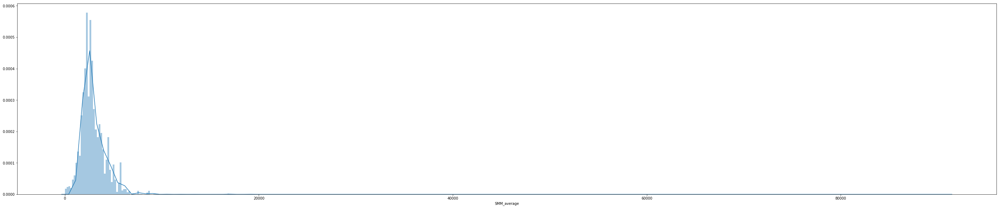

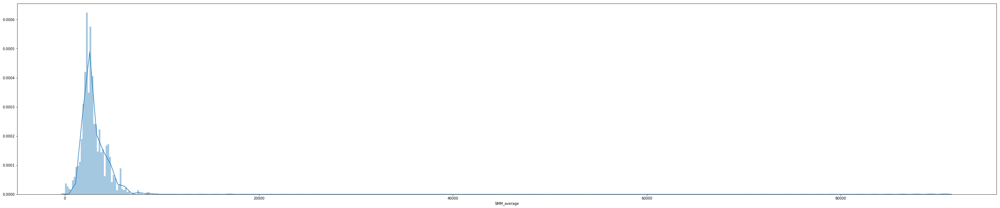

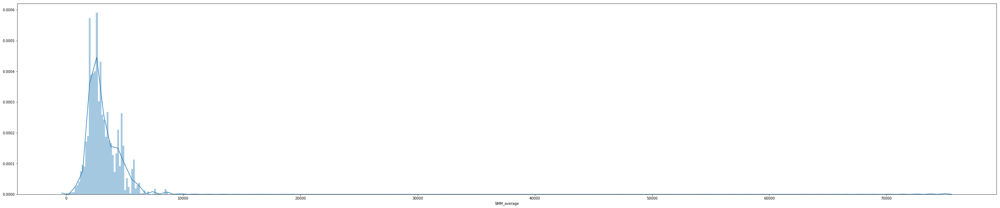

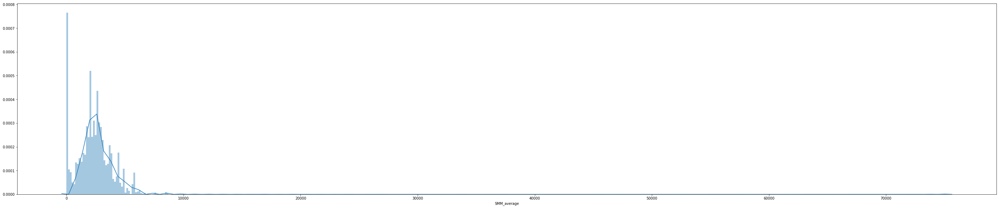

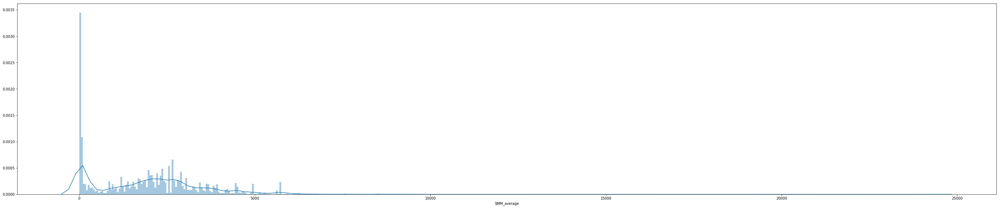

In [451]:
for i in range(5):
    temp = inv_groups[i]
    temp = temp[temp['SMM_average'].notnull()]['SMM_average']
    fig, ax = plt.subplots(figsize=(50,10))
    sns.distplot(temp,bins=500,ax=ax)
    plt.show()

In [483]:
inv_groups[3][inv_groups[3]['SMM_average']==0][['plant_state', 'Make', 'Model', 'SMM_average']].head(10)

,plant_state,Make,Model,SMM_average
295396,Uttar Pradesh,BMW,X5,0.0
295668,Punjab,LAND ROVER,ROVER,0.0
295905,Karnataka,SONALIKA,RHINO RX,0.0
296733,Punjab,HYUNDAI,SANTA FE,0.0
297021,Chhattisgarh,MARUTI SUZUKI,ESTEEM 1000,0.0
297435,Andhra Pradesh,SKODA,YETI,0.0
297592,Karnataka,HINDUSTAN MOTORS,AMBASSADOR,0.0
297761,Himachal Pradesh,TATA MOTORS,ZEST,0.0
297914,Rajasthan,SKODA,FABIA,0.0
297924,Rajasthan,HYUNDAI,GETZ,0.0


In [464]:
zero_rowcount= 0
for i in range(5):
    temp = inv_groups[i]
    temp = temp[temp['SMM_average']==0]
    print(temp.shape[0])
    zero_rowcount = zero_rowcount+temp.shape[0]
zero_rowcount #replace with 1? or mk-md avg?


21
32
5
3185
10037


13280

In [463]:
zero_rowcount= 0
for i in range(5):
    temp = inv_groups[i]
    temp = temp[temp['SMM_average'].isnull()]
    print(temp.shape[0])
    zero_rowcount = zero_rowcount+temp.shape[0]
zero_rowcount #checks out

159
579
715
59
13


1525

In [473]:
inv_smm_avg = inv_groups[0]

In [474]:
inv_smm_avg = inv_smm_avg.append(inv_groups[1])

In [475]:
inv_smm_avg = inv_smm_avg.append(inv_groups[2])

In [476]:
inv_smm_avg = inv_smm_avg.append(inv_groups[3])

In [477]:
inv_smm_avg = inv_smm_avg.append(inv_groups[4])

In [480]:
inv_smm_avg['Customer No.'].nunique()==invoice['Customer No.'].nunique()

True

In [540]:
# inv_smm_avg=None

In [482]:
# inv_smm_avg[['Customer No.','plant_state','Model', 'Make','SMM_average']].to_csv('data/invoice_smm_average.csv')

In [528]:
# invoice[invoice['KMs Reading']>300000][['Customer No.','plant_state','Model', 'Make', 'KMs Reading']]

In [563]:
# apply_smm concurrently
t1 = time.perf_counter()

with concurrent.futures.ThreadPoolExecutor() as executor:
    executor.map(map_kms_lifetime, inv_groups)

t2 = time.perf_counter()
kmstime = t2-t1

Started for :RangeIndex(start=0, stop=98462, step=1)
Started for :RangeIndex(start=98462, stop=196925, step=1)


Started for :RangeIndex(start=196925, stop=295388, step=1)
Started for :RangeIndex(start=295388, stop=393851, step=1)

Started for :RangeIndex(start=393851, stop=492314, step=1)


Ended for :RangeIndex(start=98462, stop=196925, step=1)
Ended for :RangeIndex(start=393851, stop=492314, step=1)
Ended for :RangeIndex(start=295388, stop=393851, step=1)


Ended for :RangeIndex(start=196925, stop=295388, step=1)
Ended for :RangeIndex(start=0, stop=98462, step=1)





/Users/Aniket/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [564]:
print(f'Execution Time:{kmstime}')

Execution Time:5.369100474999868


In [572]:
for i in range(5):
    temp=inv_groups[i]
    print(temp[temp['kms_lifetime_3L']==0][['KMs Reading','kms_lifetime_3L']])

       KMs Reading  kms_lifetime_3L
13128       299854              0.0
33824       300000              0.0
55484       299872              0.0
        KMs Reading  kms_lifetime_3L
121392       300000              0.0
122857       299933              0.0
        KMs Reading  kms_lifetime_3L
224130       299933              0.0
224131       299933              0.0
        KMs Reading  kms_lifetime_3L
306297       299989              0.0
328074       300000              0.0
342401       299972              0.0
350638       299874              0.0
382688       299924              0.0
        KMs Reading  kms_lifetime_3L
413009       300000              0.0
458386       299997              0.0
472517       299919              0.0


In [574]:
inv_kms_lifetime = inv_groups[0]

In [575]:
inv_kms_lifetime = inv_kms_lifetime.append(inv_groups[1])
inv_kms_lifetime = inv_kms_lifetime.append(inv_groups[2])
inv_kms_lifetime = inv_kms_lifetime.append(inv_groups[3])
inv_kms_lifetime = inv_kms_lifetime.append(inv_groups[4])

In [576]:
inv_kms_lifetime['Customer No.'].nunique()==invoice['Customer No.'].nunique()

True

In [577]:
inv_kms_lifetime.shape[0]==invoice.shape[0]

True

In [582]:
# inv_kms_lifetime[['Customer No.','KMs Reading','Make', 
# 'Model', 'KMs_3L_cap','kms_lifetime_3L']].to_csv('data/inv_kms_lifetime.csv')

In [666]:
map_snmm_average(invoice.iloc[1:3,:])

nan

In [692]:
temp = invoice.iloc[200000:200001,:][['state_news','Model','Make','Total Value']]
temp

,state_news,Model,Make,Total Value
200000,West,I20,HYUNDAI,2998.75


In [695]:


# ct = 'PUNE'
# st = 'South'
# mk = 'MAHINDRA & MAHINDRA'
# md = 'VERITO'
st = temp.iloc[0,0]
mk = temp.iloc[0,2]
md = temp.iloc[0,1]
tv=-1
try:
    tv = snmm_group[(snmm_group['state_news']== st)\
                               &(snmm_group['Make']== mk)&(snmm_group['Model']== md)]['Total Value'].iloc[0]
except:
    tv=np.NaN
tv

2363.1168941382375

In [696]:
snmm_group[snmm_group['Model']==md]

,state_news,Model,Make,Total Value
59,East,I20,HYUNDAI,110.118534
227,North,I20,HYUNDAI,2747.225931
444,South,I20,HYUNDAI,2085.116807
675,West,I20,HYUNDAI,2363.116894


In [705]:
# apply snmm
t1 = time.perf_counter()


with concurrent.futures.ThreadPoolExecutor() as executor:
    x = executor.map(apply_snmm, inv_groups)
t2 = time.perf_counter()
freqtime = t2-t1

Started for :RangeIndex(start=0, stop=98462, step=1)
Started for :RangeIndex(start=98462, stop=196925, step=1)
Started for :RangeIndex(start=196925, stop=295388, step=1)


Started for :RangeIndex(start=295388, stop=393851, step=1)
Started for :RangeIndex(start=393851, stop=492314, step=1)





/Users/Aniket/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


Ended for :RangeIndex(start=196925, stop=295388, step=1)

Ended for :RangeIndex(start=295388, stop=393851, step=1)

Ended for :RangeIndex(start=0, stop=98462, step=1)

Ended for :RangeIndex(start=98462, stop=196925, step=1)
Ended for :RangeIndex(start=393851, stop=492314, step=1)




In [708]:
freqtime/60

32.449105860016665

In [710]:
for i in range(5):
    temp=inv_groups[i]
    print(temp[temp['SnMM_average']==0][['state_news','Model','Make','SnMM_average']].shape)

(11, 4)
(7, 4)
(2, 4)
(515, 4)
(2370, 4)


In [711]:
inv_snmm_avg = inv_groups[0]

In [712]:
inv_snmm_avg = inv_snmm_avg.append(inv_groups[1])
inv_snmm_avg = inv_snmm_avg.append(inv_groups[2])
inv_snmm_avg = inv_snmm_avg.append(inv_groups[3])
inv_snmm_avg = inv_snmm_avg.append(inv_groups[4])

In [713]:
inv_snmm_avg['Customer No.'].nunique()==invoice['Customer No.'].nunique()

True

In [714]:
inv_snmm_avg.shape[0]==invoice.shape[0]

True

In [718]:
# inv_snmm_avg[['Customer No.','plant_state',
#               'state_news','Model','Make','SnMM_average']].to_csv('data/inv_snmm_avg.csv')

In [723]:
# inv_snmm_avg=None